In [1]:
import sys
print(sys.version)

3.6.5 |Anaconda custom (64-bit)| (default, Mar 29 2018, 13:14:23) 
[GCC 4.2.1 Compatible Clang 4.0.1 (tags/RELEASE_401/final)]


In [2]:
"""
Created on January 20 2018
@author: Neven Caplar
@contact: ncaplar@princeton.edu

These comments are theoretically the only ones you need to read to run the notebook

1. Specify the directory in which you want to run the analysis below (PSF_DIRECTORY)
2. Name and place the data in DATA_FOLDER. The data is avaliable at https://github.com/nevencaplar/PFS_Work_In_Progress/tree/master/CutsForTigerMay2
3. TESTING_FOLDER will be filled during the run with images from the analysis analysis

4. (OPTIONAL)Next cell contains some extensions that I use that make life much easier when using jupyter notebook 
    Without them this notebook becomes reallllly huge and hard to deal with
    These can be downloaded from https://github.com/ipython-contrib/jupyter_contrib_nbextensions

"""
############################################################
# name your directory where you want to have files!
PSF_DIRECTORY='/Users/nevencaplar/Documents/PFS/'
# place cutouts in this folder - name as you wish
DATA_FOLDER=PSF_DIRECTORY+'TigerAnalysis/CutsForTigerMay2/'
############################################################
    

TESTING_FOLDER=PSF_DIRECTORY+'Testing/'
TESTING_PUPIL_IMAGES_FOLDER=TESTING_FOLDER+'Pupil_Images/'
TESTING_WAVEFRONT_IMAGES_FOLDER=TESTING_FOLDER+'Wavefront_Images/'
TESTING_FINAL_IMAGES_FOLDER=TESTING_FOLDER+'Final_Images/'
import os

for i in [PSF_DIRECTORY,DATA_FOLDER,TESTING_PUPIL_IMAGES_FOLDER,TESTING_WAVEFRONT_IMAGES_FOLDER,TESTING_FINAL_IMAGES_FOLDER]:
    if not os.path.exists(i):
        os.makedirs(i)  

In [3]:
%%javascript
try {
  require(['base/js/utils'], function (utils) {
    utils.load_extension('code_prettify/code_prettify');
    utils.load_extension('collapsible_headings/main'); 
    utils.load_extension('codefolding/edit'); 
    utils.load_extension('codefolding/main'); 
    utils.load_extension('execute_time/ExecuteTime');   
    utils.load_extension('toc2/main'); 
  });
}
catch (err) {
  console.log('toc2 load error:', err);
}

<IPython.core.display.Javascript object>

In [4]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [5]:
%load_ext autoreload
%autoreload 2

#import Zernike_Module
#from Zernike_Module import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

#Zernike_Module_lastOct15_beforeScatterChange
import Zernike_Module
from Zernike_Module import *

In [6]:
#general import statments
from __future__ import absolute_import, division, print_function
import galsim
import numpy as np
np.set_printoptions(suppress=True)
np.seterr(divide='ignore', invalid='ignore')
import pandas as pd
import io
import math
import pickle

#tqdm is not necesarry, it is the monitor evaluation of the 'for' loops
from tqdm import tqdm

# lsst stack
#import lsst.afw
#from lsst.afw.cameraGeom import PupilFactory
#from lsst.afw.geom import Angle, degrees
#from lsst.afw import geom
#from lsst.afw.geom import Point2D

# astropy
import astropy
import astropy.convolution
from astropy.convolution import Gaussian2DKernel

# scipy and skimage
#from scipy.ndimage import gaussian_filter
import scipy.misc
import skimage.transform

#lmfit
import lmfit

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
matplotlib.rcParams.update({'font.size': 18})
%config InlineBackend.rc = {}
%matplotlib inline
%config IPython.matplotlib.backend = "retina"

from shutil import copy
from scipy.optimize import curve_fit

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c

### unit test - z11

In [7]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

sci_image_unit=np.ones((50,50))
var_image_unit=np.ones((50,50))
#array([     0.85110826,      0.73047372,     -0.31672873,     -0.00539844, -0.32264156,     -0.04922217,     -0.49565709,      0.18057418,
#            0.79993531,      0.10032969,      0.08769052,      0.25372595,          0.06064503,      0.21049747,   
#           0.45840763,      2.05047984,  0.30893478,     -0.13166649, 
#           -0.06752367,     -0.13093007,            0.89197452, 
#           0.10757197,   0.60969064,      1.06409559,   0.14192374, 
#           109336.61223169,   2.41053199,      0.00379578,
#            0.4673993 ,      1.88555321,      0.99733826])
allparameters_proposal=np.array([24,0.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.7,0.1,0.3,0.0,0.07,0.0,
                                 0.17,0.67,1,1,
                                 0.0,-0.0,0.80,
                                 0.1,0.61,1.06,0.28,
                                 50000,2.5,0.027,
                                 0.37,1.85,1.0])
print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1)   

res=model(allparameters_proposal,return_Image=True)
print(res[0])
#assert res=-4808.04
#print('ok')

version of the code is: 0.21b
None
zmax: 11
-3032.012417639188


In [713]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 
optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')



res_iapetus=res[1]

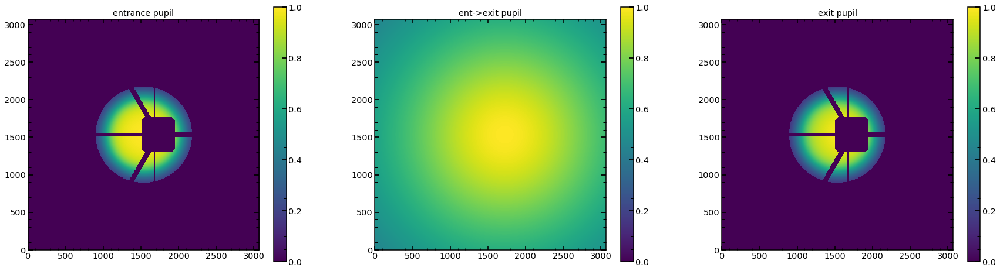

In [714]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

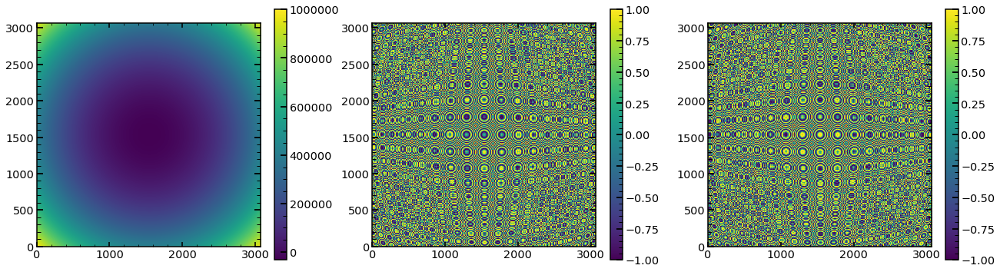

In [715]:
matplotlib.rcParams.update({'font.size': 12})

plt.figure(figsize=(30,6))
plt.subplot(141)
plt.imshow(wf_full)
plt.colorbar()

plt.subplot(142)
plt.imshow(np.real(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

plt.subplot(143)
plt.imshow(np.imag(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()


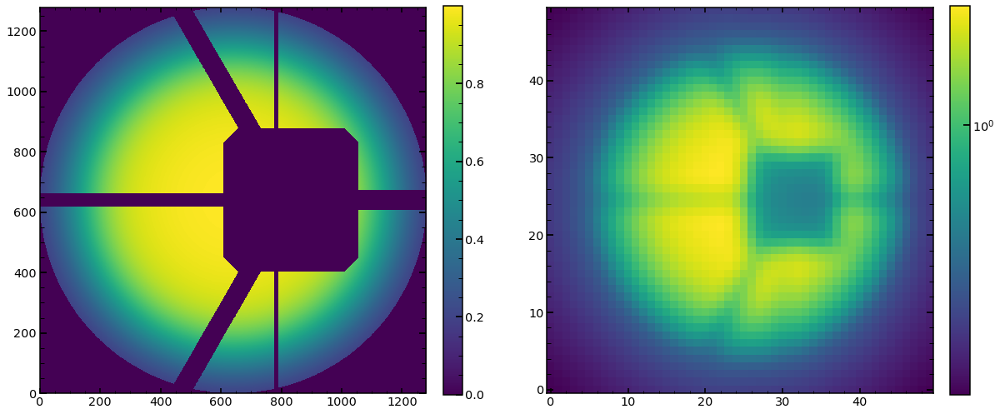

In [716]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(122)
plt.imshow(res_iapetus,norm=LogNorm(),origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([1,10**-2,10**-3,10**-4,10**-5,10,10**2,10**3,10**4,10**5])

# Feb15

## Codes

In [136]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

columns11=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

columns11_analysis=columns+['chi2','chi2max']

columns22=['z4','z5','z6','z7','z8','z9','z10','z11',
           'z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

columns22_analysis=columns22+['chi2','chi2max']

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c

In [137]:
def create_minchain_err(chain0,likechain0,sci_image,var_image,old=0):
    minchain_err_test=[]
    for var_number in range(len(columns)):
        #ravel likelihood
        likechain0_Emcee3_ravel=np.ravel(likechain0)

        # connect chain and lnchain
        chain0_Emcee3_ravel=np.ravel(chain0[:,:,var_number])
        chain0_Emcee3_ravel_argsort=np.argsort(chain0_Emcee3_ravel)  
        chain0_Emcee3_ravel_sort=chain0_Emcee3_ravel[chain0_Emcee3_ravel_argsort]
        likechain0_Emcee3_ravel_sort=likechain0_Emcee3_ravel[chain0_Emcee3_ravel_argsort]

        # move to chi2 space
        chi2_Emcee3_ravel_sort=-(np.array(likechain0_Emcee3_ravel_sort)*(2)-np.log(2*np.pi*np.sum(var_image)))/(sci_image.shape[0])**2
        min_chi2_Emcee3_ravel_sort=np.min(chi2_Emcee3_ravel_sort)

        # simplest standard deviation
        std_chain=np.std(chain0_Emcee3_ravel_sort)

        #best solution
        mean_chain=chain0_Emcee3_ravel_sort[chi2_Emcee3_ravel_sort==np.min(chi2_Emcee3_ravel_sort)][0]

        # step size
        step=std_chain/10

        # create result 3*std in each direction
        try:
            res=[]
            if step==0:
                step=10e-17
            for i in np.arange(mean_chain-30*step,mean_chain+30*step,step):
                selected_chi2_Emcee3_ravel_sort=chi2_Emcee3_ravel_sort[(np.array(chain0_Emcee3_ravel_sort<i+step)&np.array(chain0_Emcee3_ravel_sort>i))]
                if len(selected_chi2_Emcee3_ravel_sort>10):   
                    res.append([i+step/2,np.min(chi2_Emcee3_ravel_sort[(np.array(chain0_Emcee3_ravel_sort<i+step)&np.array(chain0_Emcee3_ravel_sort>i))])])

            res=np.array(res)

            #print(columns[var_number]+' min : '+str(mean_chain))
            #print(columns[var_number]+' std : '+str(std_chain))

            # find low limit and high limit
            res_within2_chi=res[res[:,1]<min_chi2_Emcee3_ravel_sort*2]
            minchain_err_element=[-np.abs(mean_chain-res_within2_chi[0,0]),np.abs(res_within2_chi[-1,0]-mean_chain)]
        except IndexError:
            if var_number!=25:
                print(columns[var_number]+': failed!')
                minchain_err_element=[-mean_chain,mean_chain]

        minchain_err_test.append(minchain_err_element)
        #print(columns[var_number]+' min_err : '+str(minchain_err_element[0]))
        #print(columns[var_number]+' max_err : '+str(minchain_err_element[1]))
    if old==1:
        minchain_err_test=np.mean(np.abs(np.array(minchain_err_test)),axis=1)
        #print(minchain_err_test)
        return minchain_err_test
    else:       
        return np.array(minchain_err_test)
    
    
import scipy.optimize as optimize
def curve_fit_custom_lin(V,index_arr,z4_arr,z4_arr_err_low,z4_arr_err_up):
    a,b=V
    yfit=lin_fit_1D(index_arr,a,b)
    weight=np.ones_like(yfit)
    weight[yfit>z4_arr]=z4_arr_err_up[yfit>z4_arr] # if the fit point is above the measure, use upper weight
    weight[yfit<=z4_arr]=z4_arr_err_low[yfit<=z4_arr] # else use lower weight
    return (yfit-z4_arr)**2/weight**2

def curve_fit_custom_con(V,index_arr,z4_arr,z4_arr_err_low,z4_arr_err_up):
    a=V
    yfit=lin_fit_1DConstant(index_arr,a)
    weight=np.ones_like(yfit)
    weight[yfit>z4_arr]=z4_arr_err_up[yfit>z4_arr] # if the fit point is above the measure, use upper weight
    weight[yfit<=z4_arr]=z4_arr_err_low[yfit<=z4_arr] # else use lower weight
    return (yfit-z4_arr)**2/weight**2 

In [138]:
def create_results_of_fit_single(date,single_number,arc=None,zMax=None):
    """create solution from a single image, create error and lower and upper erros

    @param[in] date             date when the analysis was conducted
    @param[in] single_number    number of the image
    @param[in] arc              which arc was analyzed
    @returns       results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper to be fed to solution_at_0_and_plots
    """
    print(zMax)
    if arc is None:
        arc='HgAr'
        
    if arc=='HgAr':
        obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
    elif arc=='Ne':
        obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
        
    if zMax==22:
        columns_analysis=columns22_analysis
    else:
        columns_analysis=columns11_analysis
    
    results_of_fit_single=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single_lower=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)
    err_results_of_fit_single_upper=pd.DataFrame(np.zeros((18,len(columns_analysis))).reshape(-1,len(columns_analysis)),index=['-4.0','-3.5','-3.0','-2.5','-2','-1.5','-1','-0.5','0','0','0.5','1','1.5','2','2.5','3.0','3.5','4'],columns=columns_analysis)

    # arrange all results in one pandas 
    #date='Sep19'
    #date='Sep27'
    RESULT_FOLDER='/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+str(date)+'/'

    single_defocus_list=obs_possibilites

    #single_number=55
    image_index=single_number
    method='P'
    eps=5

    res_likelihood=[]

    for single_defocus in range(0,len(single_defocus_list)):
        try:
            obs=single_defocus_list[single_defocus]
            try:
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee3.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee3.npy')
                print(str(single_number)+' obs (Emcee3): '+str(obs)+' is found!')
            except:    
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee2.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee2.npy')
                print(str(single_number)+'obs (Emcee2): '+str(obs)+' is found!')

            if obs==8600:
                sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked_Dithered.npy')
                var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked_Dithered.npy')
            else:       
                sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
                var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
                #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
                #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

 
            likechain0=likechain

            chain0=chain
            minchain=chain0[np.abs(likechain0)==np.min(np.abs(likechain0))][0]
            chi2reduced=2*np.min(np.abs(likechain0))/(sci_image.shape[0])**2
            #print(" test0")

            """
            minchain_err=[]
            for i in range(len(columns)):
                #minchain_err=np.append(minchain_err,np.std(chain0[:,:,i].flatten()))
                minchain_err=np.append(minchain_err,np.sqrt(chi2reduced)*np.std(chain0[:,:,i].flatten()))

            minchain_err=np.array(minchain_err)
            """
            minchain_err_old=create_minchain_err(chain0,likechain0,sci_image,var_image,old=1)
            #print(minchain_err_old)
            #print(" test1")
            minchain_err=create_minchain_err(chain0,likechain0,sci_image,var_image)
            #print(" test2")
            results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain,np.array([chi2reduced,np.mean(sci_image**2/var_image)])),axis=0)
            #print(" test3")
            #print(results_of_fit_single.iloc[single_defocus])
            err_results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain_err_old,np.array([1,1])),axis=0)
            #print(" test4")
            err_results_of_fit_single_lower.iloc[single_defocus]=np.concatenate((minchain_err[:,0],np.array([1,1])),axis=0)
            #print(" test5")
            err_results_of_fit_single_upper.iloc[single_defocus]=np.concatenate((minchain_err[:,1],np.array([1,1])),axis=0)
            #print(" test6")
        
        except:
            ValueError
            print(str(single_number)+' '+str(obs)+' '+str(arc)+' is NOT found or failed!')
    #results_of_fit_single=results_of_fit_single[np.abs(results_of_fit_single['z4'])>0]
    #err_results_of_fit_single=err_results_of_fit_single[np.abs(err_results_of_fit_single['z4'])>0]
    #err_results_of_fit_single_lower=err_results_of_fit_single_lower[np.abs(err_results_of_fit_single_lower['z4'])>0]
    #err_results_of_fit_single_upper=err_results_of_fit_single_upper[np.abs(err_results_of_fit_single_upper['z4'])>0]              
    
    return results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper


def create_results_of_fit_single_focus(date,single_number,arc=None,zMax=None):
    """create solution from a single image, create error and lower and upper erros

    @param[in] date             date when the analysis was conducted
    @param[in] single_number    number of the image
    @param[in] arc              which arc was analyzed
    @returns       results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper to be fed to solution_at_0_and_plots
    """
    print(zMax)
    if arc is None:
        arc='HgAr'
        
    if arc=='HgAr':
        obs_possibilites=np.array([8576,8579,8582,8585,8588,8591,8594,8597])
    elif arc=='Ne':
        obs_possibilites=np.array([8576,8579,8582,8585,8588,8591,8594,8597])+90
        
    if zMax==22:
        columns_analysis=columns22_analysis
        
    labels=['8576','8579','8582','8585','8588','8591','8594','8597']
    results_of_fit_single=pd.DataFrame(np.zeros((len(labels),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=labels,columns=columns_analysis)
    err_results_of_fit_single=pd.DataFrame(np.zeros((len(labels),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=labels,columns=columns_analysis)
    err_results_of_fit_single_lower=pd.DataFrame(np.zeros((len(labels),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=labels,columns=columns_analysis)
    err_results_of_fit_single_upper=pd.DataFrame(np.zeros((len(labels),len(columns_analysis))).reshape(-1,len(columns_analysis)),index=labels,columns=columns_analysis)

    # arrange all results in one pandas 
    #date='Sep19'
    #date='Sep27'
    RESULT_FOLDER='/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/'+str(date)+'/'

    single_defocus_list=obs_possibilites

    #single_number=55
    image_index=single_number
    method='P'
    eps=5

    res_likelihood=[]

    for single_defocus in range(0,len(single_defocus_list)):
        try:
            obs=single_defocus_list[single_defocus]
            try:
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee3.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee3.npy')
                print(str(single_number)+' obs (Emcee3): '+str(obs)+' is found!')
            except:    
                chain=np.load(RESULT_FOLDER+'chain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee2.npy')
                likechain=np.load(RESULT_FOLDER+'likechain'+str(date)+'_Single_'+str(method)+'_'+str(obs)+str(single_number)+str(eps)+str(arc)+'Emcee2.npy')
                print(str(single_number)+'obs (Emcee2): '+str(obs)+' is found!')

            if obs==8600:
                sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked_Dithered.npy')
                var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked_Dithered.npy')
            else:       
                sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
                var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
                #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
                #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

 
            likechain0=likechain

            chain0=chain
            minchain=chain0[np.abs(likechain0)==np.min(np.abs(likechain0))][0]
            chi2reduced=2*np.min(np.abs(likechain0))/(sci_image.shape[0])**2
            #print(" test0")

            """
            minchain_err=[]
            for i in range(len(columns)):
                #minchain_err=np.append(minchain_err,np.std(chain0[:,:,i].flatten()))
                minchain_err=np.append(minchain_err,np.sqrt(chi2reduced)*np.std(chain0[:,:,i].flatten()))

            minchain_err=np.array(minchain_err)
            """
            minchain_err_old=create_minchain_err(chain0,likechain0,sci_image,var_image,old=1)
            #print(minchain_err_old)
            #print(" test1")
            minchain_err=create_minchain_err(chain0,likechain0,sci_image,var_image)
            #print(" test2")
            results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain,np.array([chi2reduced,np.mean(sci_image**2/var_image)])),axis=0)
            #print(" test3")
            #print(results_of_fit_single.iloc[single_defocus])
            err_results_of_fit_single.iloc[single_defocus]=np.concatenate((minchain_err_old,np.array([1,1])),axis=0)
            #print(" test4")
            err_results_of_fit_single_lower.iloc[single_defocus]=np.concatenate((minchain_err[:,0],np.array([1,1])),axis=0)
            #print(" test5")
            err_results_of_fit_single_upper.iloc[single_defocus]=np.concatenate((minchain_err[:,1],np.array([1,1])),axis=0)
            #print(" test6")
        
        except:
            ValueError
            print(str(single_number)+' '+str(obs)+' '+str(arc)+' is NOT found or failed!')
    #results_of_fit_single=results_of_fit_single[np.abs(results_of_fit_single['z4'])>0]
    #err_results_of_fit_single=err_results_of_fit_single[np.abs(err_results_of_fit_single['z4'])>0]
    #err_results_of_fit_single_lower=err_results_of_fit_single_lower[np.abs(err_results_of_fit_single_lower['z4'])>0]
    #err_results_of_fit_single_upper=err_results_of_fit_single_upper[np.abs(err_results_of_fit_single_upper['z4'])>0]              
    
    return results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper

In [139]:
def solution_at_0_and_plots(date,single_number,arc,results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper,plot=True,zMax=None):
    """create solution at the focus and plot dependence with defocu

    @param[in] date             date when the analysis was conducted
    @param[in] single_number    number of the image
    @param[in] arc              which arc was analyzed
  
    """    
    
    if zMax==22:
        columns_analysis=columns22_analysis
        columns=columns22
        z_addition_factor=11
    else:
        columns_analysis=columns11_analysis
        columns=columns11
        z_addition_factor=0
    
    results_of_fit_single=results_of_fit_single[np.abs(results_of_fit_single['z4'])>0]
    err_results_of_fit_single=err_results_of_fit_single[np.abs(err_results_of_fit_single['z4'])>0]
    err_results_of_fit_single_lower=err_results_of_fit_single_lower[np.abs(err_results_of_fit_single_lower['z4'])>0]
    err_results_of_fit_single_upper=err_results_of_fit_single_upper[np.abs(err_results_of_fit_single_upper['z4'])>0]    
    
    if len(results_of_fit_single)<=6:
        if zMax==22:
            solution_at_0=np.full(31+11,0)

        else:
            solution_at_0=np.full(31,0)       

        return solution_at_0
    else:
        IMAGES_FOLDER='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/'

        solution_at_0=[]

        for q in columns_analysis:

            z4_arr=np.array(results_of_fit_single[q])
            z4_arr_err=np.array(err_results_of_fit_single[q])
            z4_arr_err_up=np.array(err_results_of_fit_single_upper[q])
            z4_arr_err_low=np.array(err_results_of_fit_single_lower[q])
            index_arr=results_of_fit_single[q].index.values.astype(float)
            #print(q)
            #print(index_arr)
            #print(z4_arr)
            #print(z4_arr_err)
            #print(z4_arr_err_up)
            #print(z4_arr_err_low)
            
            z4_arr_no0=z4_arr[np.abs(index_arr)>0.5]
            z4_arr_no0_err=z4_arr_err[np.abs(index_arr)>0.5]
            z4_arr_no0_err_up=z4_arr_err_up[np.abs(index_arr)>0.5]
            z4_arr_no0_err_low=z4_arr_err_low[np.abs(index_arr)>0.5]
            index_arr_no0=index_arr[np.abs(index_arr)>0.5]
            #print(q)
            #print(index_arr_no0)
            #print(z4_arr_no0)
            #print(z4_arr_no0_err)
            #print(z4_arr_no0_err_up)
            #print(z4_arr_no0_err_low)
            
            
            z4_arr_only0=z4_arr[np.abs(index_arr)<=0.5]
            z4_arr_only0_err=z4_arr_err[np.abs(index_arr)<=0.5]
            z4_arr_only0_err_up=z4_arr_err_up[np.abs(index_arr)<=0.5] 
            z4_arr_only0_err_low=z4_arr_err_low[np.abs(index_arr)<=0.5]
            index_arr_only0=index_arr[np.abs(index_arr)<=0.5]

            fit_res=[]
            interim_zero_solutions=[]

            
            if q in columns[:8+z_addition_factor]:
                # these variables are fit via linear fit, without values at focus
                # it is z4-z11
                # for loop below removes 2 points from the fit that create largest deviations from median result in focus
                for l in range(len(index_arr_no0)):
                    #print('good_index'+str(np.delete(index_arr_no0,l)))
                    #print('index_arr_no0'+str(np.delete(z4_arr_no0,l)))
                    #print('z4_arr_no0_err_low'+str(np.delete(z4_arr_no0_err_low,l)))
                    #print('z4_arr_no0_err_up'+str(np.delete(z4_arr_no0_err_up,l)))
                    popt=optimize.leastsq(curve_fit_custom_lin,x0=[1,1],args=(np.delete(index_arr_no0,l),np.delete(z4_arr_no0,l), np.delete(z4_arr_no0_err_low,l),np.delete(z4_arr_no0_err_up,l)))[0]
                    interim_zero_solutions.append([l,lin_fit_1D(0,popt[0],popt[1])])
                interim_zero_solutions_arr=np.array(interim_zero_solutions)
                interim_zero_solutions_arr_dif=np.abs(interim_zero_solutions_arr[:,1]-np.median(interim_zero_solutions_arr[:,1]))
                second_max_dif=np.sort(interim_zero_solutions_arr_dif)[-2]
                interim_zero_solutions_arr=interim_zero_solutions_arr[interim_zero_solutions_arr_dif<second_max_dif]
                #print(interim_zero_solutions_arr[:,0])
                good_index=interim_zero_solutions_arr[:,0].astype(int)
                #print('good_index'+str(good_index))
                #print('index_arr_no0'+str(index_arr_no0))
                #print('z4_arr_no0_err_low'+str(z4_arr_no0_err_low))
                #print('z4_arr_no0_err_up'+str(z4_arr_no0_err_up))
                popt=optimize.leastsq(curve_fit_custom_lin,x0=[1,1],args=(np.array(index_arr_no0)[good_index],np.array(z4_arr_no0)[good_index],np.array(z4_arr_no0_err_low)[good_index],np.array(z4_arr_no0_err_up)[good_index]))[0]
                #print(popt)
                for i in np.linspace(-4.5,4.5,19):
                    fit_res.append(lin_fit_1D(i,popt[0],popt[1]))
                solution_at_0.append(fit_res[9])

            interim_zero_solutions=[]
            if q in columns[8+z_addition_factor:25+z_addition_factor]:
                # these variables are set at mean value (constant fit), without values at focus
                # these are variables that describe the pupil
                for l in range(len(index_arr_no0)):
                    popt=optimize.leastsq(curve_fit_custom_con,x0=[1],args=(np.delete(index_arr_no0,l),np.delete(z4_arr_no0,l), np.delete(z4_arr_no0_err_low,l),np.delete(z4_arr_no0_err_up,l)))[0]
                    interim_zero_solutions.append([l,popt[0]])
                interim_zero_solutions_arr=np.array(interim_zero_solutions)
                interim_zero_solutions_arr_dif=np.abs(interim_zero_solutions_arr[:,1]-np.median(interim_zero_solutions_arr[:,1]))
                third_max_dif=np.sort(interim_zero_solutions_arr_dif)[-3]
                interim_zero_solutions_arr=interim_zero_solutions_arr[interim_zero_solutions_arr_dif<=(third_max_dif*1.1)]
                #print(interim_zero_solutions_arr[:,0])
                good_index=interim_zero_solutions_arr[:,0].astype(int)
                popt=optimize.leastsq(curve_fit_custom_con,x0=[1],args=(np.array(index_arr_no0)[good_index],np.array(z4_arr_no0)[good_index],np.array(z4_arr_no0_err_low)[good_index],np.array(z4_arr_no0_err_up)[good_index]))[0]
                fit_res=lin_fit_1DConstant(np.linspace(-4.5,4.5,19),popt[0])
                solution_at_0.append(fit_res[9])

            if q in np.concatenate((np.array(columns[25+z_addition_factor:]),np.array(['chi2','chi2max'])),axis=0):
                # these variables are set at value as measured at 0 - (perhaps is should be close to 0)
                if z4_arr_only0.size==1:
                    for i in np.linspace(-4.5,4.5,19):
                        fit_res.append(z4_arr_only0) 
                    solution_at_0.append(fit_res[9])
                else:
                    # these variables are set at mean value (constant fit), without values at focus
                    popt=optimize.leastsq(curve_fit_custom_con,x0=[1],args=(index_arr_only0, z4_arr_only0, z4_arr_only0_err_low,z4_arr_only0_err_up))[0]
                    fit_res=lin_fit_1DConstant(np.linspace(-4.5,4.5,19),popt[0])
                    solution_at_0.append(fit_res[9])


            #making plots here
            ######
            #print(q)
            #print(fit_res)
            plt.figure(figsize=(20,10))
            plt.errorbar(index_arr,z4_arr,yerr=[np.abs(z4_arr_err_low),z4_arr_err_up],color='blue',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='single fit results')
            plt.plot(np.linspace(-4.5,4.5,19),fit_res,color='orange',label='fit')
            if q in columns[:8]:
                plt.plot(np.linspace(-4.5,4.5,19),np.zeros((19,1)),':',color='black')
            plt.plot([0], [fit_res[9]], marker='o', markersize=10, color="red",label='prediction for focus')
            #print('prediction for focus: '+str(q)+' '+str(fit_res[9]))
            plt.title(q,size=40)
            plt.legend(fontsize=25)
            plt.xlabel('defocus lab [mm]',size=30)
            plt.ylabel('defocus model',size=30)
            #print(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/')
            if not os.path.exists(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/'):
                os.makedirs(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/')
            plt.savefig(IMAGES_FOLDER+'Defocus/'+str(single_number)+'/'+str(arc)+str(q))

            if not os.path.exists(IMAGES_FOLDER+'Defocus/'+str(q)+'/'):
                os.makedirs(IMAGES_FOLDER+'Defocus/'+str(q)+'/')
            plt.savefig(IMAGES_FOLDER+'Defocus/'+str(q)+'/'+str(arc)+str(single_number))

            plt.close()   
            ######

        solution_at_0=np.array(solution_at_0)[:len(solution_at_0)-2]
        return solution_at_0

## Scripts

### First script

In [498]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalHgAr_Feb2019.pkl', 'rb') as f:
    finalHgAr_Feb2019=pickle.load(f)

In [ ]:
list_of_HgAr_to_analyze=finalHgAr_Feb2019.index[(finalHgAr_Feb2019['fiber'].values.astype(int)<=10)&(finalHgAr_Feb2019['fiber'].values.astype(int)>=6)
                                        &(finalHgAr_Feb2019['close'].values.astype(int)==1)&(finalHgAr_Feb2019['wavelength'].values.astype(float)<800)&(finalHgAr_Feb2019['wavelength'].values.astype(float)>600)]
print(len(list_of_HgAr_to_analyze))


### Second script

In [ ]:
#MPI
for single_spot in list_of_HgAr_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T01S'+str(single_spot)+'Feb.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for obs in [11790,11730,11748,11694,11754,11700,11760,11796,11736,11724,11784]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Feb_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/FebScriptToSubmitScriptsTiger01'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_HgAr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T01S'+str(single_spot)+'Feb.sh \n')

file.close()

In [ ]:
# extension to the first script
list_of_HgAr_to_analyze=finalHgAr_Feb2019.index[(finalHgAr_Feb2019['fiber'].values.astype(int)<=5)&(finalHgAr_Feb2019['fiber'].values.astype(int)>=0)
                                        &(finalHgAr_Feb2019['close'].values.astype(int)==1)&(finalHgAr_Feb2019['wavelength'].values.astype(float)<800)&(finalHgAr_Feb2019['wavelength'].values.astype(float)>600)]
print(len(list_of_HgAr_to_analyze))


In [ ]:
#MPI
for single_spot in list_of_HgAr_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T02S'+str(single_spot)+'Feb.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for obs in [11790,11730,11748,11694,11754,11700,11760,11796,11736,11724,11784]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Feb_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/FebScriptToSubmitScriptsTiger02'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_HgAr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T02S'+str(single_spot)+'Feb.sh \n')

file.close()

#### visual inspection of the images selected

In [ ]:
list_of_HgAr_to_analyze

In [ ]:
obs=11748
arc='HgAr'
list_of_sci_image=[]
list_of_mask_image=[]
for single_number in list_of_HgAr_to_analyze.values:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    list_of_sci_image.append(sci_image)
    mask_image =np.load(STAMPS_FOLDER+'mask'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    list_of_mask_image.append(mask_image)

In [ ]:
STAMPS_FOLDER

In [ ]:
list_of_HgAr_to_analyze[2]

In [ ]:
plt.figure(figsize=(15,10))

plt.subplot(351)
plt.imshow(list_of_sci_image[0])
plt.subplot(352)
plt.imshow(list_of_sci_image[1])
plt.subplot(353)
plt.imshow(list_of_sci_image[2])
plt.subplot(354)
plt.imshow(list_of_sci_image[3])
plt.subplot(355)
plt.imshow(list_of_sci_image[4])

plt.subplot(356)
plt.imshow(list_of_sci_image[5])
plt.subplot(357)
plt.imshow(list_of_sci_image[6])
plt.subplot(358)
plt.imshow(list_of_sci_image[7])
plt.subplot(359)
plt.imshow(list_of_sci_image[8])
plt.subplot(3,5,10)
plt.imshow(list_of_sci_image[9])

plt.subplot(3,5,11)
plt.imshow(list_of_sci_image[10])
plt.subplot(3,5,12)
plt.imshow(list_of_sci_image[11])
plt.subplot(3,5,13)
plt.imshow(list_of_sci_image[12])
plt.subplot(3,5,14)
plt.imshow(list_of_sci_image[13])
plt.subplot(3,5,15)
plt.imshow(list_of_sci_image[14])



In [ ]:
plt.imshow(list_of_sci_image[1],norm=LogNorm())
plt.imshow(list_of_mask_image[1],alpha=0.2)

### Third script

In [ ]:
list_of_HgAr_to_analyze_first=finalHgAr_Feb2019.index[(finalHgAr_Feb2019['fiber'].values.astype(int)<=10)&(finalHgAr_Feb2019['fiber'].values.astype(int)>=6)
                                        &(finalHgAr_Feb2019['close'].values.astype(int)==1)&(finalHgAr_Feb2019['wavelength'].values.astype(float)<800)&(finalHgAr_Feb2019['wavelength'].values.astype(float)>600)]
print(len(list_of_HgAr_to_analyze_first))


list_of_HgAr_to_analyze_second=finalHgAr_Feb2019.index[(finalHgAr_Feb2019['fiber'].values.astype(int)<=5)&(finalHgAr_Feb2019['fiber'].values.astype(int)>=0)
                                        &(finalHgAr_Feb2019['close'].values.astype(int)==1)&(finalHgAr_Feb2019['wavelength'].values.astype(float)<800)&(finalHgAr_Feb2019['wavelength'].values.astype(float)>600)]
print(len(list_of_HgAr_to_analyze_first_extended))

In [ ]:
# select all and then remove the ones that have been already analyzed

list_of_HgAr_to_analyze_all=finalHgAr_Feb2019.index[(finalHgAr_Feb2019['fiber'].values.astype(int)<=15)&(finalHgAr_Feb2019['fiber'].values.astype(int)>=0)
                                        &(finalHgAr_Feb2019['close'].values.astype(int)==1)&(finalHgAr_Feb2019['wavelength'].values.astype(float)<1000)&(finalHgAr_Feb2019['wavelength'].values.astype(float)>600)]
print(len(list_of_HgAr_to_analyze_all))


In [ ]:
list_of_HgAr_to_analyze_third=np.setdiff1d(np.setdiff1d(list_of_HgAr_to_analyze_all,list_of_HgAr_to_analyze_first),list_of_HgAr_to_analyze_second)

list_of_HgAr_to_not_analyze_2_3=finalHgAr_Feb2019.index[(finalHgAr_Feb2019['fiber'].values.astype(int)<=3)&(finalHgAr_Feb2019['fiber'].values.astype(int)>=2)
                                        &(finalHgAr_Feb2019['close'].values.astype(int)==1)&(finalHgAr_Feb2019['wavelength'].values.astype(float)<1000)&(finalHgAr_Feb2019['wavelength'].values.astype(float)>600)]

# remove the spots from fibers 2 and 3 as they are too close together
list_of_HgAr_to_analyze_third=np.setdiff1d(list_of_HgAr_to_analyze_third,list_of_HgAr_to_not_analyze_2_3)

print(len(list_of_HgAr_to_analyze_third))
assert len(list_of_HgAr_to_analyze_third)==(80-15-18-4)

In [ ]:
#MPI
for single_spot in list_of_HgAr_to_analyze_third:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T03S'+str(single_spot)+'Feb.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for obs in [11790,11730,11748,11694,11754,11700,11760,11796,11736,11724,11784]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Feb_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/FebScriptToSubmitScriptsTiger03'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_HgAr_to_analyze_third:
    file.write('sbatch /home/ncaplar/Scripts/T03S'+str(single_spot)+'Feb.sh \n')

file.close()

### Fourth script

In [129]:
# select all and then remove the fibers 2 and 3

list_of_HgAr_to_analyze_all=finalHgAr_Feb2019.index[(finalHgAr_Feb2019['fiber'].values.astype(int)<=15)&(finalHgAr_Feb2019['fiber'].values.astype(int)>=0)
                                        &(finalHgAr_Feb2019['close'].values.astype(int)==1)&(finalHgAr_Feb2019['wavelength'].values.astype(float)<1000)&(finalHgAr_Feb2019['wavelength'].values.astype(float)>600)]
print(len(list_of_HgAr_to_analyze_all))

list_of_HgAr_to_not_analyze_2_3=finalHgAr_Feb2019.index[(finalHgAr_Feb2019['fiber'].values.astype(int)<=3)&(finalHgAr_Feb2019['fiber'].values.astype(int)>=2)
                                        &(finalHgAr_Feb2019['close'].values.astype(int)==1)&(finalHgAr_Feb2019['wavelength'].values.astype(float)<1000)&(finalHgAr_Feb2019['wavelength'].values.astype(float)>600)]

# remove the spots from fibers 2 and 3 as they are too close together
list_of_HgAr_to_analyze_fourth=np.setdiff1d(list_of_HgAr_to_analyze_all,list_of_HgAr_to_not_analyze_2_3)

print(len(list_of_HgAr_to_analyze_fourth))

80
70


In [133]:
list_of_HgAr_to_analyze_fourth_10=np.split(list_of_HgAr_to_analyze_fourth,10)

In [137]:
#MPI
for i in range(len(list_of_HgAr_to_analyze_fourth_10)):
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T04'+str(i)+'Feb.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for single_spot in list_of_HgAr_to_analyze_fourth_10[i]:
        for obs in [11772,11712]:
            file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Feb_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/FebScriptToSubmitScriptsTiger04'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for i in range(len(list_of_HgAr_to_analyze_fourth_10)):
    file.write('sbatch /home/ncaplar/Scripts/T04'+str(i)+'Feb.sh \n')

file.close()

### First Neon script

In [669]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalNe_Feb2019.pkl', 'rb') as f:
    finalNe_Feb2019=pickle.load(f)

In [670]:
list_of_Ne_to_analyze_all=finalNe_Feb2019.index[(finalNe_Feb2019['fiber'].values.astype(int)<=16)&(finalNe_Feb2019['fiber'].values.astype(int)>=0)
                                        &(finalNe_Feb2019['close'].values.astype(int)==1)]


list_of_Ne_to_not_analyze_2_3=finalNe_Feb2019.index[(finalNe_Feb2019['fiber'].values.astype(int)<=3)&(finalNe_Feb2019['fiber'].values.astype(int)>=2)
                                        &(finalNe_Feb2019['close'].values.astype(int)==1)]

# remove the spots from fibers 2 and 3 as they are too close together
list_of_Ne_to_analyze=np.setdiff1d(list_of_Ne_to_analyze_all,list_of_Ne_to_not_analyze_2_3)

print(len(list_of_Ne_to_analyze))

56


In [674]:
np.array([11790,11730,11748,11694,11754,11700,11760,11796,11736,11724,11784])+607

array([12397, 12337, 12355, 12301, 12361, 12307, 12367, 12403, 12343,
       12331, 12391])

In [675]:
11748+607

12355

In [678]:
#MPI
for single_spot in list_of_Ne_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T05S'+str(single_spot)+'Feb.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    #for obs in [11790,11730,11748,11694,11754,11700,11760,11796,11736,11724,11784]:
    for obs in [12397,12337,12355,12301,12361,12307,12367,12403,12343,12331,12391]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Feb_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 Ne\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/FebScriptToSubmitScriptsTiger05'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T05S'+str(single_spot)+'Feb.sh \n')

file.close()

### visual inspection of the images selected

119


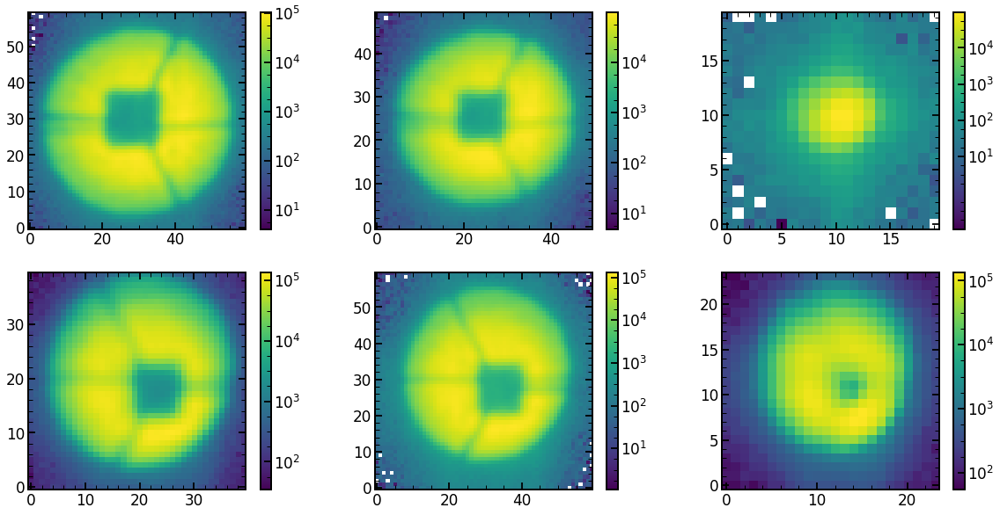

In [672]:
image_index=list_of_Ne_to_analyze[44]
print(image_index)
run_1=12307
run_2=12319
run_3=12355
run_4=12391
run_5=12403
run_6=12373
sci_1=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'Ne_Stacked.npy')
sci_2=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Stamps_cleaned/sci"+str(run_2)+str(image_index)+'Ne_Stacked.npy')
sci_3=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Stamps_cleaned/sci"+str(run_3)+str(image_index)+'Ne_Stacked.npy')
sci_4=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Stamps_cleaned/sci"+str(run_4)+str(image_index)+'Ne_Stacked.npy')
sci_5=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Stamps_cleaned/sci"+str(run_5)+str(image_index)+'Ne_Stacked.npy')
sci_6=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Stamps_cleaned/sci"+str(run_6)+str(image_index)+'Ne_Stacked.npy')


plt.figure(figsize=(20,10))
plt.subplot(231)
plt.imshow(sci_1,norm=LogNorm())
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
plt.subplot(232)
plt.imshow(sci_2,norm=LogNorm())
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(233)
plt.imshow(sci_3,norm=LogNorm())
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(234)
plt.imshow(sci_4,norm=LogNorm())
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(235)
plt.imshow(sci_5,norm=LogNorm())
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(236)
plt.imshow(sci_6,norm=LogNorm())
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [1469]:
finalNe_Feb2019

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
0,0,255,346,650.84186,0,Ne,255,0,nan
1,0,255,376,653.4774,0,Ne,255,1,nan
2,0,256,452,660.0668,1,Ne,256,2,nan
3,0,257,543,668.01764,0,Ne,257,3,nan
4,0,257,587,671.9268,0,Ne,257,4,nan
5,0,259,831,693.13116,1,Ne,259,5,nan
6,0,261,1111,717.59015,1,Ne,261,6,nan
7,0,261,1193,724.72437,1,Ne,261,7,nan
8,0,262,1416,744.1276,0,Ne,262,8,nan
9,1,467,339,650.84186,0,Ne,467,9,nan


### Second Neon script

In [1483]:
pd.reset_option("display.max_rows")
import pickle
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_HgAr_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_direct_preDecemberrun_HgAr=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_direct_preDecemberrun_Ne=pickle.load(f)

In [1487]:
results_of_fit_many_direct_preDecemberrun_Ne['p35'].index.values

array([  2,   6,  11,  14,  15,  38,  41,  42,  47,  50,  51,  56,  59,
        60,  65,  68,  69,  78,  87,  95,  96, 104, 105, 110, 113, 114,
       119, 122, 124, 128, 131, 132, 133, 137, 140, 141, 142])

In [1461]:
results_of_fit_many_direct_preDecemberrun_Ne['p3']

,z4,z5,z6,z7,z8,z9,z10,z11,hscFrac,strutFrac,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max


In [1463]:
results_of_fit_many_direct_preDecemberrun_Ne['m15']

,z4,z5,z6,z7,z8,z9,z10,z11,hscFrac,strutFrac,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max


In [1466]:
results_of_fit_many_direct_preDecemberrun_Ne['p05']

,z4,z5,z6,z7,z8,z9,z10,z11,hscFrac,strutFrac,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max


In [1467]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalNe_Feb2019.pkl', 'rb') as f:
    finalNe_Feb2019=pickle.load(f)

In [1488]:
list_of_Ne_to_analyze_all=finalNe_Feb2019.index[(finalNe_Feb2019['fiber'].values.astype(int)<=16)&(finalNe_Feb2019['fiber'].values.astype(int)>=0)
                                        &(finalNe_Feb2019['close'].values.astype(int)==1)]


list_of_Ne_to_not_analyze_2_3=finalNe_Feb2019.index[(finalNe_Feb2019['fiber'].values.astype(int)<=3)&(finalNe_Feb2019['fiber'].values.astype(int)>=2)
                                        &(finalNe_Feb2019['close'].values.astype(int)==1)]

# remove the spots from fibers 2 and 3 as they are too close together
list_of_Ne_to_analyze=np.setdiff1d(list_of_Ne_to_analyze_all,list_of_Ne_to_not_analyze_2_3)

print(len(list_of_Ne_to_analyze))

56


In [1471]:
#MPI
for single_spot in list_of_Ne_to_analyze:
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T05S'+str(single_spot)+'Feb.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    #for obs in [11790,11730,11748,11694,11754,11700,11760,11796,11736,11724,11784]:
    for obs in [12373,12349,12319,12313]:
        file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Feb_MPI01.py "+str(obs)+" "+str(single_spot)+" 40 5 Ne\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/FebScriptToSubmitScriptsTiger05'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T05S'+str(single_spot)+'Feb.sh \n')

file.close()

## Looking at the single image

In [507]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalHgAr_Feb2019.pkl', 'rb') as f:
    finalHgAr_Feb2019=pickle.load(f)
    
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalNe_Feb2019.pkl', 'rb') as f:
    finalNe_Feb2019=pickle.load(f)
    
    
date='Feb15'
obs=11730
single_number='102'
image_index=int(single_number)
eps=5
arc='HgAr'


STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Stamps_cleaned/"

if arc=="HgAr":
    single_number_focus=11748
elif arc=="Ne":
    single_number_focus=11748+607    
else:
    print("Not recognized arc-line")

if arc=='HgAr':
    obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
elif arc=='Ne':
    obs_possibilites=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
    
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if arc=="HgAr":
    finalArc=finalHgAr_Feb2019
elif arc=="Ne":
    finalArc=finalNe_Feb2019    
else:
    print("Not recognized arc-line")    
        
finalArc.loc[int(single_number)]

p35


fiber                           8
xc                           2133
yc                           1955
wavelength               795.0522
close                           1
lamp                         HgAr
xc_effective                 2202
old_index_approx               66
superold_index_approx        55.0
Name: 102, dtype: object

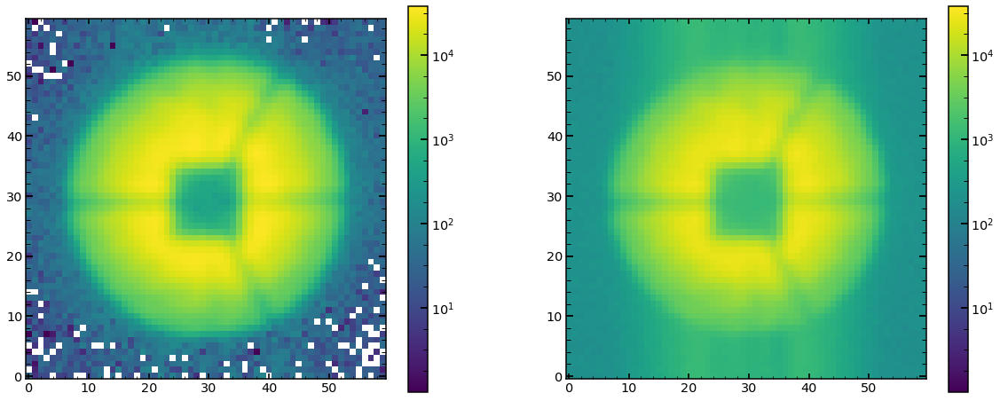

In [508]:
plt.figure(figsize=(20,8))
plt.subplot(121)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(122)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])


In [511]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (186, 35, 31)
minimal likelihood is: 59836.74696179391
minimal chi2 reduced is: 33.23748722857301


In [512]:
print(minchain.shape)

if len(minchain)==42:
    columns=columns22
    
    
    
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)


(31,)
          z4        z5       z6        z7        z8        z9       z10  \
0 -27.948213 -0.617973  0.09577  0.149698 -0.045292 -0.036558 -0.270315   

        z11  
0 -0.295323  
   hscFrac  strutFrac   dxFocal  dyFocal  slitFrac  slitFrac_dy  \
0  0.63932   0.074724  0.007835  0.00656   0.05826     0.008441   

   radiometricEffect  radiometricExponent    x_ilum    y_ilum  
0           0.430413             1.295578  1.028941  1.140533  
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0 -0.012801 -0.087711                       0.834702   0.123646   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0            0.723026  1.025221           -0.027854    98071.88395   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r      flux  
0           2.63754              0.005938      0.371448  1.831665  0.995934  


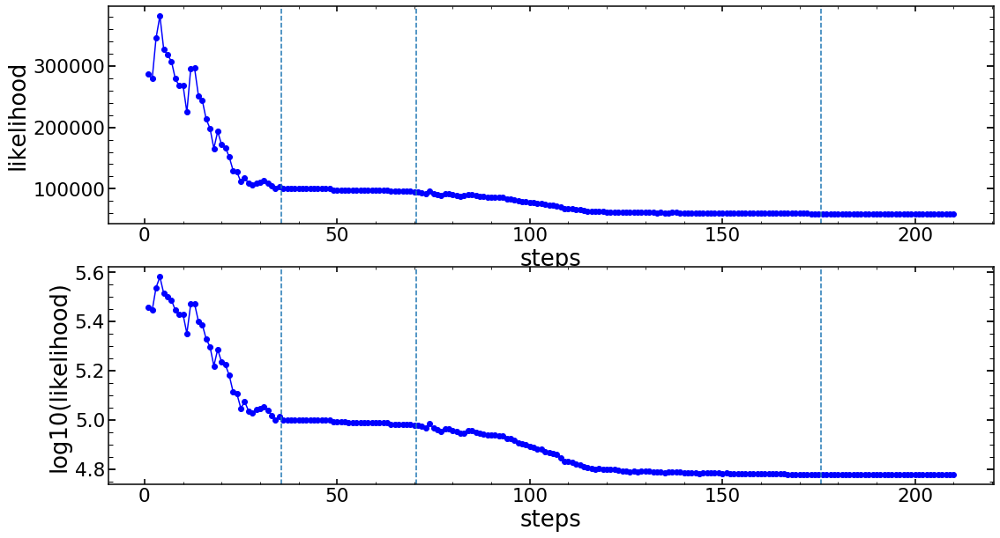

In [513]:
size=chain0_Emcee3.shape[1]
matplotlib.rcParams.update({'font.size': 18})
plt.figure(figsize=(18,10))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(5*size+0.5,ls='--')

In [514]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=11)   
       
model(minchain)

None
zmax: 11


-59836.74696179393

In [515]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
r_ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'r_ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')

wf=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf.npy') 
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 
u_manual=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'u_manual.npy')
wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')   
expwf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'expwf_grid.npy')      

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')
res_init=np.load(TESTING_FINAL_IMAGES_FOLDER+'res_init.npy')
res=np.load(TESTING_FINAL_IMAGES_FOLDER+'res.npy')


optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

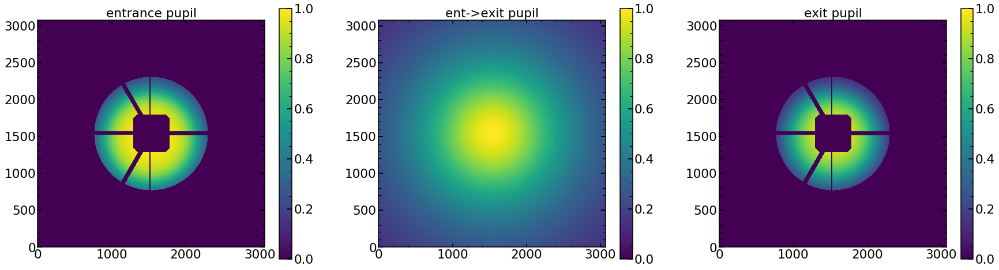

In [516]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

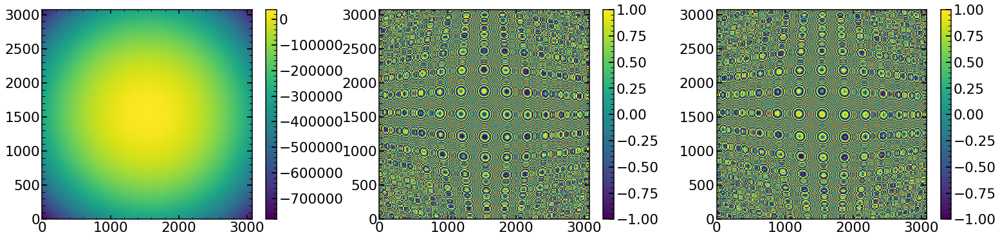

In [517]:
plt.figure(figsize=(36,6))
plt.subplot(141)
plt.imshow(wf_full)
plt.colorbar()

plt.subplot(142)
plt.imshow(np.real(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

plt.subplot(143)
plt.imshow(np.imag(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

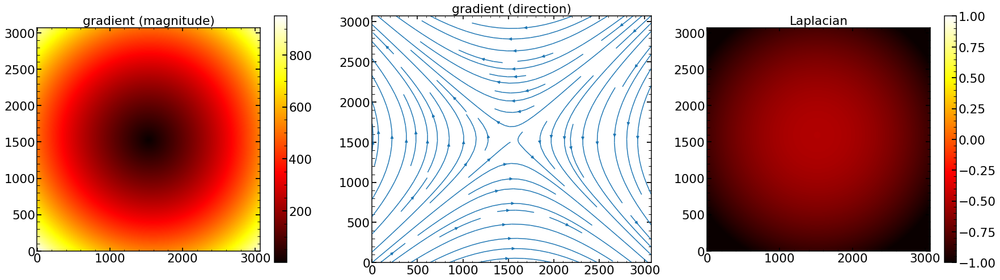

In [518]:
plt.figure(figsize=(30,8))
plt.subplot(131)
vgrad = np.gradient(wf_full)
fulgrad = np.sqrt(vgrad[0]**2 + vgrad[1]**2)
plt.title('gradient (magnitude)')
plt.imshow(fulgrad,cmap=plt.get_cmap('hot'), vmin = np.amin(fulgrad),vmax = np.amax(fulgrad))  
plt.colorbar()
plt.subplot(132)
x, y = range(0, len(wf_full)), range(0,len(wf_full))
xi, yi = np.meshgrid(x, y)
plt.title('gradient (direction)')
plt.streamplot(xi, yi, vgrad[0], vgrad[1])
plt.subplot(133)
laplace_of_wf = scipy.ndimage.filters.laplace(wf_full)
plt.title('Laplacian')
plt.imshow(laplace_of_wf,cmap=plt.get_cmap('hot'), vmin = -1,vmax = 1) 
plt.colorbar()

Text(0.5,1,'Residual')

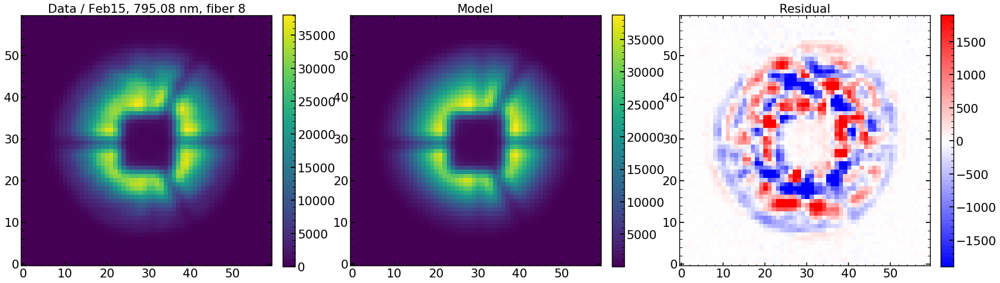

In [519]:
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(sci_image,vmax=np.max(sci_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / Feb15, 795.08 nm, fiber 8')
plt.subplot(1,3,2)
plt.imshow(res_iapetus,vmax=np.max(res_iapetus))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(res_iapetus-sci_image,vmin=-np.max(sci_image)/20,vmax=np.max(sci_image)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

chi**2 reduced is: 33.23748719532959
Abs of residual divided by total flux is: 0.05592427092491049
Abs of residual divided by largest value of a flux in the image is: 0.10823700297182184


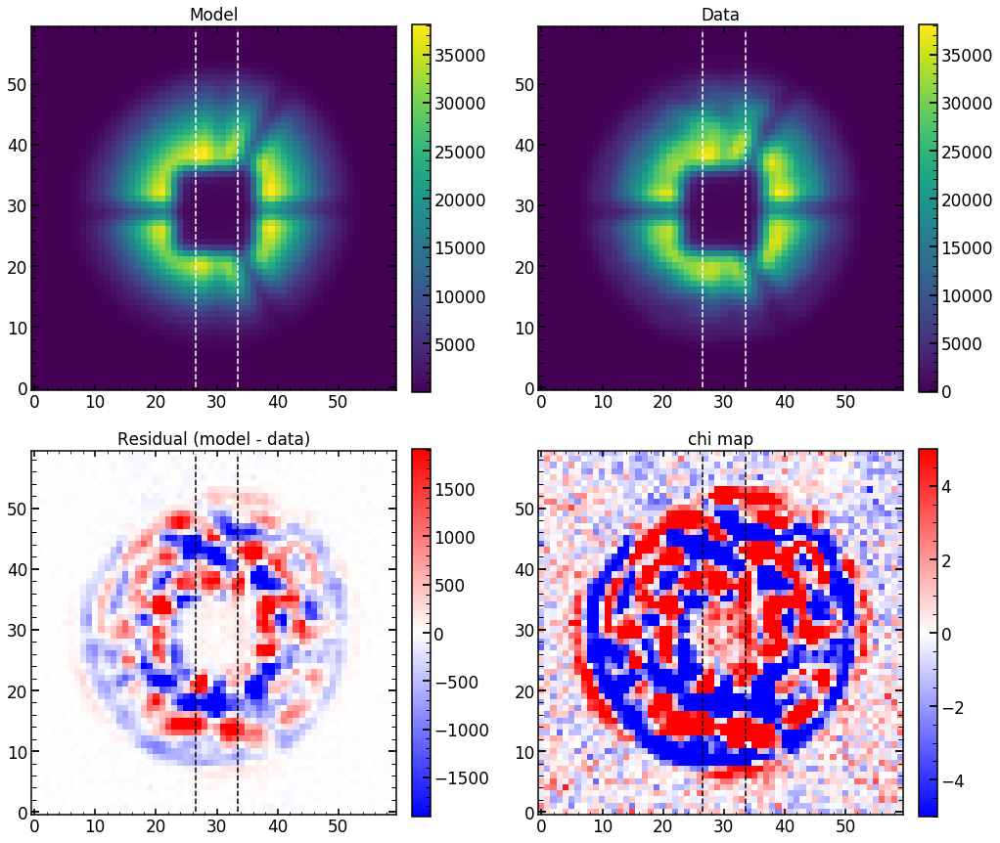

In [520]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

33.23748719532959
chi**2 reduced is: 33.23748719532959
Abs of residual divided by total flux is: 0.05592427092491049
Abs of residual divided by largest value of a flux in the image is: 0.10823700297182184


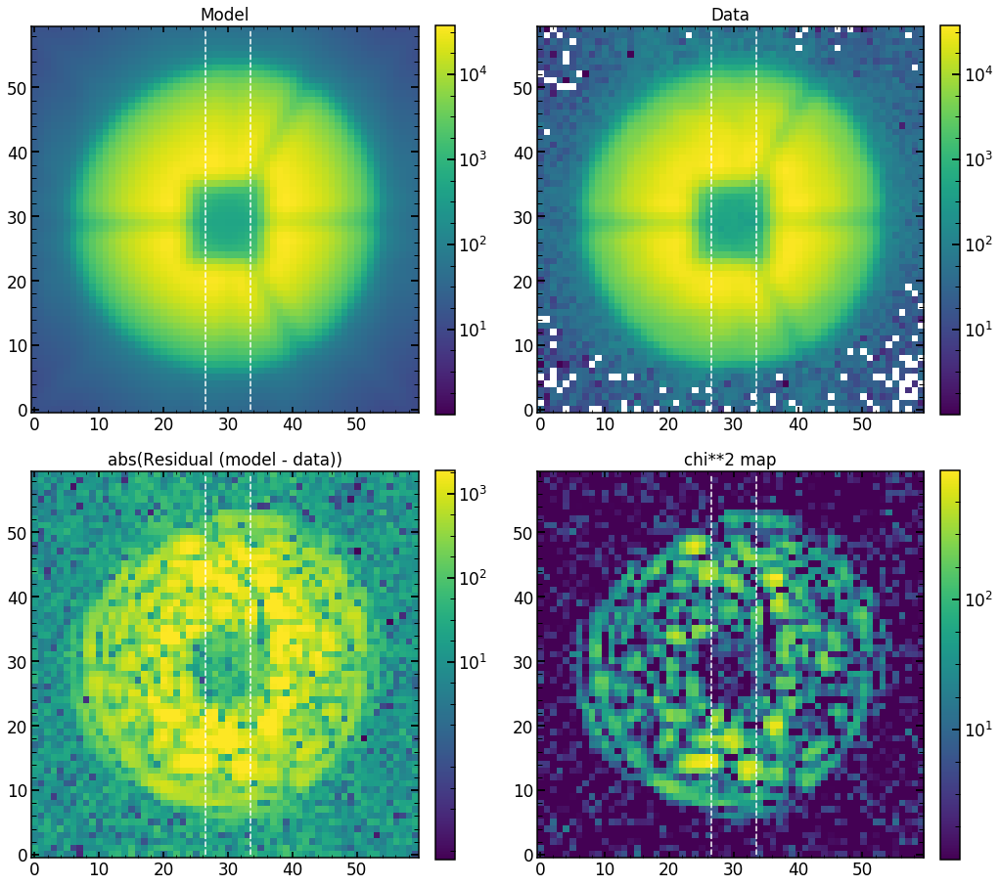

In [521]:
single_analysis.create_basic_comparison_plot_log()

33.23748719532959
chi**2 reduced is: 33.23748719532959
Abs of residual divided by total flux is: 0.05592427092491049
Abs of residual divided by largest value of a flux in the image is: 0.10823700297182184


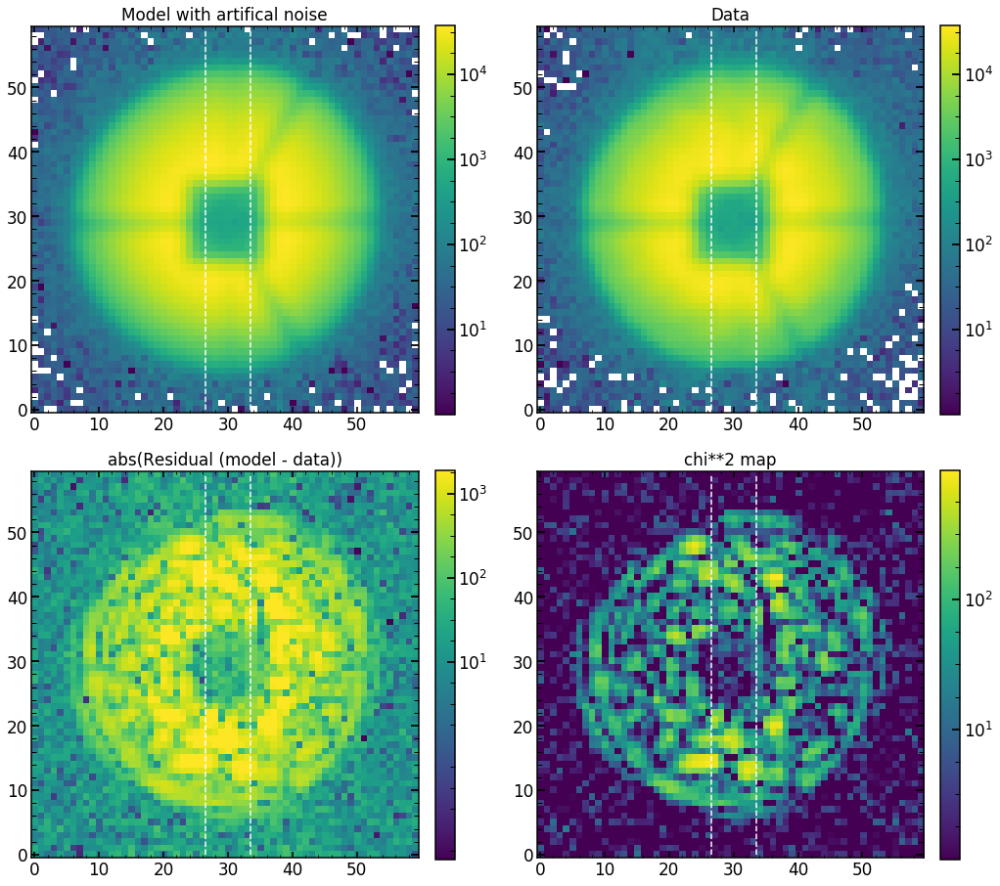

In [522]:
single_analysis.create_basic_comparison_plot_log_artifical()

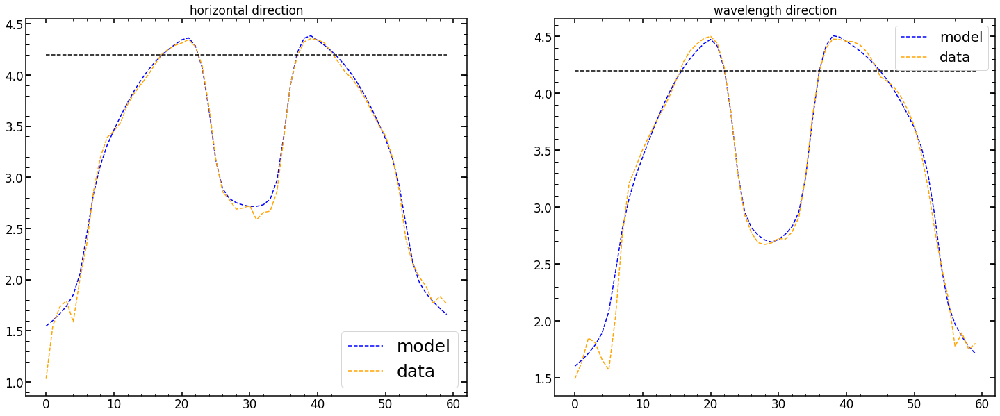

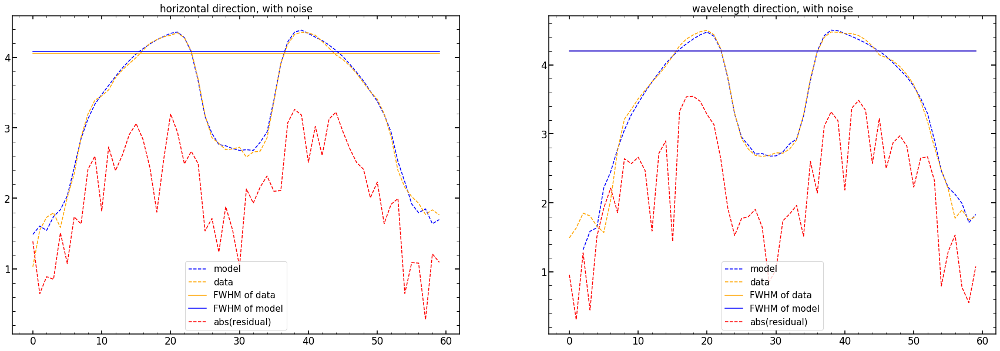

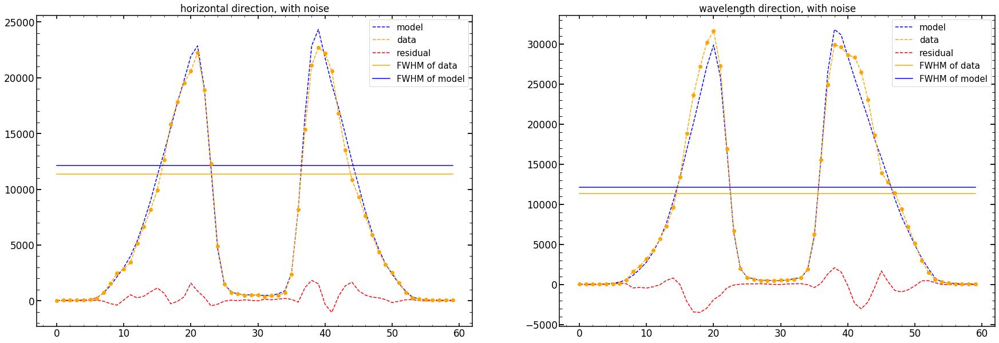

In [523]:
single_analysis.create_cut_plots()

## Core analysis 

### Defocus plots 

In [49]:
for i in tqdm(range(len(finalHgAr_Feb2019))):
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single('Feb15',i,'HgAr',11)
    solution_at_0=solution_at_0_and_plots('Feb15',i,'HgAr',results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper,'True',11)

  0%|          | 0/192 [00:00<?, ?it/s]

11
0 11796 HgAr is NOT found or failed!
0 11790 HgAr is NOT found or failed!
0 11784 HgAr is NOT found or failed!
0 11778 HgAr is NOT found or failed!
0 11772 HgAr is NOT found or failed!
0 11766 HgAr is NOT found or failed!
0 11760 HgAr is NOT found or failed!
0 11754 HgAr is NOT found or failed!
0 11748 HgAr is NOT found or failed!
0 11748 HgAr is NOT found or failed!
0 11694 HgAr is NOT found or failed!
0 11700 HgAr is NOT found or failed!
0 11706 HgAr is NOT found or failed!
0 11712 HgAr is NOT found or failed!
0 11718 HgAr is NOT found or failed!
0 11724 HgAr is NOT found or failed!
0 11730 HgAr is NOT found or failed!
0 11736 HgAr is NOT found or failed!
11
1 11796 HgAr is NOT found or failed!
1 11790 HgAr is NOT found or failed!
1 11784 HgAr is NOT found or failed!
1 11778 HgAr is NOT found or failed!
1 11772 HgAr is NOT found or failed!
1 11766 HgAr is NOT found or failed!
1 obs (Emcee3): 11760 is found!
1 obs (Emcee3): 11754 is found!
1 obs (Emcee3): 11748 is found!
1 obs (Emc

  1%|          | 2/192 [00:16<26:44,  8.44s/it]

11
2 11796 HgAr is NOT found or failed!
2 11790 HgAr is NOT found or failed!
2 11784 HgAr is NOT found or failed!
2 11778 HgAr is NOT found or failed!
2 11772 HgAr is NOT found or failed!
2 11766 HgAr is NOT found or failed!
2 11760 HgAr is NOT found or failed!
2 11754 HgAr is NOT found or failed!
2 11748 HgAr is NOT found or failed!
2 11748 HgAr is NOT found or failed!
2 11694 HgAr is NOT found or failed!
2 11700 HgAr is NOT found or failed!
2 11706 HgAr is NOT found or failed!
2 11712 HgAr is NOT found or failed!
2 11718 HgAr is NOT found or failed!
2 11724 HgAr is NOT found or failed!
2 11730 HgAr is NOT found or failed!
2 11736 HgAr is NOT found or failed!
11
3 obs (Emcee3): 11796 is found!
3 obs (Emcee3): 11790 is found!
3 obs (Emcee3): 11784 is found!
3 11778 HgAr is NOT found or failed!
3 11772 HgAr is NOT found or failed!
3 11766 HgAr is NOT found or failed!
3 obs (Emcee3): 11760 is found!
3 obs (Emcee3): 11754 is found!
3 obs (Emcee3): 11748 is found!
3 obs (Emcee3): 11748 is 

  2%|▏         | 4/192 [00:35<27:52,  8.90s/it]

11
4 11796 HgAr is NOT found or failed!
4 11790 HgAr is NOT found or failed!
4 11784 HgAr is NOT found or failed!
4 11778 HgAr is NOT found or failed!
4 11772 HgAr is NOT found or failed!
4 11766 HgAr is NOT found or failed!
4 11760 HgAr is NOT found or failed!
4 11754 HgAr is NOT found or failed!
4 11748 HgAr is NOT found or failed!
4 11748 HgAr is NOT found or failed!
4 11694 HgAr is NOT found or failed!
4 11700 HgAr is NOT found or failed!
4 11706 HgAr is NOT found or failed!
4 11712 HgAr is NOT found or failed!
4 11718 HgAr is NOT found or failed!
4 11724 HgAr is NOT found or failed!
4 11730 HgAr is NOT found or failed!
4 11736 HgAr is NOT found or failed!
11
5 11796 HgAr is NOT found or failed!
5 11790 HgAr is NOT found or failed!
5 11784 HgAr is NOT found or failed!
5 11778 HgAr is NOT found or failed!
5 11772 HgAr is NOT found or failed!
5 11766 HgAr is NOT found or failed!
5 11760 HgAr is NOT found or failed!
5 11754 HgAr is NOT found or failed!
5 11748 HgAr is NOT found or fai

  4%|▎         | 7/192 [00:56<24:49,  8.05s/it]

11
7 11796 HgAr is NOT found or failed!
7 11790 HgAr is NOT found or failed!
7 11784 HgAr is NOT found or failed!
7 11778 HgAr is NOT found or failed!
7 11772 HgAr is NOT found or failed!
7 11766 HgAr is NOT found or failed!
7 11760 HgAr is NOT found or failed!
7 11754 HgAr is NOT found or failed!
7 11748 HgAr is NOT found or failed!
7 11748 HgAr is NOT found or failed!
7 11694 HgAr is NOT found or failed!
7 11700 HgAr is NOT found or failed!
7 11706 HgAr is NOT found or failed!
7 11712 HgAr is NOT found or failed!
7 11718 HgAr is NOT found or failed!
7 11724 HgAr is NOT found or failed!
7 11730 HgAr is NOT found or failed!
7 11736 HgAr is NOT found or failed!
11
8 11796 HgAr is NOT found or failed!
8 11790 HgAr is NOT found or failed!
8 11784 HgAr is NOT found or failed!
8 11778 HgAr is NOT found or failed!
8 11772 HgAr is NOT found or failed!
8 11766 HgAr is NOT found or failed!
8 11760 HgAr is NOT found or failed!
8 11754 HgAr is NOT found or failed!
8 11748 HgAr is NOT found or fai

  5%|▌         | 10/192 [01:16<23:05,  7.61s/it]

11
10 11796 HgAr is NOT found or failed!
10 11790 HgAr is NOT found or failed!
10 11784 HgAr is NOT found or failed!
10 11778 HgAr is NOT found or failed!
10 11772 HgAr is NOT found or failed!
10 11766 HgAr is NOT found or failed!
10 11760 HgAr is NOT found or failed!
10 11754 HgAr is NOT found or failed!
10 11748 HgAr is NOT found or failed!
10 11748 HgAr is NOT found or failed!
10 11694 HgAr is NOT found or failed!
10 11700 HgAr is NOT found or failed!
10 11706 HgAr is NOT found or failed!
10 11712 HgAr is NOT found or failed!
10 11718 HgAr is NOT found or failed!
10 11724 HgAr is NOT found or failed!
10 11730 HgAr is NOT found or failed!
10 11736 HgAr is NOT found or failed!
11
11 obs (Emcee3): 11796 is found!
11 obs (Emcee3): 11790 is found!
11 obs (Emcee3): 11784 is found!
11 11778 HgAr is NOT found or failed!
11 11772 HgAr is NOT found or failed!
11 11766 HgAr is NOT found or failed!
11 obs (Emcee3): 11760 is found!
11 obs (Emcee3): 11754 is found!
11 obs (Emcee3): 11748 is found

  6%|▋         | 12/192 [01:35<23:46,  7.92s/it]

11
12 11796 HgAr is NOT found or failed!
12 11790 HgAr is NOT found or failed!
12 11784 HgAr is NOT found or failed!
12 11778 HgAr is NOT found or failed!
12 11772 HgAr is NOT found or failed!
12 11766 HgAr is NOT found or failed!
12 11760 HgAr is NOT found or failed!
12 11754 HgAr is NOT found or failed!
12 11748 HgAr is NOT found or failed!
12 11748 HgAr is NOT found or failed!
12 11694 HgAr is NOT found or failed!
12 11700 HgAr is NOT found or failed!
12 11706 HgAr is NOT found or failed!
12 11712 HgAr is NOT found or failed!
12 11718 HgAr is NOT found or failed!
12 11724 HgAr is NOT found or failed!
12 11730 HgAr is NOT found or failed!
12 11736 HgAr is NOT found or failed!
11
13 obs (Emcee3): 11796 is found!
13 obs (Emcee3): 11790 is found!
13 obs (Emcee3): 11784 is found!
13 11778 HgAr is NOT found or failed!
13 11772 HgAr is NOT found or failed!
13 11766 HgAr is NOT found or failed!
13 obs (Emcee3): 11760 is found!
13 obs (Emcee3): 11754 is found!
13 11748 HgAr is NOT found or f

  7%|▋         | 14/192 [01:53<24:08,  8.14s/it]

11
14 11796 HgAr is NOT found or failed!
14 11790 HgAr is NOT found or failed!
14 11784 HgAr is NOT found or failed!
14 11778 HgAr is NOT found or failed!
14 11772 HgAr is NOT found or failed!
14 11766 HgAr is NOT found or failed!
14 11760 HgAr is NOT found or failed!
14 11754 HgAr is NOT found or failed!
14 11748 HgAr is NOT found or failed!
14 11748 HgAr is NOT found or failed!
14 11694 HgAr is NOT found or failed!
14 11700 HgAr is NOT found or failed!
14 11706 HgAr is NOT found or failed!
14 11712 HgAr is NOT found or failed!
14 11718 HgAr is NOT found or failed!
14 11724 HgAr is NOT found or failed!
14 11730 HgAr is NOT found or failed!
14 11736 HgAr is NOT found or failed!
11
15 obs (Emcee3): 11796 is found!
15 obs (Emcee3): 11790 is found!
15 obs (Emcee3): 11784 is found!
15 11778 HgAr is NOT found or failed!
15 11772 HgAr is NOT found or failed!
15 11766 HgAr is NOT found or failed!
15 obs (Emcee3): 11760 is found!
15 obs (Emcee3): 11754 is found!
15 obs (Emcee3): 11748 is found

  8%|▊         | 16/192 [02:12<24:20,  8.30s/it]

11
16 11796 HgAr is NOT found or failed!
16 11790 HgAr is NOT found or failed!
16 11784 HgAr is NOT found or failed!
16 11778 HgAr is NOT found or failed!
16 11772 HgAr is NOT found or failed!
16 11766 HgAr is NOT found or failed!
16 11760 HgAr is NOT found or failed!
16 11754 HgAr is NOT found or failed!
16 11748 HgAr is NOT found or failed!
16 11748 HgAr is NOT found or failed!
16 11694 HgAr is NOT found or failed!
16 11700 HgAr is NOT found or failed!
16 11706 HgAr is NOT found or failed!
16 11712 HgAr is NOT found or failed!
16 11718 HgAr is NOT found or failed!
16 11724 HgAr is NOT found or failed!
16 11730 HgAr is NOT found or failed!
16 11736 HgAr is NOT found or failed!
11
17 11796 HgAr is NOT found or failed!
17 11790 HgAr is NOT found or failed!
17 11784 HgAr is NOT found or failed!
17 11778 HgAr is NOT found or failed!
17 11772 HgAr is NOT found or failed!
17 11766 HgAr is NOT found or failed!
17 11760 HgAr is NOT found or failed!
17 11754 HgAr is NOT found or failed!
17 117

 10%|▉         | 19/192 [02:31<23:01,  7.99s/it]

11
19 11796 HgAr is NOT found or failed!
19 11790 HgAr is NOT found or failed!
19 11784 HgAr is NOT found or failed!
19 11778 HgAr is NOT found or failed!
19 11772 HgAr is NOT found or failed!
19 11766 HgAr is NOT found or failed!
19 11760 HgAr is NOT found or failed!
19 11754 HgAr is NOT found or failed!
19 11748 HgAr is NOT found or failed!
19 11748 HgAr is NOT found or failed!
19 11694 HgAr is NOT found or failed!
19 11700 HgAr is NOT found or failed!
19 11706 HgAr is NOT found or failed!
19 11712 HgAr is NOT found or failed!
19 11718 HgAr is NOT found or failed!
19 11724 HgAr is NOT found or failed!
19 11730 HgAr is NOT found or failed!
19 11736 HgAr is NOT found or failed!
11
20 11796 HgAr is NOT found or failed!
20 11790 HgAr is NOT found or failed!
20 11784 HgAr is NOT found or failed!
20 11778 HgAr is NOT found or failed!
20 11772 HgAr is NOT found or failed!
20 11766 HgAr is NOT found or failed!
20 11760 HgAr is NOT found or failed!
20 11754 HgAr is NOT found or failed!
20 117

 11%|█▏        | 22/192 [02:51<22:05,  7.79s/it]

11
22 11796 HgAr is NOT found or failed!
22 11790 HgAr is NOT found or failed!
22 11784 HgAr is NOT found or failed!
22 11778 HgAr is NOT found or failed!
22 11772 HgAr is NOT found or failed!
22 11766 HgAr is NOT found or failed!
22 11760 HgAr is NOT found or failed!
22 11754 HgAr is NOT found or failed!
22 11748 HgAr is NOT found or failed!
22 11748 HgAr is NOT found or failed!
22 11694 HgAr is NOT found or failed!
22 11700 HgAr is NOT found or failed!
22 11706 HgAr is NOT found or failed!
22 11712 HgAr is NOT found or failed!
22 11718 HgAr is NOT found or failed!
22 11724 HgAr is NOT found or failed!
22 11730 HgAr is NOT found or failed!
22 11736 HgAr is NOT found or failed!
11
23 obs (Emcee3): 11796 is found!
23 obs (Emcee3): 11790 is found!
23 obs (Emcee3): 11784 is found!
23 11778 HgAr is NOT found or failed!
23 11772 HgAr is NOT found or failed!
23 11766 HgAr is NOT found or failed!
23 obs (Emcee3): 11760 is found!
23 obs (Emcee3): 11754 is found!
23 obs (Emcee3): 11748 is found

 12%|█▎        | 24/192 [03:11<22:18,  7.97s/it]

11
24 11796 HgAr is NOT found or failed!
24 11790 HgAr is NOT found or failed!
24 11784 HgAr is NOT found or failed!
24 11778 HgAr is NOT found or failed!
24 11772 HgAr is NOT found or failed!
24 11766 HgAr is NOT found or failed!
24 11760 HgAr is NOT found or failed!
24 11754 HgAr is NOT found or failed!
24 11748 HgAr is NOT found or failed!
24 11748 HgAr is NOT found or failed!
24 11694 HgAr is NOT found or failed!
24 11700 HgAr is NOT found or failed!
24 11706 HgAr is NOT found or failed!
24 11712 HgAr is NOT found or failed!
24 11718 HgAr is NOT found or failed!
24 11724 HgAr is NOT found or failed!
24 11730 HgAr is NOT found or failed!
24 11736 HgAr is NOT found or failed!
11
25 11796 HgAr is NOT found or failed!
25 11790 HgAr is NOT found or failed!
25 11784 HgAr is NOT found or failed!
25 11778 HgAr is NOT found or failed!
25 11772 HgAr is NOT found or failed!
25 11766 HgAr is NOT found or failed!
25 11760 HgAr is NOT found or failed!
25 11754 HgAr is NOT found or failed!
25 117

 14%|█▎        | 26/192 [03:11<20:22,  7.36s/it]

25 11736 HgAr is NOT found or failed!
11
26 11796 HgAr is NOT found or failed!
26 11790 HgAr is NOT found or failed!
26 11784 HgAr is NOT found or failed!
26 11778 HgAr is NOT found or failed!
26 11772 HgAr is NOT found or failed!
26 11766 HgAr is NOT found or failed!
26 11760 HgAr is NOT found or failed!
26 11754 HgAr is NOT found or failed!
26 11748 HgAr is NOT found or failed!
26 11748 HgAr is NOT found or failed!
26 11694 HgAr is NOT found or failed!
26 11700 HgAr is NOT found or failed!
26 11706 HgAr is NOT found or failed!
26 11712 HgAr is NOT found or failed!
26 11718 HgAr is NOT found or failed!
26 11724 HgAr is NOT found or failed!
26 11730 HgAr is NOT found or failed!
26 11736 HgAr is NOT found or failed!
11
27 11796 HgAr is NOT found or failed!
27obs (Emcee2): 11790 is found!


 15%|█▍        | 28/192 [03:11<18:42,  6.85s/it]

27 11784 HgAr is NOT found or failed!
27 11778 HgAr is NOT found or failed!
27 11772 HgAr is NOT found or failed!
27 11766 HgAr is NOT found or failed!
27 11760 HgAr is NOT found or failed!
27 11754 HgAr is NOT found or failed!
27 11748 HgAr is NOT found or failed!
27 11748 HgAr is NOT found or failed!
27 11694 HgAr is NOT found or failed!
27 11700 HgAr is NOT found or failed!
27 11706 HgAr is NOT found or failed!
27 11712 HgAr is NOT found or failed!
27 11718 HgAr is NOT found or failed!
27 11724 HgAr is NOT found or failed!
27 11730 HgAr is NOT found or failed!
27 11736 HgAr is NOT found or failed!
11
28 11796 HgAr is NOT found or failed!
28 11790 HgAr is NOT found or failed!
28 11784 HgAr is NOT found or failed!
28 11778 HgAr is NOT found or failed!
28 11772 HgAr is NOT found or failed!
28 11766 HgAr is NOT found or failed!
28 11760 HgAr is NOT found or failed!
28 11754 HgAr is NOT found or failed!
28 11748 HgAr is NOT found or failed!
28 11748 HgAr is NOT found or failed!
28 11694 

 16%|█▌        | 31/192 [03:11<16:36,  6.19s/it]

30 11784 HgAr is NOT found or failed!
30 11778 HgAr is NOT found or failed!
30 11772 HgAr is NOT found or failed!
30 11766 HgAr is NOT found or failed!
30 11760 HgAr is NOT found or failed!
30 11754 HgAr is NOT found or failed!
30 11748 HgAr is NOT found or failed!
30 11748 HgAr is NOT found or failed!
30 11694 HgAr is NOT found or failed!
30 11700 HgAr is NOT found or failed!
30 11706 HgAr is NOT found or failed!
30 11712 HgAr is NOT found or failed!
30 11718 HgAr is NOT found or failed!
30 11724 HgAr is NOT found or failed!
30 11730 HgAr is NOT found or failed!
30 11736 HgAr is NOT found or failed!
11
31 11796 HgAr is NOT found or failed!
31 11790 HgAr is NOT found or failed!
31 11784 HgAr is NOT found or failed!
31 11778 HgAr is NOT found or failed!
31 11772 HgAr is NOT found or failed!
31 11766 HgAr is NOT found or failed!
31 11760 HgAr is NOT found or failed!
31 11754 HgAr is NOT found or failed!
31 11748 HgAr is NOT found or failed!
31 11748 HgAr is NOT found or failed!
31 11694 

 20%|█▉        | 38/192 [03:12<12:59,  5.06s/it]

37 11736 HgAr is NOT found or failed!
11
38 11796 HgAr is NOT found or failed!
38 11790 HgAr is NOT found or failed!
38 11784 HgAr is NOT found or failed!
38 11778 HgAr is NOT found or failed!
38 11772 HgAr is NOT found or failed!
38 11766 HgAr is NOT found or failed!
38 11760 HgAr is NOT found or failed!
38 11754 HgAr is NOT found or failed!
38 11748 HgAr is NOT found or failed!
38 11748 HgAr is NOT found or failed!
38 11694 HgAr is NOT found or failed!
38 11700 HgAr is NOT found or failed!
38 11706 HgAr is NOT found or failed!
38 11712 HgAr is NOT found or failed!
38 11718 HgAr is NOT found or failed!
38 11724 HgAr is NOT found or failed!
38 11730 HgAr is NOT found or failed!
38 11736 HgAr is NOT found or failed!
11
39 11796 HgAr is NOT found or failed!
39obs (Emcee2): 11790 is found!


 21%|██        | 40/192 [03:12<12:11,  4.81s/it]

39 11784 HgAr is NOT found or failed!
39 11778 HgAr is NOT found or failed!
39 11772 HgAr is NOT found or failed!
39 11766 HgAr is NOT found or failed!
39 11760 HgAr is NOT found or failed!
39 11754 HgAr is NOT found or failed!
39 11748 HgAr is NOT found or failed!
39 11748 HgAr is NOT found or failed!
39 11694 HgAr is NOT found or failed!
39 11700 HgAr is NOT found or failed!
39 11706 HgAr is NOT found or failed!
39 11712 HgAr is NOT found or failed!
39 11718 HgAr is NOT found or failed!
39 11724 HgAr is NOT found or failed!
39 11730 HgAr is NOT found or failed!
39 11736 HgAr is NOT found or failed!
11
40 11796 HgAr is NOT found or failed!
40 11790 HgAr is NOT found or failed!
40 11784 HgAr is NOT found or failed!
40 11778 HgAr is NOT found or failed!
40 11772 HgAr is NOT found or failed!
40 11766 HgAr is NOT found or failed!
40 11760 HgAr is NOT found or failed!
40 11754 HgAr is NOT found or failed!
40 11748 HgAr is NOT found or failed!
40 11748 HgAr is NOT found or failed!
40 11694 

 22%|██▏       | 43/192 [03:12<11:08,  4.48s/it]

42 11784 HgAr is NOT found or failed!
42 11778 HgAr is NOT found or failed!
42 11772 HgAr is NOT found or failed!
42 11766 HgAr is NOT found or failed!
42 11760 HgAr is NOT found or failed!
42 11754 HgAr is NOT found or failed!
42 11748 HgAr is NOT found or failed!
42 11748 HgAr is NOT found or failed!
42 11694 HgAr is NOT found or failed!
42 11700 HgAr is NOT found or failed!
42 11706 HgAr is NOT found or failed!
42 11712 HgAr is NOT found or failed!
42 11718 HgAr is NOT found or failed!
42 11724 HgAr is NOT found or failed!
42 11730 HgAr is NOT found or failed!
42 11736 HgAr is NOT found or failed!
11
43 11796 HgAr is NOT found or failed!
43 11790 HgAr is NOT found or failed!
43 11784 HgAr is NOT found or failed!
43 11778 HgAr is NOT found or failed!
43 11772 HgAr is NOT found or failed!
43 11766 HgAr is NOT found or failed!
43 11760 HgAr is NOT found or failed!
43 11754 HgAr is NOT found or failed!
43 11748 HgAr is NOT found or failed!
43 11748 HgAr is NOT found or failed!
43 11694 

 26%|██▌       | 50/192 [03:33<10:06,  4.27s/it]

11
50 11796 HgAr is NOT found or failed!
50 11790 HgAr is NOT found or failed!
50 11784 HgAr is NOT found or failed!
50 11778 HgAr is NOT found or failed!
50 11772 HgAr is NOT found or failed!
50 11766 HgAr is NOT found or failed!
50 11760 HgAr is NOT found or failed!
50 11754 HgAr is NOT found or failed!
50 11748 HgAr is NOT found or failed!
50 11748 HgAr is NOT found or failed!
50 11694 HgAr is NOT found or failed!
50 11700 HgAr is NOT found or failed!
50 11706 HgAr is NOT found or failed!
50 11712 HgAr is NOT found or failed!
50 11718 HgAr is NOT found or failed!
50 11724 HgAr is NOT found or failed!
50 11730 HgAr is NOT found or failed!
50 11736 HgAr is NOT found or failed!
11
51 11796 HgAr is NOT found or failed!
51 obs (Emcee3): 11790 is found!
51 obs (Emcee3): 11784 is found!
51 11778 HgAr is NOT found or failed!
51 11772 HgAr is NOT found or failed!
51 11766 HgAr is NOT found or failed!
51 obs (Emcee3): 11760 is found!
51 obs (Emcee3): 11754 is found!
51 11748 HgAr is NOT found

 27%|██▋       | 52/192 [03:52<10:24,  4.46s/it]

11
52 11796 HgAr is NOT found or failed!
52 11790 HgAr is NOT found or failed!
52 11784 HgAr is NOT found or failed!
52 11778 HgAr is NOT found or failed!
52 11772 HgAr is NOT found or failed!
52 11766 HgAr is NOT found or failed!
52 11760 HgAr is NOT found or failed!
52 11754 HgAr is NOT found or failed!
52 11748 HgAr is NOT found or failed!
52 11748 HgAr is NOT found or failed!
52 11694 HgAr is NOT found or failed!
52 11700 HgAr is NOT found or failed!
52 11706 HgAr is NOT found or failed!
52 11712 HgAr is NOT found or failed!
52 11718 HgAr is NOT found or failed!
52 11724 HgAr is NOT found or failed!
52 11730 HgAr is NOT found or failed!
52 11736 HgAr is NOT found or failed!
11
53 11796 HgAr is NOT found or failed!
53 11790 HgAr is NOT found or failed!
53 11784 HgAr is NOT found or failed!
53 11778 HgAr is NOT found or failed!
53 11772 HgAr is NOT found or failed!
53 11766 HgAr is NOT found or failed!
53 11760 HgAr is NOT found or failed!
53 11754 HgAr is NOT found or failed!
53 117

 29%|██▊       | 55/192 [04:10<10:24,  4.56s/it]

11
55 11796 HgAr is NOT found or failed!
55 11790 HgAr is NOT found or failed!
55 11784 HgAr is NOT found or failed!
55 11778 HgAr is NOT found or failed!
55 11772 HgAr is NOT found or failed!
55 11766 HgAr is NOT found or failed!
55 11760 HgAr is NOT found or failed!
55 11754 HgAr is NOT found or failed!
55 11748 HgAr is NOT found or failed!
55 11748 HgAr is NOT found or failed!
55 11694 HgAr is NOT found or failed!
55 11700 HgAr is NOT found or failed!
55 11706 HgAr is NOT found or failed!
55 11712 HgAr is NOT found or failed!
55 11718 HgAr is NOT found or failed!
55 11724 HgAr is NOT found or failed!
55 11730 HgAr is NOT found or failed!
55 11736 HgAr is NOT found or failed!
11
56 11796 HgAr is NOT found or failed!
56 11790 HgAr is NOT found or failed!
56 11784 HgAr is NOT found or failed!
56 11778 HgAr is NOT found or failed!
56 11772 HgAr is NOT found or failed!
56 11766 HgAr is NOT found or failed!
56 11760 HgAr is NOT found or failed!
56 11754 HgAr is NOT found or failed!
56 117

 30%|███       | 58/192 [04:32<10:29,  4.70s/it]

11
58 11796 HgAr is NOT found or failed!
58 11790 HgAr is NOT found or failed!
58 11784 HgAr is NOT found or failed!
58 11778 HgAr is NOT found or failed!
58 11772 HgAr is NOT found or failed!
58 11766 HgAr is NOT found or failed!
58 11760 HgAr is NOT found or failed!
58 11754 HgAr is NOT found or failed!
58 11748 HgAr is NOT found or failed!
58 11748 HgAr is NOT found or failed!
58 11694 HgAr is NOT found or failed!
58 11700 HgAr is NOT found or failed!
58 11706 HgAr is NOT found or failed!
58 11712 HgAr is NOT found or failed!
58 11718 HgAr is NOT found or failed!
58 11724 HgAr is NOT found or failed!
58 11730 HgAr is NOT found or failed!
58 11736 HgAr is NOT found or failed!
11
59 obs (Emcee3): 11796 is found!
59 obs (Emcee3): 11790 is found!
59 11784 HgAr is NOT found or failed!
59 11778 HgAr is NOT found or failed!
59 11772 HgAr is NOT found or failed!
59 11766 HgAr is NOT found or failed!
59 obs (Emcee3): 11760 is found!
59 obs (Emcee3): 11754 is found!
59 obs (Emcee3): 11748 is 

 31%|███▏      | 60/192 [04:51<10:42,  4.86s/it]

11
60 11796 HgAr is NOT found or failed!
60 11790 HgAr is NOT found or failed!
60 11784 HgAr is NOT found or failed!
60 11778 HgAr is NOT found or failed!
60 11772 HgAr is NOT found or failed!
60 11766 HgAr is NOT found or failed!
60 11760 HgAr is NOT found or failed!
60 11754 HgAr is NOT found or failed!
60 11748 HgAr is NOT found or failed!
60 11748 HgAr is NOT found or failed!
60 11694 HgAr is NOT found or failed!
60 11700 HgAr is NOT found or failed!
60 11706 HgAr is NOT found or failed!
60 11712 HgAr is NOT found or failed!
60 11718 HgAr is NOT found or failed!
60 11724 HgAr is NOT found or failed!
60 11730 HgAr is NOT found or failed!
60 11736 HgAr is NOT found or failed!
11
61 obs (Emcee3): 11796 is found!
61 obs (Emcee3): 11790 is found!
61 obs (Emcee3): 11784 is found!
61 11778 HgAr is NOT found or failed!
61 11772 HgAr is NOT found or failed!
61 11766 HgAr is NOT found or failed!
61 obs (Emcee3): 11760 is found!
61 obs (Emcee3): 11754 is found!
61 obs (Emcee3): 11748 is found

 32%|███▏      | 62/192 [05:10<10:51,  5.01s/it]

11
62 11796 HgAr is NOT found or failed!
62 11790 HgAr is NOT found or failed!
62 11784 HgAr is NOT found or failed!
62 11778 HgAr is NOT found or failed!
62 11772 HgAr is NOT found or failed!
62 11766 HgAr is NOT found or failed!
62 11760 HgAr is NOT found or failed!
62 11754 HgAr is NOT found or failed!
62 11748 HgAr is NOT found or failed!
62 11748 HgAr is NOT found or failed!
62 11694 HgAr is NOT found or failed!
62 11700 HgAr is NOT found or failed!
62 11706 HgAr is NOT found or failed!
62 11712 HgAr is NOT found or failed!
62 11718 HgAr is NOT found or failed!
62 11724 HgAr is NOT found or failed!
62 11730 HgAr is NOT found or failed!
62 11736 HgAr is NOT found or failed!
11
63 11796 HgAr is NOT found or failed!
63 obs (Emcee3): 11790 is found!
63 11784 HgAr is NOT found or failed!
63 11778 HgAr is NOT found or failed!
63 11772 HgAr is NOT found or failed!
63 11766 HgAr is NOT found or failed!
63 obs (Emcee3): 11760 is found!
63 obs (Emcee3): 11754 is found!
63 obs (Emcee3): 1174

 33%|███▎      | 64/192 [05:30<11:00,  5.16s/it]

11
64 11796 HgAr is NOT found or failed!
64 11790 HgAr is NOT found or failed!
64 11784 HgAr is NOT found or failed!
64 11778 HgAr is NOT found or failed!
64 11772 HgAr is NOT found or failed!
64 11766 HgAr is NOT found or failed!
64 11760 HgAr is NOT found or failed!
64 11754 HgAr is NOT found or failed!
64 11748 HgAr is NOT found or failed!
64 11748 HgAr is NOT found or failed!
64 11694 HgAr is NOT found or failed!
64 11700 HgAr is NOT found or failed!
64 11706 HgAr is NOT found or failed!
64 11712 HgAr is NOT found or failed!
64 11718 HgAr is NOT found or failed!
64 11724 HgAr is NOT found or failed!
64 11730 HgAr is NOT found or failed!
64 11736 HgAr is NOT found or failed!
11
65 11796 HgAr is NOT found or failed!
65 11790 HgAr is NOT found or failed!
65 11784 HgAr is NOT found or failed!
65 11778 HgAr is NOT found or failed!
65 11772 HgAr is NOT found or failed!
65 11766 HgAr is NOT found or failed!
65 11760 HgAr is NOT found or failed!
65 11754 HgAr is NOT found or failed!
65 117

 35%|███▍      | 67/192 [05:50<10:53,  5.23s/it]

11
67 11796 HgAr is NOT found or failed!
67 11790 HgAr is NOT found or failed!
67 11784 HgAr is NOT found or failed!
67 11778 HgAr is NOT found or failed!
67 11772 HgAr is NOT found or failed!
67 11766 HgAr is NOT found or failed!
67 11760 HgAr is NOT found or failed!
67 11754 HgAr is NOT found or failed!
67 11748 HgAr is NOT found or failed!
67 11748 HgAr is NOT found or failed!
67 11694 HgAr is NOT found or failed!
67 11700 HgAr is NOT found or failed!
67 11706 HgAr is NOT found or failed!
67 11712 HgAr is NOT found or failed!
67 11718 HgAr is NOT found or failed!
67 11724 HgAr is NOT found or failed!
67 11730 HgAr is NOT found or failed!
67 11736 HgAr is NOT found or failed!
11
68 11796 HgAr is NOT found or failed!
68 11790 HgAr is NOT found or failed!
68 obs (Emcee3): 11784 is found!
scattering_amplitude: failed!
fiber_r: failed!


 36%|███▌      | 69/192 [05:50<10:25,  5.08s/it]

scattering_amplitude: failed!
fiber_r: failed!
68 11784 HgAr is NOT found or failed!
68 11778 HgAr is NOT found or failed!
68 11772 HgAr is NOT found or failed!
68 11766 HgAr is NOT found or failed!
68 11760 HgAr is NOT found or failed!
68 11754 HgAr is NOT found or failed!
68 11748 HgAr is NOT found or failed!
68 11748 HgAr is NOT found or failed!
68 11694 HgAr is NOT found or failed!
68 11700 HgAr is NOT found or failed!
68 11706 HgAr is NOT found or failed!
68 11712 HgAr is NOT found or failed!
68 11718 HgAr is NOT found or failed!
68 11724 HgAr is NOT found or failed!
68 11730 HgAr is NOT found or failed!
68 11736 HgAr is NOT found or failed!
11
69 11796 HgAr is NOT found or failed!
69 obs (Emcee3): 11790 is found!
strutFrac: failed!
dxFocal: failed!
det_vert: failed!
scattering_amplitude: failed!
strutFrac: failed!
dxFocal: failed!
det_vert: failed!
scattering_amplitude: failed!
69 11784 HgAr is NOT found or failed!
69 11778 HgAr is NOT found or failed!
69 11772 HgAr is NOT found 

 36%|███▋      | 70/192 [06:11<10:47,  5.30s/it]

11
70 11796 HgAr is NOT found or failed!
70 11790 HgAr is NOT found or failed!
70 11784 HgAr is NOT found or failed!
70 11778 HgAr is NOT found or failed!
70 11772 HgAr is NOT found or failed!
70 11766 HgAr is NOT found or failed!
70 11760 HgAr is NOT found or failed!
70 11754 HgAr is NOT found or failed!
70 11748 HgAr is NOT found or failed!
70 11748 HgAr is NOT found or failed!
70 11694 HgAr is NOT found or failed!
70 11700 HgAr is NOT found or failed!
70 11706 HgAr is NOT found or failed!
70 11712 HgAr is NOT found or failed!
70 11718 HgAr is NOT found or failed!
70 11724 HgAr is NOT found or failed!
70 11730 HgAr is NOT found or failed!
70 11736 HgAr is NOT found or failed!
11
71 obs (Emcee3): 11796 is found!
71 11790 HgAr is NOT found or failed!
71 obs (Emcee3): 11784 is found!
71 11778 HgAr is NOT found or failed!
71 11772 HgAr is NOT found or failed!
71 11766 HgAr is NOT found or failed!
71 obs (Emcee3): 11760 is found!
71 obs (Emcee3): 11754 is found!
71 obs (Emcee3): 11748 is 

 38%|███▊      | 72/192 [06:29<10:49,  5.42s/it]

11
72 11796 HgAr is NOT found or failed!
72 11790 HgAr is NOT found or failed!
72 11784 HgAr is NOT found or failed!
72 11778 HgAr is NOT found or failed!
72 11772 HgAr is NOT found or failed!
72 11766 HgAr is NOT found or failed!
72 11760 HgAr is NOT found or failed!
72 11754 HgAr is NOT found or failed!
72 11748 HgAr is NOT found or failed!
72 11748 HgAr is NOT found or failed!
72 11694 HgAr is NOT found or failed!
72 11700 HgAr is NOT found or failed!
72 11706 HgAr is NOT found or failed!
72 11712 HgAr is NOT found or failed!
72 11718 HgAr is NOT found or failed!
72 11724 HgAr is NOT found or failed!
72 11730 HgAr is NOT found or failed!
72 11736 HgAr is NOT found or failed!
11
73 obs (Emcee3): 11796 is found!
73 11790 HgAr is NOT found or failed!
73 obs (Emcee3): 11784 is found!
73 11778 HgAr is NOT found or failed!
73 11772 HgAr is NOT found or failed!
73 11766 HgAr is NOT found or failed!
73 obs (Emcee3): 11760 is found!
73 obs (Emcee3): 11754 is found!
73 obs (Emcee3): 11748 is 

 39%|███▊      | 74/192 [06:48<10:51,  5.52s/it]

11
74 11796 HgAr is NOT found or failed!
74 11790 HgAr is NOT found or failed!
74 11784 HgAr is NOT found or failed!
74 11778 HgAr is NOT found or failed!
74 11772 HgAr is NOT found or failed!
74 11766 HgAr is NOT found or failed!
74 11760 HgAr is NOT found or failed!
74 11754 HgAr is NOT found or failed!
74 11748 HgAr is NOT found or failed!
74 11748 HgAr is NOT found or failed!
74 11694 HgAr is NOT found or failed!
74 11700 HgAr is NOT found or failed!
74 11706 HgAr is NOT found or failed!
74 11712 HgAr is NOT found or failed!
74 11718 HgAr is NOT found or failed!
74 11724 HgAr is NOT found or failed!
74 11730 HgAr is NOT found or failed!
74 11736 HgAr is NOT found or failed!
11
75 11796 HgAr is NOT found or failed!
75 obs (Emcee3): 11790 is found!
75 obs (Emcee3): 11784 is found!
75 11778 HgAr is NOT found or failed!
75 11772 HgAr is NOT found or failed!
75 11766 HgAr is NOT found or failed!
75 obs (Emcee3): 11760 is found!
75 11754 HgAr is NOT found or failed!
75 obs (Emcee3): 1174

 40%|███▉      | 76/192 [07:07<10:52,  5.63s/it]

11
76 11796 HgAr is NOT found or failed!
76 11790 HgAr is NOT found or failed!
76 11784 HgAr is NOT found or failed!
76 11778 HgAr is NOT found or failed!
76 11772 HgAr is NOT found or failed!
76 11766 HgAr is NOT found or failed!
76 11760 HgAr is NOT found or failed!
76 11754 HgAr is NOT found or failed!
76 11748 HgAr is NOT found or failed!
76 11748 HgAr is NOT found or failed!
76 11694 HgAr is NOT found or failed!
76 11700 HgAr is NOT found or failed!
76 11706 HgAr is NOT found or failed!
76 11712 HgAr is NOT found or failed!
76 11718 HgAr is NOT found or failed!
76 11724 HgAr is NOT found or failed!
76 11730 HgAr is NOT found or failed!
76 11736 HgAr is NOT found or failed!
11
77 11796 HgAr is NOT found or failed!
77 11790 HgAr is NOT found or failed!
77 11784 HgAr is NOT found or failed!
77 11778 HgAr is NOT found or failed!
77 11772 HgAr is NOT found or failed!
77 11766 HgAr is NOT found or failed!
77 11760 HgAr is NOT found or failed!
77 11754 HgAr is NOT found or failed!
77 117

 41%|████      | 79/192 [07:24<10:35,  5.63s/it]

11
79 11796 HgAr is NOT found or failed!
79 11790 HgAr is NOT found or failed!
79 11784 HgAr is NOT found or failed!
79 11778 HgAr is NOT found or failed!
79 11772 HgAr is NOT found or failed!
79 11766 HgAr is NOT found or failed!
79 11760 HgAr is NOT found or failed!
79 11754 HgAr is NOT found or failed!
79 11748 HgAr is NOT found or failed!
79 11748 HgAr is NOT found or failed!
79 11694 HgAr is NOT found or failed!
79 11700 HgAr is NOT found or failed!
79 11706 HgAr is NOT found or failed!
79 11712 HgAr is NOT found or failed!
79 11718 HgAr is NOT found or failed!
79 11724 HgAr is NOT found or failed!
79 11730 HgAr is NOT found or failed!
79 11736 HgAr is NOT found or failed!
11
80 11796 HgAr is NOT found or failed!
80 11790 HgAr is NOT found or failed!
80 11784 HgAr is NOT found or failed!
80 11778 HgAr is NOT found or failed!
80 11772 HgAr is NOT found or failed!
80 11766 HgAr is NOT found or failed!
80 11760 HgAr is NOT found or failed!
80 11754 HgAr is NOT found or failed!
80 117

 43%|████▎     | 82/192 [07:43<10:22,  5.66s/it]

81obs (Emcee2): 11736 is found!
11
82 11796 HgAr is NOT found or failed!
82 11790 HgAr is NOT found or failed!
82 11784 HgAr is NOT found or failed!
82 11778 HgAr is NOT found or failed!
82 11772 HgAr is NOT found or failed!
82 11766 HgAr is NOT found or failed!
82 11760 HgAr is NOT found or failed!
82 11754 HgAr is NOT found or failed!
82 11748 HgAr is NOT found or failed!
82 11748 HgAr is NOT found or failed!
82 11694 HgAr is NOT found or failed!
82 11700 HgAr is NOT found or failed!
82 11706 HgAr is NOT found or failed!
82 11712 HgAr is NOT found or failed!
82 11718 HgAr is NOT found or failed!
82 11724 HgAr is NOT found or failed!
82 11730 HgAr is NOT found or failed!
82 11736 HgAr is NOT found or failed!
11
83 obs (Emcee3): 11796 is found!
83 obs (Emcee3): 11790 is found!
83 11784 HgAr is NOT found or failed!
83 11778 HgAr is NOT found or failed!
83 11772 HgAr is NOT found or failed!
83 11766 HgAr is NOT found or failed!
83 obs (Emcee3): 11760 is found!
83 obs (Emcee3): 11754 is f

 44%|████▍     | 84/192 [08:04<10:23,  5.77s/it]

11
84 11796 HgAr is NOT found or failed!
84 11790 HgAr is NOT found or failed!
84 11784 HgAr is NOT found or failed!
84 11778 HgAr is NOT found or failed!
84 11772 HgAr is NOT found or failed!
84 11766 HgAr is NOT found or failed!
84 11760 HgAr is NOT found or failed!
84 11754 HgAr is NOT found or failed!
84 11748 HgAr is NOT found or failed!
84 11748 HgAr is NOT found or failed!
84 11694 HgAr is NOT found or failed!
84 11700 HgAr is NOT found or failed!
84 11706 HgAr is NOT found or failed!
84 11712 HgAr is NOT found or failed!
84 11718 HgAr is NOT found or failed!
84 11724 HgAr is NOT found or failed!
84 11730 HgAr is NOT found or failed!
84 11736 HgAr is NOT found or failed!
11
85 11796 HgAr is NOT found or failed!
85 obs (Emcee3): 11790 is found!
85 obs (Emcee3): 11784 is found!
85 11778 HgAr is NOT found or failed!
85 11772 HgAr is NOT found or failed!
85 11766 HgAr is NOT found or failed!
85 obs (Emcee3): 11760 is found!
85 obs (Emcee3): 11754 is found!
85 obs (Emcee3): 11748 is 

 45%|████▍     | 86/192 [08:22<10:18,  5.84s/it]

11
86 11796 HgAr is NOT found or failed!
86 11790 HgAr is NOT found or failed!
86 11784 HgAr is NOT found or failed!
86 11778 HgAr is NOT found or failed!
86 11772 HgAr is NOT found or failed!
86 11766 HgAr is NOT found or failed!
86 11760 HgAr is NOT found or failed!
86 11754 HgAr is NOT found or failed!
86 11748 HgAr is NOT found or failed!
86 11748 HgAr is NOT found or failed!
86 11694 HgAr is NOT found or failed!
86 11700 HgAr is NOT found or failed!
86 11706 HgAr is NOT found or failed!
86 11712 HgAr is NOT found or failed!
86 11718 HgAr is NOT found or failed!
86 11724 HgAr is NOT found or failed!
86 11730 HgAr is NOT found or failed!
86 11736 HgAr is NOT found or failed!
11
87 obs (Emcee3): 11796 is found!
87 obs (Emcee3): 11790 is found!
87 obs (Emcee3): 11784 is found!
87 11778 HgAr is NOT found or failed!
87 11772 HgAr is NOT found or failed!
87 11766 HgAr is NOT found or failed!
87 obs (Emcee3): 11760 is found!
87 obs (Emcee3): 11754 is found!
87 obs (Emcee3): 11748 is found

 46%|████▌     | 88/192 [08:40<10:15,  5.91s/it]

11
88 11796 HgAr is NOT found or failed!
88 11790 HgAr is NOT found or failed!
88 11784 HgAr is NOT found or failed!
88 11778 HgAr is NOT found or failed!
88 11772 HgAr is NOT found or failed!
88 11766 HgAr is NOT found or failed!
88 11760 HgAr is NOT found or failed!
88 11754 HgAr is NOT found or failed!
88 11748 HgAr is NOT found or failed!
88 11748 HgAr is NOT found or failed!
88 11694 HgAr is NOT found or failed!
88 11700 HgAr is NOT found or failed!
88 11706 HgAr is NOT found or failed!
88 11712 HgAr is NOT found or failed!
88 11718 HgAr is NOT found or failed!
88 11724 HgAr is NOT found or failed!
88 11730 HgAr is NOT found or failed!
88 11736 HgAr is NOT found or failed!
11
89 11796 HgAr is NOT found or failed!
89 11790 HgAr is NOT found or failed!
89 11784 HgAr is NOT found or failed!
89 11778 HgAr is NOT found or failed!
89 11772 HgAr is NOT found or failed!
89 11766 HgAr is NOT found or failed!
89 11760 HgAr is NOT found or failed!
89 11754 HgAr is NOT found or failed!
89 117

 47%|████▋     | 91/192 [09:00<10:00,  5.94s/it]

11
91 11796 HgAr is NOT found or failed!
91 11790 HgAr is NOT found or failed!
91 11784 HgAr is NOT found or failed!
91 11778 HgAr is NOT found or failed!
91 11772 HgAr is NOT found or failed!
91 11766 HgAr is NOT found or failed!
91 11760 HgAr is NOT found or failed!
91 11754 HgAr is NOT found or failed!
91 11748 HgAr is NOT found or failed!
91 11748 HgAr is NOT found or failed!
91 11694 HgAr is NOT found or failed!
91 11700 HgAr is NOT found or failed!
91 11706 HgAr is NOT found or failed!
91 11712 HgAr is NOT found or failed!
91 11718 HgAr is NOT found or failed!
91 11724 HgAr is NOT found or failed!
91 11730 HgAr is NOT found or failed!
91 11736 HgAr is NOT found or failed!
11
92 11796 HgAr is NOT found or failed!
92 11790 HgAr is NOT found or failed!
92 11784 HgAr is NOT found or failed!
92 11778 HgAr is NOT found or failed!
92 11772 HgAr is NOT found or failed!
92 11766 HgAr is NOT found or failed!
92 11760 HgAr is NOT found or failed!
92 11754 HgAr is NOT found or failed!
92 117

 49%|████▉     | 94/192 [09:19<09:43,  5.95s/it]

11
94 11796 HgAr is NOT found or failed!
94 11790 HgAr is NOT found or failed!
94 11784 HgAr is NOT found or failed!
94 11778 HgAr is NOT found or failed!
94 11772 HgAr is NOT found or failed!
94 11766 HgAr is NOT found or failed!
94 11760 HgAr is NOT found or failed!
94 11754 HgAr is NOT found or failed!
94 11748 HgAr is NOT found or failed!
94 11748 HgAr is NOT found or failed!
94 11694 HgAr is NOT found or failed!
94 11700 HgAr is NOT found or failed!
94 11706 HgAr is NOT found or failed!
94 11712 HgAr is NOT found or failed!
94 11718 HgAr is NOT found or failed!
94 11724 HgAr is NOT found or failed!
94 11730 HgAr is NOT found or failed!
94 11736 HgAr is NOT found or failed!
11
95 11796 HgAr is NOT found or failed!
95 obs (Emcee3): 11790 is found!
95 obs (Emcee3): 11784 is found!
95 11778 HgAr is NOT found or failed!
95 11772 HgAr is NOT found or failed!
95 11766 HgAr is NOT found or failed!
95 obs (Emcee3): 11760 is found!
95 obs (Emcee3): 11754 is found!
95 obs (Emcee3): 11748 is 

 50%|█████     | 96/192 [09:35<09:35,  5.99s/it]

11
96 11796 HgAr is NOT found or failed!
96 11790 HgAr is NOT found or failed!
96 11784 HgAr is NOT found or failed!
96 11778 HgAr is NOT found or failed!
96 11772 HgAr is NOT found or failed!
96 11766 HgAr is NOT found or failed!
96 11760 HgAr is NOT found or failed!
96 11754 HgAr is NOT found or failed!
96 11748 HgAr is NOT found or failed!
96 11748 HgAr is NOT found or failed!
96 11694 HgAr is NOT found or failed!
96 11700 HgAr is NOT found or failed!
96 11706 HgAr is NOT found or failed!
96 11712 HgAr is NOT found or failed!
96 11718 HgAr is NOT found or failed!
96 11724 HgAr is NOT found or failed!
96 11730 HgAr is NOT found or failed!
96 11736 HgAr is NOT found or failed!
11
97 11796 HgAr is NOT found or failed!
97 obs (Emcee3): 11790 is found!
97 obs (Emcee3): 11784 is found!
97 11778 HgAr is NOT found or failed!
97 11772 HgAr is NOT found or failed!
97 11766 HgAr is NOT found or failed!
97 obs (Emcee3): 11760 is found!
97 obs (Emcee3): 11754 is found!
97 obs (Emcee3): 11748 is 

 51%|█████     | 98/192 [09:53<09:29,  6.06s/it]

11
98 11796 HgAr is NOT found or failed!
98 11790 HgAr is NOT found or failed!
98 11784 HgAr is NOT found or failed!
98 11778 HgAr is NOT found or failed!
98 11772 HgAr is NOT found or failed!
98 11766 HgAr is NOT found or failed!
98 11760 HgAr is NOT found or failed!
98 11754 HgAr is NOT found or failed!
98 11748 HgAr is NOT found or failed!
98 11748 HgAr is NOT found or failed!
98 11694 HgAr is NOT found or failed!
98 11700 HgAr is NOT found or failed!
98 11706 HgAr is NOT found or failed!
98 11712 HgAr is NOT found or failed!
98 11718 HgAr is NOT found or failed!
98 11724 HgAr is NOT found or failed!
98 11730 HgAr is NOT found or failed!
98 11736 HgAr is NOT found or failed!
11
99 obs (Emcee3): 11796 is found!
99 obs (Emcee3): 11790 is found!
99 obs (Emcee3): 11784 is found!
99 11778 HgAr is NOT found or failed!
99 11772 HgAr is NOT found or failed!
99 11766 HgAr is NOT found or failed!
99 obs (Emcee3): 11760 is found!
99 obs (Emcee3): 11754 is found!
99 obs (Emcee3): 11748 is found

 52%|█████▏    | 100/192 [10:11<09:22,  6.11s/it]

11
100 11796 HgAr is NOT found or failed!
100 11790 HgAr is NOT found or failed!
100 11784 HgAr is NOT found or failed!
100 11778 HgAr is NOT found or failed!
100 11772 HgAr is NOT found or failed!
100 11766 HgAr is NOT found or failed!
100 11760 HgAr is NOT found or failed!
100 11754 HgAr is NOT found or failed!
100 11748 HgAr is NOT found or failed!
100 11748 HgAr is NOT found or failed!
100 11694 HgAr is NOT found or failed!
100 11700 HgAr is NOT found or failed!
100 11706 HgAr is NOT found or failed!
100 11712 HgAr is NOT found or failed!
100 11718 HgAr is NOT found or failed!
100 11724 HgAr is NOT found or failed!
100 11730 HgAr is NOT found or failed!
100 11736 HgAr is NOT found or failed!
11
101 11796 HgAr is NOT found or failed!
101 11790 HgAr is NOT found or failed!
101 11784 HgAr is NOT found or failed!
101 11778 HgAr is NOT found or failed!
101 11772 HgAr is NOT found or failed!
101 11766 HgAr is NOT found or failed!
101 11760 HgAr is NOT found or failed!
101 11754 HgAr is N

 54%|█████▎    | 103/192 [10:29<09:04,  6.12s/it]

11
103 11796 HgAr is NOT found or failed!
103 11790 HgAr is NOT found or failed!
103 11784 HgAr is NOT found or failed!
103 11778 HgAr is NOT found or failed!
103 11772 HgAr is NOT found or failed!
103 11766 HgAr is NOT found or failed!
103 11760 HgAr is NOT found or failed!
103 11754 HgAr is NOT found or failed!
103 11748 HgAr is NOT found or failed!
103 11748 HgAr is NOT found or failed!
103 11694 HgAr is NOT found or failed!
103 11700 HgAr is NOT found or failed!
103 11706 HgAr is NOT found or failed!
103 11712 HgAr is NOT found or failed!
103 11718 HgAr is NOT found or failed!
103 11724 HgAr is NOT found or failed!
103 11730 HgAr is NOT found or failed!
103 11736 HgAr is NOT found or failed!
11
104 11796 HgAr is NOT found or failed!
104 11790 HgAr is NOT found or failed!
104 11784 HgAr is NOT found or failed!
104 11778 HgAr is NOT found or failed!
104 11772 HgAr is NOT found or failed!
104 11766 HgAr is NOT found or failed!
104 11760 HgAr is NOT found or failed!
104 11754 HgAr is N

 55%|█████▌    | 106/192 [10:48<08:45,  6.11s/it]

11
106 11796 HgAr is NOT found or failed!
106 11790 HgAr is NOT found or failed!
106 11784 HgAr is NOT found or failed!
106 11778 HgAr is NOT found or failed!
106 11772 HgAr is NOT found or failed!
106 11766 HgAr is NOT found or failed!
106 11760 HgAr is NOT found or failed!
106 11754 HgAr is NOT found or failed!
106 11748 HgAr is NOT found or failed!
106 11748 HgAr is NOT found or failed!
106 11694 HgAr is NOT found or failed!
106 11700 HgAr is NOT found or failed!
106 11706 HgAr is NOT found or failed!
106 11712 HgAr is NOT found or failed!
106 11718 HgAr is NOT found or failed!
106 11724 HgAr is NOT found or failed!
106 11730 HgAr is NOT found or failed!
106 11736 HgAr is NOT found or failed!
11
107 obs (Emcee3): 11796 is found!
107 obs (Emcee3): 11790 is found!
107 obs (Emcee3): 11784 is found!
107 11778 HgAr is NOT found or failed!
107 11772 HgAr is NOT found or failed!
107 11766 HgAr is NOT found or failed!
107 obs (Emcee3): 11760 is found!
107 obs (Emcee3): 11754 is found!
107 o

 56%|█████▋    | 108/192 [11:09<08:40,  6.20s/it]

11
108 11796 HgAr is NOT found or failed!
108 11790 HgAr is NOT found or failed!
108 11784 HgAr is NOT found or failed!
108 11778 HgAr is NOT found or failed!
108 11772 HgAr is NOT found or failed!
108 11766 HgAr is NOT found or failed!
108 11760 HgAr is NOT found or failed!
108 11754 HgAr is NOT found or failed!
108 11748 HgAr is NOT found or failed!
108 11748 HgAr is NOT found or failed!
108 11694 HgAr is NOT found or failed!
108 11700 HgAr is NOT found or failed!
108 11706 HgAr is NOT found or failed!
108 11712 HgAr is NOT found or failed!
108 11718 HgAr is NOT found or failed!
108 11724 HgAr is NOT found or failed!
108 11730 HgAr is NOT found or failed!
108 11736 HgAr is NOT found or failed!
11
109 11796 HgAr is NOT found or failed!
109 obs (Emcee3): 11790 is found!
109 obs (Emcee3): 11784 is found!
109 11778 HgAr is NOT found or failed!
109 11772 HgAr is NOT found or failed!
109 11766 HgAr is NOT found or failed!
109 obs (Emcee3): 11760 is found!
109 obs (Emcee3): 11754 is found!


 57%|█████▋    | 110/192 [11:27<08:32,  6.25s/it]

11
110 11796 HgAr is NOT found or failed!
110 11790 HgAr is NOT found or failed!
110 11784 HgAr is NOT found or failed!
110 11778 HgAr is NOT found or failed!
110 11772 HgAr is NOT found or failed!
110 11766 HgAr is NOT found or failed!
110 11760 HgAr is NOT found or failed!
110 11754 HgAr is NOT found or failed!
110 11748 HgAr is NOT found or failed!
110 11748 HgAr is NOT found or failed!
110 11694 HgAr is NOT found or failed!
110 11700 HgAr is NOT found or failed!
110 11706 HgAr is NOT found or failed!
110 11712 HgAr is NOT found or failed!
110 11718 HgAr is NOT found or failed!
110 11724 HgAr is NOT found or failed!
110 11730 HgAr is NOT found or failed!
110 11736 HgAr is NOT found or failed!
11
111 11796 HgAr is NOT found or failed!
111 obs (Emcee3): 11790 is found!
111 obs (Emcee3): 11784 is found!
111 11778 HgAr is NOT found or failed!
111 11772 HgAr is NOT found or failed!
111 11766 HgAr is NOT found or failed!
111 obs (Emcee3): 11760 is found!
111 obs (Emcee3): 11754 is found!


 58%|█████▊    | 112/192 [11:45<08:23,  6.30s/it]

11
112 11796 HgAr is NOT found or failed!
112 11790 HgAr is NOT found or failed!
112 11784 HgAr is NOT found or failed!
112 11778 HgAr is NOT found or failed!
112 11772 HgAr is NOT found or failed!
112 11766 HgAr is NOT found or failed!
112 11760 HgAr is NOT found or failed!
112 11754 HgAr is NOT found or failed!
112 11748 HgAr is NOT found or failed!
112 11748 HgAr is NOT found or failed!
112 11694 HgAr is NOT found or failed!
112 11700 HgAr is NOT found or failed!
112 11706 HgAr is NOT found or failed!
112 11712 HgAr is NOT found or failed!
112 11718 HgAr is NOT found or failed!
112 11724 HgAr is NOT found or failed!
112 11730 HgAr is NOT found or failed!
112 11736 HgAr is NOT found or failed!
11
113 11796 HgAr is NOT found or failed!
113 11790 HgAr is NOT found or failed!
113 11784 HgAr is NOT found or failed!
113 11778 HgAr is NOT found or failed!
113 11772 HgAr is NOT found or failed!
113 11766 HgAr is NOT found or failed!
113 11760 HgAr is NOT found or failed!
113 11754 HgAr is N

 60%|█████▉    | 115/192 [12:01<08:02,  6.27s/it]

11
115 11796 HgAr is NOT found or failed!
115 11790 HgAr is NOT found or failed!
115 11784 HgAr is NOT found or failed!
115 11778 HgAr is NOT found or failed!
115 11772 HgAr is NOT found or failed!
115 11766 HgAr is NOT found or failed!
115 11760 HgAr is NOT found or failed!
115 11754 HgAr is NOT found or failed!
115 11748 HgAr is NOT found or failed!
115 11748 HgAr is NOT found or failed!
115 11694 HgAr is NOT found or failed!
115 11700 HgAr is NOT found or failed!
115 11706 HgAr is NOT found or failed!
115 11712 HgAr is NOT found or failed!
115 11718 HgAr is NOT found or failed!
115 11724 HgAr is NOT found or failed!
115 11730 HgAr is NOT found or failed!
115 11736 HgAr is NOT found or failed!
11
116 11796 HgAr is NOT found or failed!
116 11790 HgAr is NOT found or failed!
116 11784 HgAr is NOT found or failed!
116 11778 HgAr is NOT found or failed!
116 11772 HgAr is NOT found or failed!
116 11766 HgAr is NOT found or failed!
116 11760 HgAr is NOT found or failed!
116 11754 HgAr is N

 61%|██████▏   | 118/192 [12:19<07:43,  6.27s/it]

11
118 11796 HgAr is NOT found or failed!
118 11790 HgAr is NOT found or failed!
118 11784 HgAr is NOT found or failed!
118 11778 HgAr is NOT found or failed!
118 11772 HgAr is NOT found or failed!
118 11766 HgAr is NOT found or failed!
118 11760 HgAr is NOT found or failed!
118 11754 HgAr is NOT found or failed!
118 11748 HgAr is NOT found or failed!
118 11748 HgAr is NOT found or failed!
118 11694 HgAr is NOT found or failed!
118 11700 HgAr is NOT found or failed!
118 11706 HgAr is NOT found or failed!
118 11712 HgAr is NOT found or failed!
118 11718 HgAr is NOT found or failed!
118 11724 HgAr is NOT found or failed!
118 11730 HgAr is NOT found or failed!
118 11736 HgAr is NOT found or failed!
11
119 11796 HgAr is NOT found or failed!
119 11790 HgAr is NOT found or failed!
119 obs (Emcee3): 11784 is found!
119 11778 HgAr is NOT found or failed!
119 11772 HgAr is NOT found or failed!
119 11766 HgAr is NOT found or failed!
119 obs (Emcee3): 11760 is found!
119 obs (Emcee3): 11754 is fo

 62%|██████▎   | 120/192 [12:39<07:35,  6.33s/it]

11
120 11796 HgAr is NOT found or failed!
120 11790 HgAr is NOT found or failed!
120 11784 HgAr is NOT found or failed!
120 11778 HgAr is NOT found or failed!
120 11772 HgAr is NOT found or failed!
120 11766 HgAr is NOT found or failed!
120 11760 HgAr is NOT found or failed!
120 11754 HgAr is NOT found or failed!
120 11748 HgAr is NOT found or failed!
120 11748 HgAr is NOT found or failed!
120 11694 HgAr is NOT found or failed!
120 11700 HgAr is NOT found or failed!
120 11706 HgAr is NOT found or failed!
120 11712 HgAr is NOT found or failed!
120 11718 HgAr is NOT found or failed!
120 11724 HgAr is NOT found or failed!
120 11730 HgAr is NOT found or failed!
120 11736 HgAr is NOT found or failed!
11
121 11796 HgAr is NOT found or failed!
121 obs (Emcee3): 11790 is found!
121 11784 HgAr is NOT found or failed!
121 11778 HgAr is NOT found or failed!
121 11772 HgAr is NOT found or failed!
121 11766 HgAr is NOT found or failed!
121 obs (Emcee3): 11760 is found!
121 obs (Emcee3): 11754 is fo

 64%|██████▎   | 122/192 [12:59<07:27,  6.39s/it]

11
122 11796 HgAr is NOT found or failed!
122 11790 HgAr is NOT found or failed!
122 11784 HgAr is NOT found or failed!
122 11778 HgAr is NOT found or failed!
122 11772 HgAr is NOT found or failed!
122 11766 HgAr is NOT found or failed!
122 11760 HgAr is NOT found or failed!
122 11754 HgAr is NOT found or failed!
122 11748 HgAr is NOT found or failed!
122 11748 HgAr is NOT found or failed!
122 11694 HgAr is NOT found or failed!
122 11700 HgAr is NOT found or failed!
122 11706 HgAr is NOT found or failed!
122 11712 HgAr is NOT found or failed!
122 11718 HgAr is NOT found or failed!
122 11724 HgAr is NOT found or failed!
122 11730 HgAr is NOT found or failed!
122 11736 HgAr is NOT found or failed!
11
123 obs (Emcee3): 11796 is found!
123 obs (Emcee3): 11790 is found!
123 obs (Emcee3): 11784 is found!
123 11778 HgAr is NOT found or failed!
123 11772 HgAr is NOT found or failed!
123 11766 HgAr is NOT found or failed!
123 obs (Emcee3): 11760 is found!
123 obs (Emcee3): 11754 is found!
123 o

 65%|██████▍   | 124/192 [13:17<07:17,  6.43s/it]

11
124 11796 HgAr is NOT found or failed!
124 11790 HgAr is NOT found or failed!
124 11784 HgAr is NOT found or failed!
124 11778 HgAr is NOT found or failed!
124 11772 HgAr is NOT found or failed!
124 11766 HgAr is NOT found or failed!
124 11760 HgAr is NOT found or failed!
124 11754 HgAr is NOT found or failed!
124 11748 HgAr is NOT found or failed!
124 11748 HgAr is NOT found or failed!
124 11694 HgAr is NOT found or failed!
124 11700 HgAr is NOT found or failed!
124 11706 HgAr is NOT found or failed!
124 11712 HgAr is NOT found or failed!
124 11718 HgAr is NOT found or failed!
124 11724 HgAr is NOT found or failed!
124 11730 HgAr is NOT found or failed!
124 11736 HgAr is NOT found or failed!
11
125 11796 HgAr is NOT found or failed!
125 11790 HgAr is NOT found or failed!
125 11784 HgAr is NOT found or failed!
125 11778 HgAr is NOT found or failed!
125 11772 HgAr is NOT found or failed!
125 11766 HgAr is NOT found or failed!
125 11760 HgAr is NOT found or failed!
125 11754 HgAr is N

 66%|██████▌   | 127/192 [13:39<06:59,  6.45s/it]

11
127 11796 HgAr is NOT found or failed!
127 11790 HgAr is NOT found or failed!
127 11784 HgAr is NOT found or failed!
127 11778 HgAr is NOT found or failed!
127 11772 HgAr is NOT found or failed!
127 11766 HgAr is NOT found or failed!
127 11760 HgAr is NOT found or failed!
127 11754 HgAr is NOT found or failed!
127 11748 HgAr is NOT found or failed!
127 11748 HgAr is NOT found or failed!
127 11694 HgAr is NOT found or failed!
127 11700 HgAr is NOT found or failed!
127 11706 HgAr is NOT found or failed!
127 11712 HgAr is NOT found or failed!
127 11718 HgAr is NOT found or failed!
127 11724 HgAr is NOT found or failed!
127 11730 HgAr is NOT found or failed!
127 11736 HgAr is NOT found or failed!
11
128 11796 HgAr is NOT found or failed!
128 11790 HgAr is NOT found or failed!
128 11784 HgAr is NOT found or failed!
128 11778 HgAr is NOT found or failed!
128 11772 HgAr is NOT found or failed!
128 11766 HgAr is NOT found or failed!
128 11760 HgAr is NOT found or failed!
128 11754 HgAr is N

 68%|██████▊   | 130/192 [14:02<06:41,  6.48s/it]

11
130 11796 HgAr is NOT found or failed!
130 11790 HgAr is NOT found or failed!
130 11784 HgAr is NOT found or failed!
130 11778 HgAr is NOT found or failed!
130 11772 HgAr is NOT found or failed!
130 11766 HgAr is NOT found or failed!
130 11760 HgAr is NOT found or failed!
130 11754 HgAr is NOT found or failed!
130 11748 HgAr is NOT found or failed!
130 11748 HgAr is NOT found or failed!
130 11694 HgAr is NOT found or failed!
130 11700 HgAr is NOT found or failed!
130 11706 HgAr is NOT found or failed!
130 11712 HgAr is NOT found or failed!
130 11718 HgAr is NOT found or failed!
130 11724 HgAr is NOT found or failed!
130 11730 HgAr is NOT found or failed!
130 11736 HgAr is NOT found or failed!
11
131 obs (Emcee3): 11796 is found!
131 obs (Emcee3): 11790 is found!
131 11784 HgAr is NOT found or failed!
131 11778 HgAr is NOT found or failed!
131 11772 HgAr is NOT found or failed!
131 11766 HgAr is NOT found or failed!
131 obs (Emcee3): 11760 is found!
131 obs (Emcee3): 11754 is found!


 69%|██████▉   | 132/192 [14:19<06:30,  6.51s/it]

11
132 11796 HgAr is NOT found or failed!
132 11790 HgAr is NOT found or failed!
132 11784 HgAr is NOT found or failed!
132 11778 HgAr is NOT found or failed!
132 11772 HgAr is NOT found or failed!
132 11766 HgAr is NOT found or failed!
132 11760 HgAr is NOT found or failed!
132 11754 HgAr is NOT found or failed!
132 11748 HgAr is NOT found or failed!
132 11748 HgAr is NOT found or failed!
132 11694 HgAr is NOT found or failed!
132 11700 HgAr is NOT found or failed!
132 11706 HgAr is NOT found or failed!
132 11712 HgAr is NOT found or failed!
132 11718 HgAr is NOT found or failed!
132 11724 HgAr is NOT found or failed!
132 11730 HgAr is NOT found or failed!
132 11736 HgAr is NOT found or failed!
11
133 obs (Emcee3): 11796 is found!
133 obs (Emcee3): 11790 is found!
133 obs (Emcee3): 11784 is found!
133 11778 HgAr is NOT found or failed!
133 11772 HgAr is NOT found or failed!
133 11766 HgAr is NOT found or failed!
133 obs (Emcee3): 11760 is found!
133 obs (Emcee3): 11754 is found!
133 o

 70%|██████▉   | 134/192 [14:37<06:19,  6.55s/it]

11
134 11796 HgAr is NOT found or failed!
134 11790 HgAr is NOT found or failed!
134 11784 HgAr is NOT found or failed!
134 11778 HgAr is NOT found or failed!
134 11772 HgAr is NOT found or failed!
134 11766 HgAr is NOT found or failed!
134 11760 HgAr is NOT found or failed!
134 11754 HgAr is NOT found or failed!
134 11748 HgAr is NOT found or failed!
134 11748 HgAr is NOT found or failed!
134 11694 HgAr is NOT found or failed!
134 11700 HgAr is NOT found or failed!
134 11706 HgAr is NOT found or failed!
134 11712 HgAr is NOT found or failed!
134 11718 HgAr is NOT found or failed!
134 11724 HgAr is NOT found or failed!
134 11730 HgAr is NOT found or failed!
134 11736 HgAr is NOT found or failed!
11
135 obs (Emcee3): 11796 is found!
135 obs (Emcee3): 11790 is found!
135 11784 HgAr is NOT found or failed!
135 11778 HgAr is NOT found or failed!
135 11772 HgAr is NOT found or failed!
135 11766 HgAr is NOT found or failed!
135 obs (Emcee3): 11760 is found!
135 obs (Emcee3): 11754 is found!


 71%|███████   | 136/192 [14:57<06:09,  6.60s/it]

11
136 11796 HgAr is NOT found or failed!
136 11790 HgAr is NOT found or failed!
136 11784 HgAr is NOT found or failed!
136 11778 HgAr is NOT found or failed!
136 11772 HgAr is NOT found or failed!
136 11766 HgAr is NOT found or failed!
136 11760 HgAr is NOT found or failed!
136 11754 HgAr is NOT found or failed!
136 11748 HgAr is NOT found or failed!
136 11748 HgAr is NOT found or failed!
136 11694 HgAr is NOT found or failed!
136 11700 HgAr is NOT found or failed!
136 11706 HgAr is NOT found or failed!
136 11712 HgAr is NOT found or failed!
136 11718 HgAr is NOT found or failed!
136 11724 HgAr is NOT found or failed!
136 11730 HgAr is NOT found or failed!
136 11736 HgAr is NOT found or failed!
11
137 11796 HgAr is NOT found or failed!
137 11790 HgAr is NOT found or failed!
137 11784 HgAr is NOT found or failed!
137 11778 HgAr is NOT found or failed!
137 11772 HgAr is NOT found or failed!
137 11766 HgAr is NOT found or failed!
137 11760 HgAr is NOT found or failed!
137 11754 HgAr is N

 72%|███████▏  | 139/192 [15:17<05:49,  6.60s/it]

11
139 11796 HgAr is NOT found or failed!
139 11790 HgAr is NOT found or failed!
139 11784 HgAr is NOT found or failed!
139 11778 HgAr is NOT found or failed!
139 11772 HgAr is NOT found or failed!
139 11766 HgAr is NOT found or failed!
139 11760 HgAr is NOT found or failed!
139 11754 HgAr is NOT found or failed!
139 11748 HgAr is NOT found or failed!
139 11748 HgAr is NOT found or failed!
139 11694 HgAr is NOT found or failed!
139 11700 HgAr is NOT found or failed!
139 11706 HgAr is NOT found or failed!
139 11712 HgAr is NOT found or failed!
139 11718 HgAr is NOT found or failed!
139 11724 HgAr is NOT found or failed!
139 11730 HgAr is NOT found or failed!
139 11736 HgAr is NOT found or failed!
11
140 11796 HgAr is NOT found or failed!
140 11790 HgAr is NOT found or failed!
140 11784 HgAr is NOT found or failed!
140 11778 HgAr is NOT found or failed!
140 11772 HgAr is NOT found or failed!
140 11766 HgAr is NOT found or failed!
140 11760 HgAr is NOT found or failed!
140 11754 HgAr is N

 74%|███████▍  | 142/192 [15:37<05:30,  6.60s/it]

11
142 11796 HgAr is NOT found or failed!
142 11790 HgAr is NOT found or failed!
142 11784 HgAr is NOT found or failed!
142 11778 HgAr is NOT found or failed!
142 11772 HgAr is NOT found or failed!
142 11766 HgAr is NOT found or failed!
142 11760 HgAr is NOT found or failed!
142 11754 HgAr is NOT found or failed!
142 11748 HgAr is NOT found or failed!
142 11748 HgAr is NOT found or failed!
142 11694 HgAr is NOT found or failed!
142 11700 HgAr is NOT found or failed!
142 11706 HgAr is NOT found or failed!
142 11712 HgAr is NOT found or failed!
142 11718 HgAr is NOT found or failed!
142 11724 HgAr is NOT found or failed!
142 11730 HgAr is NOT found or failed!
142 11736 HgAr is NOT found or failed!
11
143 obs (Emcee3): 11796 is found!
143 obs (Emcee3): 11790 is found!
143 11784 HgAr is NOT found or failed!
143 11778 HgAr is NOT found or failed!
143 11772 HgAr is NOT found or failed!
143 11766 HgAr is NOT found or failed!
143 obs (Emcee3): 11760 is found!
143 obs (Emcee3): 11754 is found!


 75%|███████▌  | 144/192 [15:54<05:18,  6.63s/it]

11
144 11796 HgAr is NOT found or failed!
144 11790 HgAr is NOT found or failed!
144 11784 HgAr is NOT found or failed!
144 11778 HgAr is NOT found or failed!
144 11772 HgAr is NOT found or failed!
144 11766 HgAr is NOT found or failed!
144 11760 HgAr is NOT found or failed!
144 11754 HgAr is NOT found or failed!
144 11748 HgAr is NOT found or failed!
144 11748 HgAr is NOT found or failed!
144 11694 HgAr is NOT found or failed!
144 11700 HgAr is NOT found or failed!
144 11706 HgAr is NOT found or failed!
144 11712 HgAr is NOT found or failed!
144 11718 HgAr is NOT found or failed!
144 11724 HgAr is NOT found or failed!
144 11730 HgAr is NOT found or failed!
144 11736 HgAr is NOT found or failed!
11
145 obs (Emcee3): 11796 is found!
145 obs (Emcee3): 11790 is found!
z7: failed!
frd_sigma: failed!
scattering_amplitude: failed!
z7: failed!
frd_sigma: failed!
scattering_amplitude: failed!
145 obs (Emcee3): 11784 is found!
145 11778 HgAr is NOT found or failed!
145 11772 HgAr is NOT found o

 76%|███████▌  | 146/192 [16:12<05:06,  6.66s/it]

11
146 11796 HgAr is NOT found or failed!
146 11790 HgAr is NOT found or failed!
146 11784 HgAr is NOT found or failed!
146 11778 HgAr is NOT found or failed!
146 11772 HgAr is NOT found or failed!
146 11766 HgAr is NOT found or failed!
146 11760 HgAr is NOT found or failed!
146 11754 HgAr is NOT found or failed!
146 11748 HgAr is NOT found or failed!
146 11748 HgAr is NOT found or failed!
146 11694 HgAr is NOT found or failed!
146 11700 HgAr is NOT found or failed!
146 11706 HgAr is NOT found or failed!
146 11712 HgAr is NOT found or failed!
146 11718 HgAr is NOT found or failed!
146 11724 HgAr is NOT found or failed!
146 11730 HgAr is NOT found or failed!
146 11736 HgAr is NOT found or failed!
11
147 11796 HgAr is NOT found or failed!
147 obs (Emcee3): 11790 is found!
147 11784 HgAr is NOT found or failed!
147 11778 HgAr is NOT found or failed!
147 11772 HgAr is NOT found or failed!
147 11766 HgAr is NOT found or failed!
147 obs (Emcee3): 11760 is found!
147 obs (Emcee3): 11754 is fo

 77%|███████▋  | 148/192 [16:31<04:54,  6.70s/it]

11
148 11796 HgAr is NOT found or failed!
148 11790 HgAr is NOT found or failed!
148 11784 HgAr is NOT found or failed!
148 11778 HgAr is NOT found or failed!
148 11772 HgAr is NOT found or failed!
148 11766 HgAr is NOT found or failed!
148 11760 HgAr is NOT found or failed!
148 11754 HgAr is NOT found or failed!
148 11748 HgAr is NOT found or failed!
148 11748 HgAr is NOT found or failed!
148 11694 HgAr is NOT found or failed!
148 11700 HgAr is NOT found or failed!
148 11706 HgAr is NOT found or failed!
148 11712 HgAr is NOT found or failed!
148 11718 HgAr is NOT found or failed!
148 11724 HgAr is NOT found or failed!
148 11730 HgAr is NOT found or failed!
148 11736 HgAr is NOT found or failed!
11
149 11796 HgAr is NOT found or failed!
149 11790 HgAr is NOT found or failed!
149 11784 HgAr is NOT found or failed!
149 11778 HgAr is NOT found or failed!
149 11772 HgAr is NOT found or failed!
149 11766 HgAr is NOT found or failed!
149 11760 HgAr is NOT found or failed!
149 11754 HgAr is N

 79%|███████▊  | 151/192 [16:55<04:35,  6.72s/it]

11
151 11796 HgAr is NOT found or failed!
151 11790 HgAr is NOT found or failed!
151 11784 HgAr is NOT found or failed!
151 11778 HgAr is NOT found or failed!
151 11772 HgAr is NOT found or failed!
151 11766 HgAr is NOT found or failed!
151 11760 HgAr is NOT found or failed!
151 11754 HgAr is NOT found or failed!
151 11748 HgAr is NOT found or failed!
151 11748 HgAr is NOT found or failed!
151 11694 HgAr is NOT found or failed!
151 11700 HgAr is NOT found or failed!
151 11706 HgAr is NOT found or failed!
151 11712 HgAr is NOT found or failed!
151 11718 HgAr is NOT found or failed!
151 11724 HgAr is NOT found or failed!
151 11730 HgAr is NOT found or failed!
151 11736 HgAr is NOT found or failed!
11
152 11796 HgAr is NOT found or failed!
152 11790 HgAr is NOT found or failed!
152 11784 HgAr is NOT found or failed!
152 11778 HgAr is NOT found or failed!
152 11772 HgAr is NOT found or failed!
152 11766 HgAr is NOT found or failed!
152 11760 HgAr is NOT found or failed!
152 11754 HgAr is N

 80%|████████  | 154/192 [17:13<04:14,  6.71s/it]

11
154 11796 HgAr is NOT found or failed!
154 11790 HgAr is NOT found or failed!
154 11784 HgAr is NOT found or failed!
154 11778 HgAr is NOT found or failed!
154 11772 HgAr is NOT found or failed!
154 11766 HgAr is NOT found or failed!
154 11760 HgAr is NOT found or failed!
154 11754 HgAr is NOT found or failed!
154 11748 HgAr is NOT found or failed!
154 11748 HgAr is NOT found or failed!
154 11694 HgAr is NOT found or failed!
154 11700 HgAr is NOT found or failed!
154 11706 HgAr is NOT found or failed!
154 11712 HgAr is NOT found or failed!
154 11718 HgAr is NOT found or failed!
154 11724 HgAr is NOT found or failed!
154 11730 HgAr is NOT found or failed!
154 11736 HgAr is NOT found or failed!
11
155 11796 HgAr is NOT found or failed!
155 obs (Emcee3): 11790 is found!
155 11784 HgAr is NOT found or failed!
155 11778 HgAr is NOT found or failed!
155 11772 HgAr is NOT found or failed!
155 11766 HgAr is NOT found or failed!
155 obs (Emcee3): 11760 is found!
155 obs (Emcee3): 11754 is fo

 81%|████████▏ | 156/192 [17:31<04:02,  6.74s/it]

11
156 11796 HgAr is NOT found or failed!
156 11790 HgAr is NOT found or failed!
156 11784 HgAr is NOT found or failed!
156 11778 HgAr is NOT found or failed!
156 11772 HgAr is NOT found or failed!
156 11766 HgAr is NOT found or failed!
156 11760 HgAr is NOT found or failed!
156 11754 HgAr is NOT found or failed!
156 11748 HgAr is NOT found or failed!
156 11748 HgAr is NOT found or failed!
156 11694 HgAr is NOT found or failed!
156 11700 HgAr is NOT found or failed!
156 11706 HgAr is NOT found or failed!
156 11712 HgAr is NOT found or failed!
156 11718 HgAr is NOT found or failed!
156 11724 HgAr is NOT found or failed!
156 11730 HgAr is NOT found or failed!
156 11736 HgAr is NOT found or failed!
11
157 11796 HgAr is NOT found or failed!
157 obs (Emcee3): 11790 is found!
157 11784 HgAr is NOT found or failed!
157 11778 HgAr is NOT found or failed!
157 11772 HgAr is NOT found or failed!
157 11766 HgAr is NOT found or failed!
157 11760 HgAr is NOT found or failed!
157obs (Emcee2): 11754 i

 82%|████████▏ | 158/192 [17:33<03:46,  6.67s/it]

157 11700 HgAr is NOT found or failed!
157 11706 HgAr is NOT found or failed!
157 11712 HgAr is NOT found or failed!
157 11718 HgAr is NOT found or failed!
157 11724 HgAr is NOT found or failed!
157 11730 HgAr is NOT found or failed!
157 11736 HgAr is NOT found or failed!
11
158 11796 HgAr is NOT found or failed!
158 11790 HgAr is NOT found or failed!
158 11784 HgAr is NOT found or failed!
158 11778 HgAr is NOT found or failed!
158 11772 HgAr is NOT found or failed!
158 11766 HgAr is NOT found or failed!
158 11760 HgAr is NOT found or failed!
158 11754 HgAr is NOT found or failed!
158 11748 HgAr is NOT found or failed!
158 11748 HgAr is NOT found or failed!
158 11694 HgAr is NOT found or failed!
158 11700 HgAr is NOT found or failed!
158 11706 HgAr is NOT found or failed!
158 11712 HgAr is NOT found or failed!
158 11718 HgAr is NOT found or failed!
158 11724 HgAr is NOT found or failed!
158 11730 HgAr is NOT found or failed!
158 11736 HgAr is NOT found or failed!
11
159 11796 HgAr is N

 83%|████████▎ | 160/192 [17:33<03:30,  6.58s/it]

159 11784 HgAr is NOT found or failed!
159 11778 HgAr is NOT found or failed!
159 11772 HgAr is NOT found or failed!
159 11766 HgAr is NOT found or failed!
159 11760 HgAr is NOT found or failed!
159 11754 HgAr is NOT found or failed!
159 11748 HgAr is NOT found or failed!
159 11748 HgAr is NOT found or failed!
159 11694 HgAr is NOT found or failed!
159 11700 HgAr is NOT found or failed!
159 11706 HgAr is NOT found or failed!
159 11712 HgAr is NOT found or failed!
159 11718 HgAr is NOT found or failed!
159 11724 HgAr is NOT found or failed!
159 11730 HgAr is NOT found or failed!
159 11736 HgAr is NOT found or failed!
11
160 11796 HgAr is NOT found or failed!
160 11790 HgAr is NOT found or failed!
160 11784 HgAr is NOT found or failed!
160 11778 HgAr is NOT found or failed!
160 11772 HgAr is NOT found or failed!
160 11766 HgAr is NOT found or failed!
160 11760 HgAr is NOT found or failed!
160 11754 HgAr is NOT found or failed!
160 11748 HgAr is NOT found or failed!
160 11748 HgAr is NOT 

 85%|████████▍ | 163/192 [17:33<03:07,  6.46s/it]

162 11784 HgAr is NOT found or failed!
162 11778 HgAr is NOT found or failed!
162 11772 HgAr is NOT found or failed!
162 11766 HgAr is NOT found or failed!
162 11760 HgAr is NOT found or failed!
162 11754 HgAr is NOT found or failed!
162 11748 HgAr is NOT found or failed!
162 11748 HgAr is NOT found or failed!
162 11694 HgAr is NOT found or failed!
162 11700 HgAr is NOT found or failed!
162 11706 HgAr is NOT found or failed!
162 11712 HgAr is NOT found or failed!
162 11718 HgAr is NOT found or failed!
162 11724 HgAr is NOT found or failed!
162 11730 HgAr is NOT found or failed!
162 11736 HgAr is NOT found or failed!
11
163 11796 HgAr is NOT found or failed!
163 11790 HgAr is NOT found or failed!
163 11784 HgAr is NOT found or failed!
163 11778 HgAr is NOT found or failed!
163 11772 HgAr is NOT found or failed!
163 11766 HgAr is NOT found or failed!
163 11760 HgAr is NOT found or failed!
163 11754 HgAr is NOT found or failed!
163 11748 HgAr is NOT found or failed!
163 11748 HgAr is NOT 

 86%|████████▋ | 166/192 [17:34<02:45,  6.35s/it]

165 11784 HgAr is NOT found or failed!
165 11778 HgAr is NOT found or failed!
165 11772 HgAr is NOT found or failed!
165 11766 HgAr is NOT found or failed!
165 11760 HgAr is NOT found or failed!
165 11754 HgAr is NOT found or failed!
165 11748 HgAr is NOT found or failed!
165 11748 HgAr is NOT found or failed!
165 11694 HgAr is NOT found or failed!
165 11700 HgAr is NOT found or failed!
165 11706 HgAr is NOT found or failed!
165 11712 HgAr is NOT found or failed!
165 11718 HgAr is NOT found or failed!
165 11724 HgAr is NOT found or failed!
165 11730 HgAr is NOT found or failed!
165 11736 HgAr is NOT found or failed!
11
166 11796 HgAr is NOT found or failed!
166 11790 HgAr is NOT found or failed!
166 11784 HgAr is NOT found or failed!
166 11778 HgAr is NOT found or failed!
166 11772 HgAr is NOT found or failed!
166 11766 HgAr is NOT found or failed!
166 11760 HgAr is NOT found or failed!
166 11754 HgAr is NOT found or failed!
166 11748 HgAr is NOT found or failed!
166 11748 HgAr is NOT 

 88%|████████▊ | 168/192 [17:34<02:30,  6.28s/it]

167 11736 HgAr is NOT found or failed!
11
168 11796 HgAr is NOT found or failed!
168 11790 HgAr is NOT found or failed!
168 11784 HgAr is NOT found or failed!
168 11778 HgAr is NOT found or failed!
168 11772 HgAr is NOT found or failed!
168 11766 HgAr is NOT found or failed!
168 11760 HgAr is NOT found or failed!
168 11754 HgAr is NOT found or failed!
168 11748 HgAr is NOT found or failed!
168 11748 HgAr is NOT found or failed!
168 11694 HgAr is NOT found or failed!
168 11700 HgAr is NOT found or failed!
168 11706 HgAr is NOT found or failed!
168 11712 HgAr is NOT found or failed!
168 11718 HgAr is NOT found or failed!
168 11724 HgAr is NOT found or failed!
168 11730 HgAr is NOT found or failed!
168 11736 HgAr is NOT found or failed!
11
169 11796 HgAr is NOT found or failed!
169 11790 HgAr is NOT found or failed!
169 11784 HgAr is NOT found or failed!
169 11778 HgAr is NOT found or failed!
169 11772 HgAr is NOT found or failed!
169 11766 HgAr is NOT found or failed!
169 11760 HgAr is N

 89%|████████▊ | 170/192 [17:34<02:16,  6.20s/it]

169 11736 HgAr is NOT found or failed!
11
170 11796 HgAr is NOT found or failed!
170 11790 HgAr is NOT found or failed!
170 11784 HgAr is NOT found or failed!
170 11778 HgAr is NOT found or failed!
170 11772 HgAr is NOT found or failed!
170 11766 HgAr is NOT found or failed!
170 11760 HgAr is NOT found or failed!
170 11754 HgAr is NOT found or failed!
170 11748 HgAr is NOT found or failed!
170 11748 HgAr is NOT found or failed!
170 11694 HgAr is NOT found or failed!
170 11700 HgAr is NOT found or failed!
170 11706 HgAr is NOT found or failed!
170 11712 HgAr is NOT found or failed!
170 11718 HgAr is NOT found or failed!
170 11724 HgAr is NOT found or failed!
170 11730 HgAr is NOT found or failed!
170 11736 HgAr is NOT found or failed!
11
171 11796 HgAr is NOT found or failed!
171 11790 HgAr is NOT found or failed!
171 11784 HgAr is NOT found or failed!
171 11778 HgAr is NOT found or failed!
171 11772 HgAr is NOT found or failed!
171 11766 HgAr is NOT found or failed!
171 11760 HgAr is N

100%|██████████| 192/192 [17:35<00:00,  5.50s/it]

171 11736 HgAr is NOT found or failed!
11
172 11796 HgAr is NOT found or failed!
172 11790 HgAr is NOT found or failed!
172 11784 HgAr is NOT found or failed!
172 11778 HgAr is NOT found or failed!
172 11772 HgAr is NOT found or failed!
172 11766 HgAr is NOT found or failed!
172 11760 HgAr is NOT found or failed!
172 11754 HgAr is NOT found or failed!
172 11748 HgAr is NOT found or failed!
172 11748 HgAr is NOT found or failed!
172 11694 HgAr is NOT found or failed!
172 11700 HgAr is NOT found or failed!
172 11706 HgAr is NOT found or failed!
172 11712 HgAr is NOT found or failed!
172 11718 HgAr is NOT found or failed!
172 11724 HgAr is NOT found or failed!
172 11730 HgAr is NOT found or failed!
172 11736 HgAr is NOT found or failed!
11
173 11796 HgAr is NOT found or failed!
173 11790 HgAr is NOT found or failed!
173 11784 HgAr is NOT found or failed!
173 11778 HgAr is NOT found or failed!
173 11772 HgAr is NOT found or failed!
173 11766 HgAr is NOT found or failed!
173 11760 HgAr is N

## Creation of pandas dataframe

In [1477]:
#single_number_for_single_pos_full=np.load("/Users/nevencaplar/Documents/PFS/2017-12-15/single_number_for_single_pos_full.npy") 

results_of_fit_many_single_defocus_HgAr=pd.DataFrame(np.zeros((len(finalHgAr_Feb2019),len(columns11_analysis))).reshape(-1,len(columns11_analysis)),index=finalHgAr_Feb2019.index,columns=columns11_analysis)
err_results_of_fit_many_single_defocus_HgAr=pd.DataFrame(np.zeros((len(finalHgAr_Feb2019),len(columns11_analysis))).reshape(-1,len(columns11_analysis)),index=finalHgAr_Feb2019.index,columns=columns11_analysis)

results_of_fit_many_single_defocus_HgAr_pd=pd.DataFrame(results_of_fit_many_single_defocus_HgAr)
err_results_of_fit_many_single_defocus_HgAr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_HgAr)

results_of_fit_many_HgAr = {'m4': results_of_fit_many_single_defocus_HgAr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_HgAr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']

for single_number in range(len(finalHgAr_Feb2019)):
        
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single('Feb15',single_number,'HgAr',11)
    solution_at_0=solution_at_0_and_plots('Feb15',single_number,'HgAr',results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper,True,11)
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:
        #print(single_number,i)
        if len(results_of_fit_single)<=4:
            pass
        else:
            if i<18:
                results_of_fit_many_HgAr[label[i]].at[single_number]=results_of_fit_single.iloc[i]    
            else:
                results_of_fit_many_HgAr[label[18]].at[single_number]=np.concatenate((solution_at_0,np.array([1,1]))) 
            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:        
    results_of_fit_many_HgAr[label[i]]=results_of_fit_many_HgAr[label[i]][np.abs(results_of_fit_many_HgAr[label[i]]['z4'])>0]



11
0 11796 HgAr is NOT found or failed!
0 11790 HgAr is NOT found or failed!
0 11784 HgAr is NOT found or failed!
0 11778 HgAr is NOT found or failed!
0 11772 HgAr is NOT found or failed!
0 11766 HgAr is NOT found or failed!
0 11760 HgAr is NOT found or failed!
0 11754 HgAr is NOT found or failed!
0 11748 HgAr is NOT found or failed!
0 11748 HgAr is NOT found or failed!
0 11694 HgAr is NOT found or failed!
0 11700 HgAr is NOT found or failed!
0 11706 HgAr is NOT found or failed!
0 11712 HgAr is NOT found or failed!
0 11718 HgAr is NOT found or failed!
0 11724 HgAr is NOT found or failed!
0 11730 HgAr is NOT found or failed!
0 11736 HgAr is NOT found or failed!
11
1 11796 HgAr is NOT found or failed!
1 11790 HgAr is NOT found or failed!
1 11784 HgAr is NOT found or failed!
1 11778 HgAr is NOT found or failed!
1 obs (Emcee3): 11772 is found!
1 11766 HgAr is NOT found or failed!
1 obs (Emcee3): 11760 is found!
1 obs (Emcee3): 11754 is found!
1 obs (Emcee3): 11748 is found!
1 obs (Emcee3):

13 obs (Emcee3): 11790 is found!
13 obs (Emcee3): 11784 is found!
13 11778 HgAr is NOT found or failed!
13 obs (Emcee3): 11772 is found!
13 11766 HgAr is NOT found or failed!
13 obs (Emcee3): 11760 is found!
13 obs (Emcee3): 11754 is found!
13 11748 HgAr is NOT found or failed!
13 11748 HgAr is NOT found or failed!
13 obs (Emcee3): 11694 is found!
13 obs (Emcee3): 11700 is found!
13 11706 HgAr is NOT found or failed!
13 obs (Emcee3): 11712 is found!
13 11718 HgAr is NOT found or failed!
13 obs (Emcee3): 11724 is found!
13 11730 HgAr is NOT found or failed!
13 11736 HgAr is NOT found or failed!
11
14 11796 HgAr is NOT found or failed!
14 11790 HgAr is NOT found or failed!
14 11784 HgAr is NOT found or failed!
14 11778 HgAr is NOT found or failed!
14 11772 HgAr is NOT found or failed!
14 11766 HgAr is NOT found or failed!
14 11760 HgAr is NOT found or failed!
14 11754 HgAr is NOT found or failed!
14 11748 HgAr is NOT found or failed!
14 11748 HgAr is NOT found or failed!
14 11694 HgAr is

26 11796 HgAr is NOT found or failed!
26 11790 HgAr is NOT found or failed!
26 11784 HgAr is NOT found or failed!
26 11778 HgAr is NOT found or failed!
26 11772 HgAr is NOT found or failed!
26 11766 HgAr is NOT found or failed!
26 11760 HgAr is NOT found or failed!
26 11754 HgAr is NOT found or failed!
26 11748 HgAr is NOT found or failed!
26 11748 HgAr is NOT found or failed!
26 11694 HgAr is NOT found or failed!
26 11700 HgAr is NOT found or failed!
26 11706 HgAr is NOT found or failed!
26 11712 HgAr is NOT found or failed!
26 11718 HgAr is NOT found or failed!
26 11724 HgAr is NOT found or failed!
26 11730 HgAr is NOT found or failed!
26 11736 HgAr is NOT found or failed!
11
27 11796 HgAr is NOT found or failed!
27obs (Emcee2): 11790 is found!
27 11784 HgAr is NOT found or failed!
27 11778 HgAr is NOT found or failed!
27 11772 HgAr is NOT found or failed!
27 11766 HgAr is NOT found or failed!
27 11760 HgAr is NOT found or failed!
27 11754 HgAr is NOT found or failed!
27 11748 HgAr i

40 11796 HgAr is NOT found or failed!
40 11790 HgAr is NOT found or failed!
40 11784 HgAr is NOT found or failed!
40 11778 HgAr is NOT found or failed!
40 11772 HgAr is NOT found or failed!
40 11766 HgAr is NOT found or failed!
40 11760 HgAr is NOT found or failed!
40 11754 HgAr is NOT found or failed!
40 11748 HgAr is NOT found or failed!
40 11748 HgAr is NOT found or failed!
40 11694 HgAr is NOT found or failed!
40 11700 HgAr is NOT found or failed!
40 11706 HgAr is NOT found or failed!
40 11712 HgAr is NOT found or failed!
40 11718 HgAr is NOT found or failed!
40 11724 HgAr is NOT found or failed!
40 11730 HgAr is NOT found or failed!
40 11736 HgAr is NOT found or failed!
11
41 11796 HgAr is NOT found or failed!
41 11790 HgAr is NOT found or failed!
41 11784 HgAr is NOT found or failed!
41 11778 HgAr is NOT found or failed!
41 11772 HgAr is NOT found or failed!
41 11766 HgAr is NOT found or failed!
41 11760 HgAr is NOT found or failed!
41 11754 HgAr is NOT found or failed!
41 11748 

54 obs (Emcee3): 11790 is found!
54 obs (Emcee3): 11784 is found!
54 11778 HgAr is NOT found or failed!
54 obs (Emcee3): 11772 is found!
54 11766 HgAr is NOT found or failed!
54 obs (Emcee3): 11760 is found!
54 obs (Emcee3): 11754 is found!
54 obs (Emcee3): 11748 is found!
54 obs (Emcee3): 11748 is found!
54 obs (Emcee3): 11694 is found!
54 obs (Emcee3): 11700 is found!
54 11706 HgAr is NOT found or failed!
54 obs (Emcee3): 11712 is found!
54 11718 HgAr is NOT found or failed!
54 obs (Emcee3): 11724 is found!
54 11730 HgAr is NOT found or failed!
54 obs (Emcee3): 11736 is found!
11
55 11796 HgAr is NOT found or failed!
55 11790 HgAr is NOT found or failed!
55 11784 HgAr is NOT found or failed!
55 11778 HgAr is NOT found or failed!
55 11772 HgAr is NOT found or failed!
55 11766 HgAr is NOT found or failed!
55 11760 HgAr is NOT found or failed!
55 11754 HgAr is NOT found or failed!
55 11748 HgAr is NOT found or failed!
55 11748 HgAr is NOT found or failed!
55 11694 HgAr is NOT found or f

66 obs (Emcee3): 11754 is found!
66 obs (Emcee3): 11748 is found!
66 obs (Emcee3): 11748 is found!
66 obs (Emcee3): 11694 is found!
66 obs (Emcee3): 11700 is found!
66 11706 HgAr is NOT found or failed!
66 obs (Emcee3): 11712 is found!
66 11718 HgAr is NOT found or failed!
66 obs (Emcee3): 11724 is found!
66 obs (Emcee3): 11730 is found!
66 obs (Emcee3): 11736 is found!
11
67 11796 HgAr is NOT found or failed!
67 11790 HgAr is NOT found or failed!
67 11784 HgAr is NOT found or failed!
67 11778 HgAr is NOT found or failed!
67 11772 HgAr is NOT found or failed!
67 11766 HgAr is NOT found or failed!
67 11760 HgAr is NOT found or failed!
67 11754 HgAr is NOT found or failed!
67 11748 HgAr is NOT found or failed!
67 11748 HgAr is NOT found or failed!
67 11694 HgAr is NOT found or failed!
67 11700 HgAr is NOT found or failed!
67 11706 HgAr is NOT found or failed!
67 11712 HgAr is NOT found or failed!
67 11718 HgAr is NOT found or failed!
67 11724 HgAr is NOT found or failed!
67 11730 HgAr is

slitHolder_frac_dx: failed!
strutFrac: failed!
det_vert: failed!
slitHolder_frac_dx: failed!
78 obs (Emcee3): 11790 is found!
78 obs (Emcee3): 11784 is found!
78 11778 HgAr is NOT found or failed!
78 obs (Emcee3): 11772 is found!
78 obs (Emcee3): 11766 is found!
78 obs (Emcee3): 11760 is found!
78 obs (Emcee3): 11754 is found!
78 obs (Emcee3): 11748 is found!
78 obs (Emcee3): 11748 is found!
78 obs (Emcee3): 11694 is found!
78 obs (Emcee3): 11700 is found!
78 obs (Emcee3): 11706 is found!
78 obs (Emcee3): 11712 is found!
78 11718 HgAr is NOT found or failed!
78 11724 HgAr is NOT found or failed!
78 11730 HgAr is NOT found or failed!
78 obs (Emcee3): 11736 is found!
11
79 11796 HgAr is NOT found or failed!
79 11790 HgAr is NOT found or failed!
79 11784 HgAr is NOT found or failed!
79 11778 HgAr is NOT found or failed!
79 11772 HgAr is NOT found or failed!
79 11766 HgAr is NOT found or failed!
79 11760 HgAr is NOT found or failed!
79 11754 HgAr is NOT found or failed!
79 11748 HgAr is NO

90 11778 HgAr is NOT found or failed!
90 obs (Emcee3): 11772 is found!
90 obs (Emcee3): 11766 is found!
90 obs (Emcee3): 11760 is found!
90 obs (Emcee3): 11754 is found!
90 obs (Emcee3): 11748 is found!
90 obs (Emcee3): 11748 is found!
90 obs (Emcee3): 11694 is found!
90 obs (Emcee3): 11700 is found!
90 obs (Emcee3): 11706 is found!
90 obs (Emcee3): 11712 is found!
90 11718 HgAr is NOT found or failed!
90 obs (Emcee3): 11724 is found!
90 11730 HgAr is NOT found or failed!
90 11736 HgAr is NOT found or failed!
11
91 11796 HgAr is NOT found or failed!
91 11790 HgAr is NOT found or failed!
91 11784 HgAr is NOT found or failed!
91 11778 HgAr is NOT found or failed!
91 11772 HgAr is NOT found or failed!
91 11766 HgAr is NOT found or failed!
91 11760 HgAr is NOT found or failed!
91 11754 HgAr is NOT found or failed!
91 11748 HgAr is NOT found or failed!
91 11748 HgAr is NOT found or failed!
91 11694 HgAr is NOT found or failed!
91 11700 HgAr is NOT found or failed!
91 11706 HgAr is NOT found

102 obs (Emcee3): 11790 is found!
102 obs (Emcee3): 11784 is found!
102 11778 HgAr is NOT found or failed!
102 obs (Emcee3): 11772 is found!
102 11766 HgAr is NOT found or failed!
102 obs (Emcee3): 11760 is found!
102 obs (Emcee3): 11754 is found!
102 obs (Emcee3): 11748 is found!
102 obs (Emcee3): 11748 is found!
102 obs (Emcee3): 11694 is found!
102 obs (Emcee3): 11700 is found!
102 11706 HgAr is NOT found or failed!
102 obs (Emcee3): 11712 is found!
102 11718 HgAr is NOT found or failed!
102 11724 HgAr is NOT found or failed!
102 obs (Emcee3): 11730 is found!
102 11736 HgAr is NOT found or failed!
11
103 11796 HgAr is NOT found or failed!
103 11790 HgAr is NOT found or failed!
103 11784 HgAr is NOT found or failed!
103 11778 HgAr is NOT found or failed!
103 11772 HgAr is NOT found or failed!
103 11766 HgAr is NOT found or failed!
103 11760 HgAr is NOT found or failed!
103 11754 HgAr is NOT found or failed!
103 11748 HgAr is NOT found or failed!
103 11748 HgAr is NOT found or failed!

114 11778 HgAr is NOT found or failed!
114 obs (Emcee3): 11772 is found!
114 11766 HgAr is NOT found or failed!
114 obs (Emcee3): 11760 is found!
114 obs (Emcee3): 11754 is found!
114 obs (Emcee3): 11748 is found!
114 obs (Emcee3): 11748 is found!
114 obs (Emcee3): 11694 is found!
114 obs (Emcee3): 11700 is found!
114 11706 HgAr is NOT found or failed!
114 obs (Emcee3): 11712 is found!
114 11718 HgAr is NOT found or failed!
114 obs (Emcee3): 11724 is found!
114 11730 HgAr is NOT found or failed!
114 11736 HgAr is NOT found or failed!
11
115 11796 HgAr is NOT found or failed!
115 11790 HgAr is NOT found or failed!
115 11784 HgAr is NOT found or failed!
115 11778 HgAr is NOT found or failed!
115 11772 HgAr is NOT found or failed!
115 11766 HgAr is NOT found or failed!
115 11760 HgAr is NOT found or failed!
115 11754 HgAr is NOT found or failed!
115 11748 HgAr is NOT found or failed!
115 11748 HgAr is NOT found or failed!
115 11694 HgAr is NOT found or failed!
115 11700 HgAr is NOT found 

126 obs (Emcee3): 11772 is found!
126 11766 HgAr is NOT found or failed!
126 obs (Emcee3): 11760 is found!
126 obs (Emcee3): 11754 is found!
126 obs (Emcee3): 11748 is found!
126 obs (Emcee3): 11748 is found!
126 obs (Emcee3): 11694 is found!
126 obs (Emcee3): 11700 is found!
126 11706 HgAr is NOT found or failed!
126 obs (Emcee3): 11712 is found!
126 11718 HgAr is NOT found or failed!
126 obs (Emcee3): 11724 is found!
126 obs (Emcee3): 11730 is found!
126 obs (Emcee3): 11736 is found!
11
127 11796 HgAr is NOT found or failed!
127 11790 HgAr is NOT found or failed!
127 11784 HgAr is NOT found or failed!
127 11778 HgAr is NOT found or failed!
127 11772 HgAr is NOT found or failed!
127 11766 HgAr is NOT found or failed!
127 11760 HgAr is NOT found or failed!
127 11754 HgAr is NOT found or failed!
127 11748 HgAr is NOT found or failed!
127 11748 HgAr is NOT found or failed!
127 11694 HgAr is NOT found or failed!
127 11700 HgAr is NOT found or failed!
127 11706 HgAr is NOT found or failed!

138 obs (Emcee3): 11754 is found!
138 obs (Emcee3): 11748 is found!
138 obs (Emcee3): 11748 is found!
138 obs (Emcee3): 11694 is found!
138 obs (Emcee3): 11700 is found!
138 11706 HgAr is NOT found or failed!
138 obs (Emcee3): 11712 is found!
138 11718 HgAr is NOT found or failed!
138 obs (Emcee3): 11724 is found!
138 obs (Emcee3): 11730 is found!
138 11736 HgAr is NOT found or failed!
11
139 11796 HgAr is NOT found or failed!
139 11790 HgAr is NOT found or failed!
139 11784 HgAr is NOT found or failed!
139 11778 HgAr is NOT found or failed!
139 11772 HgAr is NOT found or failed!
139 11766 HgAr is NOT found or failed!
139 11760 HgAr is NOT found or failed!
139 11754 HgAr is NOT found or failed!
139 11748 HgAr is NOT found or failed!
139 11748 HgAr is NOT found or failed!
139 11694 HgAr is NOT found or failed!
139 11700 HgAr is NOT found or failed!
139 11706 HgAr is NOT found or failed!
139 11712 HgAr is NOT found or failed!
139 11718 HgAr is NOT found or failed!
139 11724 HgAr is NOT f

150 obs (Emcee3): 11784 is found!
150 11778 HgAr is NOT found or failed!
150 obs (Emcee3): 11772 is found!
150 11766 HgAr is NOT found or failed!
150 obs (Emcee3): 11760 is found!
150 obs (Emcee3): 11754 is found!
150 obs (Emcee3): 11748 is found!
150 obs (Emcee3): 11748 is found!
150 obs (Emcee3): 11694 is found!
150 obs (Emcee3): 11700 is found!
150 11706 HgAr is NOT found or failed!
150 obs (Emcee3): 11712 is found!
150 11718 HgAr is NOT found or failed!
150 obs (Emcee3): 11724 is found!
150 obs (Emcee3): 11730 is found!
150 11736 HgAr is NOT found or failed!
11
151 11796 HgAr is NOT found or failed!
151 11790 HgAr is NOT found or failed!
151 11784 HgAr is NOT found or failed!
151 11778 HgAr is NOT found or failed!
151 11772 HgAr is NOT found or failed!
151 11766 HgAr is NOT found or failed!
151 11760 HgAr is NOT found or failed!
151 11754 HgAr is NOT found or failed!
151 11748 HgAr is NOT found or failed!
151 11748 HgAr is NOT found or failed!
151 11694 HgAr is NOT found or failed!

162 obs (Emcee3): 11784 is found!
162 11778 HgAr is NOT found or failed!
162 obs (Emcee3): 11772 is found!
162 11766 HgAr is NOT found or failed!
162 obs (Emcee3): 11760 is found!
162 obs (Emcee3): 11754 is found!
162 obs (Emcee3): 11748 is found!
162 obs (Emcee3): 11748 is found!
162 obs (Emcee3): 11694 is found!
162 obs (Emcee3): 11700 is found!
162 11706 HgAr is NOT found or failed!
162 obs (Emcee3): 11712 is found!
162 11718 HgAr is NOT found or failed!
162 obs (Emcee3): 11724 is found!
162 obs (Emcee3): 11730 is found!
162 obs (Emcee3): 11736 is found!
11
163 11796 HgAr is NOT found or failed!
163 11790 HgAr is NOT found or failed!
163 11784 HgAr is NOT found or failed!
163 11778 HgAr is NOT found or failed!
163 11772 HgAr is NOT found or failed!
163 11766 HgAr is NOT found or failed!
163 11760 HgAr is NOT found or failed!
163 11754 HgAr is NOT found or failed!
163 11748 HgAr is NOT found or failed!
163 11748 HgAr is NOT found or failed!
163 11694 HgAr is NOT found or failed!
163 

174 11790 HgAr is NOT found or failed!
174 obs (Emcee3): 11784 is found!
174 11778 HgAr is NOT found or failed!
174 11772 HgAr is NOT found or failed!
174 11766 HgAr is NOT found or failed!
174 obs (Emcee3): 11760 is found!
174 obs (Emcee3): 11754 is found!
174 obs (Emcee3): 11748 is found!
174 obs (Emcee3): 11748 is found!
174 obs (Emcee3): 11694 is found!
174 obs (Emcee3): 11700 is found!
174 11706 HgAr is NOT found or failed!
174 11712 HgAr is NOT found or failed!
174 11718 HgAr is NOT found or failed!
174 obs (Emcee3): 11724 is found!
174 obs (Emcee3): 11730 is found!
174 11736 HgAr is NOT found or failed!
11
175 11796 HgAr is NOT found or failed!
175 11790 HgAr is NOT found or failed!
175 11784 HgAr is NOT found or failed!
175 11778 HgAr is NOT found or failed!
175 11772 HgAr is NOT found or failed!
175 11766 HgAr is NOT found or failed!
175 11760 HgAr is NOT found or failed!
175 11754 HgAr is NOT found or failed!
175 11748 HgAr is NOT found or failed!
175 11748 HgAr is NOT found 

186 11778 HgAr is NOT found or failed!
186 11772 HgAr is NOT found or failed!
186 11766 HgAr is NOT found or failed!
186 11760 HgAr is NOT found or failed!
186 obs (Emcee3): 11754 is found!
186 obs (Emcee3): 11748 is found!
186 obs (Emcee3): 11748 is found!
186 obs (Emcee3): 11694 is found!
186 obs (Emcee3): 11700 is found!
186 11706 HgAr is NOT found or failed!
186 11712 HgAr is NOT found or failed!
186 11718 HgAr is NOT found or failed!
186 obs (Emcee3): 11724 is found!
186 obs (Emcee3): 11730 is found!
186 obs (Emcee3): 11736 is found!
11
187 11796 HgAr is NOT found or failed!
187 11790 HgAr is NOT found or failed!
187 11784 HgAr is NOT found or failed!
187 11778 HgAr is NOT found or failed!
187 11772 HgAr is NOT found or failed!
187 11766 HgAr is NOT found or failed!
187 11760 HgAr is NOT found or failed!
187 11754 HgAr is NOT found or failed!
187 11748 HgAr is NOT found or failed!
187 11748 HgAr is NOT found or failed!
187 11694 HgAr is NOT found or failed!
187 11700 HgAr is NOT f

In [1474]:
results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe_Feb2019),len(columns11_analysis))).reshape(-1,len(columns11_analysis)),index=finalNe_Feb2019.index,columns=columns11_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe_Feb2019),len(columns11_analysis))).reshape(-1,len(columns11_analysis)),index=finalNe_Feb2019.index,columns=columns11_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)


results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

for single_number in range(len(finalNe_Feb2019)):
        
    results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper=create_results_of_fit_single('Feb15',single_number,'Ne',11)
    solution_at_0=solution_at_0_and_plots('Feb15',single_number,'Ne',results_of_fit_single,err_results_of_fit_single,err_results_of_fit_single_lower,err_results_of_fit_single_upper,True,11)
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:
        #print(single_number,i)
        if len(results_of_fit_single)<=4:
            pass
        else:
            if i<18:
                results_of_fit_many_Ne[label[i]].at[single_number]=results_of_fit_single.iloc[i]    
            else:
                results_of_fit_many_Ne[label[18]].at[single_number]=np.concatenate((solution_at_0,np.array([1,1]))) 
            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]


11
0 12403 Ne is NOT found or failed!
0 12397 Ne is NOT found or failed!
0 12391 Ne is NOT found or failed!
0 12385 Ne is NOT found or failed!
0 12379 Ne is NOT found or failed!
0 12373 Ne is NOT found or failed!
0 12367 Ne is NOT found or failed!
0 12361 Ne is NOT found or failed!
0 12355 Ne is NOT found or failed!
0 12355 Ne is NOT found or failed!
0 12349 Ne is NOT found or failed!
0 12343 Ne is NOT found or failed!
0 12337 Ne is NOT found or failed!
0 12331 Ne is NOT found or failed!
0 12325 Ne is NOT found or failed!
0 12319 Ne is NOT found or failed!
0 12313 Ne is NOT found or failed!
0 12307 Ne is NOT found or failed!
11
1 12403 Ne is NOT found or failed!
1 12397 Ne is NOT found or failed!
1 12391 Ne is NOT found or failed!
1 12385 Ne is NOT found or failed!
1 12379 Ne is NOT found or failed!
1 12373 Ne is NOT found or failed!
1 12367 Ne is NOT found or failed!
1 12361 Ne is NOT found or failed!
1 12355 Ne is NOT found or failed!
1 12355 Ne is NOT found or failed!
1 12349 Ne is 

11 obs (Emcee3): 12313 is found!
11 obs (Emcee3): 12307 is found!
x_ilum: failed!
x_ilum: failed!
11
12 12403 Ne is NOT found or failed!
12 12397 Ne is NOT found or failed!
12 12391 Ne is NOT found or failed!
12 12385 Ne is NOT found or failed!
12 12379 Ne is NOT found or failed!
12 12373 Ne is NOT found or failed!
12 12367 Ne is NOT found or failed!
12 12361 Ne is NOT found or failed!
12 12355 Ne is NOT found or failed!
12 12355 Ne is NOT found or failed!
12 12349 Ne is NOT found or failed!
12 12343 Ne is NOT found or failed!
12 12337 Ne is NOT found or failed!
12 12331 Ne is NOT found or failed!
12 12325 Ne is NOT found or failed!
12 12319 Ne is NOT found or failed!
12 12313 Ne is NOT found or failed!
12 12307 Ne is NOT found or failed!
11
13 12403 Ne is NOT found or failed!
13 12397 Ne is NOT found or failed!
13 12391 Ne is NOT found or failed!
13 12385 Ne is NOT found or failed!
13 12379 Ne is NOT found or failed!
13 12373 Ne is NOT found or failed!
13 12367 Ne is NOT found or fail

29 12325 Ne is NOT found or failed!
29 12319 Ne is NOT found or failed!
29 12313 Ne is NOT found or failed!
29 12307 Ne is NOT found or failed!
11
30 12403 Ne is NOT found or failed!
30 12397 Ne is NOT found or failed!
30 12391 Ne is NOT found or failed!
30 12385 Ne is NOT found or failed!
30 12379 Ne is NOT found or failed!
30 12373 Ne is NOT found or failed!
30 12367 Ne is NOT found or failed!
30 12361 Ne is NOT found or failed!
30 12355 Ne is NOT found or failed!
30 12355 Ne is NOT found or failed!
30 12349 Ne is NOT found or failed!
30 12343 Ne is NOT found or failed!
30 12337 Ne is NOT found or failed!
30 12331 Ne is NOT found or failed!
30 12325 Ne is NOT found or failed!
30 12319 Ne is NOT found or failed!
30 12313 Ne is NOT found or failed!
30 12307 Ne is NOT found or failed!
11
31 12403 Ne is NOT found or failed!
31 12397 Ne is NOT found or failed!
31 12391 Ne is NOT found or failed!
31 12385 Ne is NOT found or failed!
31 12379 Ne is NOT found or failed!
31 12373 Ne is NOT fou

41 12331 Ne is NOT found or failed!
41 12325 Ne is NOT found or failed!
41 obs (Emcee3): 12319 is found!
41 obs (Emcee3): 12313 is found!
frd_sigma: failed!
frd_sigma: failed!
41 obs (Emcee3): 12307 is found!
11
42 obs (Emcee3): 12403 is found!
42 obs (Emcee3): 12397 is found!
42 obs (Emcee3): 12391 is found!
42 12385 Ne is NOT found or failed!
42 12379 Ne is NOT found or failed!
42 obs (Emcee3): 12373 is found!
42 obs (Emcee3): 12367 is found!
42 obs (Emcee3): 12361 is found!
42 obs (Emcee3): 12355 is found!
42 obs (Emcee3): 12355 is found!
42 12349 Ne is NOT found or failed!
42 obs (Emcee3): 12343 is found!
42 obs (Emcee3): 12337 is found!
42 obs (Emcee3): 12331 is found!
z7: failed!
frd_sigma: failed!
frd_lorentz_factor: failed!
z7: failed!
frd_sigma: failed!
frd_lorentz_factor: failed!
42 12325 Ne is NOT found or failed!
42 obs (Emcee3): 12319 is found!
42 obs (Emcee3): 12313 is found!
42 12307 Ne is NOT found or failed!
11
43 12403 Ne is NOT found or failed!
43 12397 Ne is NOT fou

56 obs (Emcee3): 12397 is found!
slitFrac: failed!
y_ilum: failed!
slitFrac: failed!
y_ilum: failed!
56 obs (Emcee3): 12391 is found!
56 12385 Ne is NOT found or failed!
56 12379 Ne is NOT found or failed!
56 obs (Emcee3): 12373 is found!
56 obs (Emcee3): 12367 is found!
56 obs (Emcee3): 12361 is found!
56 obs (Emcee3): 12355 is found!
56 obs (Emcee3): 12355 is found!
56 12349 Ne is NOT found or failed!
56 obs (Emcee3): 12343 is found!
y_ilum: failed!
y_ilum: failed!
56 obs (Emcee3): 12337 is found!
radiometricEffect: failed!
radiometricEffect: failed!
56 obs (Emcee3): 12331 is found!
56 12325 Ne is NOT found or failed!
56 obs (Emcee3): 12319 is found!
56 obs (Emcee3): 12313 is found!
56 obs (Emcee3): 12307 is found!
z7: failed!
z7: failed!
11
57 12403 Ne is NOT found or failed!
57 12397 Ne is NOT found or failed!
57 12391 Ne is NOT found or failed!
57 12385 Ne is NOT found or failed!
57 12379 Ne is NOT found or failed!
57 12373 Ne is NOT found or failed!
57 12367 Ne is NOT found or fa

68 12391 Ne is NOT found or failed!
68 12385 Ne is NOT found or failed!
68 12379 Ne is NOT found or failed!
68 obs (Emcee3): 12373 is found!
68 12367 Ne is NOT found or failed!
68 12361 Ne is NOT found or failed!
68 obs (Emcee3): 12355 is found!
68 obs (Emcee3): 12355 is found!
68 12349 Ne is NOT found or failed!
68 12343 Ne is NOT found or failed!
68 obs (Emcee3): 12337 is found!
68 12331 Ne is NOT found or failed!
68 12325 Ne is NOT found or failed!
68 obs (Emcee3): 12319 is found!
frd_sigma: failed!
frd_sigma: failed!
68 obs (Emcee3): 12313 is found!
z7: failed!
z7: failed!
68 12307 Ne is NOT found or failed!
11
69 obs (Emcee3): 12403 is found!
69 obs (Emcee3): 12397 is found!
69 obs (Emcee3): 12391 is found!
69 12385 Ne is NOT found or failed!
69 12379 Ne is NOT found or failed!
69 obs (Emcee3): 12373 is found!
69 obs (Emcee3): 12367 is found!
69 obs (Emcee3): 12361 is found!
69 obs (Emcee3): 12355 is found!
69 obs (Emcee3): 12355 is found!
69 12349 Ne is NOT found or failed!
69 ob

11
80 12403 Ne is NOT found or failed!
80 12397 Ne is NOT found or failed!
80 12391 Ne is NOT found or failed!
80 12385 Ne is NOT found or failed!
80 12379 Ne is NOT found or failed!
80 12373 Ne is NOT found or failed!
80 12367 Ne is NOT found or failed!
80 12361 Ne is NOT found or failed!
80 12355 Ne is NOT found or failed!
80 12355 Ne is NOT found or failed!
80 12349 Ne is NOT found or failed!
80 12343 Ne is NOT found or failed!
80 12337 Ne is NOT found or failed!
80 12331 Ne is NOT found or failed!
80 12325 Ne is NOT found or failed!
80 12319 Ne is NOT found or failed!
80 12313 Ne is NOT found or failed!
80 12307 Ne is NOT found or failed!
11
81 12403 Ne is NOT found or failed!
81 12397 Ne is NOT found or failed!
81 12391 Ne is NOT found or failed!
81 12385 Ne is NOT found or failed!
81 12379 Ne is NOT found or failed!
81 12373 Ne is NOT found or failed!
81 12367 Ne is NOT found or failed!
81 12361 Ne is NOT found or failed!
81 12355 Ne is NOT found or failed!
81 12355 Ne is NOT fou

92 obs (Emcee3): 12397 is found!
92 obs (Emcee3): 12391 is found!
z7: failed!
scattering_slope: failed!
z7: failed!
scattering_slope: failed!
92 12385 Ne is NOT found or failed!
92 12379 Ne is NOT found or failed!
92 obs (Emcee3): 12373 is found!
92 obs (Emcee3): 12367 is found!
92 obs (Emcee3): 12361 is found!
92 obs (Emcee3): 12355 is found!
92 obs (Emcee3): 12355 is found!
92 12349 Ne is NOT found or failed!
92 obs (Emcee3): 12343 is found!
slitHolder_frac_dx: failed!
slitHolder_frac_dx: failed!
92 obs (Emcee3): 12337 is found!
92 obs (Emcee3): 12331 is found!
92 12325 Ne is NOT found or failed!
92 obs (Emcee3): 12319 is found!
frd_sigma: failed!
frd_sigma: failed!
92 12313 Ne is NOT found or failed!
92 obs (Emcee3): 12307 is found!
y_ilum: failed!
y_ilum: failed!
11
93 12403 Ne is NOT found or failed!
93 12397 Ne is NOT found or failed!
93 12391 Ne is NOT found or failed!
93 12385 Ne is NOT found or failed!
93 12379 Ne is NOT found or failed!
93 12373 Ne is NOT found or failed!
93 

104 obs (Emcee3): 12397 is found!
radiometricEffect: failed!
radiometricEffect: failed!
104 obs (Emcee3): 12391 is found!
dxFocal: failed!
dxFocal: failed!
104 12385 Ne is NOT found or failed!
104 12379 Ne is NOT found or failed!
104 obs (Emcee3): 12373 is found!
dxFocal: failed!
radiometricEffect: failed!
flux: failed!
dxFocal: failed!
radiometricEffect: failed!
flux: failed!
104 obs (Emcee3): 12367 is found!
104 obs (Emcee3): 12361 is found!
104 obs (Emcee3): 12355 is found!
104 obs (Emcee3): 12355 is found!
104 12349 Ne is NOT found or failed!
104 obs (Emcee3): 12343 is found!
104 obs (Emcee3): 12337 is found!
104 obs (Emcee3): 12331 is found!
z4: failed!
dxFocal: failed!
x_fiber: failed!
z4: failed!
dxFocal: failed!
x_fiber: failed!
104 12325 Ne is NOT found or failed!
104 obs (Emcee3): 12319 is found!
slitFrac: failed!
effective_radius_illumination: failed!
det_vert: failed!
slitFrac: failed!
effective_radius_illumination: failed!
det_vert: failed!
104 obs (Emcee3): 12313 is found

114 obs (Emcee3): 12331 is found!
114 12325 Ne is NOT found or failed!
114 obs (Emcee3): 12319 is found!
114 obs (Emcee3): 12313 is found!
114 obs (Emcee3): 12307 is found!
11
115 12403 Ne is NOT found or failed!
115 12397 Ne is NOT found or failed!
115 12391 Ne is NOT found or failed!
115 12385 Ne is NOT found or failed!
115 12379 Ne is NOT found or failed!
115 12373 Ne is NOT found or failed!
115 12367 Ne is NOT found or failed!
115 12361 Ne is NOT found or failed!
115 12355 Ne is NOT found or failed!
115 12355 Ne is NOT found or failed!
115 12349 Ne is NOT found or failed!
115 obs (Emcee3): 12343 is found!
y_ilum: failed!
y_ilum: failed!
115 12337 Ne is NOT found or failed!
115 12331 Ne is NOT found or failed!
115 12325 Ne is NOT found or failed!
115 12319 Ne is NOT found or failed!
115 12313 Ne is NOT found or failed!
115 12307 Ne is NOT found or failed!
11
116 12403 Ne is NOT found or failed!
116 12397 Ne is NOT found or failed!
116 12391 Ne is NOT found or failed!
116 12385 Ne is

124 12325 Ne is NOT found or failed!
124 obs (Emcee3): 12319 is found!
scattering_slope: failed!
scattering_slope: failed!
124 obs (Emcee3): 12313 is found!
124 obs (Emcee3): 12307 is found!
11
125 12403 Ne is NOT found or failed!
125 12397 Ne is NOT found or failed!
125 12391 Ne is NOT found or failed!
125 12385 Ne is NOT found or failed!
125 12379 Ne is NOT found or failed!
125 12373 Ne is NOT found or failed!
125 12367 Ne is NOT found or failed!
125 12361 Ne is NOT found or failed!
125 12355 Ne is NOT found or failed!
125 12355 Ne is NOT found or failed!
125 12349 Ne is NOT found or failed!
125 12343 Ne is NOT found or failed!
125 12337 Ne is NOT found or failed!
125 12331 Ne is NOT found or failed!
125 12325 Ne is NOT found or failed!
125 12319 Ne is NOT found or failed!
125 12313 Ne is NOT found or failed!
125 12307 Ne is NOT found or failed!
11
126 12403 Ne is NOT found or failed!
126 12397 Ne is NOT found or failed!
126 12391 Ne is NOT found or failed!
126 12385 Ne is NOT found 

137 obs (Emcee3): 12397 is found!
dxFocal: failed!
dxFocal: failed!
137 obs (Emcee3): 12391 is found!
x_ilum: failed!
frd_sigma: failed!
x_ilum: failed!
frd_sigma: failed!
137 12385 Ne is NOT found or failed!
137 12379 Ne is NOT found or failed!
137 obs (Emcee3): 12373 is found!
137 obs (Emcee3): 12367 is found!
137 obs (Emcee3): 12361 is found!
137 obs (Emcee3): 12355 is found!
137 obs (Emcee3): 12355 is found!
137 12349 Ne is NOT found or failed!
137 obs (Emcee3): 12343 is found!
z11: failed!
z11: failed!
137 obs (Emcee3): 12337 is found!
137 obs (Emcee3): 12331 is found!
137 12325 Ne is NOT found or failed!
137 obs (Emcee3): 12319 is found!
frd_lorentz_factor: failed!
frd_lorentz_factor: failed!
137 obs (Emcee3): 12313 is found!
frd_sigma: failed!
slitHolder_frac_dx: failed!
frd_sigma: failed!
slitHolder_frac_dx: failed!
137 obs (Emcee3): 12307 is found!
11
138 12403 Ne is NOT found or failed!
138 12397 Ne is NOT found or failed!
138 12391 Ne is NOT found or failed!
138 12385 Ne is 

In [1478]:
pd.set_option("display.max_rows",10)
results_of_fit_many_HgAr['p35']

,z4,z5,z6,z7,z8,z9,z10,z11,hscFrac,strutFrac,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max
1,-23.811360,1.352318,0.035566,0.533026,1.265893,0.175665,-0.264790,0.076598,0.649237,0.091232,...,1.018786,0.544855,118262.115648,2.157576,0.000707,0.556935,1.794588,0.997007,54.253833,7980.152832
6,-22.867683,0.917815,0.532566,0.199113,0.759569,0.008085,-0.142712,-0.247630,0.724877,0.092124,...,1.011303,0.637698,99908.295668,2.499942,0.003603,0.397841,1.855260,0.997277,30.084178,7261.770508
9,-23.278589,0.596467,0.664561,-0.346560,0.763067,-0.238186,-0.200661,-0.043527,0.732808,0.105546,...,1.050633,0.656473,60168.178310,2.976860,0.020458,0.409431,1.876532,0.990921,249.944551,41751.484375
11,-24.996294,0.438638,0.866249,-0.927543,0.699553,-0.354799,-0.481207,0.377456,0.694034,0.105503,...,1.034115,0.574793,15442.938042,2.692070,0.017526,0.603653,1.826763,0.994641,21.251566,2409.529541
15,-23.977859,1.095858,0.476206,0.211320,0.770098,0.089793,-0.338444,-0.153924,0.676402,0.091405,...,1.012671,0.531653,119766.408524,2.592167,0.004969,0.465253,1.780240,0.994324,11.006388,1839.628662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,-28.428257,-1.224999,-0.170172,0.022829,-0.399254,0.188116,0.011793,-0.185828,0.714843,0.090685,...,0.991971,-0.637105,71741.063099,2.689900,0.008563,0.514574,1.802709,0.990246,39.444350,4078.432129
183,-29.192407,-1.457644,0.073421,-0.018363,-0.421653,0.101942,-0.061131,-0.144623,0.687503,0.085993,...,0.989219,-0.604950,91903.584879,2.661298,0.008572,0.471392,1.799011,0.991108,10.002518,969.867249
186,-29.305213,-1.234614,0.447387,-0.652894,-0.424528,0.057147,-0.222365,-0.217078,0.687589,0.085618,...,0.969881,-0.609409,98919.554874,2.980836,0.023722,0.360739,1.823549,0.995353,34.458392,3372.895996
189,-29.258039,-1.473078,1.023752,-1.073232,-0.544159,-0.273462,-0.150841,-0.355902,0.685946,0.092053,...,1.037074,-0.207482,119648.470985,2.549743,0.006738,0.497501,1.884826,0.986061,265.879168,16137.949219


In [1476]:
pd.set_option("display.max_rows",10)
results_of_fit_many_Ne['p35']

,z4,z5,z6,z7,z8,z9,z10,z11,hscFrac,strutFrac,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max
2,-22.061393,0.844454,-0.284804,0.577809,0.677474,0.265298,-0.366336,0.007417,0.735465,0.109410,...,1.002070,0.728273,69354.626309,2.814124,0.011938,0.440199,1.876536,0.992734,157.651663,25335.611328
6,-22.241174,0.895834,0.203451,0.362121,0.537080,0.169050,-0.377576,-0.199221,0.757809,0.124242,...,0.994659,-0.167633,118263.286950,2.819075,0.011395,0.451707,1.884625,1.006498,76.989943,8448.855469
11,-23.938362,0.811306,0.016253,0.421629,0.679899,0.211900,-0.623151,0.145788,0.665868,0.104925,...,0.985620,-0.140599,61035.427586,2.892523,0.014298,0.382651,1.823729,0.990254,200.704657,22494.923828
14,-23.096908,1.378048,0.146625,0.573775,0.536512,0.120031,-0.505373,-0.119249,0.707154,0.102973,...,0.996249,-0.456889,72945.010296,2.713824,0.008328,0.362531,1.979063,0.995826,294.582659,38591.050781
15,-24.027070,1.604103,0.435276,0.269329,0.830783,0.097892,-0.308630,-0.195327,0.684657,0.095497,...,1.005446,0.530618,110748.555305,2.509501,0.002492,0.514326,1.909107,0.998012,44.274846,7713.336426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,-28.410357,-1.391487,0.187223,-0.003949,-0.561634,0.043499,-0.050054,-0.301101,0.692446,0.085828,...,0.985955,-0.532320,81357.281051,2.673186,0.006848,0.358241,1.798733,0.993490,583.315371,61764.949219
137,-30.303871,-1.211930,-0.180532,-0.407400,-0.647167,0.296448,0.171776,-0.517638,0.675784,0.085777,...,1.010049,-0.556044,51080.239930,2.846547,0.008854,0.450818,1.844646,1.006501,148.254065,13989.252930
140,-27.980374,-1.155795,-0.250023,0.192932,-0.317659,0.168497,-0.054804,-0.179762,0.722669,0.089656,...,1.001693,-0.652489,56003.431443,2.493906,0.004483,0.478746,1.873698,0.992769,203.133716,22382.167969
141,-29.253717,-1.464226,-0.047023,0.038972,-0.351315,0.183619,0.021617,-0.071057,0.685034,0.071010,...,0.989353,-0.240394,65989.633895,2.514755,0.004899,0.409183,1.821631,0.987917,58.676566,4296.269043


In [1479]:
labels_with_data_HgAr=[]
for i in range(len(label[:-1])):
    if len(results_of_fit_many_HgAr[label[i]])>5:
        labels_with_data_HgAr.append(i)
        
labels_with_data_Ne=[]
for i in range(len(label[:-1])):
    if len(results_of_fit_many_Ne[label[i]])>5:
        labels_with_data_Ne.append(i)
        
labels_with_data=np.unique(labels_with_data_HgAr+labels_with_data_Ne)

In [1480]:
pd.reset_option("display.max_rows")
import pickle
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Feb150119/' + 'results_of_fit_many_direct_HgAr_from_Feb1.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_HgAr,f, protocol=pickle.HIGHEST_PROTOCOL)
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Feb150119/' + 'results_of_fit_many_direct_Ne_from_Feb1.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)

In [1481]:
# plot the results of the first fit

from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Feb15'
zMax=11
descriptions=results_of_fit_many_HgAr[label[0]].columns
# j runs throught the amount of defocus that we have analyzed
for j in tqdm(labels_with_data):
    print("Plotting "+str(label[j])+' now')
    # i runs through all the parameters
    for i in range(0,len(descriptions)):
        # take values for HgAr
        
        x_HgAr=finalHgAr_Feb2019.loc[results_of_fit_many_HgAr[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_HgAr=finalHgAr_Feb2019.loc[results_of_fit_many_HgAr[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_HgAr=np.array(results_of_fit_many_HgAr[label[j]][descriptions[i]])
        
        # take values for Neon        
        x_Ne=finalNe_Feb2019.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ne=finalNe_Feb2019.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ne=np.array(results_of_fit_many_Ne[label[j]][descriptions[i]])

        # this was when I had only HgAr
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        x=np.concatenate((x_HgAr,x_Ne))
        y=np.concatenate((y_HgAr,y_Ne))    
        colors= np.concatenate((values_HgAr,values_Ne))
        

        
        
        # size of point
        # this was when I had only HgAr
        #area = np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2).ravel()  # 0 to 15 point radii
        area = np.concatenate((np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2),np.full((1,len(values_Ne)),np.pi * (10 * 1)**2)),axis=1).ravel()  # 0 to 15 point radii
        

        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1        
        
        
        
        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()

  0%|          | 0/16 [00:00<?, ?it/s]

Plotting m4 now


  6%|▋         | 1/16 [00:18<04:32, 18.20s/it]

Plotting m35 now


 12%|█▎        | 2/16 [00:37<04:24, 18.91s/it]

Plotting m3 now


 19%|█▉        | 3/16 [00:57<04:09, 19.16s/it]

Plotting m2 now


 25%|██▌       | 4/16 [01:17<03:51, 19.28s/it]

Plotting m15 now


 31%|███▏      | 5/16 [01:36<03:32, 19.30s/it]

Plotting m1 now


 38%|███▊      | 6/16 [01:56<03:14, 19.50s/it]

Plotting m05 now


 44%|████▍     | 7/16 [02:16<02:55, 19.50s/it]

Plotting 0 now


 50%|█████     | 8/16 [02:39<02:39, 19.93s/it]

Plotting 0d now


 56%|█████▋    | 9/16 [03:32<02:45, 23.62s/it]

Plotting p05 now


 62%|██████▎   | 10/16 [03:54<02:20, 23.46s/it]

Plotting p1 now


 69%|██████▉   | 11/16 [04:20<01:58, 23.73s/it]

Plotting p15 now


 75%|███████▌  | 12/16 [04:44<01:34, 23.73s/it]

Plotting p2 now


 81%|████████▏ | 13/16 [05:07<01:10, 23.65s/it]

Plotting p3 now


 88%|████████▊ | 14/16 [05:35<00:47, 23.98s/it]

Plotting p35 now


 94%|█████████▍| 15/16 [06:01<00:24, 24.09s/it]

Plotting p4 now


100%|██████████| 16/16 [06:30<00:00, 24.38s/it]


<Figure size 864x720 with 0 Axes>

## Creation of prediction for next fit and verification

In [631]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Feb150119/'

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_HgAr_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_HgAr=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_Ne=pickle.load(f)

In [645]:
labels_with_data=[0, 1, 2, 4, 6, 7, 8, 9, 10, 11, 13, 15, 16, 17]

In [892]:
labels_with_data.astype(int)

array([ 0,  1,  2,  4,  6,  7,  8,  9, 10, 11, 12, 13, 15, 16, 17])

### creation 

In [717]:
from scipy.optimize import curve_fit

def lin_fit_2D(x_y, a, b,c):
    x=x_y[:,0]
    y=x_y[:,1]
    return a * x + b*y+c

def lin_fit_3D(dz_dx_dy, a, b,c,d):
    z=dz_dx_dy[:,0]
    x=dz_dx_dy[:,1]
    y=dz_dx_dy[:,2]
    return a * z + b*x+c*y+d


def func(x,a1,a2,b1,b2,c1,d,a1b1,a1c1,b1c1):
    ''' 
    a1, a2 - connected with x
    b1, b2 - connected with y
    c1 - connected with z (defocus)
    d - overal factor
    a1b1-xy
    a1c1 -xz
    b1c1 -yz
    
    '''
    return a1*x[0]+a2*x[0]**2+b1*x[1]+b2*x[1]**2+c1*x[2]+d+a1b1*x[0]*x[1]+a1c1*x[0]*x[2]+b1c1*x[1]*x[2]


def funcz4(x,a1,a2,b1,b2,c1,d,a1b1,a1c1,b1c1,c2):
    ''' 
    a1, a2 - connected with x
    b1, b2 - connected with y
    c1 - connected with z (defocus)
    d - overal factor
    a1b1-xy
    a1c1 -xz
    b1c1 -yz
    
    '''
    return a1*x[0]+a2*x[0]**2+b1*x[1]+b2*x[1]**2+c1*x[2]+c2*x[2]**2+d+a1b1*x[0]*x[1]+a1c1*x[0]*x[2]+b1c1*x[1]*x[2]

#def func(x, a1,a2,a3,a4,a5,b1,b2,b3,b4,b5,c):
#    return np.polynomial.chebyshev.chebval(x[0],[a1,a2,a3,a4,a5])+np.polynomial.chebyshev.chebval(x[1],[b1,b2,b3,b4,b5])+c

#popt1, pcov = curve_fit(func, np.transpose(res_convolving_array1[:,[0,1]]), 10/4*res_convolving_array1[:,2])



label_short=['m4','m35','m3','m15','m05','0d','0','p05','p15','p3','p35','p4']
label_defocus=['m4','m35','m3','m15','p15','p3','p35','p4']
label_focus=['m05','0d','0','p05']
label_focus_focus=['0']
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
mm=np.array([-4. , -3.5, -3. , -2.5, -2. , -1.5, -1. , -0.5, -0. , -0. ,  0.5,
        1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4.,0 ])

In [766]:
results_of_fit_many_interpolation_HgAr = {'m4': results_of_fit_many_single_defocus_HgAr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_HgAr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_HgAr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_HgAr_pd.copy()}

results_of_fit_many_interpolation_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

# find coordinates of all spots on the detector
all_x_HgAr=finalHgAr_Feb2019['xc_effective']
all_y_HgAr=finalHgAr_Feb2019['yc']

all_x_Ne=finalNe_Feb2019['xc_effective']
all_y_Ne=finalNe_Feb2019['yc']

# detector is 4096 pixels in x direction and 4176 in y direction
all_x_HgAr_in_respect_to_center=all_x_HgAr-int((4096+69)/2)
all_y_HgAr_in_respect_to_center=all_y_HgAr-int(4176/2)

all_x_Ne_in_respect_to_center=all_x_Ne-int((4096+69)/2)
all_y_Ne_in_respect_to_center=all_y_Ne-int(4176/2)


In [768]:
i='p35'
j='z11'
single_selection_HgAr_index=results_of_fit_many_HgAr[i][j].index.values
single_selection_HgAr_index_avaliable_without_2_3=finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']!='2')&(finalHgAr_Feb2019['fiber']!='3')].index.values
single_selection_HgAr_index=np.intersect1d(single_selection_HgAr_index_avaliable_without_2_3,single_selection_HgAr_index)

i='p35'
j='z11'
single_selection_Ne_index=results_of_fit_many_Ne[i][j].index.values
single_selection_Ne_index_avaliable_without_2_3=finalNe_Feb2019[(finalNe_Feb2019['fiber']!='2')&(finalNe_Feb2019['fiber']!='3')].index.values
single_selection_Ne_index=np.intersect1d(single_selection_Ne_index_avaliable_without_2_3,single_selection_Ne_index)

In [769]:
print(len(results_of_fit_many_HgAr[i][j]))
print(len(results_of_fit_many_HgAr[i][j][single_selection_HgAr_index]))

print(len(results_of_fit_many_Ne[i][j]))
print(len(results_of_fit_many_Ne[i][j][single_selection_Ne_index]))

54
52
37
37


In [862]:
zMax=11

if zMax==11:
    labels_cont=['z5','z6','z7','z8','z9','z10','z11','hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy','det_vert','effective_radius_illumination','slitHolder_frac_dx','radiometricEffect','radiometricExponent','x_ilum','y_ilum']
else:
    labels_cont=['z5','z6','z7','z8','z9','z10','z11','z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22','hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy','det_vert','effective_radius_illumination','slitHolder_frac_dx','radiometricEffect','radiometricExponent','x_ilum','y_ilum']


single_parameter=[]
for j in labels_cont:
    for i in label_defocus:
        # fibers 2 and 3 are too close and remove them from analysis
        single_selection_HgAr_index=results_of_fit_many_HgAr[i][j].index.values
        single_selection_HgAr_index_avaliable_without_2_3=finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']!='2')&(finalHgAr_Feb2019['fiber']!='3')].index.values
        single_selection_HgAr_index=np.intersect1d(single_selection_HgAr_index_avaliable_without_2_3,single_selection_HgAr_index)  

        single_selection_Ne_index=results_of_fit_many_Ne[i][j].index.values
        single_selection_Ne_index_avaliable_without_2_3=finalNe_Feb2019[(finalNe_Feb2019['fiber']!='2')&(finalNe_Feb2019['fiber']!='3')].index.values
        single_selection_Ne_index=np.intersect1d(single_selection_Ne_index_avaliable_without_2_3,single_selection_Ne_index)          
        
        single_selection_HgAr=results_of_fit_many_HgAr[i][j][single_selection_HgAr_index]      
        single_selection_Ne=results_of_fit_many_Ne[i][j][single_selection_Ne_index]         
        
        single_selection_x_HgAr=all_x_HgAr_in_respect_to_center[single_selection_HgAr.index.astype(int)]
        single_selection_y_HgAr=all_y_HgAr_in_respect_to_center[single_selection_HgAr.index.astype(int)]
        single_selection_z_HgAr=np.full(len(single_selection_HgAr),mm[label.index(i)])
        single_selection_values_HgAr=single_selection_HgAr.values

        single_selection_x_Ne=all_x_Ne_in_respect_to_center[single_selection_Ne.index.astype(int)]
        single_selection_y_Ne=all_y_Ne_in_respect_to_center[single_selection_Ne.index.astype(int)]    
        single_selection_z_Ne=np.full(len(single_selection_Ne),mm[label.index(i)])
        single_selection_values_Ne=single_selection_Ne.values

        single_selection_array_HgAr=np.transpose(np.array([single_selection_HgAr.index,single_selection_x_HgAr.values,single_selection_y_HgAr.values,single_selection_z_HgAr,single_selection_values_HgAr]))    
        single_selection_array_Ne=np.transpose(np.array([single_selection_Ne.index,single_selection_x_Ne.values,single_selection_y_Ne.values,single_selection_z_Ne,single_selection_values_Ne]))         
        
        single_selection_array=np.concatenate((single_selection_array_HgAr,single_selection_array_Ne))
        single_selection_array=single_selection_array_HgAr
        if i==label_short[0]:
            single_parameter=single_selection_array
        else:
            single_parameter=np.vstack((single_parameter,single_selection_array))

    if j in ['hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy','det_vert']:
        # I force to have no z-dependance
        popt, pcov = curve_fit(func, xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float), ydata=single_parameter[:,4].astype(float),p0=[0,0,0,0,0,0,0,0,0],
                                   bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-10e-12,-np.inf,-np.inf,-10e-12,-10e-12],[np.inf,np.inf,np.inf,np.inf,10e-12,np.inf,np.inf,10e-12,10e-12]))
        
        xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float)
        ydata=single_parameter[:,4].astype(float)
        res=func(xdata,*popt)-ydata
        
        print('First fit for '+str(j)+': '+str(popt))
        selection_array=np.logical_and((res<np.median(res)+3*np.std(res)),(res>np.median(res)-5*np.std(res))).astype(int)
        xdata_selected=xdata[:,np.where(selection_array)[0]]
        ydata_selected=ydata[np.where(selection_array)[0]]
        #res_selected=res[np.logical_or((res<np.median(res)+2*np.std(res)),(res<np.median(res)-2*np.std(res))).astype(int)]
        
        popt, pcov = curve_fit(func, xdata_selected, ydata_selected,p0=[0,0,0,0,0,0,0,0,0],
                                   bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-10e-12,-np.inf,-np.inf,-10e-12,-10e-12],[np.inf,np.inf,np.inf,np.inf,10e-12,np.inf,np.inf,10e-12,10e-12]))        
        
        
        print(str(j)+': '+str(popt))
        print('Value in center for '+str(j)+': '+str(func([2082,2088,mm[label.index(i)]],*popt)))      
    elif j in ['slitHolder_frac_dx','x_ilum']:
        # I force to have no z-dependance and positive x dependence
        popt, pcov = curve_fit(func, xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float), ydata=single_parameter[:,4].astype(float),p0=[-0.0003,0,0,0,0,0,0,0,0],
                                   bounds=([-np.inf,-10e-12,-10e-12,-10e-12,-10e-12,-np.inf,-10e-12,-10e-12,-10e-12],[-0.000001,0,10e-12,10e-12,10e-12,np.inf,10e-12,10e-12,10e-12]))
        
        ##############
        # I am manually overiding the fit!!!!
        ##############
        #popt=[-3*10e-5,0,0,0,0,0,0,0,0]
        
        print(str(j)+': '+str(popt))
        print('Value in center for '+str(j)+': '+str(func([2082,2088,mm[label.index(i)]],*popt)))        
        print('Value in center for '+str(j)+': '+str(func([2082,2088,1],*popt))) 
    elif j in ['y_ilum']:
        # I force to have no z-dependance and no x-dependence, only y dependence
        popt, pcov = curve_fit(func, xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float), ydata=single_parameter[:,4].astype(float),p0=[0.0,0,0,0,0,0,0,0,0],
                                   bounds=([-10e-12,-10e-12,0,0,-10e-12,-np.inf,-10e-12,-10e-12,-10e-12],[10e-12,10e-12,np.inf,np.inf,10e-12,np.inf,10e-12,10e-12,10e-12]))
        
        
        print(str(j)+': '+str(popt))
        print('Value in center for '+str(j)+': '+str(func([2082,2088,mm[label.index(i)]],*popt)))        
        print('Value in center for '+str(j)+': '+str(func([2082,2088,1],*popt))) 
    elif j in ['effective_radius_illumination']:
        # I force to have no z-dependance,no x and no y dependence
        # killing it at the moment
        popt, pcov = curve_fit(func, xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float), ydata=single_parameter[:,4].astype(float),p0=[0.000,0,0,0,0,0,0,0,0],
                                   bounds=([-10e-12,-10e-12,-10e-12,-10e-12,-10e-12,-np.inf,-10e-12,-10e-12,-10e-12],[10e-12,10e-12,10e-12,10e-12,10e-12,np.inf,10e-12,10e-12,10e-12]))
        
        print(str(j)+': '+str(popt))
        print('Value in center for '+str(j)+': '+str(func([2082,2088,mm[label.index(i)]],*popt)))        
        print('Value in center for '+str(j)+': '+str(func([2082,2088,1],*popt)))     
        
    elif j in ['radiometricEffect','radiometricExponent']:
        # I force to have no z-dependance,no x and no y dependence
        # killing it at the moment
        popt, pcov = curve_fit(func, xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float), ydata=single_parameter[:,4].astype(float),p0=[0.000,0,0,0,0,0,0,0,0],
                                   bounds=([-10e-12,-10e-12,-10e-12,-10e-12,-10e-12,-10e-12,-10e-12,-10e-12,-10e-12],[10e-12,10e-12,10e-12,10e-12,10e-12,10e-12,10e-12,10e-12,10e-12]))
        
        print(str(j)+': '+str(popt))
        print('Value in center for '+str(j)+': '+str(func([2082,2088,mm[label.index(i)]],*popt)))        
        print('Value in center for '+str(j)+': '+str(func([2082,2088,1],*popt))) 
    else:     
        # 'z5','z6','z7','z8','z9','z10','z11'
        popt, pcov = curve_fit(func, xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float), ydata=single_parameter[:,4].astype(float),p0=[0,0,0,0,0,0,0,0,0])
        print(str(j)+': '+str(popt))
        print('Value in center for '+str(j)+': '+str(func([2082,2088,mm[label.index(i)]],*popt)))

        xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float)
        ydata=single_parameter[:,4].astype(float)
        res=func(xdata,*popt)-ydata
        
        print('First fit for '+str(j)+': '+str(popt))
        selection_array=np.logical_and((res<np.median(res)+3*np.std(res)),(res>np.median(res)-3*np.std(res))).astype(int)
        xdata_selected=xdata[:,np.where(selection_array)[0]]
        ydata_selected=ydata[np.where(selection_array)[0]]        

        popt, pcov = curve_fit(func, xdata_selected, ydata_selected,p0=[0,0,0,0,0,0,0,0,0])        
        
    for i in label:
        z=mm[label.index(i)]
        results_of_fit_many_interpolation_HgAr[i].at[:,j]=func([all_x_HgAr_in_respect_to_center,all_y_HgAr_in_respect_to_center,np.full(len(all_x_HgAr_in_respect_to_center),mm[label.index(i)])],*popt)
  
    for i in label:
        z=mm[label.index(i)]
        results_of_fit_many_interpolation_Ne[i].at[:,j]=func([all_x_Ne_in_respect_to_center,all_y_Ne_in_respect_to_center,np.full(len(all_x_Ne_in_respect_to_center),mm[label.index(i)])],*popt)
     

z5: [-0.00006115 -0.00000003 -0.00007864 -0.00000003 -0.02234256 -0.13733355
  0.00000025 -0.00017051 -0.00001434]
Value in center for z5: -1.2811993807332704
First fit for z5: [-0.00006115 -0.00000003 -0.00007864 -0.00000003 -0.02234256 -0.13733355
  0.00000025 -0.00017051 -0.00001434]
z6: [-0.00009618  0.00000014  0.00005243 -0.00000017  0.18497795 -0.3948585
  0.00000001  0.00001862  0.0000919 ]
Value in center for z6: 1.1206121134567348
First fit for z6: [-0.00009618  0.00000014  0.00005243 -0.00000017  0.18497795 -0.3948585
  0.00000001  0.00001862  0.0000919 ]
z7: [-0.00004799 -0.00000008 -0.00026297  0.00000002 -0.03309847  0.24909528
  0.00000003 -0.00002062 -0.00002269]
Value in center for z7: -1.023576694454123
First fit for z7: [-0.00004799 -0.00000008 -0.00026297  0.00000002 -0.03309847  0.24909528
  0.00000003 -0.00002062 -0.00002269]
z8: [-0.00033844  0.00000003  0.00001296 -0.00000001  0.00498799  0.04285893
  0.00000003 -0.00000636 -0.0000065 ]
Value in center for z8: -

In [863]:
single_parameter=[]
for j in ['z4']:
    for i in label_defocus:
        # fibers 2 and 3 are too close and remove them from analysis
        single_selection_HgAr_index=results_of_fit_many_HgAr[i][j].index.values
        single_selection_HgAr_index_avaliable_without_2_3=finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']!='2')&(finalHgAr_Feb2019['fiber']!='3')].index.values
        single_selection_HgAr_index=np.intersect1d(single_selection_HgAr_index_avaliable_without_2_3,single_selection_HgAr_index)  

        single_selection_Ne_index=results_of_fit_many_Ne[i][j].index.values
        single_selection_Ne_index_avaliable_without_2_3=finalNe_Feb2019[(finalNe_Feb2019['fiber']!='2')&(finalNe_Feb2019['fiber']!='3')].index.values
        single_selection_Ne_index=np.intersect1d(single_selection_Ne_index_avaliable_without_2_3,single_selection_Ne_index)       
        
        single_selection_HgAr=results_of_fit_many_HgAr[i][j][single_selection_HgAr_index]  
        single_selection_Ne=results_of_fit_many_Ne[i][j][single_selection_Ne_index]  
        
        single_selection_x_HgAr=all_x_HgAr_in_respect_to_center[single_selection_HgAr.index.astype(int)]
        single_selection_y_HgAr=all_y_HgAr_in_respect_to_center[single_selection_HgAr.index.astype(int)]
        single_selection_z_HgAr=np.full(len(single_selection_HgAr),mm[label.index(i)])
        single_selection_values_HgAr=single_selection_HgAr.values
        
        single_selection_x_Ne=all_x_Ne_in_respect_to_center[single_selection_Ne.index.astype(int)]
        single_selection_y_Ne=all_y_Ne_in_respect_to_center[single_selection_Ne.index.astype(int)]    
        single_selection_z_Ne=np.full(len(single_selection_Ne),mm[label.index(i)])
        single_selection_values_Ne=single_selection_Ne.values
        
        single_selection_array_HgAr=np.transpose(np.array([single_selection_HgAr.index,single_selection_x_HgAr.values,single_selection_y_HgAr.values,single_selection_z_HgAr,single_selection_values_HgAr]))    
        single_selection_array_Ne=np.transpose(np.array([single_selection_Ne.index,single_selection_x_Ne.values,single_selection_y_Ne.values,single_selection_z_Ne,single_selection_values_Ne]))         
        
        single_selection_array=np.concatenate((single_selection_array_HgAr,single_selection_array_Ne))
        single_selection_array=single_selection_array_HgAr

        if i==label_short[0]:
            single_parameter=single_selection_array
        else:
            single_parameter=np.vstack((single_parameter,single_selection_array))

    if j in ['z4']:
        # I force to have no z-dependance
        popt, pcov = curve_fit(func, xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float), ydata=single_parameter[:,4].astype(float),p0=[0,0,0,0,0,0,0,0,0],
                                   bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-10e-12,-np.inf,-np.inf,-10e-12,-10e-12],[np.inf,np.inf,np.inf,np.inf,10e-12,np.inf,np.inf,10e-12,10e-12]))
        
        xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float)
        ydata=single_parameter[:,4].astype(float)
        res=func(xdata,*popt)-ydata
        
        print('First fit for '+str(j)+': '+str(popt))
        selection_array=np.logical_and((res<np.median(res)+3*np.std(res)),(res>np.median(res)-3*np.std(res))).astype(int)
        xdata_selected=xdata[:,np.where(selection_array)[0]]
        ydata_selected=ydata[np.where(selection_array)[0]]
        #res_selected=res[np.logical_or((res<np.median(res)+2*np.std(res)),(res<np.median(res)-2*np.std(res))).astype(int)]
        
        popt, pcov = curve_fit(funcz4, xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float), ydata=single_parameter[:,4].astype(float),p0=[-0.0003,0,0,0,0,0,0,0,0,0])
        
        
        print(str(j)+': '+str(popt))
        print('Value in center for '+str(j)+': '+str(funcz4([2082,2088,mm[label.index(i)]],*popt)))        
        print('Value in center for '+str(j)+': '+str(funcz4([2082,2088,0],*popt)))            
   
        
    for i in label:
        z=mm[label.index(i)]
        results_of_fit_many_interpolation_HgAr[i].at[:,j]=funcz4([all_x_HgAr_in_respect_to_center,all_y_HgAr_in_respect_to_center,np.full(len(all_x_HgAr_in_respect_to_center),mm[label.index(i)])],*popt)
        
    for i in label:
        z=mm[label.index(i)]
        results_of_fit_many_interpolation_Ne[i].at[:,j]=funcz4([all_x_Ne_in_respect_to_center,all_y_Ne_in_respect_to_center,np.full(len(all_x_Ne_in_respect_to_center),mm[label.index(i)])],*popt)

First fit for z4: [-0.0024117  -0.00000085  0.00046735 -0.00000025 -0.          1.99864628
 -0.00000089 -0.         -0.        ]
z4: [-0.00122224  0.00000022 -0.00008713  0.00000018 -7.57396869 -0.96024384
 -0.00000003 -0.00009096 -0.00011206  0.00956325]
Value in center for z4: -33.899319465882655
Value in center for z4: -2.0629767260238667


In [864]:
# parameters that vary as a function of fiber, sensitive in defocus - describing illumination of the pupil)
# we just select median value across all defocused measurments?

inerpolation_mean_par_dx=[]
for j in ['x_fiber','y_fiber','frd_sigma','frd_lorentz_factor']:
    dspot_HgAr=[]
    values_HgAr=[]
    dspot_Ne=[]
    values_Ne=[]
    # dspot = number of fiber
    # fill the values
    for i in label_defocus:
        if len(dspot_HgAr)==0:
            dspot_HgAr=finalHgAr_Feb2019['fiber'].loc[results_of_fit_many_HgAr[i][j].index]
            values_HgAr=results_of_fit_many_HgAr[i][j]
        else:
            dspot_HgAr=np.hstack((dspot_HgAr,finalHgAr_Feb2019['fiber'].loc[results_of_fit_many_HgAr[i][j].index]))
            values_HgAr=np.hstack((values_HgAr,results_of_fit_many_HgAr[i][j]))    
        if len(dspot_Ne)==0:
            dspot_Ne=finalNe_Feb2019['fiber'].loc[results_of_fit_many_Ne[i][j].index]
            values_Ne=results_of_fit_many_Ne[i][j]
        else:
            dspot_Ne=np.hstack((dspot_Ne,finalNe_Feb2019['fiber'].loc[results_of_fit_many_Ne[i][j].index]))
            values_Ne=np.hstack((values_Ne,results_of_fit_many_Ne[i][j]))   
            
    values=np.concatenate((values_HgAr,values_Ne))      
    dspot=np.concatenate((dspot_HgAr,dspot_Ne)).astype(float).astype(int)    

    # when I had only HgAr
    #values=values_HgAr      
    #dspot=dspot_HgAr.astype(float).astype(int)    

    
    # taking median
    parameter_res=[]
    # number of fibers
    number_of_fibers=int(np.max(dspot_HgAr.astype(float)))+1
    for i in range(number_of_fibers):
        if len(values[dspot==i])>1:
            parameter_res.append(np.median(values[dspot==i]))
        else:
            parameter_res.append(np.median(values))

    # filling the values back to interpolation pandas array
    dx=[]
    for i in label:
        dspot_HgAr=finalHgAr_Feb2019['fiber']
        dspot_Ne=finalNe_Feb2019['fiber']
        values_HgAr=[]
        values_Ne=[]
        for l in range(len(dspot_HgAr)):
            values_HgAr.append(parameter_res[int(dspot_HgAr[l])])
        for l in range(len(dspot_Ne)):
            values_Ne.append(parameter_res[int(float(dspot_Ne[l]))])

            
    for i in label:
        results_of_fit_many_interpolation_HgAr[i].at[:,j]=values_HgAr
    for i in label:
        results_of_fit_many_interpolation_Ne[i].at[:,j]=values_Ne

In [865]:
# parameters that vary slowly across the pupil, sensitive in focus

single_parameter=[]
for j in ['scattering_slope','scattering_amplitude','pixel_effect','flux']:
    for i in label_focus:
        # fibers 2 and 3 are too close and remove them from analysis
        single_selection_HgAr_index=results_of_fit_many_HgAr[i][j].index.values
        single_selection_HgAr_index_avaliable_without_2_3=finalHgAr_Feb2019[(finalHgAr_Feb2019['fiber']!='2')&(finalHgAr_Feb2019['fiber']!='3')].index.values
        single_selection_HgAr_index=np.intersect1d(single_selection_HgAr_index_avaliable_without_2_3,single_selection_HgAr_index)  
        
        single_selection_Ne_index=results_of_fit_many_Ne[i][j].index.values
        single_selection_Ne_index_avaliable_without_2_3=finalNe_Feb2019[(finalNe_Feb2019['fiber']!='2')&(finalNe_Feb2019['fiber']!='3')].index.values
        single_selection_Ne_index=np.intersect1d(single_selection_Ne_index_avaliable_without_2_3,single_selection_Ne_index)       
        
        single_selection_HgAr=results_of_fit_many_HgAr[i][j][single_selection_HgAr_index]  
        single_selection_Ne=results_of_fit_many_Ne[i][j][single_selection_Ne_index]  
        
        single_selection_x_HgAr=all_x_HgAr_in_respect_to_center[single_selection_HgAr.index.astype(int)]
        single_selection_y_HgAr=all_y_HgAr_in_respect_to_center[single_selection_HgAr.index.astype(int)]
        single_selection_z_HgAr=np.full(len(single_selection_HgAr),mm[label.index(i)])
        single_selection_values_HgAr=single_selection_HgAr.values
        
        single_selection_x_Ne=all_x_Ne_in_respect_to_center[single_selection_Ne.index.astype(int)]
        single_selection_y_Ne=all_y_Ne_in_respect_to_center[single_selection_Ne.index.astype(int)]    
        single_selection_z_Ne=np.full(len(single_selection_Ne),mm[label.index(i)])
        single_selection_values_Ne=single_selection_Ne.values
        
        single_selection_array_HgAr=np.transpose(np.array([single_selection_HgAr.index,single_selection_x_HgAr,single_selection_y_HgAr,single_selection_z_HgAr,single_selection_values_HgAr]))    
        single_selection_array_Ne=np.transpose(np.array([single_selection_Ne.index,single_selection_x_Ne,single_selection_y_Ne,single_selection_z_Ne,single_selection_values_Ne]))         
        
        # when we had only HgAr
        #single_selection_array=single_selection_array_HgAr
        single_selection_array=np.concatenate((single_selection_array_HgAr,single_selection_array_Ne))
       
        if i==label_focus[0]:
            single_parameter=single_selection_array
        else:
            single_parameter=np.vstack((single_parameter,single_selection_array))
    if j in ['pixel_effect']:
        # no z dependence, no dependence has to become stronger towards lower wavelengths
        popt, pcov = curve_fit(func, np.transpose(single_parameter[:,[1,2,3]]).astype(float), single_parameter[:,4].astype(float),
                               bounds=([-10e-12,-10e-12,-np.inf,-10e-12,-10e-12,-np.inf,-10e-12,-10e-12,-10e-12],[10e-12,10e-12,10e-12,10e-12,10e-12,np.inf,10e-12,10e-12,10e-12]))

        xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float)
        ydata=single_parameter[:,4].astype(float)
        res=func(xdata,*popt)-ydata

        print('First fit for '+str(j)+': '+str(popt))
        selection_array=np.logical_and((res<np.median(res)+3*np.std(res)),(res>np.median(res)-3*np.std(res))).astype(int)
        xdata_selected=xdata[:,np.where(selection_array)[0]]
        ydata_selected=ydata[np.where(selection_array)[0]]      

        popt, pcov = curve_fit(func,  xdata_selected, ydata_selected,
                               bounds=([-10e-12,-10e-12,-np.inf,-10e-12,-10e-12,-np.inf,-10e-12,-10e-12,-10e-12],[10e-12,10e-12,10e-12,10e-12,10e-12,np.inf,10e-12,10e-12,10e-12]))

        print(str(j)+' '+str(popt))
        print('Value in center for '+str(j)+' :'+str(func([2082,2088,mm[label.index(i)]],*popt)))
        
    else:
        # no z dependence
        popt, pcov = curve_fit(func, np.transpose(single_parameter[:,[1,2,3]]).astype(float), single_parameter[:,4].astype(float),
                               bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-10e-12,-np.inf,-np.inf,-10e-12,-10e-12],[np.inf,np.inf,np.inf,np.inf,10e-12,np.inf,np.inf,10e-12,10e-12]))

        xdata=np.transpose(single_parameter[:,[1,2,3]]).astype(float)
        ydata=single_parameter[:,4].astype(float)
        res=func(xdata,*popt)-ydata

        print('First fit for '+str(j)+': '+str(popt))
        selection_array=np.logical_and((res<np.median(res)+3*np.std(res)),(res>np.median(res)-3*np.std(res))).astype(int)
        xdata_selected=xdata[:,np.where(selection_array)[0]]
        ydata_selected=ydata[np.where(selection_array)[0]]      

        popt, pcov = curve_fit(func,  xdata_selected, ydata_selected,
                               bounds=([-np.inf,-np.inf,-np.inf,-np.inf,-10e-10,-np.inf,-np.inf,-10e-10,-10e-10],[np.inf,np.inf,np.inf,np.inf,10e-10,np.inf,np.inf,10e-10,10e-10]))

        print(str(j)+' '+str(popt))
        print('Value in center for '+str(j)+' :'+str(func([2082,2088,mm[label.index(i)]],*popt)))

    for i in label:
        results_of_fit_many_interpolation_HgAr[i].at[:,j]=func([all_x_HgAr_in_respect_to_center,all_y_HgAr_in_respect_to_center,np.full(len(all_x_HgAr_in_respect_to_center),mm[label.index(i)])],*popt)
        
    for i in label:
        results_of_fit_many_interpolation_Ne[i].at[:,j]=func([all_x_Ne_in_respect_to_center,all_y_Ne_in_respect_to_center,np.full(len(all_x_Ne_in_respect_to_center),mm[label.index(i)])],*popt)

First fit for scattering_slope: [ 0.0000344  -0.00000001  0.00006386 -0.00000001  0.          2.60315768
  0.00000001  0.          0.        ]
scattering_slope [ 0.00003542 -0.00000001  0.00006358 -0.00000002  0.          2.60710664
  0.00000001  0.          0.        ]
Value in center for scattering_slope :2.741400253374876
First fit for scattering_amplitude: [0.00000054 0.         0.00000124 0.         0.         0.00380687
 0.         0.         0.        ]
scattering_amplitude [ 0.00000034  0.          0.00000108  0.          0.          0.00379018
 -0.          0.         -0.        ]
Value in center for scattering_amplitude :0.008990712227946673
First fit for pixel_effect: [0.         0.         0.         0.         0.         0.40547475
 0.         0.         0.        ]
pixel_effect [0.         0.         0.         0.         0.         0.39723867
 0.         0.         0.        ]
Value in center for pixel_effect :0.3973691492711577
First fit for flux: [-0.00000031 -0.      

In [866]:
# factors depending on dy as a non-smooth function
# fits grating lines as a median value of grating value for a given wavelength for focus
inerpolation_mean_par_dy=[]
for j in ['grating_lines']:
    dspot_HgAr=[]
    values_HgAr=[]
    dspot_Ne=[]
    values_Ne=[]
    # dspot = number of fiber
    # fill the values
    for i in label_focus_focus:
        if len(dspot_HgAr)==0:
            dspot_HgAr=finalHgAr_Feb2019['wavelength'].loc[results_of_fit_many_HgAr[i][j].index]
            values_HgAr=results_of_fit_many_HgAr[i][j]
        else:
            dspot_HgAr=np.hstack((dspot_HgAr,finalHgAr_Feb2019['wavelength'].loc[results_of_fit_many_HgAr[i][j].index]))
            values_HgAr=np.hstack((values_HgAr,results_of_fit_many_HgAr[i][j]))    
        if len(dspot_Ne)==0:
            dspot_Ne=finalNe_Feb2019['wavelength'].loc[results_of_fit_many_Ne[i][j].index]
            values_Ne=results_of_fit_many_Ne[i][j]
        else:
            dspot_Ne=np.hstack((dspot_Ne,finalNe_Feb2019['wavelength'].loc[results_of_fit_many_Ne[i][j].index]))
            values_Ne=np.hstack((values_Ne,results_of_fit_many_Ne[i][j]))   
            

    values=np.concatenate((values_HgAr,values_Ne))       
    dspot=np.concatenate((dspot_HgAr,dspot_Ne))    
    
    #values=values_HgAr       
    #dspot=dspot_HgAr 
    
    
    parameter_res=[]
    for i in range(len(np.unique(dspot))):
        if len(values[dspot==np.unique(dspot)[i]])>1:
            print(np.unique(dspot)[i])
            print(values[dspot==np.unique(dspot)[i]])
            print(np.median(values[dspot==np.unique(dspot)[i]]))
            parameter_res.append(np.median(values[dspot==np.unique(dspot)[i]]))
        else:
            parameter_res.append(100000)
    parameter_res=np.array(parameter_res)                                   
    # filling the values back to interpolation pandas array
    dx=[]
    for i in label:
        dspot_HgAr=finalHgAr_Feb2019['wavelength']
        dspot_Ne=finalNe_Feb2019['wavelength']
        values_HgAr=[]
        values_Ne=[]
        for l in range(len(dspot_HgAr)):
            if np.sum((np.unique(dspot)==dspot_HgAr[l]).astype(int))==0:
            #if it is not in array, i.e., has not been analyzed
                values_HgAr.append(100000)
            else:
                values_HgAr.append(parameter_res[(np.unique(dspot)==dspot_HgAr[l])][0])
        for l in range(len(dspot_Ne)):
            if np.sum((np.unique(dspot)==dspot_Ne[l]).astype(int))==0:
            #if it is not in array, i.e., has not been analyzed
                values_Ne.append(100000)
            else:
                values_Ne.append(parameter_res[(np.unique(dspot)==dspot_Ne[l])][0])

            
    for i in label:
        results_of_fit_many_interpolation_HgAr[i].at[:,j]=values_HgAr
    for i in label:
        results_of_fit_many_interpolation_Ne[i].at[:,j]=values_Ne

660.0668
[ 87043.29569896  55438.78447751  52315.71331813  58578.47643982
  71454.47842964  78972.98849755  68261.07317768  75477.63419394
  65362.89316482  60971.02653806  63615.31168978 117952.73818548
  76578.56810338]
68261.0731776827
693.13116
[ 72352.46153718  81666.34364723  65283.16591765  58424.0876882
  66479.80967775  99609.79064206  52529.85658537  67996.64662961
 119133.08516033  63758.59896008  76452.14427418  75804.11857413]
70174.55408339642
696.7261
[119683.29834551 119937.31945635 119998.47360378 119939.06236849
 100656.81951675 115917.691473   119956.96312173 119864.70298867
 119985.21363077 119989.09366081 119996.05974135 119975.08175926
 119615.0413557 ]
119939.06236848875
717.59015
[84509.92196969 70147.5596346  64727.21833873 69965.20219577
 60781.3044499  64887.10516185 65399.60894784 76376.15042634
 97068.83879672 68547.39114805 99713.04787361 54241.13087098
 65491.48420221 92479.48883331]
69256.29667191292
724.72437
[119920.42254795 119916.62052714 119630.9857

In [867]:
# parameters that vary as a function of fiber, sensitive in focus

inerpolation_mean_par_dx=[]
for j in ['fiber_r']:
    dspot_HgAr=[]
    values_HgAr=[]
    dspot_Ne=[]
    values_Ne=[]
    # dspot = number of fiber
    # fill the values
    for i in label_focus:
        if len(dspot_HgAr)==0:
            dspot_HgAr=finalHgAr_Feb2019['fiber'].loc[results_of_fit_many_HgAr[i][j].index]
            values_HgAr=results_of_fit_many_HgAr[i][j]
        else:
            dspot_HgAr=np.hstack((dspot_HgAr,finalHgAr_Feb2019['fiber'].loc[results_of_fit_many_HgAr[i][j].index]))
            values_HgAr=np.hstack((values_HgAr,results_of_fit_many_HgAr[i][j]))    
        if len(dspot_Ne)==0:
            dspot_Ne=finalNe_Feb2019['fiber'].loc[results_of_fit_many_Ne[i][j].index]
            values_Ne=results_of_fit_many_Ne[i][j]
        else:
            dspot_Ne=np.hstack((dspot_Ne,finalNe_Feb2019['fiber'].loc[results_of_fit_many_Ne[i][j].index]))
            values_Ne=np.hstack((values_Ne,results_of_fit_many_Ne[i][j]))   
            
    values=np.concatenate((values_HgAr,values_Ne))       
    dspot=np.concatenate((dspot_HgAr,dspot_Ne)).astype(float).astype(int)
    
    #values=values_HgAr      
    #dspot=dspot_HgAr.astype(float).astype(int)
    
    
    # taking median
    parameter_res=[]
    # atm range 10
    number_of_fibers=int(np.max(dspot_HgAr.astype(float)))+1

    for i in range(number_of_fibers):
        if len(values[dspot==i])>1:
            parameter_res.append(np.median(values[dspot==i]))
        else:
            parameter_res.append(np.median(values))

    # filling the values back to interpolation pandas array
    dx=[]
    for i in label:
        dspot_HgAr=finalHgAr_Feb2019['fiber']
        dspot_Ne=finalNe_Feb2019['fiber']
        values_HgAr=[]
        values_Ne=[]
        for l in range(len(dspot_HgAr)):
            values_HgAr.append(parameter_res[int(dspot_HgAr[l])])
        for l in range(len(dspot_Ne)):
            values_Ne.append(parameter_res[int(float(dspot_Ne[l]))])

            
    for i in label:
        results_of_fit_many_interpolation_HgAr[i].at[:,j]=values_HgAr
    for i in label:
        results_of_fit_many_interpolation_Ne[i].at[:,j]=values_Ne

In [868]:
import pickle
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Feb150119/' + 'results_of_fit_many_interpolation_HgAr_from_Feb1.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_interpolation_HgAr,f, protocol=pickle.HIGHEST_PROTOCOL)
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Feb150119/' + 'results_of_fit_many_interpolation_Ne_from_Feb1.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_interpolation_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)

In [860]:
results_of_fit_many_interpolation_HgAr['p35']

,z4,z5,z6,z7,z8,z9,z10,z11,hscFrac,strutFrac,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max
0,-22.982362,1.547958,0.070493,0.589271,0.880576,-0.004471,-0.290930,-0.032761,0.704196,0.096021,...,1.001317,0.459777,100000.000000,2.425701,0.002764,0.397312,1.815849,0.999246,0.0,0.0
1,-23.043385,1.513341,0.121167,0.559522,0.876512,-0.003602,-0.292481,-0.042917,0.704190,0.095489,...,0.999661,0.459523,119939.062368,2.431886,0.002761,0.397309,1.815849,0.999236,0.0,0.0
2,-23.143589,1.452766,0.208395,0.507104,0.870137,-0.002329,-0.295290,-0.058686,0.704209,0.094657,...,0.996957,0.459523,100000.000000,2.442422,0.002768,0.397304,1.815849,0.999217,0.0,0.0
3,-23.330543,1.327789,0.370088,0.403814,0.856974,-0.000934,-0.301121,-0.084158,0.704259,0.093330,...,0.992687,0.459522,76579.062785,2.462374,0.002824,0.397295,1.815849,0.999178,0.0,0.0
4,-23.422755,1.258990,0.449213,0.349580,0.849721,-0.000832,-0.304351,-0.094360,0.704293,0.092811,...,0.991045,0.459522,100000.000000,2.472392,0.002877,0.397291,1.815849,0.999158,0.0,0.0
5,-23.611302,1.097839,0.609198,0.229282,0.832716,-0.002301,-0.311967,-0.108462,0.704391,0.092135,...,0.989016,0.459524,100000.000000,2.493378,0.003059,0.397282,1.815849,0.999110,0.0,0.0
6,-23.803686,0.888771,0.768516,0.086031,0.810621,-0.007456,-0.321945,-0.108121,0.704549,0.092288,...,0.989842,0.459529,118464.574936,2.515889,0.003406,0.397273,1.815849,0.999052,0.0,0.0
7,-23.945332,0.668749,0.885404,-0.051789,0.788170,-0.016388,-0.332589,-0.086780,0.704790,0.093600,...,0.994403,0.460042,100000.000000,2.534413,0.003893,0.397267,1.815849,0.998992,0.0,0.0
8,-24.024017,0.481410,0.947055,-0.159043,0.769149,-0.026524,-0.341711,-0.053884,0.705030,0.095530,...,1.000991,0.460555,100000.000000,2.546437,0.004394,0.397264,1.815849,0.998944,0.0,0.0
9,-24.075707,0.013793,0.970205,-0.391746,0.721990,-0.060510,-0.364644,0.078883,0.705752,0.103153,...,1.026740,0.462099,68535.659773,2.563494,0.005942,0.397265,1.815849,0.998831,0.0,0.0


### verification - global step

In [942]:
# plot the results of the interpolation

from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='March22'
descriptions=results_of_fit_many_HgAr[label[0]].columns
# j runs throught the amount of defocu that we have analyzed
for j in tqdm(labels_with_data):
    # i runs through all the parameters
    for i in range(0,len(descriptions)):

        # take values for HgAr
        x_HgAr=finalHgAr_Feb2019.loc[results_of_fit_many_interpolation_HgAr[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_HgAr=finalHgAr_Feb2019.loc[results_of_fit_many_interpolation_HgAr[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_HgAr=np.array(results_of_fit_many_interpolation_HgAr[label[j]][descriptions[i]])
        
        # take values for Neon        
        x_Ne=finalNe_Feb2019.loc[results_of_fit_many_interpolation_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ne=finalNe_Feb2019.loc[results_of_fit_many_interpolation_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ne=np.array(results_of_fit_many_interpolation_Ne[label[j]][descriptions[i]])
        
        
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        x=np.concatenate((x_HgAr,x_Ne))
        y=np.concatenate((y_HgAr,y_Ne))    
        colors= np.concatenate((values_HgAr,values_Ne))
        

        
        
        # size of point
        #area = np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2).ravel()  # 0 to 15 point radii
        area = np.concatenate((np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2),np.full((1,len(values_Ne)),np.pi * (10 * 1)**2)),axis=1).ravel()  # 0 to 15 point radii
        

        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1  

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+'Interpolation: '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneInterpolation/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneInterpolation/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()

 21%|██▏       | 3/14 [01:09<04:16, 23.31s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/March22/PlaneInterpolation/m2/


 71%|███████▏  | 10/14 [03:48<01:31, 22.89s/it]

Images are in folder: /Users/nevencaplar/Documents/PFS/Images/March22/PlaneInterpolation/p2/


100%|██████████| 14/14 [05:25<00:00, 23.22s/it]


<Figure size 864x720 with 0 Axes>

### residuals

In [1512]:
# plot the results of the interpolation

from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Feb15'
descriptions=results_of_fit_many_HgAr[label[0]].columns
# j runs throught the amount of defocu that we have analyzed
for j in tqdm(labels_with_data):
    # i runs through all the parameters
    for i in range(0,len(descriptions)):

        # take values for HgAr
        x_HgAr=finalHgAr_Feb2019.loc[results_of_fit_many_HgAr[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_HgAr=finalHgAr_Feb2019.loc[results_of_fit_many_HgAr[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_HgAr=np.array(results_of_fit_many_interpolation_HgAr[label[j]][descriptions[i]])[results_of_fit_many_HgAr[label[j]].index]-np.array(results_of_fit_many_HgAr[label[j]][descriptions[i]])
        
        # take values for Neon        
        x_Ne=finalNe_Feb2019.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ne=finalNe_Feb2019.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ne=np.array(results_of_fit_many_interpolation_Ne[label[j]][descriptions[i]])[results_of_fit_many_Ne[label[j]].index]-np.array(results_of_fit_many_Ne[label[j]][descriptions[i]])
        
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        x=np.concatenate((x_HgAr,x_Ne))
        y=np.concatenate((y_HgAr,y_Ne))    
        colors= np.concatenate((values_HgAr,values_Ne))
        

        
        
        # size of point
        #area = np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2).ravel()  # 0 to 15 point radii
        area = np.concatenate((np.full((1,len(values_HgAr)),np.pi * (15 * 1)**2),np.full((1,len(values_Ne)),np.pi * (10 * 1)**2)),axis=1).ravel()  # 0 to 15 point radii
        

        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1  

        plt.scatter(x, y, s=area, c=colors, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+'Residuals: '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneResiduals/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/PlaneResiduals/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()

100%|██████████| 16/16 [06:23<00:00, 23.98s/it]


<Figure size 864x720 with 0 Axes>

### verification - individual images - HgAr

In [943]:
finalHgAr_Feb2019[finalHgAr_Feb2019.close=='1'][finalHgAr_Feb2019.wavelength=='795.0522']

/Users/nevencaplar/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
6,0,274,1987,795.0522,1,HgAr,274,6,50.0
18,1,484,1979,795.0522,1,HgAr,484,18,51.0
30,2,867,1968,795.0522,1,HgAr,867,30,52.0
42,3,910,1966,795.0522,1,HgAr,910,30,52.0
54,4,1242,1960,795.0522,1,HgAr,1242,30,52.0
66,5,1525,1957,795.0522,1,HgAr,1525,42,53.0
78,6,1630,1956,795.0522,1,HgAr,1630,42,53.0
90,7,2005,1955,795.0522,1,HgAr,2005,54,54.0
102,8,2133,1955,795.0522,1,HgAr,2202,66,55.0
114,9,2249,1956,795.0522,1,HgAr,2318,66,55.0


In [818]:
print(results_of_fit_many_HgAr['p35'].loc[102][0])
print(results_of_fit_many_HgAr['p35'].loc[66][0])
print(results_of_fit_many_HgAr['p35'].loc[126][0])

print(results_of_fit_many_HgAr['p35'].loc[105][0])
print(results_of_fit_many_HgAr['p35'].loc[99][0])


-27.948212864018814
-25.605353528683338
-27.59424344702627
-27.169271957282497
-25.152801831794562


In [947]:
date='Feb15'

arc='HgAr'
obs=11730
single_number=126
sci_image_right =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_right =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
single_number=66
sci_image_left =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_left =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
single_number=99
sci_image_bottom =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_bottom =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
single_number=105
sci_image_top=np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_top =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
single_number=102
sci_image_center =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

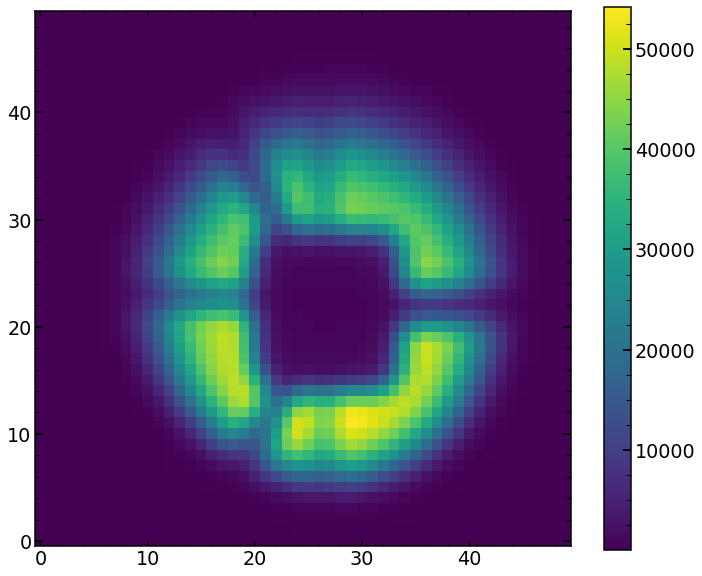

In [948]:
plt.imshow(test_image_top_Dec23_int)
plt.colorbar()

In [949]:
single_number=126
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_right=minchain
model = LN_PFS_single(sci_image_right,var_image_right,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_right)
test_image_right=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_right=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

single_number=66
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_left=minchain
model = LN_PFS_single(sci_image_left,var_image_left,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_left)
test_image_left=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_left=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

single_number=99
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_bottom=minchain
model = LN_PFS_single(sci_image_bottom,var_image_bottom,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_bottom)
test_image_bottom=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_bottom=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

single_number=105
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_top=minchain
model = LN_PFS_single(sci_image_top,var_image_top,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_top)
test_image_top=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_top=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

single_number=102
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_center)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 55593.7863896149
minimal chi2 reduced is: 30.880305758145084
None
zmax: 11
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 63379.3728346771
minimal chi2 reduced is: 35.20554041434448
None
zmax: 11
(number of walkers, number of steps, number of parameters): (186, 35, 31)
minimal likelihood is: 16277.269050442424
minimal chi2 reduced is: 9.038012447664688
None
zmax: 11
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 296391.1249876291
minimal chi2 reduced is: 164.65614554923448
None
zmax: 11
(number of walkers, number of steps, number of parameters): (186, 35, 31)
minimal likelihood is: 59836.74696179391
minimal chi2 reduced is: 33.23748722857301
None
zmax: 11


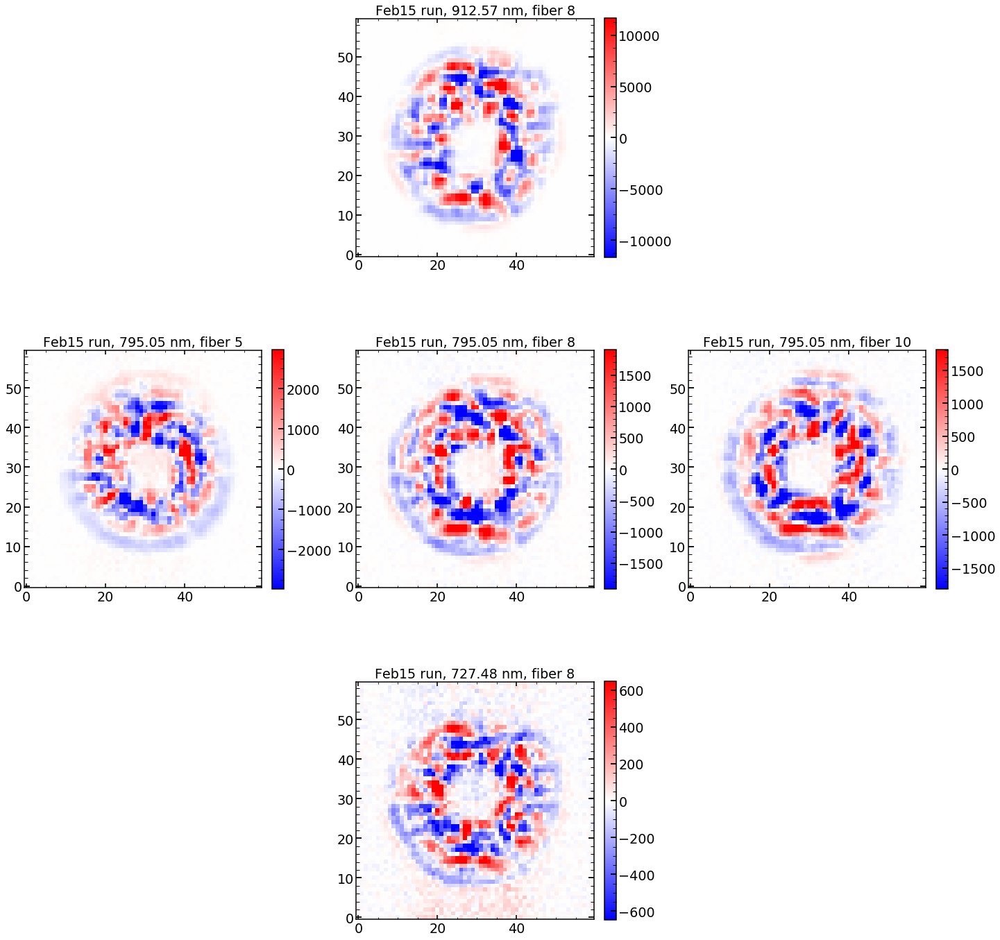

In [822]:
matplotlib.rcParams.update({'font.size':16})
plt.figure(figsize=(20,20))
#plt.suptitle('Residuals - Dec52 run, direct fit to defocused data, scale=5% of max value in the data')

plt.subplot(332)
plt.imshow(test_image_top-sci_image_top,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_top))/20,vmax=np.max(np.abs(sci_image_top))/20)
plt.title('Feb15 run, 912.57 nm, fiber 8')
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(338)
plt.title('Feb15 run, 727.48 nm, fiber 8')
plt.imshow(test_image_bottom-sci_image_bottom,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_bottom))/20,vmax=np.max(np.abs(sci_image_bottom))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(334)
plt.title('Feb15 run, 795.05 nm, fiber 5')
plt.imshow(test_image_left-sci_image_left,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_left))/20,vmax=np.max(np.abs(sci_image_left))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(336)
plt.title('Feb15 run, 795.05 nm, fiber 10')
plt.imshow(test_image_right-sci_image_right,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_right))/20,vmax=np.max(np.abs(sci_image_right))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(335)
plt.title('Feb15 run, 795.05 nm, fiber 8')
plt.imshow(test_image_center-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

#plt.subplots_adjust(top=0.1)
plt.tight_layout(pad=0.4 ,w_pad=0.5, h_pad=0.4)

In [823]:
single_number=126
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
#allparameters_proposal_right_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31+11]
allparameters_proposal_right_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31]
model = LN_PFS_single(sci_image_right,var_image_right,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_right_int)
test_image_right_Dec23_int=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_right=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_right_Dec23_int-sci_image_right)**2/var_image_right))


single_number=66
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
#allparameters_proposal_left_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31+11]
allparameters_proposal_left_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31]
model = LN_PFS_single(sci_image_left,var_image_left,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_left_int)
test_image_left_Dec23_int=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_left=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_left_Dec23_int-sci_image_left)**2/var_image_left))

single_number=99
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
#allparameters_proposal_bottom_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31+11]
allparameters_proposal_bottom_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31]
model = LN_PFS_single(sci_image_bottom,var_image_bottom,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_bottom_int)
test_image_bottom_Dec23_int=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_bottom=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_bottom_Dec23_int-sci_image_bottom)**2/var_image_bottom))

single_number=105
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
#allparameters_proposal_top_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31+11]
allparameters_proposal_top_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31]
model = LN_PFS_single(sci_image_top,var_image_top,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_top_int)
test_image_top_Dec23_int=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_top=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_top_Dec23_int-sci_image_top)**2/var_image_top))

single_number=102
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
#allparameters_proposal_center_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31+11]
allparameters_proposal_center_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31]
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_center_int)
test_image_center_Dec23_int=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_center_Dec23_int-sci_image_center)**2/var_image_center))

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 55593.7863896149
minimal chi2 reduced is: 30.880305758145084
None
zmax: 11
self.save1
104.4620959565385
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 63379.3728346771
minimal chi2 reduced is: 35.20554041434448
None
zmax: 11
self.save1
287.06642887196045
(number of walkers, number of steps, number of parameters): (186, 35, 31)
minimal likelihood is: 16277.269050442424
minimal chi2 reduced is: 9.038012447664688
None
zmax: 11
self.save1
21.360892375820985
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 296391.1249876291
minimal chi2 reduced is: 164.65614554923448
None
zmax: 11
self.save1
705.9346679709668
(number of walkers, number of steps, number of parameters): (186, 35, 31)
minimal likelihood is: 59836.74696179391
minimal chi2 reduced is: 33.23748722857301
None
zmax: 11
self.save1
107.172926

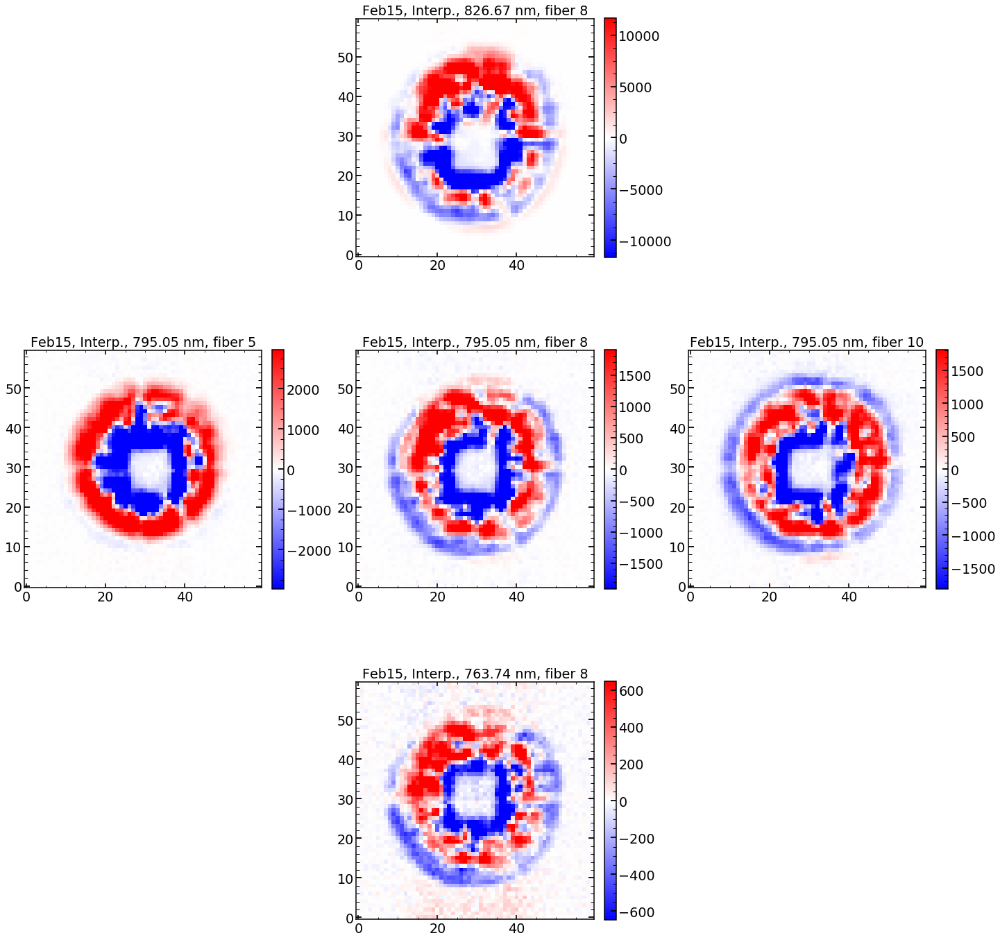

In [825]:
matplotlib.rcParams.update({'font.size':16})
plt.figure(figsize=(20,20))

plt.subplot(332)
plt.imshow(test_image_top_Dec23_int-sci_image_top,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_top))/20,vmax=np.max(np.abs(sci_image_top))/20)
plt.title('Feb15, Interp., 826.67 nm, fiber 8')
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(338)
plt.title('Feb15, Interp., 763.74 nm, fiber 8')
plt.imshow(test_image_bottom_Dec23_int-sci_image_bottom,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_bottom))/20,vmax=np.max(np.abs(sci_image_bottom))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(334)
plt.title('Feb15, Interp., 795.05 nm, fiber 5')
plt.imshow(test_image_left_Dec23_int-sci_image_left,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_left))/20,vmax=np.max(np.abs(sci_image_left))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(336)
plt.title('Feb15, Interp., 795.05 nm, fiber 10')
plt.imshow(test_image_right_Dec23_int-sci_image_right,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_right))/20,vmax=np.max(np.abs(sci_image_right))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(335)
plt.title('Feb15, Interp., 795.05 nm, fiber 8')
plt.imshow(test_image_center_Dec23_int-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.tight_layout(pad=0.4 ,w_pad=0.5, h_pad=0.4)

### verification - individual images - Ne

In [869]:
print(results_of_fit_many_Ne['m35'].loc[78][0])
print(results_of_fit_many_Ne['m35'].loc[77][0])
print(results_of_fit_many_Ne['m35'].loc[74][0])

print(results_of_fit_many_Ne['m35'].loc[68][0])
print(results_of_fit_many_Ne['m35'].loc[86][0])

26.418133398717988
25.46927509016821
26.67601360423272
24.76991757835903
26.80106940895076


In [870]:
finalNe_Feb2019.loc[77]

fiber                            8
xc                            2122
yc                             797
wavelength               693.13116
close                            1
lamp                            Ne
xc_effective                  2191
old_index_approx                50
superold_index_approx          nan
Name: 77, dtype: object

In [871]:
list_of_single_number_Ne=[68,74,77,78,86]

In [872]:
date='Feb15'

arc='Ne'
obs=12397
single_number=86
sci_image_right =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_right =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
single_number=68
sci_image_left =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_left =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
single_number=74
sci_image_bottom =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_bottom =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
single_number=78
sci_image_top =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_top =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
single_number=77
sci_image_center =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

In [873]:
single_number=86
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_right=minchain
model = LN_PFS_single(sci_image_right,var_image_right,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_right)
test_image_right=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_right=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

single_number=68
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_left=minchain
model = LN_PFS_single(sci_image_left,var_image_left,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_left)
test_image_left=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_left=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

single_number=74
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_bottom=minchain
model = LN_PFS_single(sci_image_bottom,var_image_bottom,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_bottom)
test_image_bottom=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_bottom=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

single_number=78
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_top=minchain
model = LN_PFS_single(sci_image_top,var_image_top,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_top)
test_image_top=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_top=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

single_number=77
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_center)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 509348.1024138076
minimal chi2 reduced is: 407.4703780822605
None
zmax: 11
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 391464.1621814756
minimal chi2 reduced is: 313.1631854795626
None
zmax: 11
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 188887.7294066292
minimal chi2 reduced is: 151.10233521178247
None
zmax: 11
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 45586.14178426311
minimal chi2 reduced is: 36.461483791345444
None
zmax: 11
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 244391.61810160743
minimal chi2 reduced is: 195.5052394937194
None
zmax: 11


In [874]:
list_of_single_number_Ne[1]

74

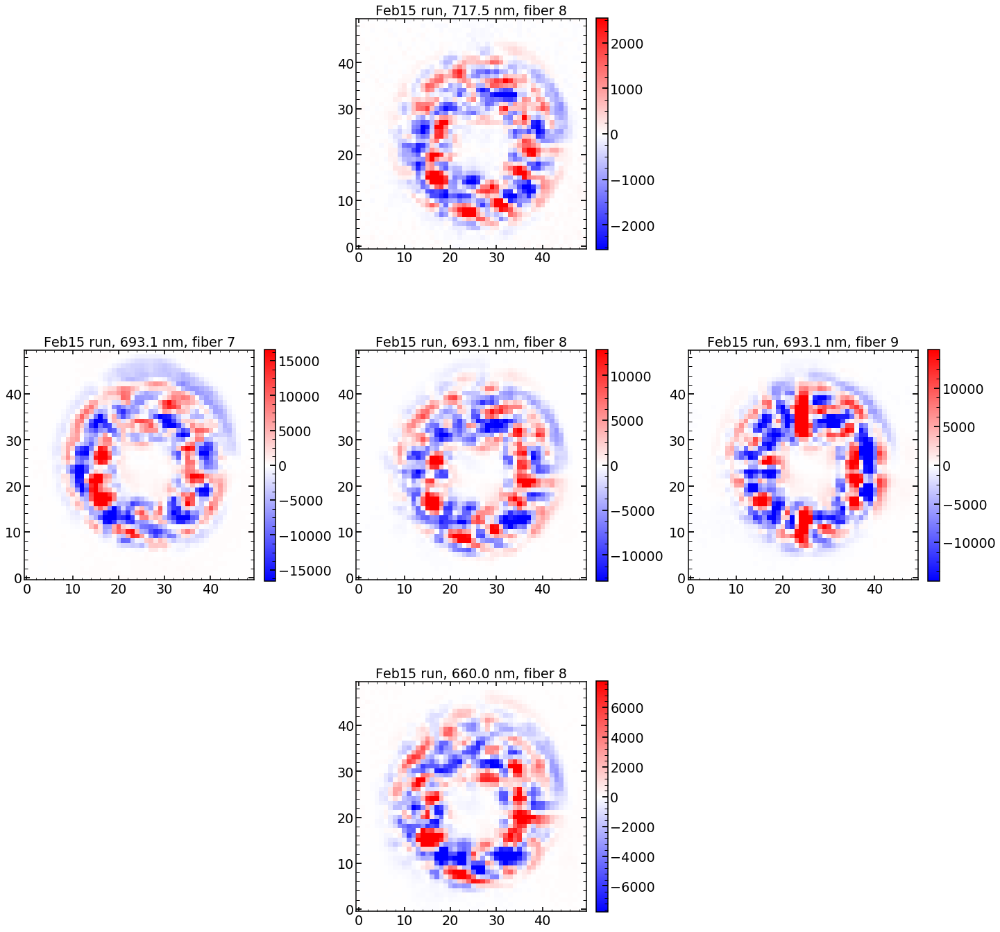

In [875]:
# change titles

matplotlib.rcParams.update({'font.size':16})
plt.figure(figsize=(20,20))
#plt.suptitle('Residuals - Dec52 run, direct fit to defocused data, scale=5% of max value in the data')

plt.subplot(332)
plt.imshow(test_image_top-sci_image_top,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_top))/20,vmax=np.max(np.abs(sci_image_top))/20)
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[3]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[1]]['fiber'])
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(338)
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[1]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[3]]['fiber'])
plt.imshow(test_image_bottom-sci_image_bottom,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_bottom))/20,vmax=np.max(np.abs(sci_image_bottom))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(334)
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[0]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[0]]['fiber'])
plt.imshow(test_image_left-sci_image_left,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_left))/20,vmax=np.max(np.abs(sci_image_left))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(336)
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[4]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[4]]['fiber'])
plt.imshow(test_image_right-sci_image_right,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_right))/20,vmax=np.max(np.abs(sci_image_right))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(335)
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['fiber'])
plt.imshow(test_image_center-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

#plt.subplots_adjust(top=0.1)
plt.tight_layout(pad=0.4 ,w_pad=0.5, h_pad=0.4)

#### interpolation

In [876]:
single_number=list_of_single_number_Ne[4]
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
#allparameters_proposal_right_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31+11]
allparameters_proposal_right_int=results_of_fit_many_interpolation_Ne['m35'].loc[single_number][:31]
model = LN_PFS_single(sci_image_right,var_image_right,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_right_int)
test_image_right_Dec23_int=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_right=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_right_Dec23_int-sci_image_right)**2/var_image_right))


single_number=list_of_single_number_Ne[0]
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
#allparameters_proposal_left_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31+11]
allparameters_proposal_left_int=results_of_fit_many_interpolation_Ne['m35'].loc[single_number][:31]
model = LN_PFS_single(sci_image_left,var_image_left,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_left_int)
test_image_left_Dec23_int=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_left=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_left_Dec23_int-sci_image_left)**2/var_image_left))

single_number=list_of_single_number_Ne[3]
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
#allparameters_proposal_bottom_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31+11]
allparameters_proposal_bottom_int=results_of_fit_many_interpolation_Ne['m35'].loc[single_number][:31]
model = LN_PFS_single(sci_image_bottom,var_image_bottom,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_bottom_int)
test_image_bottom_Dec23_int=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_bottom=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_bottom_Dec23_int-sci_image_bottom)**2/var_image_bottom))

single_number=list_of_single_number_Ne[3]
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
#allparameters_proposal_top_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31+11]
allparameters_proposal_top_int=results_of_fit_many_interpolation_Ne['m35'].loc[single_number][:31]
model = LN_PFS_single(sci_image_top,var_image_top,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_top_int)
test_image_top_Dec23_int=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_top=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_top_Dec23_int-sci_image_top)**2/var_image_top))

single_number=list_of_single_number_Ne[1]
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
#allparameters_proposal_center_int=results_of_fit_many_interpolation_HgAr['p35'].loc[single_number][:31+11]
allparameters_proposal_center_int=results_of_fit_many_interpolation_Ne['m35'].loc[single_number][:31]
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_center_int)
test_image_center_Dec23_int=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_center_Dec23_int-sci_image_center)**2/var_image_center))

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 509348.1024138076
minimal chi2 reduced is: 407.4703780822605
None
zmax: 11
484.58909880019894
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 391464.1621814756
minimal chi2 reduced is: 313.1631854795626
None
zmax: 11
641.3015426159203
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 45586.14178426311
minimal chi2 reduced is: 36.461483791345444
None
zmax: 11
1603.7902586215846
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 45586.14178426311
minimal chi2 reduced is: 36.461483791345444
None
zmax: 11
106.64985920545737
(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 188887.7294066292
minimal chi2 reduced is: 151.10233521178247
None
zmax: 11
482.2919368358448


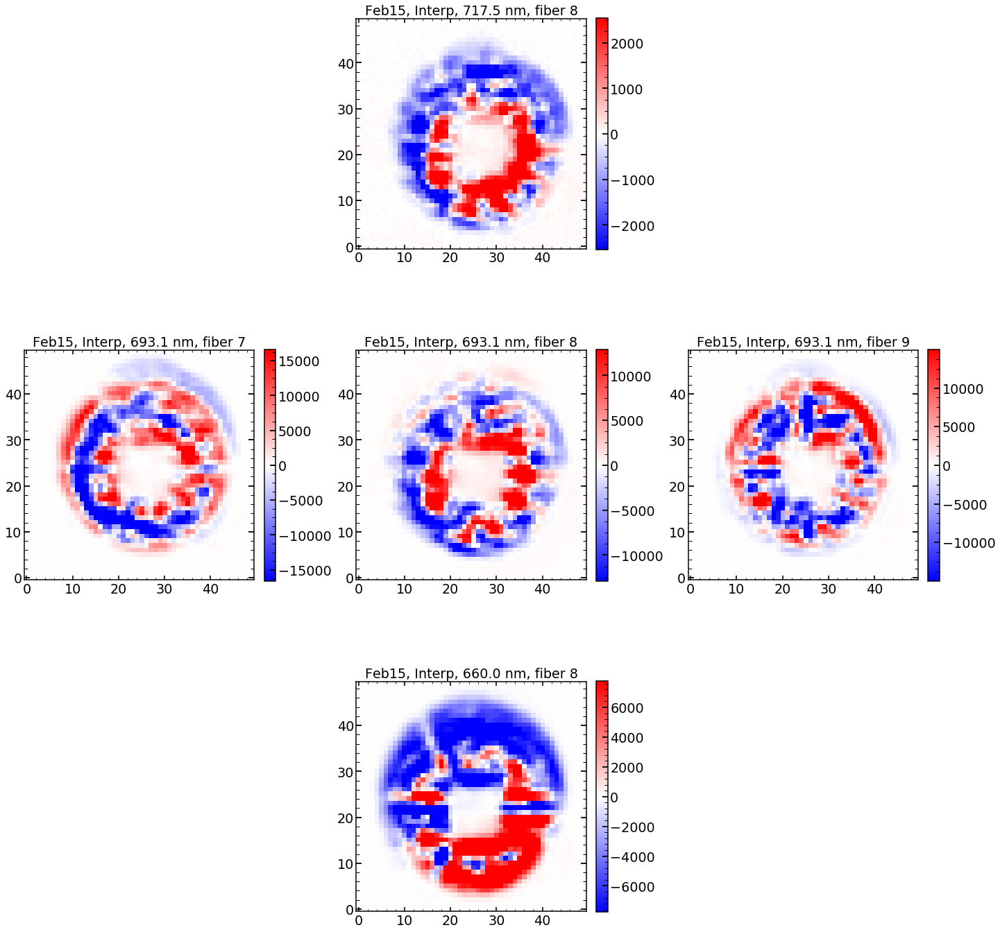

In [877]:
matplotlib.rcParams.update({'font.size':16})
plt.figure(figsize=(20,20))

plt.subplot(332)
plt.imshow(test_image_top_Dec23_int-sci_image_top,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_top))/20,vmax=np.max(np.abs(sci_image_top))/20)
plt.title('Feb15, Interp, '+finalNe_Feb2019.loc[list_of_single_number_Ne[3]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[1]]['fiber'])
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(338)
plt.title('Feb15, Interp, '+finalNe_Feb2019.loc[list_of_single_number_Ne[1]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[3]]['fiber'])
plt.imshow(test_image_bottom_Dec23_int-sci_image_bottom,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_bottom))/20,vmax=np.max(np.abs(sci_image_bottom))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(334)
plt.title('Feb15, Interp, '+finalNe_Feb2019.loc[list_of_single_number_Ne[0]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[0]]['fiber'])
plt.imshow(test_image_left_Dec23_int-sci_image_left,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_left))/20,vmax=np.max(np.abs(sci_image_left))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(336)
plt.title('Feb15, Interp, '+finalNe_Feb2019.loc[list_of_single_number_Ne[4]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[4]]['fiber'])
plt.imshow(test_image_right_Dec23_int-sci_image_right,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_right))/20,vmax=np.max(np.abs(sci_image_right))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(335)
plt.title('Feb15, Interp, '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['fiber'])
plt.imshow(test_image_center_Dec23_int-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

plt.tight_layout(pad=0.4 ,w_pad=0.5, h_pad=0.4)

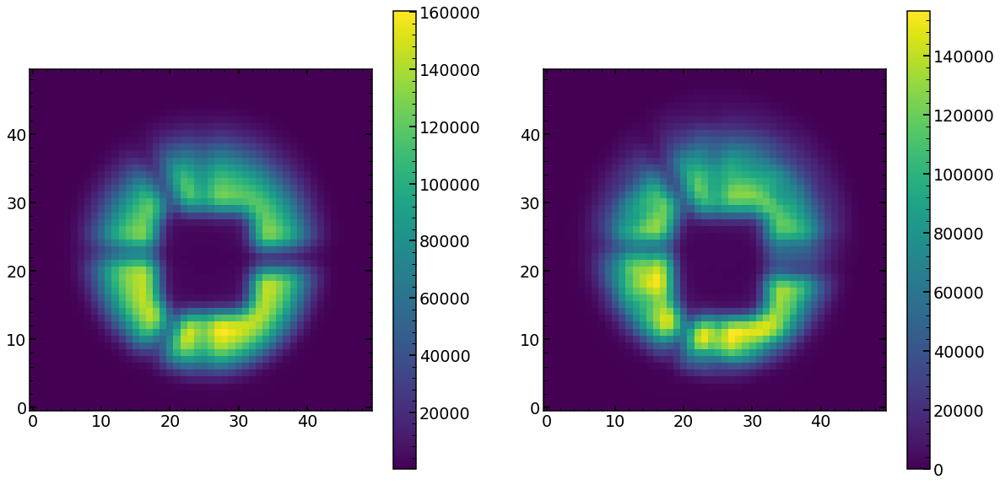

In [878]:
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(test_image_bottom_Dec23_int)
plt.colorbar()
plt.subplot(122)
plt.imshow(sci_image_bottom)
plt.colorbar()


# Focus (Feb16)

## Scripts

In [566]:
# select all and then remove the fibers 2 and 3

list_of_HgAr_to_analyze_all=finalHgAr_Feb2019.index[(finalHgAr_Feb2019['fiber'].values.astype(int)<=15)&(finalHgAr_Feb2019['fiber'].values.astype(int)>=0)
                                        &(finalHgAr_Feb2019['close'].values.astype(int)==1)&(finalHgAr_Feb2019['wavelength'].values.astype(float)<1000)&(finalHgAr_Feb2019['wavelength'].values.astype(float)>600)]
print(len(list_of_HgAr_to_analyze_all))

list_of_HgAr_to_not_analyze_2_3=finalHgAr_Feb2019.index[(finalHgAr_Feb2019['fiber'].values.astype(int)<=3)&(finalHgAr_Feb2019['fiber'].values.astype(int)>=2)
                                        &(finalHgAr_Feb2019['close'].values.astype(int)==1)&(finalHgAr_Feb2019['wavelength'].values.astype(float)<1000)&(finalHgAr_Feb2019['wavelength'].values.astype(float)>600)]

# remove the spots from fibers 2 and 3 as they are too close together
list_of_HgAr_to_analyze_fourth=np.setdiff1d(list_of_HgAr_to_analyze_all,list_of_HgAr_to_not_analyze_2_3)

print(len(list_of_HgAr_to_analyze_fourth))

list_of_HgAr_to_analyze_fourth_10=np.split(list_of_HgAr_to_analyze_fourth,10)

80
70


In [642]:
#MPI
for i in range(len(list_of_HgAr_to_analyze_fourth_10)):
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T01'+str(i)+'Feb_focus.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=4 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 13:59:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    for single_spot in list_of_HgAr_to_analyze_fourth_10[i]:
        for obs in [11748]:
            file.write("mpirun python /home/ncaplar/Code/ZernikeSingle_Feb_MPI01_focus.py "+str(obs)+" "+str(single_spot)+" 40 5 HgAr\n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/FebScriptToSubmitScriptsTiger01_focus'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
#for obs in [1,2,3,4]:
#    for single_spot in [35,45,55,75,85,95]:
#        file.write('sbatch /home/ncaplar/Scripts/T'+str(obs)+'S'+str(single_spot)+'Sep_P.sh \n')

for i in range(len(list_of_HgAr_to_analyze_fourth_10)):
    file.write('sbatch /home/ncaplar/Scripts/T01'+str(i)+'Feb_focus.sh \n')

file.close()

## Looking at the single image

In [569]:
with open('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Dataframes/finalHgAr_Feb2019.pkl', 'rb') as f:
    finalHgAr_Feb2019=pickle.load(f)

date='Feb16'
obs=str(11748)
single_number='102'
image_index=int(single_number)
eps=10
arc='HgAr'


STAMPS_FOLDER="/Users/nevencaplar/Documents/PFS/ReducedData/Data_Feb_5/Stamps_cleaned/"

if arc=="HgAr":
    single_number_focus=8603
elif arc=="Ne":
    single_number_focus=8693    
else:
    print("Not recognized arc-line")

if arc=='HgAr':
    obs_possibilites=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
elif arc=='Ne':
    obs_possibilites=np.array([8552,8555,8558,8561,8564,8567,8570,8573,8603,8600,8606,8609,8612,8615,8618,8621,8624,8627])+90
    
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']
labelInput=label[list(obs_possibilites).index(int(obs))]
print(labelInput)
if obs==8600:
    print("Not implemented for December 2018 data")
else:
    sci_image =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    var_image =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
    #sci_image_focus_large =np.load(STAMPS_FOLDER+'sci'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')
    #var_image_focus_large =np.load(STAMPS_FOLDER+'var'+str(single_number_focus)+str(single_number)+str(arc)+'_Stacked_large.npy')

if arc=="HgAr":
    finalArc=finalHgAr_Feb2019
elif arc=="Ne":
    finalArc=finalNe    
else:
    print("Not recognized arc-line")    
        
finalArc.loc[int(single_number)]

0d


fiber                           8
xc                           2133
yc                           1955
wavelength               795.0522
close                           1
lamp                         HgAr
xc_effective                 2202
old_index_approx               66
superold_index_approx        55.0
Name: 102, dtype: object

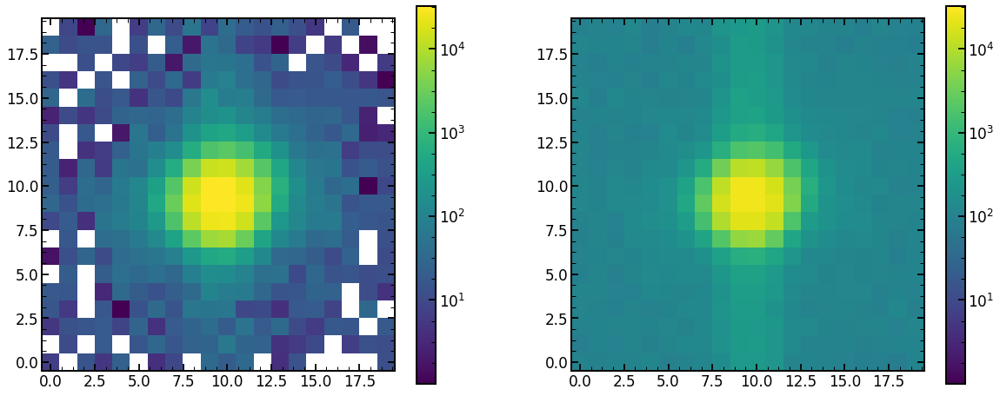

In [570]:
plt.figure(figsize=(20,8))
plt.subplot(121)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(122)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar()
cbar.set_ticks([10,10**2,10**3,10**4,10**5])


In [571]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

minchain,like_min=single_analysis.create_likelihood()

(number of walkers, number of steps, number of parameters): (186, 5, 31)
minimal likelihood is: 869.445608976323
minimal chi2 reduced is: 4.310614552419894


In [572]:
print(minchain.shape)

if len(minchain)==42:
    columns=columns22
    
    
    
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns[0:8])
print(dfz22)
dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][8:len(columns)]]),columns=columns[8:])

dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][8:18]]),columns=columns[8:18])
print(dfglobal1)

dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][18:len(columns)]]),columns=columns[18:])
print(dfglobal2)


(31,)
         z4      z5        z6        z7        z8        z9       z10  \
0 -0.672416 -0.1305 -0.406985  0.283032 -0.015249 -0.026735 -0.303919   

        z11  
0 -0.358828  
    hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy  \
0  0.681352   0.077112  0.005523  0.011925  0.059999     0.012756   

   radiometricEffect  radiometricExponent    x_ilum   y_ilum  
0           0.120568             0.689581  0.968483  0.99315  
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0 -0.006576 -0.065229                       0.821551   0.099492   

   frd_lorentz_factor  det_vert  slitHolder_frac_dx  grating_lines  \
0            0.546187  1.016796           -0.020801   60992.967301   

   scattering_slope  scattering_amplitude  pixel_effect   fiber_r      flux  
0            2.8104              0.006233      0.350739  1.840024  0.996186  


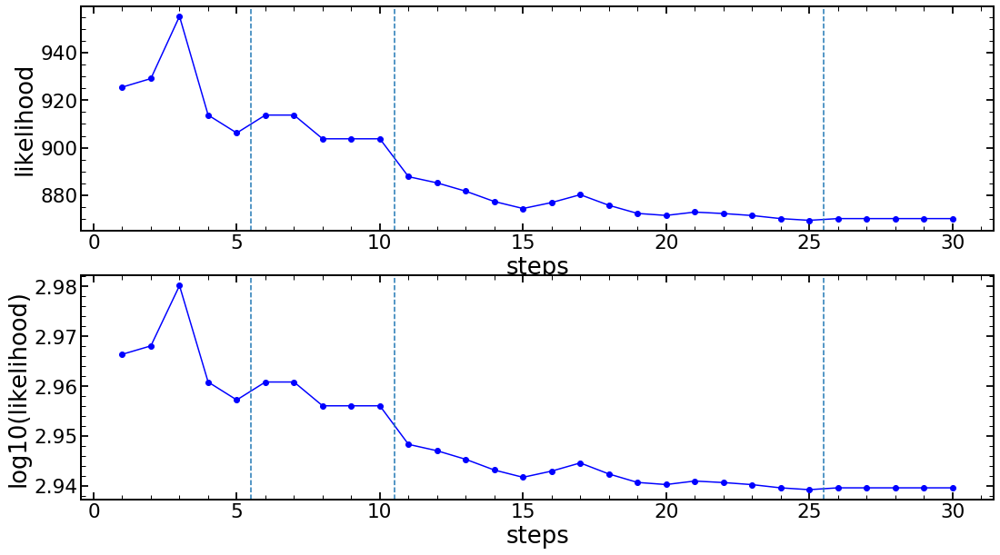

In [573]:
size=chain0_Emcee3.shape[1]
matplotlib.rcParams.update({'font.size': 18})
plt.figure(figsize=(18,10))
plt.subplot(211)
plt.plot(np.linspace(1,len(like_min),len(like_min)),like_min,'blue',ls='-',marker='o')
plt.ylabel('likelihood')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(size*2+0.5,ls='--')
plt.axvline(size*5+0.5,ls='--')
plt.subplot(212)
plt.plot(np.linspace(1,len(like_min),len(like_min)),np.log10(like_min),'blue',ls='-',marker='o')
plt.ylabel('log10(likelihood)')
plt.xlabel('steps')
plt.axvline(size+0.5,ls='--')
plt.axvline(2*size+0.5,ls='--')
plt.axvline(5*size+0.5,ls='--')

In [574]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=11)   
       
model(minchain)

zmax: 11


-862.4683842629838

In [575]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
r_ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'r_ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')

wf=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf.npy') 
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 
u_manual=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'u_manual.npy')
wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')   
expwf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'expwf_grid.npy')      

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled.npy')
optPsf_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_fiber_convolved.npy')

optPsf_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_downsampled_scattered.npy')
res_init=np.load(TESTING_FINAL_IMAGES_FOLDER+'res_init.npy')
res=np.load(TESTING_FINAL_IMAGES_FOLDER+'res.npy')


optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled

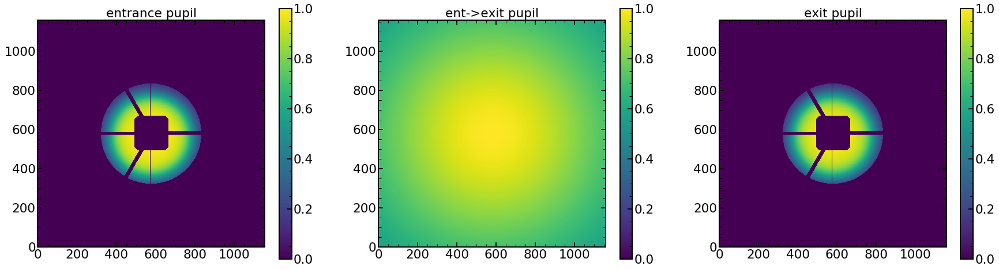

In [576]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

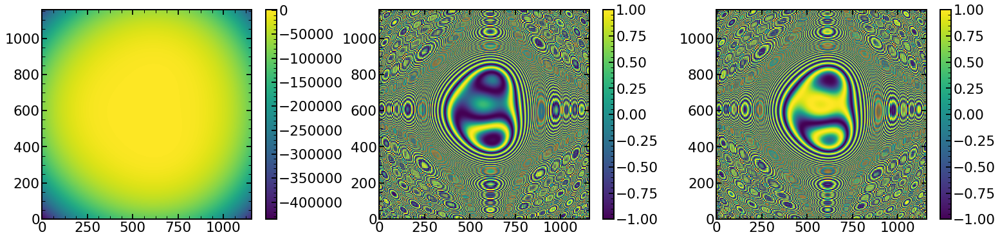

In [577]:
plt.figure(figsize=(36,6))
plt.subplot(141)
plt.imshow(wf_full)
plt.colorbar()

plt.subplot(142)
plt.imshow(np.real(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

plt.subplot(143)
plt.imshow(np.imag(np.exp(2j*np.pi * wf_full/800)))
plt.colorbar()

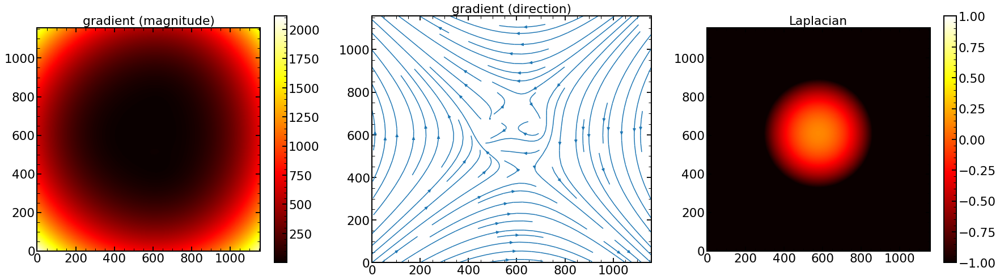

In [578]:
plt.figure(figsize=(30,8))
plt.subplot(131)
vgrad = np.gradient(wf_full)
fulgrad = np.sqrt(vgrad[0]**2 + vgrad[1]**2)
plt.title('gradient (magnitude)')
plt.imshow(fulgrad,cmap=plt.get_cmap('hot'), vmin = np.amin(fulgrad),vmax = np.amax(fulgrad))  
plt.colorbar()
plt.subplot(132)
x, y = range(0, len(wf_full)), range(0,len(wf_full))
xi, yi = np.meshgrid(x, y)
plt.title('gradient (direction)')
plt.streamplot(xi, yi, vgrad[0], vgrad[1])
plt.subplot(133)
laplace_of_wf = scipy.ndimage.filters.laplace(wf_full)
plt.title('Laplacian')
plt.imshow(laplace_of_wf,cmap=plt.get_cmap('hot'), vmin = -1,vmax = 1) 
plt.colorbar()

Text(0.5,1,'Residual')

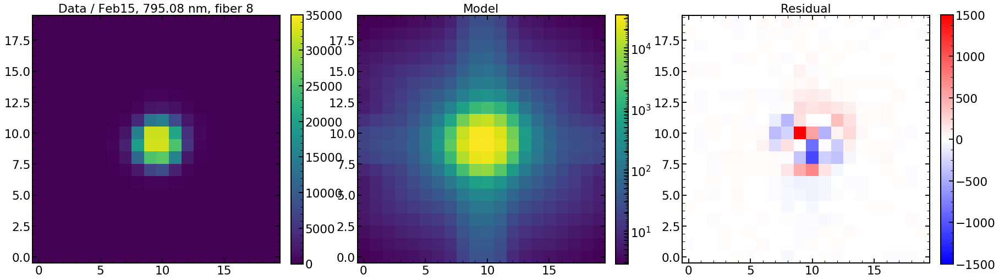

In [579]:
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(sci_image,vmax=35000)
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / Feb15, 795.08 nm, fiber 8')
plt.subplot(1,3,2)
plt.imshow(res_iapetus,vmax=35000,norm=LogNorm())
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(sci_image-res_iapetus,vmin=-30000/20,vmax=30000/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

In [580]:
print(np.sum(var_image[0:3]),np.sum(res_iapetus[0:3]),np.sum(sci_image[0:3]))

8174.4297 729.5627671890777 787.7394


In [581]:
print(np.sum(var_image[-3:]),np.sum(res_iapetus[-3:]),np.sum(sci_image[-3:]))

8102.891 618.1422037380275 718.24133


Text(0.5,1,'Residual')

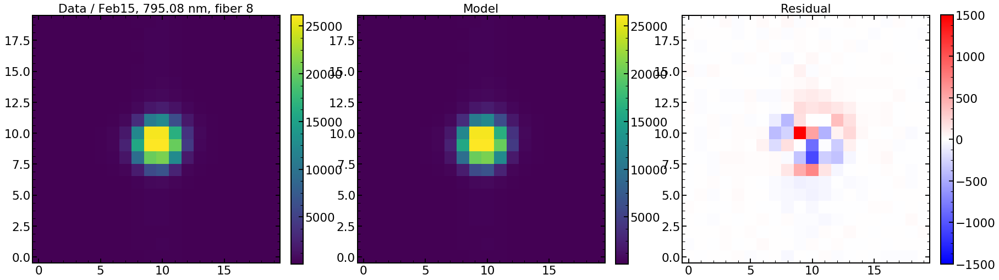

In [582]:
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(var_image,vmax=np.max(var_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / Feb15, 795.08 nm, fiber 8')
plt.subplot(1,3,2)
plt.imshow(var_image,vmax=np.max(var_image))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(sci_image-res_iapetus,vmin=-30000/20,vmax=30000/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

chi**2 reduced is: 4.275728416658656
Abs of residual divided by total flux is: 0.04103330959784643
Abs of residual divided by largest value of a flux in the image is: 0.050845309508075205


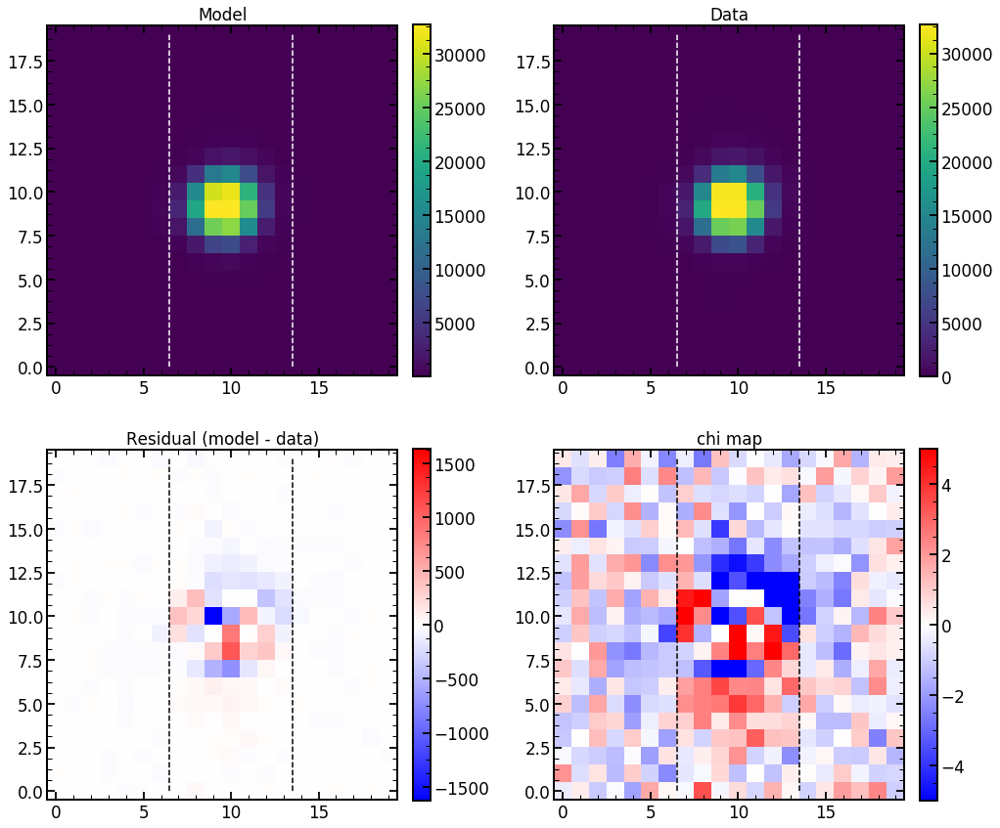

In [583]:
matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot()

4.275728416658656
chi**2 reduced is: 4.275728416658656
Abs of residual divided by total flux is: 0.04103330959784643
Abs of residual divided by largest value of a flux in the image is: 0.050845309508075205


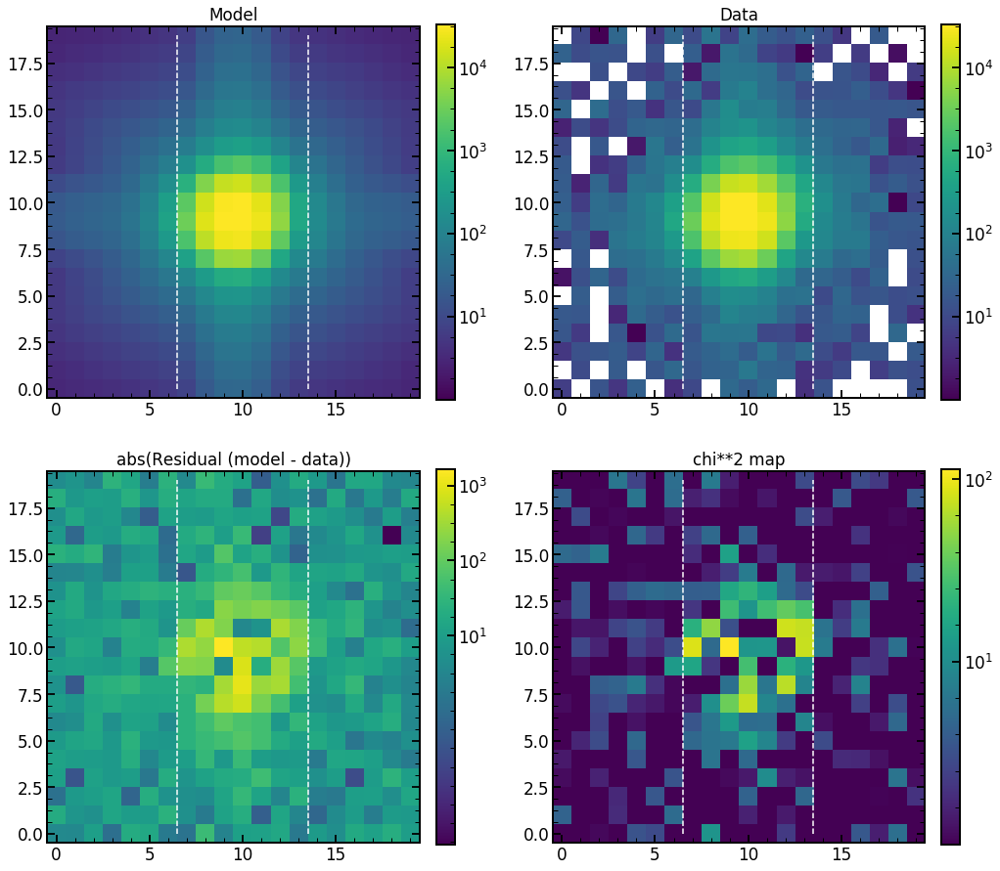

In [584]:
single_analysis.create_basic_comparison_plot_log()

4.275728416658656
chi**2 reduced is: 4.275728416658656
Abs of residual divided by total flux is: 0.04103330959784643
Abs of residual divided by largest value of a flux in the image is: 0.050845309508075205


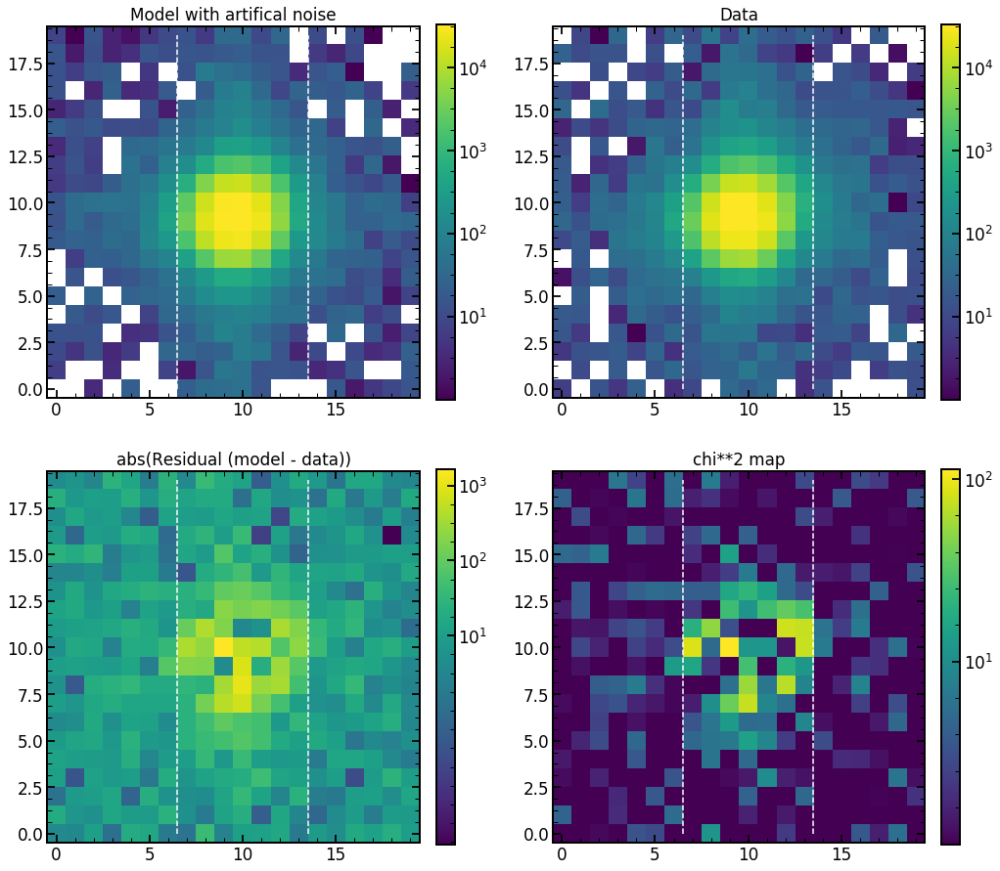

In [585]:
single_analysis.create_basic_comparison_plot_log_artifical()

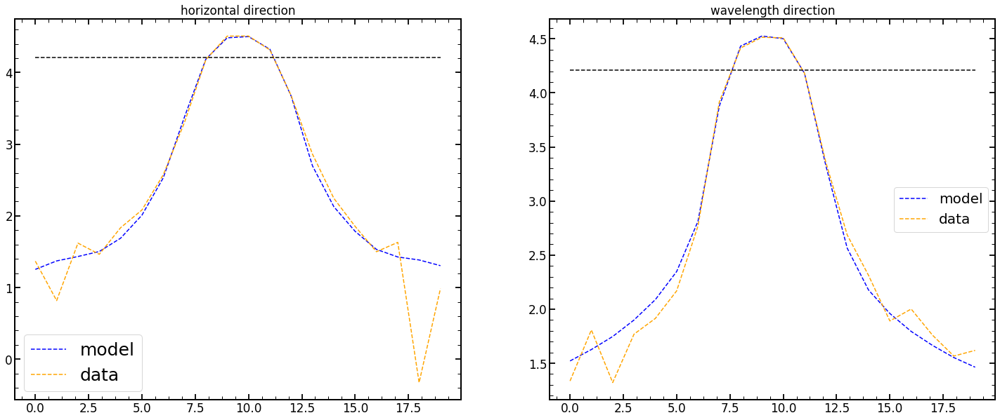

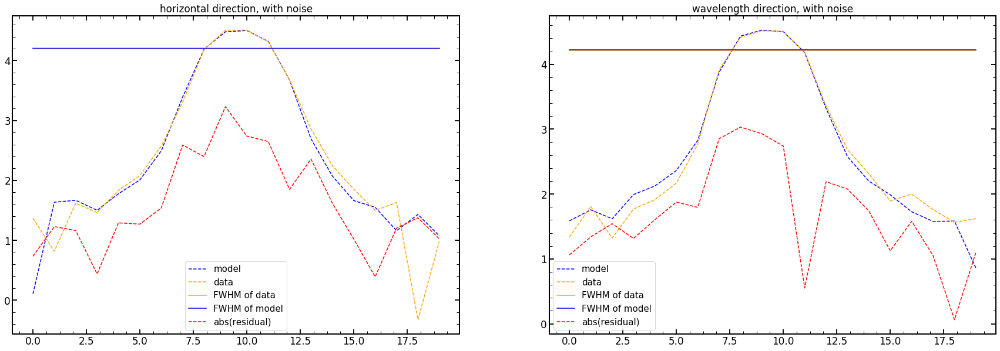

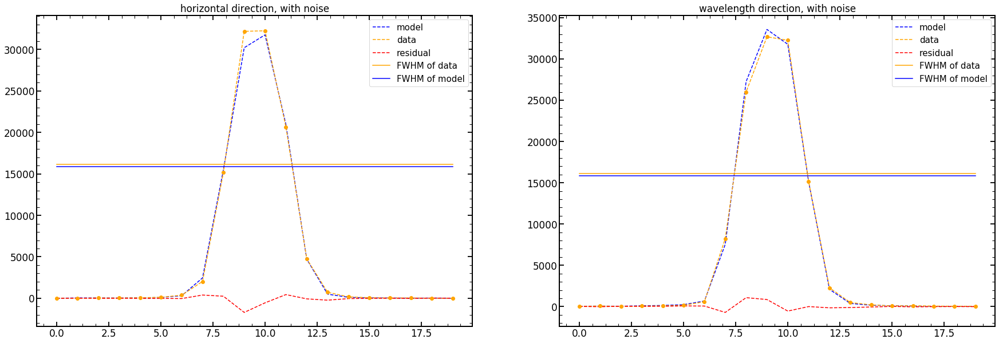

In [586]:
single_analysis.create_cut_plots()

## Testing correctness of detector_Map

In [591]:
from astropy.io import fits

In [593]:
dm=fits.open('/Users/nevencaplar/Documents/PFS/DetectorMap/detectorMap-sim-1-r.fits')

In [625]:
xpos_singlefiber=np.array(dm[3].data)[np.array(dm[3].data)['index']==30][['knot','value']]
ypos_singlefiber=np.array(dm[3].data)[np.array(dm[3].data)['index']==30][['knot','value']]
lamda_pos_singlefiber=np.array(dm[4].data)[np.array(dm[4].data)['index']==30][['knot','value']]

In [626]:
lamda_pos_singlefiber

array([(   0., 620.7515 ), (   1., 620.8369 ), (   2., 620.9223 ), ...,
       (4173., 977.1305 ), (4174., 977.21594), (4175., 977.30133)],
      dtype=[('knot', '>f4'), ('value', '>f4')])

In [630]:
finalHgAr_Feb2019[finalHgAr_Feb2019['wavelength']=='826.6699']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
7,0,272,2354,826.6699,0.5,HgAr,272,7,40.0
19,1,483,2346,826.6699,0.5,HgAr,483,19,41.0
31,2,865,2334,826.6699,0.5,HgAr,865,31,42.0
43,3,908,2333,826.6699,0.5,HgAr,908,31,42.0
55,4,1241,2326,826.6699,0.5,HgAr,1241,31,42.0
...,...,...,...,...,...,...,...,...,...
139,11,2655,2329,826.6699,0.5,HgAr,2724,79,46.0
151,12,2845,2333,826.6699,0.5,HgAr,2914,91,47.0
163,13,3345,2348,826.6699,0.5,HgAr,3414,103,48.0
175,14,3642,2361,826.6699,0.5,HgAr,3711,103,48.0


In [631]:
xpos_singlefiber

array([(   0., 3837.8633), (   1., 3837.849 ), (   2., 3837.835 ), ...,
       (4173., 3840.4304), (4174., 3840.4468), (4175., 3840.4631)],
      dtype=[('knot', '>f4'), ('value', '>f4')])

In [641]:
lamda_dm=np.mean(lamda_pos_singlefiber['value'][(lamda_pos_singlefiber['value']<826.6699+1)&(lamda_pos_singlefiber['value']>826.6699-1)])
y_dm=np.mean(ypos_singlefiber['knot'][(lamda_pos_singlefiber['value']<826.6699+1)&(lamda_pos_singlefiber['value']>826.6699-1)])
x_dm=np.mean(xpos_singlefiber['value'][(lamda_pos_singlefiber['value']<826.6699+1)&(lamda_pos_singlefiber['value']>826.6699-1)])
[x_dm,y_dm,lamda_dm]


[3826.6074, 2411.0, 826.6537]

# Testing / Interdependence of parameters

In [81]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=11)   
       
model(minchain)

zmax: 11


-86366.61239701326

69.08583038230516
chi**2 reduced is: 69.08583038230516
Abs of residual divided by total flux is: 0.06333440211517713
Abs of residual divided by largest value of a flux in the image is: 0.17441752616111833


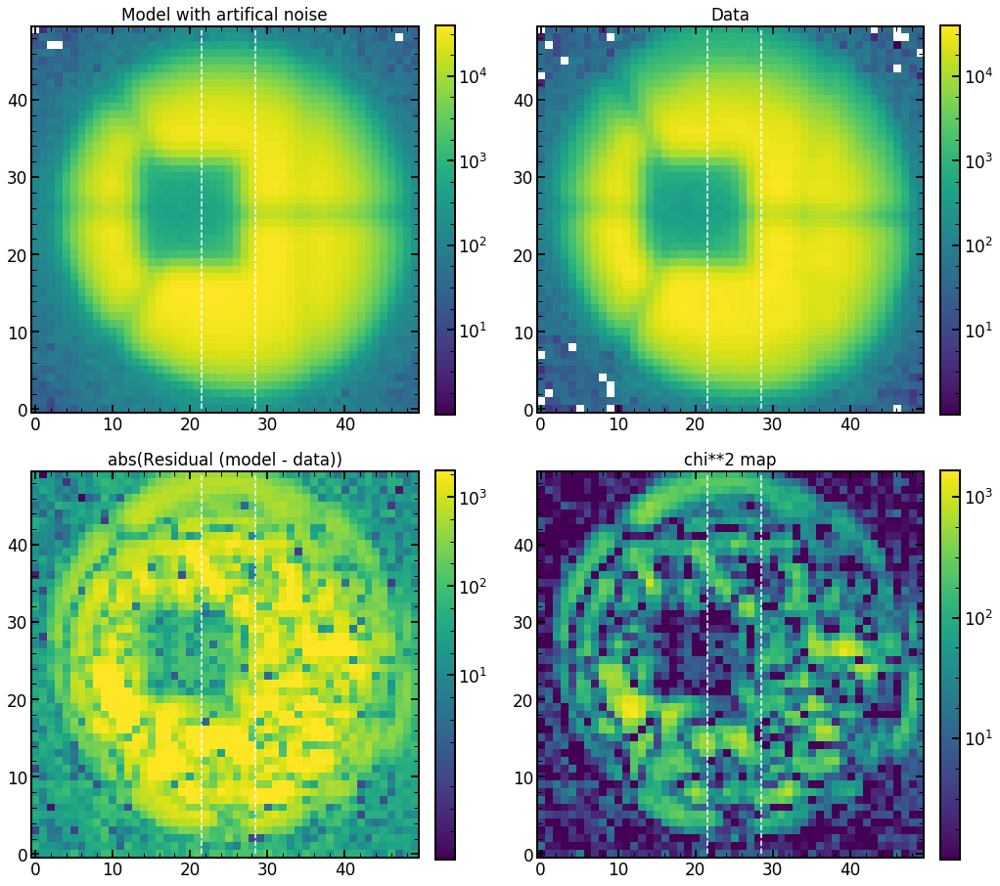

In [82]:
single_analysis.create_basic_comparison_plot_log_artifical()

In [ ]:
if obs=='8600':
    model = LN_PFS_single(sci_image,var_image,dithering=2,save=1)
else:
    model = LN_PFS_single(sci_image,var_image,dithering=1,save=1,zmax=11)   
       
        
minchain_modified=np.copy(minchain)
model(minchain_modified)

In [ ]:
single_analysis.create_basic_comparison_plot_log_artifical()

In [ ]:
x=chain0_Emcee3[:,:,0].ravel()
y=chain0_Emcee3[:,:,20].ravel()
z=likechain0_Emcee3.ravel()/np.max(likechain0_Emcee3)

In [ ]:
np.unique([0,0],[0,0])

## Dependence in parameters space

### developing

In [ ]:
def split(a, n):
    k, m = divmod(len(a), n)
    return (a[i * k + min(i, m):(i + 1) * k + min(i + 1, m)] for i in range(n))

def find_min(arr):
    res=[]
    for i in range(len(arr)):
        res.append(arr[i][abs(arr[i][:,2])==np.min(abs(arr[i][:,2]))])
        
    return res

chain0_Emcee2,likechain0_Emcee2=single_analysis.create_chains_Emcee_2()

# put 2 parameters and likelihood in a single array
test_array_Emcee2=np.unique(np.transpose(np.array([chain0_Emcee2[:,:,0].ravel(),chain0_Emcee2[:,:,20].ravel(),likechain0_Emcee2.ravel()])),axis=0)
test_array_Emcee2=test_array_Emcee2[test_array_Emcee2[:,2]!=-np.inf]
# split size determined so that each bin on the end has around 10 points 
split_size=int(np.round(np.sqrt(test_array_Emcee2.shape[0]/10)  ) )
# sort by first parameters
test_array_sorted_by_0=test_array_Emcee2[np.argsort(test_array_Emcee2[:, 0])]
# split in roughly 27 arrays with same number of objects
test_array_sorted_by_0_split=np.array(list(split(test_array_sorted_by_0,split_size)))
res=[]
for j in range(len(test_array_sorted_by_0_split)):
    # within these arrays do one more split
    test_array_sorted_by_0_split_sorted_by_1_split=np.array(list(split(test_array_sorted_by_0_split[j][np.argsort(test_array_sorted_by_0_split[j][:, 1])],split_size)))
    res.append(find_min(test_array_sorted_by_0_split_sorted_by_1_split))

res=np.array(np.split(np.array(res).ravel(),len(np.array(res).ravel())/3))
res[:,2]=res[:,2]/np.max(res[:,2])
res_Emcee2=res

#best results, arrange in a split_size x split_size array
min_res_split_Emcee2=np.array(list(split(res_Emcee2,split_size)))
min_min_res_split_Emcee2=np.array(find_min(min_res_split_Emcee2)).ravel().reshape(split_size,3)

In [ ]:
chain0_Emcee1,likechain0_Emcee1=single_analysis.create_chains_Emcee_1()

# put 2 parameters and likelihood in a single array
test_array_Emcee1=np.unique(np.transpose(np.array([chain0_Emcee1[:,:,0].ravel(),chain0_Emcee1[:,:,20].ravel(),likechain0_Emcee1.ravel()])),axis=0)
test_array_Emcee1=test_array_Emcee1[test_array_Emcee1[:,2]!=-np.inf]
# split size determined so that each bin on the end has around 10 points 
split_size=int(np.round(np.sqrt(test_array_Emcee1.shape[0]/10)  ) )
# sort by first parameters
test_array_sorted_by_0=test_array_Emcee1[np.argsort(test_array_Emcee1[:, 0])]
# split in roughly 27 arrays with same number of objects
test_array_sorted_by_0_split=np.array(list(split(test_array_sorted_by_0,split_size)))
res=[]
for j in range(len(test_array_sorted_by_0_split)):
    # within these arrays do one more split
    test_array_sorted_by_0_split_sorted_by_1_split=np.array(list(split(test_array_sorted_by_0_split[j][np.argsort(test_array_sorted_by_0_split[j][:, 1])],split_size)))
    res.append(find_min(test_array_sorted_by_0_split_sorted_by_1_split))

res=np.array(np.split(np.array(res).ravel(),len(np.array(res).ravel())/3))
res[:,2]=res[:,2]/np.max(res[:,2])
res_Emcee1=res

#best results, arrange in a split_size x split_size array
min_res_split_Emcee1=np.array(list(split(res_Emcee1,split_size)))
min_min_res_split_Emcee1=np.array(find_min(min_res_split_Emcee1)).ravel().reshape(split_size,3)

In [ ]:
chain0_Swarm2,likechain0_Swarm2=single_analysis.create_chains_swarm_2()

# put 2 parameters and likelihood in a single array
test_array_Swarm2=np.unique(np.transpose(np.array([chain0_Swarm2[:,:,0].ravel(),chain0_Swarm2[:,:,20].ravel(),likechain0_Swarm2.ravel()])),axis=0)
test_array_Swarm2=test_array_Swarm2[test_array_Swarm2[:,2]!=-np.inf]
# split size determined so that each bin on the end has around 10 points 
split_size=int(np.round(np.sqrt(test_array_Swarm2.shape[0]/10)  ) )
# sort by first parameters
test_array_sorted_by_0=test_array_Swarm2[np.argsort(test_array_Swarm2[:, 0])]
# split in roughly 27 arrays with same number of objects
test_array_sorted_by_0_split=np.array(list(split(test_array_sorted_by_0,split_size)))
res=[]
for j in range(len(test_array_sorted_by_0_split)):
    # within these arrays do one more split
    test_array_sorted_by_0_split_sorted_by_1_split=np.array(list(split(test_array_sorted_by_0_split[j][np.argsort(test_array_sorted_by_0_split[j][:, 1])],split_size)))
    res.append(find_min(test_array_sorted_by_0_split_sorted_by_1_split))

res=np.array(np.split(np.array(res).ravel(),len(np.array(res).ravel())/3))
res[:,2]=res[:,2]/np.max(res[:,2])

res_swarm2=res

#best results, arrange in a split_size x split_size array
min_res_split_swarm2=np.array(list(split(res_swarm2,split_size)))
min_min_res_split_swarm2=np.array(find_min(min_res_split_swarm2)).ravel().reshape(split_size,3)

In [ ]:
chain0_Swarm1,likechain0_Swarm1=single_analysis.create_chains_swarm_1()

# put 2 parameters and likelihood in a single array
test_array_Swarm1=np.unique(np.transpose(np.array([chain0_Swarm1[:,:,0].ravel(),chain0_Swarm1[:,:,20].ravel(),likechain0_Swarm1.ravel()])),axis=0)
test_array_Swarm1=test_array_Swarm1[test_array_Swarm1[:,2]!=-np.inf]
# split size determined so that each bin on the end has around 10 points 
split_size=int(np.round(np.sqrt(test_array_Swarm1.shape[0]/10)  ) )
# sort by first parameters
test_array_sorted_by_0=test_array_Swarm1[np.argsort(test_array_Swarm1[:, 0])]
# split in roughly 27 arrays with same number of objects
test_array_sorted_by_0_split=np.array(list(split(test_array_sorted_by_0,split_size)))
res=[]
for j in range(len(test_array_sorted_by_0_split)):
    # within these arrays do one more split
    test_array_sorted_by_0_split_sorted_by_1_split=np.array(list(split(test_array_sorted_by_0_split[j][np.argsort(test_array_sorted_by_0_split[j][:, 1])],split_size)))
    res.append(find_min(test_array_sorted_by_0_split_sorted_by_1_split))

res=np.array(np.split(np.array(res).ravel(),len(np.array(res).ravel())/3))
res[:,2]=res[:,2]/np.max(res[:,2])

res_swarm1=res

#best results, arrange in a split_size x split_size array
min_res_split_swarm1=np.array(list(split(res_swarm1,split_size)))
min_min_res_split_swarm1=np.array(find_min(min_res_split_swarm1)).ravel().reshape(split_size,3)

In [ ]:
test_array_stack=np.vstack((test_array_Swarm1,test_array_Swarm2,test_array_Emcee2,test_array_Emcee1))
test_array_stack=np.unique(np.transpose(np.array([test_array_stack[:,0].ravel(),test_array_stack[:,1].ravel(),test_array_stack[:,2].ravel()])),axis=0)
# split size determined so that
split_size_1=int(np.round(test_array_stack.shape[0]/100)   )
# sort by first parameters
test_array_sorted_by_0=test_array_stack[np.argsort(test_array_stack[:, 0])]
# split in split_size_1 arrays with same number of objects
test_array_sorted_by_0_split=np.array(list(split(test_array_sorted_by_0,split_size_1)))
res=[]
split_size_2=10
for j in range(len(test_array_sorted_by_0_split)):
    # within these arrays do one more split
    test_array_sorted_by_0_split_sorted_by_1_split=np.array(list(split(test_array_sorted_by_0_split[j][np.argsort(test_array_sorted_by_0_split[j][:, 1])],split_size_2)))
    res.append(find_min(test_array_sorted_by_0_split_sorted_by_1_split))

res=np.array(np.split(np.array(res).ravel(),len(np.array(res).ravel())/3))
res[:,2]=res[:,2]/np.max(res[:,2])

res_stack=res

#best results, arrange in a split_size x split_size array
min_res_split_stack=np.array(list(split(res_stack,split_size_1)))
min_min_res_split_stack=np.array(find_min(min_res_split_stack)).ravel().reshape(split_size_1,3)

In [ ]:
test_array_stack_test=np.unique(np.transpose(np.array([chain0_stack[:,:,0].ravel(),chain0_stack[:,:,20].ravel(),likechain0_stack.ravel()])),axis=0)
test_array_stack_test=np.unique(np.transpose(np.array([test_array_stack[:,0].ravel(),test_array_stack[:,1].ravel(),test_array_stack[:,2].ravel()])),axis=0)
# split size determined so that
split_size_1=int(np.round(test_array_stack_test.shape[0]/100)   )
# sort by first parameters
test_array_sorted_by_0=test_array_stack_test[np.argsort(test_array_stack_test[:, 0])]
# split in split_size_1 arrays with same number of objects
test_array_sorted_by_0_split=np.array(list(split(test_array_sorted_by_0,split_size_1)))
res=[]
split_size_2=10
for j in range(len(test_array_sorted_by_0_split)):
    # within these arrays do one more split
    test_array_sorted_by_0_split_sorted_by_1_split=np.array(list(split(test_array_sorted_by_0_split[j][np.argsort(test_array_sorted_by_0_split[j][:, 1])],split_size_2)))
    res.append(find_min(test_array_sorted_by_0_split_sorted_by_1_split))

res=np.array(np.split(np.array(res).ravel(),len(np.array(res).ravel())/3))
res[:,2]=res[:,2]/np.max(res[:,2])

res_stack_test=res

#best results, arrange in a split_size x split_size array
min_res_split_stack_test=np.array(list(split(res_stack_test,split_size_1)))
min_min_res_split_stack_test=np.array(find_min(min_res_split_stack_test)).ravel().reshape(split_size_1,3)

In [ ]:
chain0_Emcee1.shape

In [ ]:
chain_stack[1000][22]

In [ ]:
min_min_res_split_stack_test

In [ ]:
# together

In [ ]:
poly_fit_res_1=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],1)
p1 = np.poly1d(poly_fit_res_1)

poly_fit_res_2=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],2)
p2 = np.poly1d(poly_fit_res_2)

poly_fit_res_3=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],3)
p3= np.poly1d(poly_fit_res_3)

In [ ]:
plt.figure(figsize=(12,8))

#surf = plt.scatter(res_Emcee1[:,0], res_Emcee1[:,1],c=np.log10(res_Emcee1[:,2]),s=20,vmax=1)
#plt.plot(min_min_res_split_Emcee1[:,0],min_min_res_split_Emcee1[:,1],lw=4,alpha=0.7,color='yellow')

#surf = plt.scatter(res_swarm1[:,0], res_swarm1[:,1],c=np.log10(res_swarm1[:,2]),s=20,vmax=1)
#plt.plot(min_min_res_split_swarm1[:,0],min_min_res_split_swarm1[:,1],lw=4,alpha=0.7,color='red')

#surf = plt.scatter(res_Emcee2[:,0], res_Emcee2[:,1],c=np.log10(res_Emcee[:,2]),s=20,vmax=1)
#plt.plot(min_min_res_split_Emcee2[:,0],min_min_res_split_Emcee2[:,1],lw=4,alpha=0.7,color='orange')

#surf = plt.scatter(res_swarm2[:,0], res_swarm2[:,1],c=np.log10(res_swarm2[:,2]),s=20,vmax=1)
#plt.plot(min_min_res_split_swarm2[:,0],min_min_res_split_swarm2[:,1],lw=4,alpha=0.7,color='brown')

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=20,vmax=1)
plt.plot(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],lw=1,alpha=1,color='black',ls='--')

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=20,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=1,alpha=1,color='pink',ls='--')

plt.plot(min_min_res_split_stack[:,0],p1(min_min_res_split_stack[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack[:,0],p2(min_min_res_split_stack[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack[:,0],p3(min_min_res_split_stack[:,0]),lw=1,alpha=1,color='black',ls=':')


plt.colorbar()

In [ ]:
test_array_stack_test

In [ ]:
array_stack

In [ ]:
    chain0=chain0_stack
    likechain0=likechain0_stack
    # select the columns you want and remove duplicates
    array_stack=np.unique(np.transpose(np.array([chain0[:,:,0].ravel(),chain0[:,:,20].ravel(),likechain0.ravel()])),axis=0)
    array_stack=np.unique(np.transpose(np.array([array_stack[:,0].ravel(),array_stack[:,1].ravel(),array_stack[:,2].ravel()])),axis=0)
    array_stack=array_stack[array_stack[:,2]!=-np.inf]
    # split size 1 determined so that each bin has 100 measurments
    split_size_1=int(np.round(array_stack.shape[0]/100)   )
    # sort by first parameter
    array_stack_sorted_by_0=array_stack[np.argsort(array_stack[:, 0])]
    # split in split_size_1 arrays with same number of objects
    array_stack_sorted_by_0_split=np.array(list(split(array_stack_sorted_by_0,split_size_1)))
    res=[]
    # when doing finer split, each bin will have around 10 objects
    split_size_2=10 
    for j in range(len(array_stack_sorted_by_0_split)):
        # within these arrays do one more split
        array_stack_sorted_by_0_split_sorted_by_1_split=np.array(list(split(array_stack_sorted_by_0_split[j][np.argsort(array_stack_sorted_by_0_split[j][:, 1])],split_size_2)))
        # find best value
        res.append(find_min(array_stack_sorted_by_0_split_sorted_by_1_split))
    
    print(len(res))
    print(res[0])
    # get everthing in one array
    print(len(np.array(res).ravel()))
    res=np.array(np.split(np.array(res).ravel(),len(np.array(res).ravel())/3))
    # normalize
    res[:,2]=res[:,2]/np.max(res[:,2])


    #best results, arrange in a split_size x split_size array
    min_res_split_stack=np.array(list(split(res,split_size_1)))
    min_min_res_split_stack=np.array(find_min(min_res_split_stack)).ravel().reshape(split_size_1,3)
    
    poly_fit_res_1=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],1)
    p1 = np.poly1d(poly_fit_res_1)

    poly_fit_res_2=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],2)
    p2 = np.poly1d(poly_fit_res_2)

    poly_fit_res_3=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],3)
    p3= np.poly1d(poly_fit_res_3)

In [ ]:
chain0_stack

In [ ]:
chain0_Emcee1,likechain0_Emcee1=single_analysis.create_chains_Emcee_1()
chain0_Swarm1,likechain0_Swarm1=single_analysis.create_chains_swarm_1()

chain0_Emcee2,likechain0_Emcee2=single_analysis.create_chains_Emcee_2()
chain0_Swarm2,likechain0_Swarm2=single_analysis.create_chains_swarm_2()

### developed / test on a single spot all combinations

In [473]:
def split(a, n):
    k, m = divmod(len(a), n)
    return (a[i * k + min(i, m):(i + 1) * k + min(i + 1, m)] for i in range(n))

def find_min(arr):
    res=[]
    for i in range(len(arr)):
        res.append(arr[i][abs(arr[i][:,2])==np.min(abs(arr[i][:,2]))])
        
    return res

In [474]:
def create_stack():

    chain0_Emcee1,likechain0_Emcee1=single_analysis.create_chains_Emcee_1()
    chain0_Swarm1,likechain0_Swarm1=single_analysis.create_chains_swarm_1()

    chain0_Emcee2,likechain0_Emcee2=single_analysis.create_chains_Emcee_2()
    chain0_Swarm2,likechain0_Swarm2=single_analysis.create_chains_swarm_2()

    for i in range(chain0_Emcee1.shape[1]):
        if i==0:
            chain0_Emcee1_reshaped=chain0_Emcee1[:,0]
            likechain0_Emcee1_reshaped=likechain0_Emcee1[:,0]
        else:
            chain0_Emcee1_reshaped=np.vstack((chain0_Emcee1_reshaped,chain0_Emcee1[:,i]))
            likechain0_Emcee1_reshaped=np.vstack((likechain0_Emcee1_reshaped,likechain0_Emcee1[:,i]))

    for i in range(chain0_Emcee2.shape[1]):
        if i==0:
            chain0_Emcee2_reshaped=chain0_Emcee2[:,0]
            likechain0_Emcee2_reshaped=likechain0_Emcee2[:,0]
        else:
            chain0_Emcee2_reshaped=np.vstack((chain0_Emcee2_reshaped,chain0_Emcee2[:,i]))
            likechain0_Emcee2_reshaped=np.vstack((likechain0_Emcee2_reshaped,likechain0_Emcee2[:,i]))

    for i in range(chain0_Swarm1.shape[1]):
        if i==0:
            chain0_Swarm1_reshaped=chain0_Swarm1[:,0]
            likechain0_Swarm1_reshaped=likechain0_Swarm1[:,0]
        else:
            chain0_Swarm1_reshaped=np.vstack((chain0_Swarm1_reshaped,chain0_Swarm1[:,i]))
            likechain0_Swarm1_reshaped=np.vstack((likechain0_Swarm1_reshaped,likechain0_Swarm1[:,i]))

    for i in range(chain0_Swarm2.shape[1]):
        if i==0:
            chain0_Swarm2_reshaped=chain0_Swarm2[:,0]
            likechain0_Swarm2_reshaped=likechain0_Swarm2[:,0]
        else:
            chain0_Swarm2_reshaped=np.vstack((chain0_Swarm2_reshaped,chain0_Swarm2[:,i]))
            likechain0_Swarm2_reshaped=np.vstack((likechain0_Swarm2_reshaped,likechain0_Swarm2[:,i]))

    chain0_stack=np.vstack((chain0_Emcee1_reshaped,chain0_Emcee2_reshaped,chain0_Swarm1_reshaped,chain0_Swarm2_reshaped))
    likechain0_stack=np.concatenate((likechain0_Emcee1_reshaped.ravel(),likechain0_Emcee2_reshaped.ravel(),likechain0_Swarm1_reshaped.ravel(),likechain0_Swarm2_reshaped.ravel()))
    
    return chain0_stack,likechain0_stack


In [475]:


def create_min_min_res_split(chain0,likechain0,column1,column2):
   

    # select the columns you want and remove duplicates
    array_stack=np.unique(np.transpose(np.array([chain0[:,column1].ravel(),chain0[:,column2].ravel(),likechain0.ravel()])),axis=0)
    array_stack=np.unique(np.transpose(np.array([array_stack[:,0].ravel(),array_stack[:,1].ravel(),array_stack[:,2].ravel()])),axis=0)
    array_stack=array_stack[array_stack[:,2]!=-np.inf]
    # split size 1 determined so that each bin has 100 measurments
    split_size_1=int(np.round(array_stack.shape[0]/100)   )
    # sort by first parameter
    array_stack_sorted_by_0=array_stack[np.argsort(array_stack[:, 0])]
    # split in split_size_1 arrays with same number of objects
    array_stack_sorted_by_0_split=np.array(list(split(array_stack_sorted_by_0,split_size_1)))
    res=[]
    # when doing finer split, each bin will have around 10 objects
    split_size_2=10 
    for j in range(len(array_stack_sorted_by_0_split)):
        # within these arrays do one more split
        array_stack_sorted_by_0_split_sorted_by_1_split=np.array(list(split(array_stack_sorted_by_0_split[j][np.argsort(array_stack_sorted_by_0_split[j][:, 1])],split_size_2)))
        # find best value
        res.append(find_min(array_stack_sorted_by_0_split_sorted_by_1_split))
    

    # get everthing in one array

    res=np.array(np.split(np.array(res).ravel(),len(np.array(res).ravel())/3))
    # normalize
    res[:,2]=res[:,2]/np.max(res[:,2])


    #best results, arrange in a split_size x split_size array
    min_res_split_stack=np.array(list(split(res,split_size_1)))
    min_min_res_split_stack=np.array(find_min(min_res_split_stack)).ravel().reshape(split_size_1,3)
    
    poly_fit_res_1=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],1)
    p1 = np.poly1d(poly_fit_res_1)

    poly_fit_res_2=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],2)
    p2 = np.poly1d(poly_fit_res_2)

    poly_fit_res_3=np.polyfit(min_min_res_split_stack[:,0],min_min_res_split_stack[:,1],3)
    p3= np.poly1d(poly_fit_res_3)
    
    return min_min_res_split_stack,res,p1,p2,p3

In [88]:
chain0_stack,likechain0_stack=create_stack()


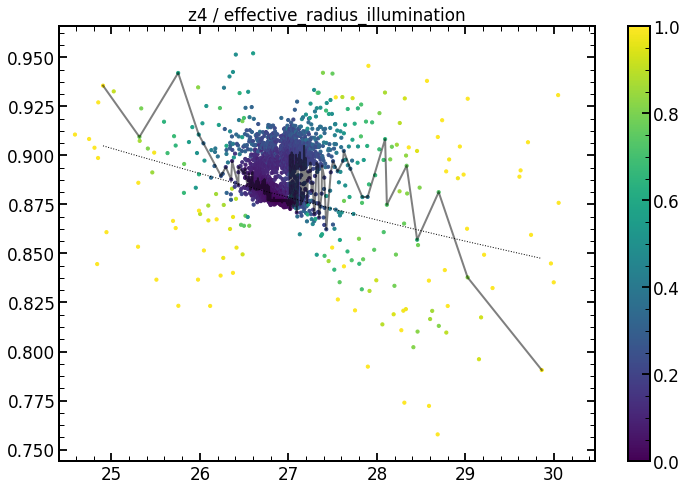

In [89]:
min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,0,20)

plt.figure(figsize=(12,8))

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title(str(columns[0]) +' / '+ str(columns[20]))
plt.colorbar()

In [ ]:
date='FEB15'
for i in tqdm(range(31)):
    for j in range(31):
        min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,i,j)

        plt.figure(figsize=(12,8))

        surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
        plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
        #plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
        plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
        #plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
        plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
        plt.title(str(columns[i]) +' / '+ str(columns[j]))
        plt.colorbar()
        
        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/InterDependance/'+str(columns[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
        
        plt.savefig(IMAGES_FOLDER1+str(columns[i])+str(columns[j]))
        plt.clf()

## One combination, same spot, different defocus

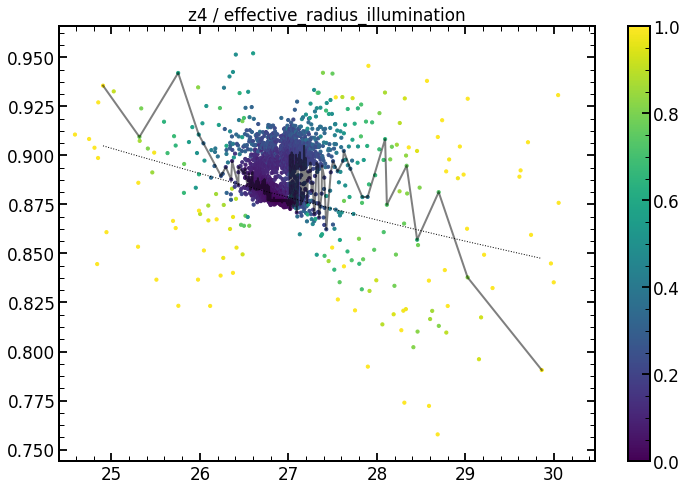

In [91]:
date='Feb15'
obs=str(11790)
single_number='6'
image_index=int(single_number)
eps=5
arc='HgAr'

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_stack,likechain0_stack=create_stack()

min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,0,20)

plt.figure(figsize=(12,8))

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title(str(columns[0]) +' / '+ str(columns[20]))
plt.colorbar()

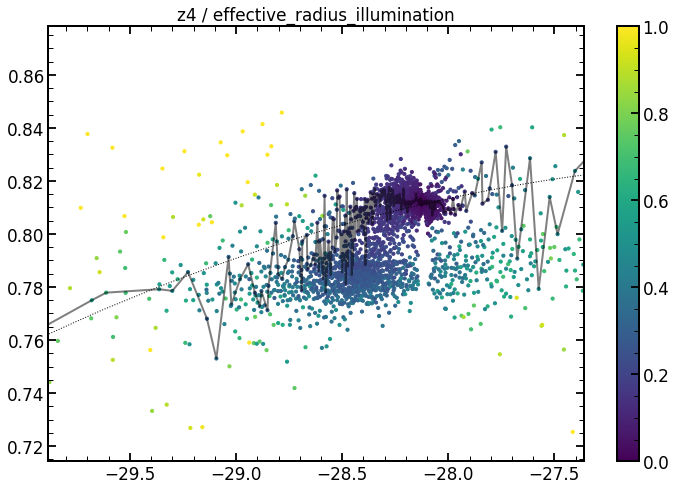

In [95]:
date='Feb15'
obs=str(11736)
single_number='6'
image_index=int(single_number)
eps=5
arc='HgAr'

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_stack,likechain0_stack=create_stack()

min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,0,20)

plt.figure(figsize=(12,8))

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title(str(columns[0]) +' / '+ str(columns[20]))
plt.colorbar()

## One combination, many spots

### creation

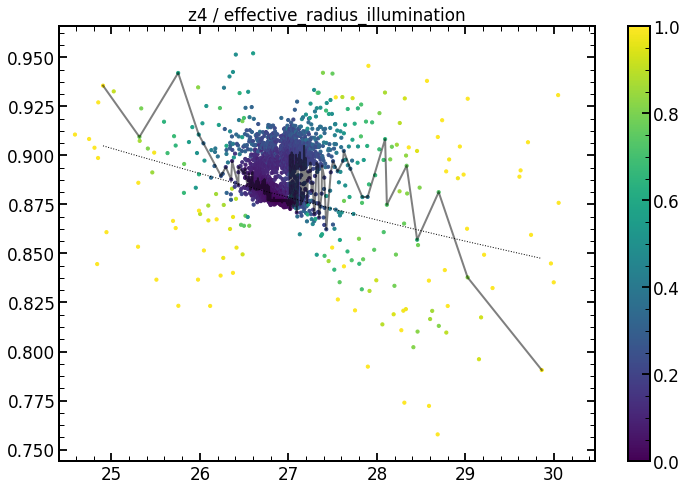

In [96]:
date='Feb15'
obs=str(11790)
single_number='6'
image_index=int(single_number)
eps=5
arc='HgAr'

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_stack,likechain0_stack=create_stack()

min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,0,20)

plt.figure(figsize=(12,8))

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title(str(columns[0]) +' / '+ str(columns[20]))
plt.colorbar()

In [117]:
list_of_p2=[]
for i in tqdm(results_of_fit_many_HgAr['m35'].index.values):
    try:
        date='Feb15'
        obs=str(11790)
        single_number=results_of_fit_many_HgAr['m35'].index.values[i]
        image_index=int(single_number)
        eps=5
        arc='HgAr'

        single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
        chain0_stack,likechain0_stack=create_stack()

        min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,0,20)

        list_of_p2.append(p2)
    except:
        pass

100%|██████████| 56/56 [00:39<00:00,  1.42it/s]


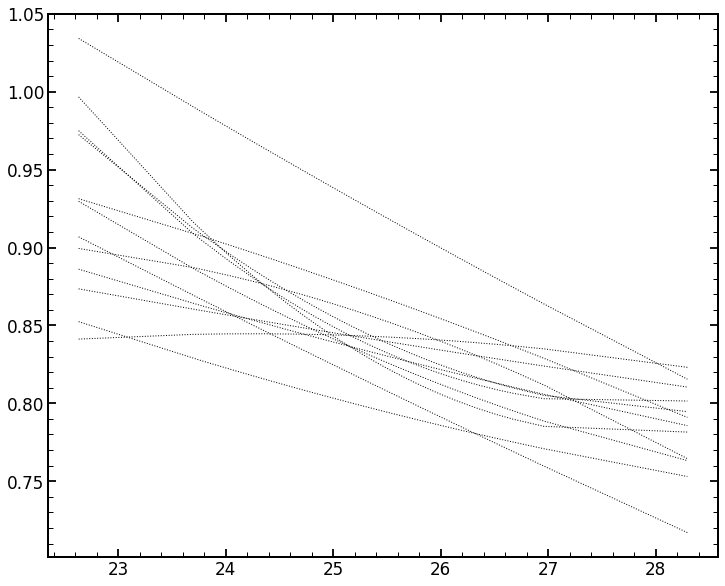

In [118]:
for i in range(len(list_of_p2)):
    p2=list_of_p2[i]
    plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')


In [113]:
p2

poly1d([-0.00133119,  0.056683  ,  0.27391173])

### effective radius and radiometric

In [495]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Feb150119/'

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_HgAr_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_direct_HgAr=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_direct_Ne=pickle.load(f)

In [501]:
finalHgAr_Feb2019[finalHgAr_Feb2019.fiber=='8']

,fiber,xc,yc,wavelength,close,lamp,xc_effective,old_index_approx,superold_index_approx
96,8,2137,762,690.9346,0,HgAr,2206,60,nan
97,8,2136,828,696.7261,1,HgAr,2205,61,95.0
98,8,2136,944,706.8989,0,HgAr,2205,62,nan
99,8,2135,1179,727.47876,1,HgAr,2204,63,nan
100,8,2135,1307,738.6248,0,HgAr,2204,64,85.0
101,8,2134,1595,763.74286,0.5,HgAr,2203,65,75.0
102,8,2133,1955,795.0522,1,HgAr,2202,66,55.0
103,8,2131,2322,826.6699,0.5,HgAr,2200,67,45.0
104,8,2131,2621,852.4029,0.5,HgAr,2200,68,35.0
105,8,2128,3328,912.5693,1,HgAr,2197,69,25.0


#### Observation of the same spot, different defocus

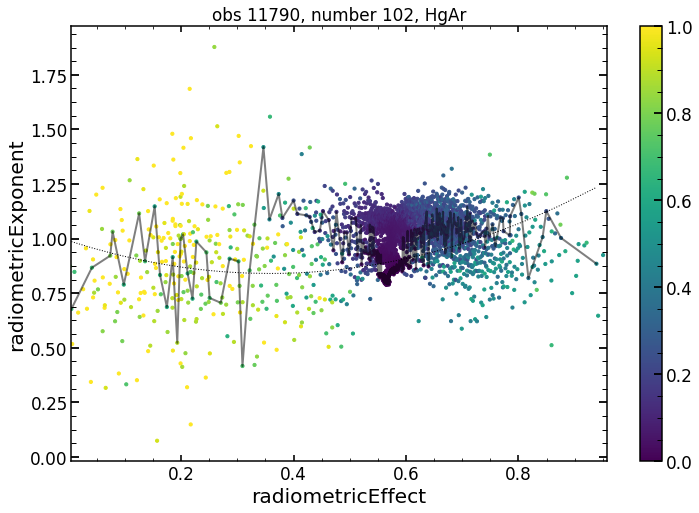

In [524]:
date='Feb15'
obs=str(11790)
single_number='102'
image_index=int(single_number)
eps=5
arc='HgAr'

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_stack,likechain0_stack=create_stack()

column1_number=14
column2_number=15
# input columns at the last two images
min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,column1_number,column2_number)

plt.figure(figsize=(12,8))

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title('obs '+str(obs)+', number '+str(image_index)+', '+str(arc))
plt.xlabel(str(columns[column1_number]))
plt.ylabel(str(columns[column2_number]))
plt.colorbar()

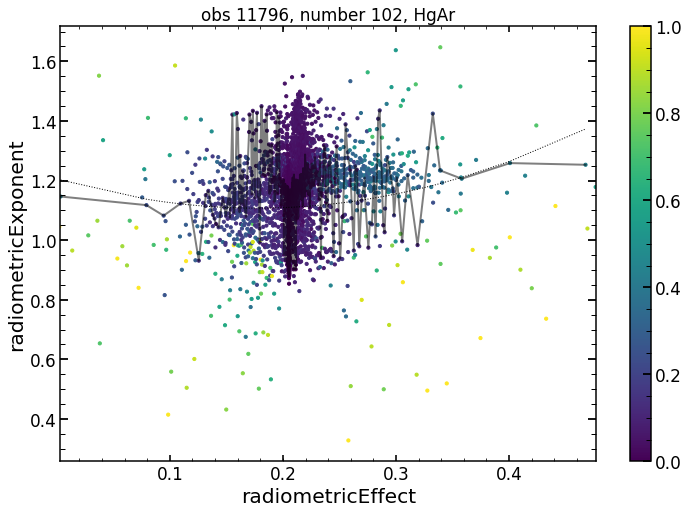

In [526]:
date='Feb15'
obs=str(11796)
single_number='102'
image_index=int(single_number)
eps=5
arc='HgAr'

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_stack,likechain0_stack=create_stack()

column1_number=14
column2_number=15
# input columns at the last two images
min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,column1_number,column2_number)

plt.figure(figsize=(12,8))

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title('obs '+str(obs)+', number '+str(image_index)+', '+str(arc))
plt.xlabel(str(columns[column1_number]))
plt.ylabel(str(columns[column2_number]))
plt.colorbar()

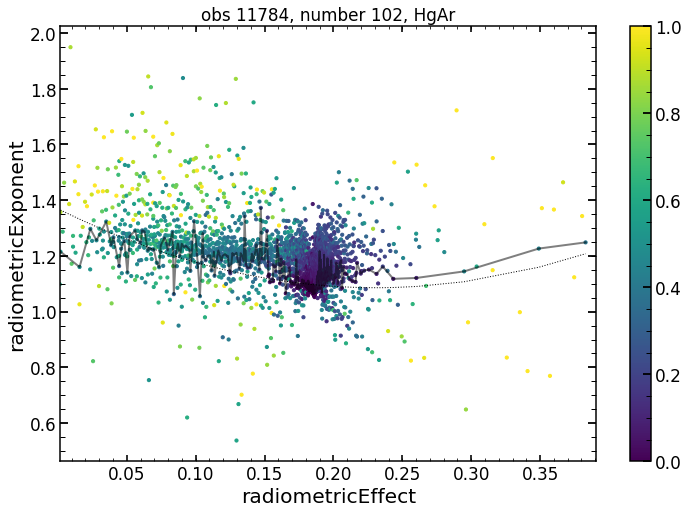

In [527]:
date='Feb15'
obs=str(11784)
single_number='102'
image_index=int(single_number)
eps=5
arc='HgAr'

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_stack,likechain0_stack=create_stack()

column1_number=14
column2_number=15
# input columns at the last two images
min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,column1_number,column2_number)

plt.figure(figsize=(12,8))

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title('obs '+str(obs)+', number '+str(image_index)+', '+str(arc))
plt.xlabel(str(columns[column1_number]))
plt.ylabel(str(columns[column2_number]))
plt.colorbar()

In [528]:
date='Feb15'
obs=str(11724)
single_number='102'
image_index=int(single_number)
eps=5
arc='HgAr'

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_stack,likechain0_stack=create_stack()

column1_number=14
column2_number=15
# input columns at the last two images
min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,column1_number,column2_number)

plt.figure(figsize=(12,8))

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title('obs '+str(obs)+', number '+str(image_index)+', '+str(arc))
plt.xlabel(str(columns[column1_number]))
plt.ylabel(str(columns[column2_number]))
plt.colorbar()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Feb15/chainFeb15_Single_P_117241025HgArEmcee2.npy'

[0.43041349 1.29557751]


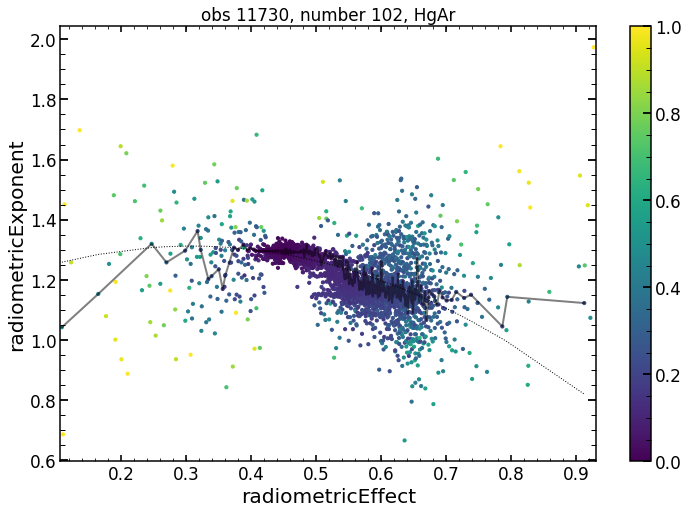

In [617]:
date='Feb15'
obs=str(11730)
single_number='102'
image_index=int(single_number)
eps=5
arc='HgAr'

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_stack,likechain0_stack=create_stack()

column1_number=14
column2_number=15
# input columns at the last two images
min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,column1_number,column2_number)

plt.figure(figsize=(12,8))

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
print(res_stack[res_stack[:,2]==np.min(res_stack[:,2])][0][0:2])

plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title('obs '+str(obs)+', number '+str(image_index)+', '+str(arc))
plt.xlabel(str(columns[column1_number]))
plt.ylabel(str(columns[column2_number]))
plt.colorbar()

In [530]:
date='Feb15'
obs=str(11736)
single_number='102'
image_index=int(single_number)
eps=5
arc='HgAr'

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_stack,likechain0_stack=create_stack()

column1_number=14
column2_number=15
# input columns at the last two images
min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,column1_number,column2_number)

plt.figure(figsize=(12,8))

surf = plt.scatter(res_stack[:,0], res_stack[:,1],c=np.log10(res_stack[:,2]),s=10,vmax=1)
plt.plot(min_min_res_split_stack_test[:,0],min_min_res_split_stack_test[:,1],lw=2,alpha=0.5,color='black',ls='-')
#plt.plot(min_min_res_split_stack_test[:,0],p1(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.plot(min_min_res_split_stack_test[:,0],p2(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
#plt.plot(min_min_res_split_stack_test[:,0],p3(min_min_res_split_stack_test[:,0]),lw=1,alpha=1,color='black',ls=':')
plt.xlim(0.98*np.min(min_min_res_split_stack_test[:,0]),np.max(min_min_res_split_stack_test[:,0]*1.02))
plt.title('obs '+str(obs)+', number '+str(image_index)+', '+str(arc))
plt.xlabel(str(columns[column1_number]))
plt.ylabel(str(columns[column2_number]))
plt.colorbar()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/nevencaplar/Documents/PFS/TigerAnalysis/ResultsFromTiger/Feb15/chainFeb15_Single_P_117361025HgArEmcee2.npy'

## p2 for single defocus

In [614]:
list_of_p1_m4=[]
list_of_p2_m4=[]
list_of_p3_m4=[]
list_of_res_stack_m4=[]
list_of_best_fit_value_m4=[]
list_of_min_min_res_split_stack_test=[]
for single_number in tqdm(results_of_fit_many_direct_HgAr['m4'].index.values):
    try:
        date='Feb15'
        obs=str(11796)
        image_index=int(single_number)
        eps=5
        arc='HgAr'

        single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
        chain0_stack,likechain0_stack=create_stack()

        min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,14,15)
        
        list_of_p1_m4.append(p1)
        list_of_p2_m4.append(p2)
        list_of_p3_m4.append(p3)
        list_of_res_stack_m4.append(res_stack)
        list_of_best_fit_value_m4.append(res_stack[res_stack[:,2]==np.min(res_stack[:,2])][0][0:2])
        list_of_min_min_res_split_stack_test.append(min_min_res_split_stack_test)
    except:
        pass

100%|██████████| 45/45 [02:04<00:00,  2.77s/it]


In [615]:
list_of_p1_m35=[]
list_of_p2_m35=[]
list_of_p3_m35=[]
list_of_res_stack_m35=[]
list_of_best_fit_value_m35=[]
list_of_min_min_res_split_stack_test=[]
for single_number in tqdm(results_of_fit_many_direct_HgAr['m35'].index.values):
    try:
        date='Feb15'
        obs=str(11790)
        image_index=int(single_number)
        eps=5
        arc='HgAr'

        single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
        chain0_stack,likechain0_stack=create_stack()

        min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,14,15)
        
        list_of_p1_m35.append(p1)
        list_of_p2_m35.append(p2)
        list_of_p3_m35.append(p3)
        list_of_res_stack_m35.append(res_stack)
        list_of_best_fit_value_m35.append(res_stack[res_stack[:,2]==np.min(res_stack[:,2])][0][0:2])
        list_of_min_min_res_split_stack_test.append(min_min_res_split_stack_test)
    except:
        pass

100%|██████████| 62/62 [02:44<00:00,  2.66s/it]


In [607]:
list_of_p1_m3=[]
list_of_p2_m3=[]
list_of_p3_m3=[]
list_of_res_stack_m3=[]
list_of_best_fit_value_m3=[]
list_of_min_min_res_split_stack_test=[]
for single_number in tqdm(results_of_fit_many_direct_HgAr['m3'].index.values):
    try:
        date='Feb15'
        obs=str(11784)
        image_index=int(single_number)
        eps=5
        arc='HgAr'

        single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
        chain0_stack,likechain0_stack=create_stack()

        min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,14,15)
        
        list_of_p1_m3.append(p1)
        list_of_p2_m3.append(p2)
        list_of_p3_m3.append(p3)
        list_of_res_stack_m3.append(res_stack)
        list_of_best_fit_value_m3.append(res_stack[res_stack[:,2]==np.min(res_stack[:,2])][0][0:2])
        list_of_min_min_res_split_stack_test.append(min_min_res_split_stack_test)
    except:
        pass

100%|██████████| 66/66 [03:25<00:00,  3.12s/it]


In [608]:
list_of_p1_p3=[]
list_of_p2_p3=[]
list_of_p3_p3=[]
list_of_res_stack_p3=[]
list_of_best_fit_value_p3=[]
list_of_min_min_res_split_stack_test=[]
for single_number in tqdm(results_of_fit_many_direct_HgAr['p3'].index.values):
    try:
        date='Feb15'
        obs=str(11724)
        image_index=int(single_number)
        eps=5
        arc='HgAr'

        single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
        chain0_stack,likechain0_stack=create_stack()

        min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,14,15)
        
        list_of_p1_p3.append(p1)
        list_of_p2_p3.append(p2)
        list_of_p3_p3.append(p3)
        list_of_res_stack_p3.append(res_stack)
        list_of_best_fit_value_p3.append(res_stack[res_stack[:,2]==np.min(res_stack[:,2])][0][0:2])
        list_of_min_min_res_split_stack_test.append(min_min_res_split_stack_test)
    except:
        pass

100%|██████████| 59/59 [03:01<00:00,  3.07s/it]


In [609]:
list_of_p1_p35=[]
list_of_p2_p35=[]
list_of_p3_p35=[]
list_of_res_stack_p35=[]
list_of_best_fit_value_p35=[]
list_of_min_min_res_split_stack_test=[]
for single_number in tqdm(results_of_fit_many_direct_HgAr['p35'].index.values):
    try:
        date='Feb15'
        obs=str(11730)
        image_index=int(single_number)
        eps=5
        arc='HgAr'

        single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
        chain0_stack,likechain0_stack=create_stack()

        min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,14,15)
        
        list_of_p1_p35.append(p1)
        list_of_p2_p35.append(p2)
        list_of_p3_p35.append(p3)
        list_of_res_stack_p35.append(res_stack)
        list_of_best_fit_value_p35.append(res_stack[res_stack[:,2]==np.min(res_stack[:,2])][0][0:2])
        list_of_min_min_res_split_stack_test.append(min_min_res_split_stack_test)
    except:
        pass

100%|██████████| 54/54 [02:31<00:00,  2.81s/it]


In [610]:
list_of_p1_p4=[]
list_of_p2_p4=[]
list_of_p3_p4=[]
list_of_res_stack_p4=[]
list_of_best_fit_value_p4=[]
list_of_min_min_res_split_stack_test=[]
for single_number in tqdm(results_of_fit_many_direct_HgAr['p4'].index.values):
    try:
        date='Feb15'
        obs=str(11736)
        image_index=int(single_number)
        eps=5
        arc='HgAr'

        single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
        chain0_stack,likechain0_stack=create_stack()

        min_min_res_split_stack_test,res_stack,p1,p2,p3=create_min_min_res_split(chain0_stack,likechain0_stack,14,15)
        
        list_of_p1_p4.append(p1)
        list_of_p2_p4.append(p2)
        list_of_p3_p4.append(p3)
        list_of_res_stack_p4.append(res_stack)
        list_of_best_fit_value_p4.append(res_stack[res_stack[:,2]==np.min(res_stack[:,2])][0][0:2])
        list_of_min_min_res_split_stack_test.append(min_min_res_split_stack_test)
    except:
        pass

100%|██████████| 43/43 [02:10<00:00,  3.04s/it]


In [611]:
best_fit_value_m4=np.array(list_of_best_fit_value_m4)
best_fit_value_m35=np.array(list_of_best_fit_value_m35)
best_fit_value_m3=np.array(list_of_best_fit_value_m3)
best_fit_value_p3=np.array(list_of_best_fit_value_p3)
best_fit_value_p35=np.array(list_of_best_fit_value_p35)
best_fit_value_p4=np.array(list_of_best_fit_value_p4)

In [618]:
best_fit_value_m35

array([[0.05685796, 0.0168907 ],
       [0.00084704, 1.41558358],
       [0.03015385, 0.39373917],
       [0.23526948, 0.2734413 ],
       [0.16404938, 0.53597004],
       [0.00121726, 1.13981242],
       [0.0003255 , 0.41390331],
       [0.00001296, 1.25879493],
       [0.03562373, 0.27011824],
       [0.01993832, 0.01112204],
       [0.00044176, 1.7261903 ],
       [0.00007406, 1.77031085],
       [0.04964614, 1.18437643],
       [0.0000656 , 1.21465393],
       [0.00507027, 0.18605887],
       [0.20585046, 0.010864  ],
       [0.00004038, 1.62556408],
       [0.00068711, 0.04480652],
       [0.08423879, 0.01787588],
       [0.00166961, 0.9109507 ],
       [0.00337612, 0.85225407],
       [0.03737835, 0.08059104],
       [0.00020575, 1.11299035],
       [0.13154664, 0.39565602],
       [0.00032908, 1.6117889 ],
       [0.01301777, 0.32471482],
       [0.15519596, 1.21376305],
       [0.32135374, 0.33396237],
       [0.56609429, 0.79041698],
       [0.11491651, 0.87327803],
       [0.

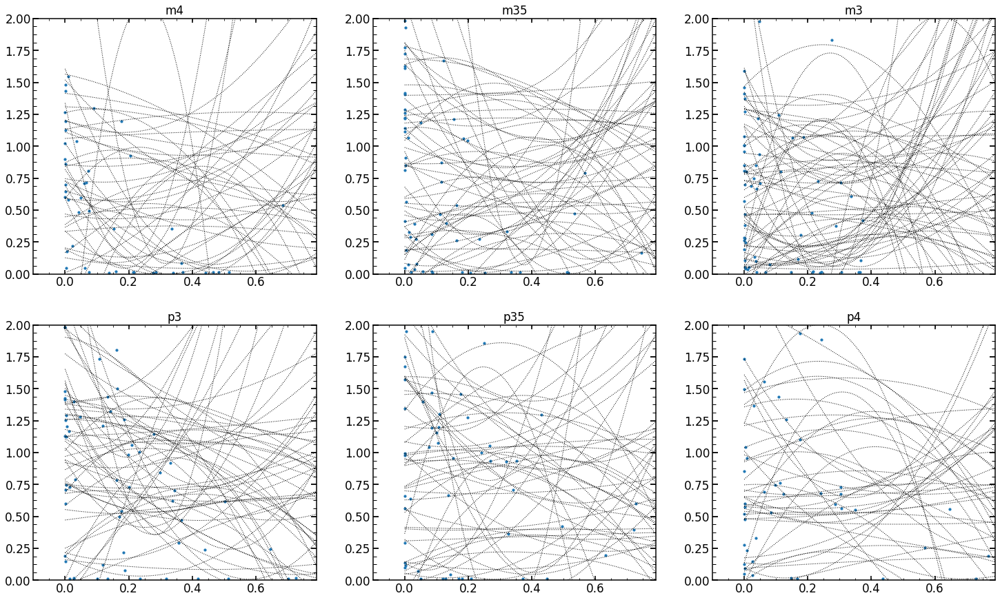

In [616]:
best_fit_value_m35=np.array(list_of_best_fit_value_m35)
space_points_m35=np.linspace(np.min(best_fit_value_m35[:,0]),np.max(best_fit_value_m35[:,0]),100)

plt.figure(figsize=(25,15))
plt.subplot(231)
surf = plt.scatter(best_fit_value_m4[:,0], best_fit_value_m4[:,1],s=10,vmax=1)
plt.title('m4')
for i in range(len(list_of_p2_m4)):
    p2=list_of_p2_m4[i]
    plt.plot(space_points,p2(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)
    
plt.subplot(232)
surf = plt.scatter(best_fit_value_m35[:,0], best_fit_value_m35[:,1],s=10,vmax=1)
plt.title('m35')
for i in range(len(list_of_p2_m35)):
    p2=list_of_p2_m35[i]
    plt.plot(space_points,p2(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)
    
plt.subplot(233)
surf = plt.scatter(best_fit_value_m3[:,0], best_fit_value_m3[:,1],s=10,vmax=1)
plt.title('m3')
for i in range(len(list_of_p2_m3)):
    p2=list_of_p2_m3[i]
    plt.plot(space_points,p2(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)
    
    
plt.subplot(234)
surf = plt.scatter(best_fit_value_p3[:,0], best_fit_value_p3[:,1],s=10,vmax=1)
plt.title('p3')
for i in range(len(list_of_p2_p3)):
    p2=list_of_p2_p3[i]
    plt.plot(space_points,p2(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)
    
plt.subplot(235)
surf = plt.scatter(best_fit_value_p35[:,0], best_fit_value_p35[:,1],s=10,vmax=1)
plt.title('p35')
for i in range(len(list_of_p2_p35)):
    p2=list_of_p2_p35[i]
    plt.plot(space_points,p2(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)
    
plt.subplot(236)
surf = plt.scatter(best_fit_value_p4[:,0], best_fit_value_p4[:,1],s=10,vmax=1)
plt.title('p4')
for i in range(len(list_of_p2_p4)):
    p2=list_of_p2_p4[i]
    plt.plot(space_points,p2(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)

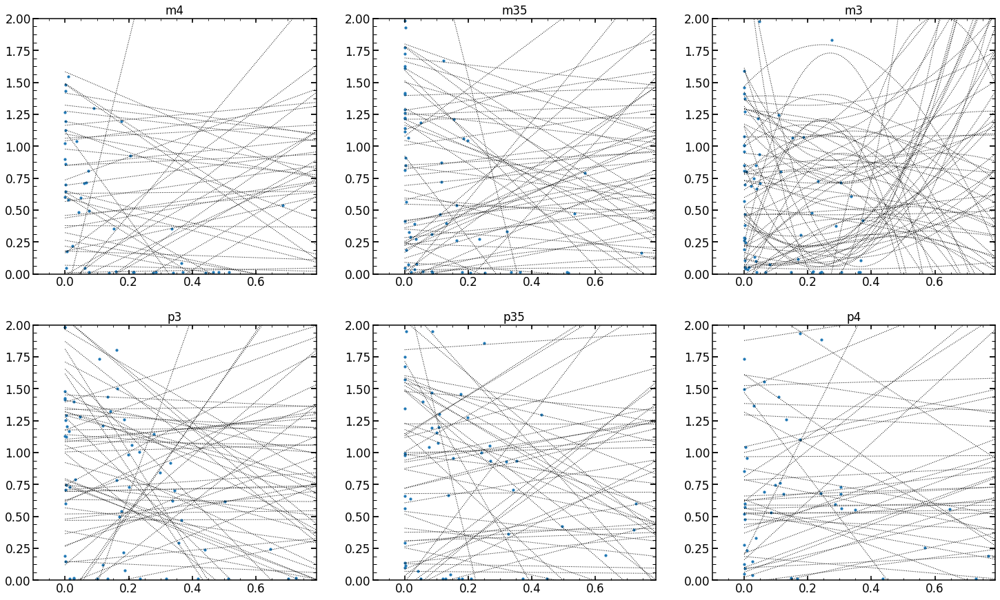

In [620]:
best_fit_value_m35=np.array(list_of_best_fit_value_m35)
space_points_m35=np.linspace(np.min(best_fit_value_m35[:,0]),np.max(best_fit_value_m35[:,0]),100)

plt.figure(figsize=(25,15))
plt.subplot(231)
surf = plt.scatter(best_fit_value_m4[:,0], best_fit_value_m4[:,1],s=10,vmax=1)
plt.title('m4')
for i in range(len(list_of_p2_m4)):
    p1=list_of_p1_m4[i]
    plt.plot(space_points,p1(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)
    
plt.subplot(232)
surf = plt.scatter(best_fit_value_m35[:,0], best_fit_value_m35[:,1],s=10,vmax=1)
plt.title('m35')
for i in range(len(list_of_p2_m35)):
    p1=list_of_p1_m35[i]
    plt.plot(space_points,p1(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)
    
plt.subplot(233)
surf = plt.scatter(best_fit_value_m3[:,0], best_fit_value_m3[:,1],s=10,vmax=1)
plt.title('m3')
for i in range(len(list_of_p2_m3)):
    p1=list_of_p1_m3[i]
    plt.plot(space_points,p1(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)
    
    
plt.subplot(234)
surf = plt.scatter(best_fit_value_p3[:,0], best_fit_value_p3[:,1],s=10,vmax=1)
plt.title('p3')
for i in range(len(list_of_p2_p3)):
    p1=list_of_p1_p3[i]
    plt.plot(space_points,p1(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)
    
plt.subplot(235)
surf = plt.scatter(best_fit_value_p35[:,0], best_fit_value_p35[:,1],s=10,vmax=1)
plt.title('p35')
for i in range(len(list_of_p2_p35)):
    p1=list_of_p1_p35[i]
    plt.plot(space_points,p1(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)
    
plt.subplot(236)
surf = plt.scatter(best_fit_value_p4[:,0], best_fit_value_p4[:,1],s=10,vmax=1)
plt.title('p4')
for i in range(len(list_of_p2_p4)):
    p1=list_of_p1_p4[i]
    plt.plot(space_points,p1(space_points),lw=1,alpha=1,color='black',ls=':')
    plt.ylim(0,2)
    plt.xlim(np.min(space_points)-0.1,np.max(space_points)-0.1)

# Higher order from single image

In [12]:
obs=12397
arc='Ne'
date='Feb15'

single_number=77
sci_image_center =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

NameError: name 'STAMPS_FOLDER' is not defined

In [ ]:

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=11,pupilExplicit=pupililluminated_center)   
res=model(allparameters_proposal_center)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

In [1256]:
0.1395327/1280

0.000109009921875

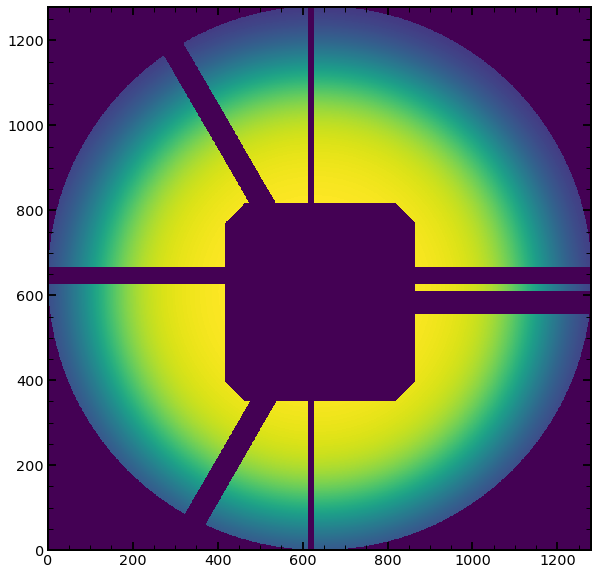

In [1252]:
plt.imshow(pupililluminated_center)

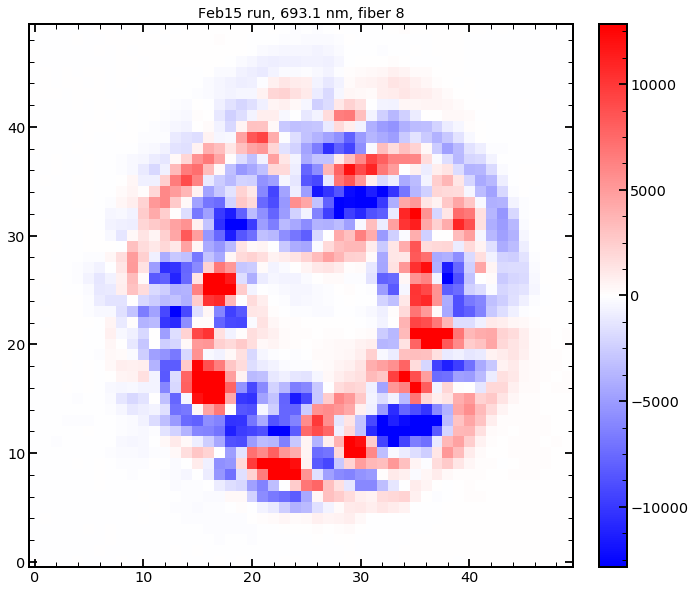

In [1238]:
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['fiber'])
plt.imshow(test_image_center-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

In [934]:
full_proposal=allparameters_proposal_center

In [1201]:
full_proposal=np.array([   25.46927509,    -0.02124209,    -1.04992786,     0.69853391,
          -0.0641416 ,     0.02247082,    -0.29192157,    -0.18292153,
           0.69976007,     0.08438785,     0.00028714,    -0.09023436,
           0.06347543,     0.01088842,     0.00008689,     0.51837526,
           0.9760724 ,     0.83827641,    -0.02061162,    -0.06103453,
           0.82536987,     0.08903461,     0.69209871,     1.04051888,
          -0.04201478, 90682.83733571,     2.58159004,     0.00378112,
           0.48956584,     1.81188317,     0.99545856,0,0])

allparameters_proposal=np.concatenate((full_proposal[0:8],[0,0,0,0,0,0,0,0,0,0,0],full_proposal[8:-2]))
# not sure, but I guess to protect it from chaning?
allparameters_proposal_direct_22=np.copy(allparameters_proposal)  

In [1221]:
np.arange(-0.1,0.11,0.0333)

array([-0.1   , -0.0667, -0.0334, -0.0001,  0.0332,  0.0665,  0.0998])

In [1215]:

allparameters_proposal_direct_22[9]=0.3
allparameters_proposal_direct_22[10]=0
allparameters_proposal_direct_22

array([   25.46927509,    -0.02124209,    -1.04992786,     0.69853391,
          -0.0641416 ,     0.02247082,    -0.29192157,    -0.18292153,
           0.        ,     0.3       ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.69976007,
           0.08438785,     0.00028714,    -0.09023436,     0.06347543,
           0.01088842,     0.00008689,     0.51837526,     0.9760724 ,
           0.83827641,    -0.02061162,    -0.06103453,     0.82536987,
           0.08903461,     0.69209871,     1.04051888,    -0.04201478,
       90682.83733571,     2.58159004,     0.00378112,     0.48956584,
           1.81188317,     0.99545856])

In [1216]:
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22)   
res=model(allparameters_proposal_direct_22)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
print(np.mean((test_image_center-sci_image_center)**2/var_image_center))

zmax: 22
534.617438757192


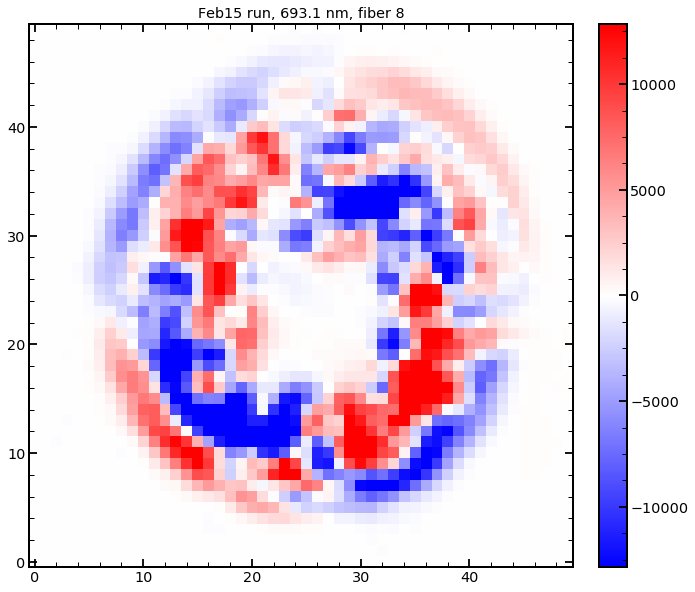

In [1217]:
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['fiber'])
plt.imshow(test_image_center-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

In [1138]:
input_parameters=[]
for arg1 in range(11):
    for arg2 in range(arg1+1,11):
        for i in np.arange(-0.3,0.31,0.1):
            for j in np.arange(-0.3,0.31,0.1):
                allparameters_proposal_int_22_test=np.copy(allparameters_proposal_direct_22)
                allparameters_proposal_int_22_test[arg1+8]=i
                allparameters_proposal_int_22_test[arg2+8]=j
                input_parameters.append(allparameters_proposal_int_22_test) 

In [1222]:
Direct_and_Interpolation_Analysis_FebTest1=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt/Direct_and_Interpolation_Analysis_FebTest1.npy')

In [1223]:
len(input_parameters)

2695

In [1224]:
len(Direct_and_Interpolation_Analysis_FebTest1)

2695

In [1225]:
Zernike_dependence_array=[]
for arg1 in range(11):
    for arg2 in range(arg1+1,11):
        for i in np.arange(-0.1,0.11,0.0333):
            for j in np.arange(-0.1,0.11,0.0333):
                Zernike_dependence_array.append([arg1,arg2,i,j])
                
Zernike_dependence_array=np.array(Zernike_dependence_array)

In [1226]:
Zernike_dependence_array_full=np.zeros((2695,5))

In [1227]:
Zernike_dependence_array_full[:,0]=Zernike_dependence_array[:,0]
Zernike_dependence_array_full[:,1]=Zernike_dependence_array[:,1]
Zernike_dependence_array_full[:,2]=Zernike_dependence_array[:,2]
Zernike_dependence_array_full[:,3]=Zernike_dependence_array[:,3]
Zernike_dependence_array_full[:,4]=np.abs(Direct_and_Interpolation_Analysis_FebTest1)/np.min(np.abs(Direct_and_Interpolation_Analysis_FebTest1))

In [1228]:
single_Zernike_component=Zernike_dependence_array_full[Zernike_dependence_array_full[:,0]==0][:,[2,4]]

In [1229]:
Zernike_dependence_array_full[Zernike_dependence_array_full[:,4]<1.1]

array([[ 0.        ,  1.        , -0.0334    ,  0.0332    ,  1.078841  ],
       [ 0.        ,  1.        , -0.0334    ,  0.0665    ,  1.08244845],
       [ 0.        ,  1.        , -0.0001    , -0.0001    ,  1.08398214],
       ...,
       [ 8.        , 10.        , -0.0001    , -0.0001    ,  1.08357111],
       [ 9.        , 10.        , -0.0001    , -0.0001    ,  1.08362518],
       [ 9.        , 10.        ,  0.0332    , -0.0001    ,  1.09117287]])

(0.8, 10)

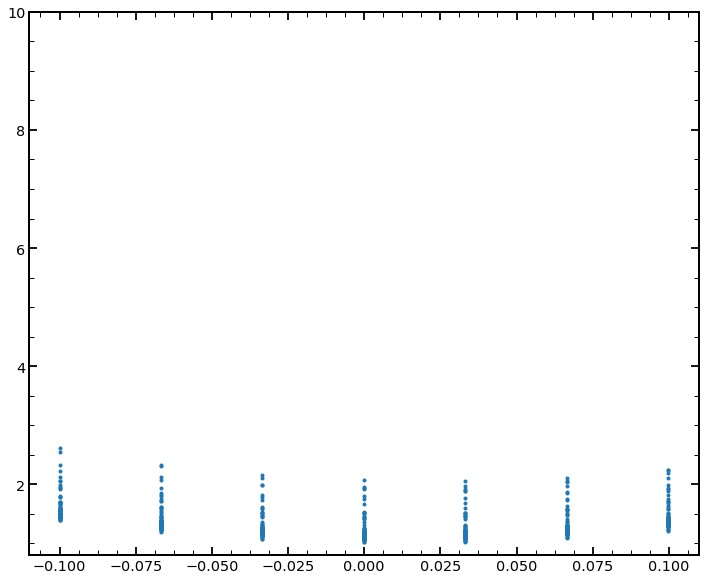

In [1230]:
plt.plot(single_Zernike_component[:,0],single_Zernike_component[:,1],marker='.',ls='')
plt.ylim(0.8,10)

In [1259]:
Zernike_dependence_array_min=Zernike_dependence_array_full[Zernike_dependence_array_full[:,4]==1]
Zernike_dependence_array_min

array([[1.    , 7.    , 0.0665, 0.0332, 1.    ]])

In [1281]:
Zernike_dependence_array_full[Zernike_dependence_array_full[:,4]<1.05]

array([[ 0.        ,  1.        , -0.0001    ,  0.0332    ,  1.02196365],
       [ 0.        ,  1.        , -0.0001    ,  0.0665    ,  1.02722295],
       [ 0.        ,  1.        ,  0.0332    ,  0.0332    ,  1.03066006],
       [ 0.        ,  1.        ,  0.0332    ,  0.0665    ,  1.03713805],
       [ 0.        ,  7.        ,  0.0332    ,  0.0332    ,  1.04914249],
       [ 1.        ,  2.        ,  0.0332    , -0.0334    ,  1.04083442],
       [ 1.        ,  2.        ,  0.0332    , -0.0001    ,  1.02191319],
       [ 1.        ,  2.        ,  0.0332    ,  0.0332    ,  1.0263064 ],
       [ 1.        ,  2.        ,  0.0665    , -0.0334    ,  1.04703131],
       [ 1.        ,  2.        ,  0.0665    , -0.0001    ,  1.02717808],
       [ 1.        ,  2.        ,  0.0665    ,  0.0332    ,  1.03052311],
       [ 1.        ,  3.        ,  0.0332    , -0.0334    ,  1.04081045],
       [ 1.        ,  3.        ,  0.0332    , -0.0001    ,  1.02191336],
       [ 1.        ,  3.        ,  0.0

In [1284]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22,pupilExplicit=pupililluminated_center)   



full_proposal=np.array([   25.46927509,    -0.02124209,    -1.04992786,     0.69853391,
          -0.0641416 ,     0.02247082,    -0.29192157,    -0.18292153,
           0.69976007,     0.08438785,     0.00028714,    -0.09023436,
           0.06347543,     0.01088842,     0.00008689,     0.51837526,
           0.9760724 ,     0.83827641,    -0.02061162,    -0.06103453,
           0.82536987,     0.08903461,     0.69209871,     1.04051888,
          -0.04201478, 90682.83733571,     2.58159004,     0.00378112,
           0.48956584,     1.81188317,     0.99545856,0,0])

allparameters_proposal=np.concatenate((full_proposal[0:8],[0,0,0,0,0,0,0,0,0,0,0],full_proposal[8:-2]))
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')



allparameters_proposal_1=np.concatenate((full_proposal[0:8],[0,0.0665,0,0,0,0,0,0,0,0,0],full_proposal[8:-2]))
res=model(allparameters_proposal_1)
test_image_center_1=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center_1=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

allparameters_proposal_7=np.concatenate((full_proposal[0:8],[0,0.0,0,0,0,0,0,0.0332,0,0,0],full_proposal[8:-2]))
res=model(allparameters_proposal_7)
test_image_center_7=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center_7=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

allparameters_proposal_17=np.concatenate((full_proposal[0:8],[0,0.0665,0,0,0,0,0.0,0.0332,0,0,0],full_proposal[8:-2]))
res=model(allparameters_proposal_17)
test_image_center_17=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center_17=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 244391.61810160743
minimal chi2 reduced is: 195.5052394937194
zmax: 22
Time for single pupil calculation is 1.0242009162902832
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Using provided pupil
Time for single pupil calculation is 1.4066696166992188e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Using provided pupil
Time for single pupil calculation is 1.1920928955078125e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.0001

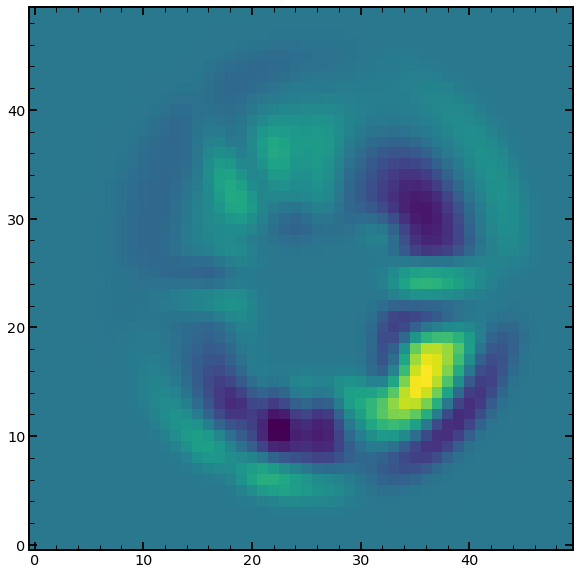

In [1285]:
plt.imshow(test_image_center_17-test_image_center)

195.50523827130445
185.31705110045485
192.49208347551905
180.4179147117529


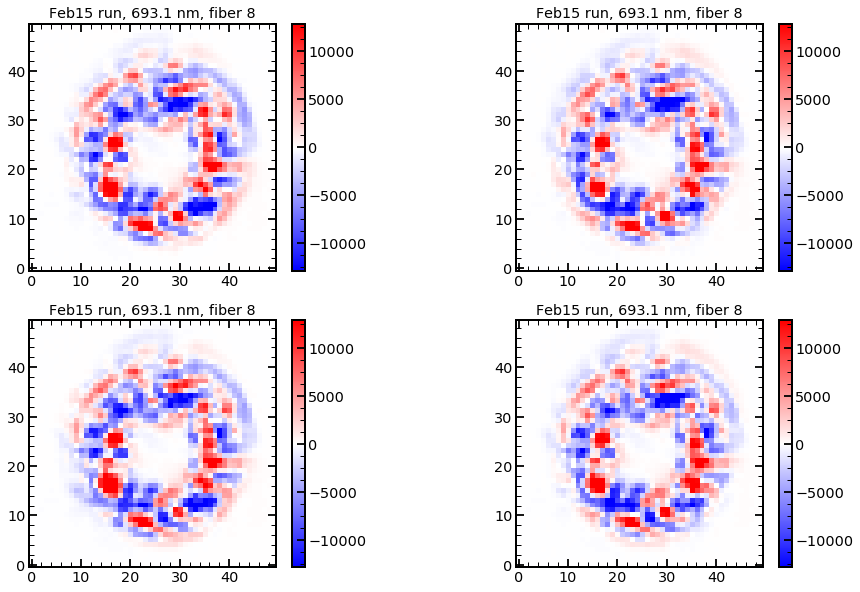

In [1286]:
plt.figure(figsize=(16,10))
plt.subplot(221)
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['fiber'])
plt.imshow(test_image_center-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
print(np.mean((test_image_center-sci_image_center)**2/var_image_center))

plt.subplot(222)
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['fiber'])
plt.imshow(test_image_center_1-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
print(np.mean((test_image_center_1-sci_image_center)**2/var_image_center))

plt.subplot(223)
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['fiber'])
plt.imshow(test_image_center_7-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
print(np.mean((test_image_center_7-sci_image_center)**2/var_image_center))

plt.subplot(224)
plt.title('Feb15 run, '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['wavelength'][:5]+' nm, fiber '+finalNe_Feb2019.loc[list_of_single_number_Ne[2]]['fiber'])
plt.imshow(test_image_center_17-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
print(np.mean((test_image_center_17-sci_image_center)**2/var_image_center))



179.93858364102474


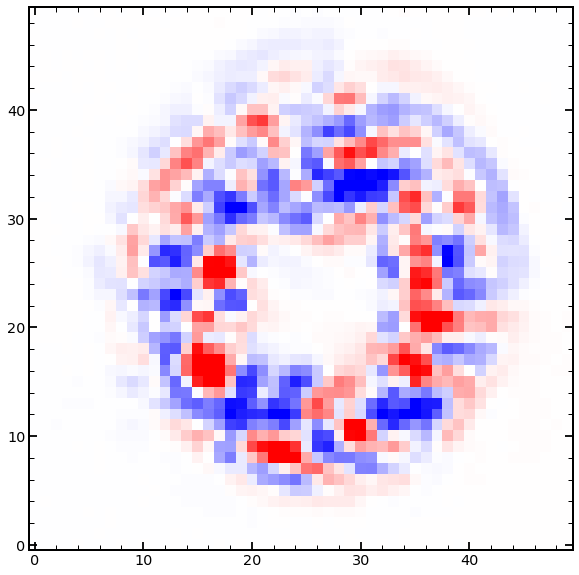

In [1291]:
plt.imshow((test_image_center_7+test_image_center_1)/2-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
test_image_center_17_fake=(test_image_center_7+test_image_center_1)/2
print(np.mean((test_image_center_17_fake-sci_image_center)**2/var_image_center))

7.907913251801681


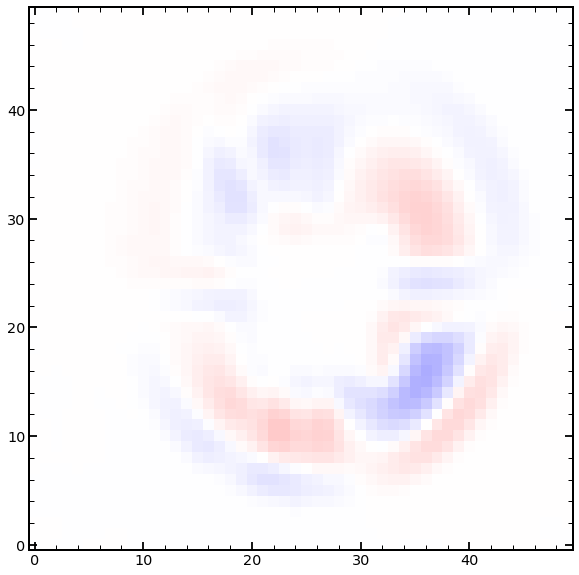

In [1293]:
plt.imshow((test_image_center_7+test_image_center_1)/2-test_image_center_17,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
test_image_center_17_fake=(test_image_center_7+test_image_center_1)/2
print(np.mean((test_image_center_17_fake-test_image_center_17)**2/var_image_center))

In [1447]:
images_plus=[]
images_minus=[]
images=[]

allparameters_proposal=np.concatenate((full_proposal[0:8],[0,0,0,0,0,0,0,0,0,0,0],full_proposal[8:-2]))
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
images_plus.append(test_image_center)
images_minus.append(test_image_center)   
images.append(test_image_center)   

for i in range(11):
    allparameters_proposal=np.concatenate((full_proposal[0:8],[0,0,0,0,0,0,0,0,0,0,0],full_proposal[8:-2]))
    allparameters_proposal[8+i]=0.05
    res=model(allparameters_proposal)
    test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    images_plus.append(test_image_center)
    images.append(test_image_center)
    
    allparameters_proposal=np.concatenate((full_proposal[0:8],[0,0,0,0,0,0,0,0,0,0,0],full_proposal[8:-2]))
    allparameters_proposal[8+i]=-0.05
    res=model(allparameters_proposal)
    test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    images_minus.append(test_image_center)    
    images.append(test_image_center)

Time for single pupil calculation is 9.512901306152344e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Using provided pupil
Time for single pupil calculation is 1.52587890625e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Using provided pupil
Time for single pupil calculation is 1.4066696166992188e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Using p

In [1404]:
x=images_plus
def func(z_params):
    ''' 
    
    '''
    z0,z12,z13,z14,z15,z16,z17,z18,z19,z20,z21,z22=z_params
    test_image=z0*x[0]+z12*x[1]+z13*x[2]+z14*x[3]+z15*x[4]+z16*x[5]+z17*x[6]+z18*x[7]+z19*x[8]+z20*x[9]+z21*x[10]+z22*x[11]
    chi=np.mean((test_image-sci_image_center)**2/var_image_center)
    return chi

In [ ]:
for i in range(12)
    x=images_plus[]

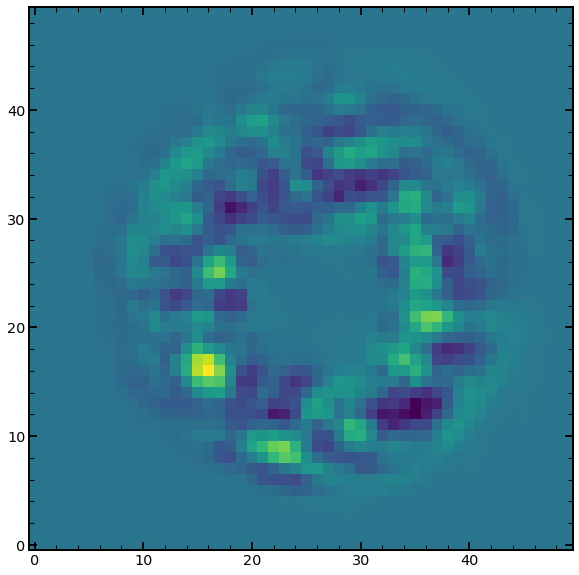

In [1403]:
plt.imshow(images_plus[5]-sci_image_center)

In [1411]:
x=images_plus
def func(z_params):
    ''' 
    
    '''
    z0,z12,z13,z14,z15,z16,z17,z18,z19,z20,z21,z22=z_params
    test_image=z0*x[0]+z12*x[1]+z13*x[2]+z14*x[3]+z15*x[4]+z16*x[5]+z17*x[6]+z18*x[7]+z19*x[8]+z20*x[9]+z21*x[10]+z22*x[11]
    chi=np.mean((test_image-sci_image_center)**2/var_image_center)
    return chi
optimize_result=scipy.optimize.minimize(func,x0=np.array([1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11]),
                        bounds=np.transpose((np.zeros((1,12))[0],np.ones((1,12))[0])))

optimize_result


      fun: 178.9515881722999
 hess_inv: <12x12 LbfgsInvHessProduct with dtype=float64>
      jac: array([10.30453234,  2.26227996, -0.00000568,  9.50232959,  7.6368309 ,
       26.6274526 , -0.00002274,  0.00001137, -0.00004263, 12.93206253,
        7.34866887, 11.61777448])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 689
      nit: 31
   status: 0
  success: True
        x: array([0.        , 0.        , 0.54883228, 0.        , 0.        ,
       0.        , 0.09440182, 0.12871461, 0.22938405, 0.        ,
       0.        , 0.        ])

In [1419]:
x=images
def func(z_params):
    ''' 
    
    '''
    z0,z12p,z13p,z14p,z15p,z16p,z17p,z18p,z19p,z20p,z21p,z22p,z12m,z13m,z14m,z15m,z16m,z17m,z18m,z19m,z20m,z21m,z22m=z_params
    test_image=z0*x[0]+z12p*x[1]+z13p*x[2]+z14p*x[3]+z15p*x[4]+z16p*x[5]+z17p*x[6]+z18p*x[7]+z19p*x[8]+z20p*x[9]+z21p*x[10]+z22p*x[11]+z12m*x[12]+z13m*x[13]+z14m*x[14]+z15m*x[15]+z16m*x[16]+z17m*x[17]+z18m*x[18]+z19m*x[19]+z20m*x[20]+z21m*x[21]+z22m*x[22]
    chi=np.mean((test_image-sci_image_center)**2/var_image_center)
    return chi


optimize_result=scipy.optimize.minimize(func,x0=np.full(23,1),
                        bounds=np.transpose((np.zeros((1,23))[0],np.ones((1,23))[0])))

optimize_result.x


array([ 0.        ,  0.        ,  0.        ,  0.47932291, -0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.10774251,  0.08187946,  0.        ,  0.12026013,  0.        ,
        0.21213539,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ])

In [1437]:
optimize_result.x[1:12]

array([ 0.        ,  0.        ,  0.47932291, -0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.10774251,
        0.08187946])

In [1438]:
optimize_result.x[12:23]

array([0.        , 0.12026013, 0.        , 0.21213539, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        ])

In [1446]:
images[15]

IndexError: list index out of range

In [1451]:
x=images
def func(z_params):
    ''' 
    
    '''
    z0,z12p,z13p,z14p,z15p,z12m,z13m,z14m,z15m=z_params
    test_image=z0*x[0]+z12p*x[1]+z13p*x[2]+z14p*x[3]+z15p*x[4]+z12m*x[12]+z13m*x[13]+z14m*x[14]+z15m*x[15]
    chi=np.mean((test_image-sci_image_center)**2/var_image_center)
    return chi


optimize_result=scipy.optimize.minimize(func,x0=np.full(9,1),
                        bounds=np.transpose((np.zeros((1,9))[0],np.ones((1,9))[0])))

print(optimize_result.x)
print(optimize_result.fun)


[0.         0.0040831  0.         0.58621154 0.         0.
 0.15220682 0.         0.25882715]
179.26960559599067


In [1462]:
optimize_result.x[5:9]

array([0.        , 0.15220682, 0.        , 0.25882715])

In [1464]:
optimize_result.x[1:5]

array([0.0040831 , 0.        , 0.58621154, 0.        ])

In [1466]:
first_proposal=[]
for i in range(4):
    if optimize_result.x[1:5][i]>optimize_result.x[5:9][i]:
        first_proposal.append(optimize_result.x[1:5][i]*0.05)
    else:
        first_proposal.append(-optimize_result.x[5:9][i]*0.05)
    


In [1471]:
np.array(first_proposal)

array([ 0.00020416, -0.00761034,  0.02931058, -0.01294136])

In [ ]:
array([ 0.00020416, -0.00761034,  0.02931058, -0.01294136,0,0,0,0,0,0,0])

In [1475]:
images_plus=[]
images_minus=[]
images=[]

allparameters_proposal=np.concatenate((full_proposal[0:8],np.array([ 0.00020416,0,  0.00,0,0,0,0,0,0,0,0]),full_proposal[8:-2]))
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
images_plus.append(test_image_center)
images_minus.append(test_image_center)   
images.append(test_image_center)   
print(np.mean((test_image_center-sci_image_center)**2/var_image_center))


Time for single pupil calculation is 1.1920928955078125e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Using provided pupil
195.47808286336587


In [1442]:
images_plus=[]
images_minus=[]
images=[]

allparameters_proposal=np.concatenate((full_proposal[0:8],first_proposal,full_proposal[8:-2]))
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
images_plus.append(test_image_center)
images_minus.append(test_image_center)   
images.append(test_image_center)   
print(np.mean((test_image_center-sci_image_center)**2/var_image_center))


for i in range(11):
    allparameters_proposal=np.concatenate((full_proposal[0:8],first_proposal,full_proposal[8:-2]))
    allparameters_proposal[8+i]=allparameters_proposal[8+i]+0.05
    res=model(allparameters_proposal)
    test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    images_plus.append(test_image_center)
    images.append(test_image_center)
    
    allparameters_proposal=np.concatenate((full_proposal[0:8],first_proposal,full_proposal[8:-2]))
    allparameters_proposal[8+i]=allparameters_proposal[8+i]-0.05
    res=model(allparameters_proposal)
    test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    images_minus.append(test_image_center)    
    images.append(test_image_center)

Time for single pupil calculation is 1.0967254638671875e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Using provided pupil
199.7062868512941
Time for single pupil calculation is 1.1920928955078125e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Using provided pupil
Time for single pupil calculation is 1.3113021850585938e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).sha

KeyboardInterrupt: 

In [1412]:
x=images_minus
def func(z_params):
    ''' 
    
    '''
    z0,z12,z13,z14,z15,z16,z17,z18,z19,z20,z21,z22=z_params
    test_image=z0*x[0]+z12*x[1]+z13*x[2]+z14*x[3]+z15*x[4]+z16*x[5]+z17*x[6]+z18*x[7]+z19*x[8]+z20*x[9]+z21*x[10]+z22*x[11]
    chi=np.mean((test_image-sci_image_center)**2/var_image_center)
    return chi
optimize_result=scipy.optimize.minimize(func,x0=np.array([1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11]),
                        bounds=np.transpose((np.zeros((1,12))[0],np.ones((1,12))[0])))

optimize_result


      fun: 194.58196497883273
 hess_inv: <12x12 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 6.58311592, 14.32390206, 30.33383393,  9.07321862,  9.59175281,
       -6.55707311, 23.43874996, 26.22753925, 27.10037279,  5.88787827,
       10.0655825 , 11.55185601])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 208
      nit: 5
   status: 0
  success: True
        x: array([0.11526705, 0.08126443, 0.00068475, 0.10430898, 0.10514188,
       0.19854411, 0.02963537, 0.01796664, 0.02061706, 0.11976781,
       0.10159532, 0.10631687])

In [1406]:
allparameters_proposal=np.concatenate((full_proposal[0:8],[0,0.54884731*0.05,0,0,0,0.09440442*0.05,0.12872985*0.05,0.22935117*0.05,0,0,0],full_proposal[8:-2]))
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')

Time for single pupil calculation is 2.47955322265625e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Using provided pupil


KeyboardInterrupt: 

In [1408]:
print(np.mean((test_image_center-sci_image_center)**2/var_image_center))

178.94129435642975


In [1390]:
scipy.optimize.least_squares(func,x0=np.array([1,1,1,1/5,1,1,1,1,1,1,1]),
                        bounds=(0,1),x_scale=1)

 active_mask: array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
        cost: 17606.114373528064
         fun: array([187.64921728])
        grad: array([3825.3363531 ,  780.56631257, 4628.87527807, 4392.35883851,
       9243.14665331, 2794.86087396, 2042.98375189, 2006.30273367,
       5431.95607507, 4458.80851127, 6167.9472518 ])
         jac: array([[20.38557053,  4.15970993, 24.66770363, 23.40728569, 49.25758171,
        14.89407158, 10.88724899, 10.69177246, 28.94739532, 23.76140213,
        32.86956024]])
     message: 'The maximum number of function evaluations is exceeded.'
        nfev: 1100
        njev: 936
  optimality: 610.4922703392547
      status: 0
     success: False
           x: array([0.09072019, 0.15985654, 0.08647202, 0.01992719, 0.0660481 ,
       0.09823042, 0.11627498, 0.11537555, 0.08254883, 0.08725924,
       0.07864814])

In [1384]:
func(np.array([1,1,1,1/5,1,1,1,1,1,1,1]))

105984.73

In [1368]:
np.sum(np.array([0.01814512, 0.01814512, 0.01814512, 0.24814129, 0.24568374,
       0.14246729, 0.14246729, 0.14276659, 0.14351737, 0.10702748,
       0.10712679]))

1.3336332

In [1386]:
x[10]

1527

In [1371]:
np.sum(np.array([1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11,1/11]))

1.0

In [ ]:
class PFSLikelihoodModule(object):
    """
    PFSLikelihoodModule object for calculating a likelihood for cosmoHammer.ParticleSwarmOptimizer
    """

    def __init__(self,model):
        """
        
        Constructor of the PFSLikelihoodModule
        """
        self.model=model

    def computeLikelihood(self, ctx):
        """
        Computes the likelihood using information from the context
        """
        # Get information from the context. This can be results from a core
        # module or the parameters coming from the sampler
        params = ctx.getParams()
        
        
        #print(params)
        # Calculate a likelihood up to normalization
        lnprob = self.model(params)
        #print(str(current_process())+str(lnprob))
        #sys.stdout.flush()
        # Return the likelihood
        return lnprob

    def setup(self):
        """
        Sets up the likelihood module.
        Tasks that need to be executed once per run
        """
        #e.g. load data from files

        print("PFSLikelihoodModule setup done")

# Tokovinin

## initial development

In [27]:
full_proposal=np.array([   25.46927509,    -0.02124209,    -1.04992786,     0.69853391,
          -0.0641416 ,     0.02247082,    -0.29192157,    -0.18292153,
           0.69976007,     0.08438785,     0.00028714,    -0.09023436,
           0.06347543,     0.01088842,     0.00008689,     0.51837526,
           0.9760724 ,     0.83827641,    -0.02061162,    -0.06103453,
           0.82536987,     0.08903461,     0.69209871,     1.04051888,
          -0.04201478, 90682.83733571,     2.58159004,     0.00378112,
           0.48956584,     1.81188317,     0.99545856,0,0])


In [ ]:
from scipy.special import gamma,jv
from scipy.linalg import svd,inv

def svd_invert(matrix,threshold):
    '''
    :param matrix:
    :param threshold:
    :return:SCD-inverted matrix
    '''
    # print 'MATRIX:',matrix
    u,ws,v = svd(matrix,full_matrices=True)

    #invw = inv(np.identity(len(ws))*ws)
    #return ws

    ww = np.max(ws)
    n = len(ws)
    invw = np.identity(n)
    ncount = 0

    for i in range(n):
        if ws[i] < ww*threshold:
            # log.info('SVD_INVERT: Value %i=%.2e rejected (threshold=%.2e).'%(i,ws[i],ww*threshold))
            invw[i][i]= 0.
            ncount+=1
        else:
            # print 'WS[%4i] %15.9f'%(i,ws[i])
            invw[i][i] = 1./ws[i]

    # log.info('%i singular values rejected in inversion'%ncount)

    inv_matrix = np.dot(u , np.dot( invw, v))

    return inv_matrix

In [30]:
obs=12397
arc='Ne'
date='Feb15'

single_number=77
sci_image_center =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

In [366]:
np.concatenate((allparameters_proposal,np.zeros(36)))[-36:]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0.])

In [364]:

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_center)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 244391.61810160743
minimal chi2 reduced is: 195.5052394937194
None
zmax: 11
no extra Zernike
Time for single pupil calculation is 1.0662147998809814
aberrations: [0.0, 0, 0.0, 0.0, 25.46927509016821, -0.021242089662079324, -1.0499278627347906, 0.6985339060457016, -0.0641415988576813, 0.02247082405667374, -0.29192156616644876, -0.18292152565947906]
aberrations extra: None


In [34]:
images_plus=[]
images_minus=[]
images=[]

model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22) 
allparameters_proposal=np.concatenate((full_proposal[0:8],[0,0,0,0,0,0,0,0,0,0,0],full_proposal[8:-2]))
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
images_plus.append(test_image_center)
images_minus.append(test_image_center)   
images.append(test_image_center)   

for i in range(11):
    allparameters_proposal=np.concatenate((full_proposal[0:8],[0,0,0,0,0,0,0,0,0,0,0],full_proposal[8:-2]))
    allparameters_proposal[8+i]=0.05
    res=model(allparameters_proposal)
    test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    images_plus.append(test_image_center)
    images.append(test_image_center)
    
    allparameters_proposal=np.concatenate((full_proposal[0:8],[0,0,0,0,0,0,0,0,0,0,0],full_proposal[8:-2]))
    allparameters_proposal[8+i]=-0.05
    res=model(allparameters_proposal)
    test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    images_minus.append(test_image_center)    
    images.append(test_image_center)

zmax: 22
Time for single pupil calculation is 0.8232979774475098
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Time for single pupil calculation is 9.059906005859375e-06
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Time for single pupil calculation is 1.0967254638671875e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Time for single pupil calculation is 1.

In [94]:
images_plus_normalized=[]
for i in range(len(images_plus)):
    images_plus_normalized.append((images_plus[i]/np.sum(images_plus[i])).ravel())
  
images_minus_normalized=[]
for i in range(len(images_minus)):
    images_minus_normalized.append((images_minus[i]/np.sum(images_minus[i])).ravel())

images_plus_normalized=np.array(images_plus_normalized)
M0=images_plus_normalized[0]
I=(sci_image_center/np.sum(sci_image_center)).ravel()
H=np.transpose(np.array((images_plus_normalized[1:]-images_plus_normalized[0])/0.05))

images_minus_normalized=np.array(images_minus_normalized)
M0=images_minus_normalized[0]
I=(sci_image_center/np.sum(sci_image_center)).ravel()
H=np.transpose(np.array((images_minus_normalized[1:]-images_minus_normalized[0])/(-0.05)))


In [ ]:
#chi_plus=[]
#for i in range(len(images_plus)):
#    chi_plus.append(((images_plus[i]-sci_image_center)**1/var_image_center).ravel())
#    
#H=np.transpose(np.array(chi_plus[1:]))

In [45]:
HHt

0.014194990398768738

In [95]:
HHt=np.matmul(np.transpose(H),H)
invHHt=np.linalg.inv(HHt)
invHHtHt=np.matmul(invHHt,np.transpose(H))

In [96]:
first_proposal_Tokovnin=np.matmul(invHHtHt,I-M0)
print(first_proposal_Tokovnin)
first_proposal_Tokovnin_proposal=0.7*first_proposal_Tokovnin

[ 0.02415641  0.05486917 -0.00408295 -0.00367199 -0.00699395  0.01269167
  0.00648099  0.01621986 -0.01351602  0.01811907 -0.00392754]


In [97]:
allparameters_proposal=np.concatenate((full_proposal[0:8],first_proposal_Tokovnin_proposal,full_proposal[8:-2]))
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
np.mean((test_image_center-sci_image_center)**2/var_image_center)

Time for single pupil calculation is 1.0967254638671875e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)


175.0535266580435

In [98]:
print(np.sum(np.abs(I-M0)))
M1=(test_image_center/np.sum(test_image_center)).ravel()
print(np.sum(np.abs(I-M1)))

0.04457514402197253
0.042684081403945334


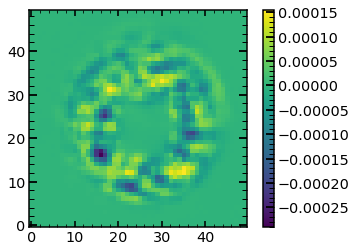

In [99]:
plt.imshow((I-M0).reshape(50,50))
plt.colorbar()

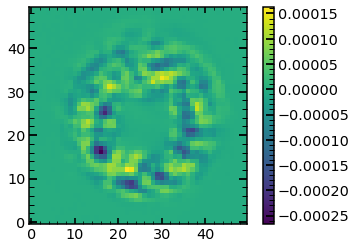

In [100]:
plt.imshow((I-M1).reshape(50,50))
plt.colorbar()

In [118]:
images_plus_1=[]
images_minus_1=[]
images_1=[]

model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22) 
allparameters_proposal=np.concatenate((full_proposal[0:8],first_proposal_Tokovnin_proposal,full_proposal[8:-2]))
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
images_plus_1.append(test_image_center)
images_minus_1.append(test_image_center)   
images_1.append(test_image_center)   

for i in range(11):
    allparameters_proposal=np.concatenate((full_proposal[0:8],first_proposal_Tokovnin_proposal,full_proposal[8:-2]))
    allparameters_proposal[8+i]=allparameters_proposal[8+i]+0.05
    res=model(allparameters_proposal)
    test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    images_plus_1.append(test_image_center)
    images.append(test_image_center)
    
    allparameters_proposal=np.concatenate((full_proposal[0:8],first_proposal_Tokovnin_proposal,full_proposal[8:-2]))
    allparameters_proposal[8+i]=allparameters_proposal[8+i]-0.05
    res=model(allparameters_proposal)
    test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    images_minus_1.append(test_image_center)    
    images.append(test_image_center)    

zmax: 22
Time for single pupil calculation is 0.8274569511413574
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Time for single pupil calculation is 1.0013580322265625e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Time for single pupil calculation is 9.059906005859375e-06
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)
Time for single pupil calculation is 1.

In [120]:
images_plus_1_normalized=[]
for i in range(len(images_plus_1)):
    images_plus_1_normalized.append((images_plus_1[i]/np.sum(images_plus_1[i])).ravel())

#images_minus_normalized=[]
#for i in range(len(images_minus)):
#    images_minus_normalized.append((images_minus[i]/np.sum(images_minus[i])).ravel())

images_plus_normalized=np.array(images_plus_1_normalized)
M0=images_plus_1_normalized[0]
I=(sci_image_center/np.sum(sci_image_center)).ravel()
H=np.transpose(np.array((images_plus_1_normalized[1:]-images_plus_1_normalized[0])/0.05))
'''
images_minus_normalized=np.array(images_minus_normalized)
M0=images_minus_normalized[0]
I=(sci_image_center/np.sum(sci_image_center)).ravel()
H=np.transpose(np.array((images_minus_normalized[1:]-images_minus_normalized[0])/(-0.05)))
'''

'\nimages_minus_normalized=np.array(images_minus_normalized)\nM0=images_minus_normalized[0]\nI=(sci_image_center/np.sum(sci_image_center)).ravel()\nH=np.transpose(np.array((images_minus_normalized[1:]-images_minus_normalized[0])/(-0.05)))\n'

In [121]:
images_plus_1[0].shape

(50, 50)

In [137]:
HHt=np.matmul(np.transpose(H),H)
invHHt=np.linalg.inv(HHt)
#invHHt=svd_invert(HHt,0.05)
invHHtHt=np.matmul(invHHt,np.transpose(H))

second_proposal_Tokovnin=np.matmul(invHHtHt,I-M0)
print(second_proposal_Tokovnin)
second_proposal_Tokovnin=first_proposal_Tokovnin_proposal+0.7*second_proposal_Tokovnin

[ 0.00678395  0.0155488  -0.00106926 -0.00096345 -0.00155577  0.00149519
  0.00314132  0.00449321 -0.00335441  0.0061848  -0.00220536]


In [139]:
HHt=np.matmul(np.transpose(H),H)
#invHHt=np.linalg.inv(HHt)
invHHt=svd_invert(HHt,0.01)
invHHtHt=np.matmul(invHHt,np.transpose(H))

second_proposal_Tokovnin=np.matmul(invHHtHt,I-M0)
print(second_proposal_Tokovnin)
second_proposal_Tokovnin=first_proposal_Tokovnin_proposal+0.7*second_proposal_Tokovnin

[ 0.00678395  0.0155488  -0.00106926 -0.00096345 -0.00155577  0.00149519
  0.00314132  0.00449321 -0.00335441  0.0061848  -0.00220536]


In [136]:
allparameters_proposal=np.concatenate((full_proposal[0:8],second_proposal_Tokovnin,full_proposal[8:-2]))
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
np.mean((test_image_center-sci_image_center)**2/var_image_center)

Time for single pupil calculation is 1.1205673217773438e-05
Supplied pupil size is (pupil.size) [m]:0.1395327
One pixel has size of (pupil.scale) [m]:0.000109009921875
Supplied pupil has so many pixels (pupil_plane_im)(1280, 1280)
pupil.scale: 0.000109009921875
pupil.illuminated.astype(np.float32).shape: (1280, 1280)


174.44135329126246

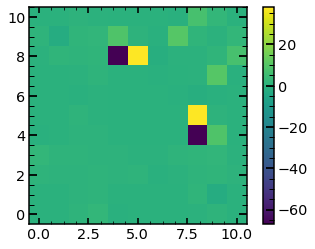

In [134]:
plt.imshow((invHHt-svd_invert(HHt,0.05))/invHHt)
plt.colorbar()

In [149]:
allparameters_proposal

array([   25.46927509,    -0.02124209,    -1.04992786,     0.69853391,
          -0.0641416 ,     0.02247082,    -0.29192157,    -0.18292153,
           0.02162654,     0.04928138,    -0.00505438,    -0.00438297,
          -0.00598119,     0.0099617 ,     0.00672375,     0.01452023,
          -0.01101103,     0.01580502,    -0.00427035,     0.69976007,
           0.08438785,     0.00028714,    -0.09023436,     0.06347543,
           0.01088842,     0.00008689,     0.51837526,     0.9760724 ,
           0.83827641,    -0.02061162,    -0.06103453,     0.82536987,
           0.08903461,     0.69209871,     1.04051888,    -0.04201478,
       90682.83733571,     2.58159004,     0.00378112,     0.48956584,
           1.81188317,     0.99545856])

In [150]:
len(allparameters_proposal)

42

In [151]:
allparameters_proposal

array([   25.46927509,    -0.02124209,    -1.04992786,     0.69853391,
          -0.0641416 ,     0.02247082,    -0.29192157,    -0.18292153,
           0.02162654,     0.04928138,    -0.00505438,    -0.00438297,
          -0.00598119,     0.0099617 ,     0.00672375,     0.01452023,
          -0.01101103,     0.01580502,    -0.00427035,     0.69976007,
           0.08438785,     0.00028714,    -0.09023436,     0.06347543,
           0.01088842,     0.00008689,     0.51837526,     0.9760724 ,
           0.83827641,    -0.02061162,    -0.06103453,     0.82536987,
           0.08903461,     0.69209871,     1.04051888,    -0.04201478,
       90682.83733571,     2.58159004,     0.00378112,     0.48956584,
           1.81188317,     0.99545856])

In [160]:
extra_Zernike_parameters=[]
for j in [23,24,25,26,27,28]:
    extra_Zernike_parameters.append(0.5/((np.sqrt(8.*(j+1.)-6.)-1.)/2.))
    
extra_Zernike_parameters=np.array(extra_Zernike_parameters)

In [162]:
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22,extraZernike=[10]) 
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')

zmax: 22
Time for single pupil calculation is 0.9801809787750244
aberrations: [0.0, 0, 0.0, 0.0, 25.46927509, -0.02124209, -1.04992786, 0.69853391, -0.0641416, 0.02247082, -0.29192157, -0.18292153, 0.021626543512190663, 0.04928137731881432, -0.005054379081705918, -0.004382969675518241, -0.005981188980671509, 0.009961698402697004, 0.0067237503790687, 0.014520225648329296, -0.011011028021788234, 0.015805020308307497, -0.004270353062658511]
aberrations extra: None


In [159]:
extra_Zernike_parameters

[0.07912530647019382,
 0.07734916205794881,
 0.07568492738085521,
 0.07412141983822698,
 0.07264895419462397,
 0.0712590950149907]

In [322]:
columns22=['z4','z5','z6','z7','z8','z9','z10','z11',
           'z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

sci_image_unit=np.ones((50,50))
var_image_unit=np.ones((50,50))
#array([     0.85110826,      0.73047372,     -0.31672873,     -0.00539844, -0.32264156,     -0.04922217,     -0.49565709,      0.18057418,
#            0.79993531,      0.10032969,      0.08769052,      0.25372595,          0.06064503,      0.21049747,   
#           0.45840763,      2.05047984,  0.30893478,     -0.13166649, 
#           -0.06752367,     -0.13093007,            0.89197452, 
#           0.10757197,   0.60969064,      1.06409559,   0.14192374, 
#           109336.61223169,   2.41053199,      0.00379578,
#            0.4673993 ,      1.88555321,      0.99733826])
allparameters_proposal=np.array([20,0.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.5,0,0,0,0,0,0,0,0,0,0.99,
                                 0.65,0.1,0.3,0.0,0.07,0.0,
                                 0.3,1.0,1,1,
                                 0.0,-0.0,0.90,
                                 0.01,0.51,1.06,0.28,
                                 50000,2.5,0.027,
                                 0.37,1.85,1.0,
                                 0.05,0.05,0.05,0.05,0.05,0.05])
print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1,zmax=22)  

res=model(allparameters_proposal)

version of the code is: 0.20b
None
zmax: 22
We are going higher than Zernike 22!
extra_Zernike_parameters [0.05 0.05 0.05 0.05 0.05 0.05]
extraZernike in constructModelImage_PFS_naturalResolution: [0.05, 0.05, 0.05, 0.05, 0.05, 0.05]
Time for single pupil calculation is 0.9153001308441162
[ 0.    0.    0.    0.   20.    0.09  0.02 -0.1   0.    0.1   0.02  0.2
  0.5   0.    0.    0.    0.    0.    0.    0.    0.    0.    0.99  0.05
  0.05  0.05  0.05  0.05  0.05]
aberrations: [0.0, 0, 0.0, 0.0, 20.0, 0.09, 0.02, -0.1, 0.0, 0.1, 0.02, 0.2, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.99]
aberrations extra: [0.05, 0.05, 0.05, 0.05, 0.05, 0.05]


UnboundLocalError: local variable 'TESTING_FINAL_IMAGES_FOLDER' referenced before assignment

In [199]:
allparameters_proposal

array([   20.   ,     0.09 ,     0.02 ,    -0.1  ,     0.   ,     0.1  ,
           0.02 ,     0.2  ,     0.5  ,     0.   ,     0.   ,     0.   ,
           0.   ,     0.   ,     0.   ,     0.   ,     0.   ,     0.   ,
           0.99 ,     0.65 ,     0.1  ,     0.3  ,     0.   ,     0.07 ,
           0.   ,     0.3  ,     1.   ,     1.   ,     1.   ,     0.   ,
          -0.   ,     0.9  ,     0.01 ,     0.51 ,     1.06 ,     0.28 ,
       50000.   ,     2.5  ,     0.027,     0.37 ,     1.85 ,     1.   ,
           0.05 ,     0.05 ,     0.05 ,     0.05 ,     0.05 ,     0.05 ])

In [196]:
extra_Zernike_list=np.zeros(6)
extra_Zernike_list

array([0., 0., 0., 0., 0., 0.])

In [207]:
np.concatenate((allparameters_proposal,extra_Zernike_list))+2

array([   22.   ,     2.09 ,     2.02 ,     1.9  ,     2.   ,     2.1  ,
           2.02 ,     2.2  ,     2.5  ,     2.   ,     2.   ,     2.   ,
           2.   ,     2.   ,     2.   ,     2.   ,     2.   ,     2.   ,
           2.99 ,     2.65 ,     2.1  ,     2.3  ,     2.   ,     2.07 ,
           2.   ,     2.3  ,     3.   ,     3.   ,     3.   ,     2.   ,
           2.   ,     2.9  ,     2.01 ,     2.51 ,     3.06 ,     2.28 ,
       50002.   ,     4.5  ,     2.027,     2.37 ,     3.85 ,     3.   ,
           2.05 ,     2.05 ,     2.05 ,     2.05 ,     2.05 ,     2.05 ,
           2.   ,     2.   ,     2.   ,     2.   ,     2.   ,     2.   ])

In [201]:
import socket
print(socket.gethostname())

IapetusUSA


In [202]:
socket.gethostname()=='IapetusUSA'

True

In [209]:
np.abs(hash(tuple(np.concatenate((allparameters_proposal,extra_Zernike_list)))))

155789966318147067

In [208]:
hash(tuple(np.concatenate((allparameters_proposal,extra_Zernike_list))+2))

531221208598680128

In [252]:
Result_DirectAndInt='/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt/'
Result_DirectAndInt

'/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt/'

In [300]:
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir(Result_DirectAndInt) if isfile(join(Result_DirectAndInt, f))]

optpsf_list=[]
extraZernike_list=[]
for i in range(len(onlyfiles)):
    if onlyfiles[i][0:6]=='optPsf':
        optpsf_list.append(onlyfiles[i])
        extraZernike_list.append('extraZernike_'+onlyfiles[i][39:-4]+'.npy')
        
extraZernike_list_parameter=[]
for i in extraZernike_list:
    extraZernike_list_parameter.append(np.load(Result_DirectAndInt+i))
    
    
images_list=[]
for i in optpsf_list:
    images_list.append(np.load(Result_DirectAndInt+i))

In [355]:
extra_Zernike_which_argument_was_moved=[]
for i in range(3):
        extra_Zernike_which_argument_was_moved.append(np.where(extraZernike_list_parameter[i]>0))

In [358]:
np.array(extra_Zernike_which_argument_was_moved).ravel()

array([0, 2, 3])

In [353]:
np.array(extraZernike_list_parameter)[[0,1,2]]

array([array([0.05, 0.  , 0.  , 0.  , 0.  , 0.  ]),
       array([0.  , 0.  , 0.05, 0.  , 0.  , 0.  ]),
       array([0.  , 0.  , 0.  , 0.05, 0.  , 0.  ])], dtype=object)

In [338]:
sorting_order=np.argsort(extraZernike_list_parameter[len(extraZernike_list_parameter)>2]).astype(int)
sorting_order

array([0, 1, 3, 4, 5, 2])

In [344]:
np.array(extraZernike_list_parameter[len(extraZernike_list_parameter)>2])

array([0.  , 0.  , 0.05, 0.  , 0.  , 0.  ])

In [302]:
optpsf_list

['optPsf_cut_fiber_convolved_downsampled_1972537323342004765.npy',
 'optPsf_cut_fiber_convolved_downsampled_7953388347223529757.npy',
 'optPsf_cut_fiber_convolved_downsampled_1600738581096761635.npy',
 'optPsf_cut_fiber_convolved_downsampled_8938378707046515683.npy',
 'optPsf_cut_fiber_convolved_downsampled_0.npy',
 'optPsf_cut_fiber_convolved_downsampled_467403009945838621.npy',
 'optPsf_cut_fiber_convolved_downsampled_8389561739855167453.npy']

In [303]:
images=[images_list[0],images_list[6],images_list[1],images_list[2],images_list[3],images_list[5]]

In [312]:
images_normalized=[]
for i in range(len(images)):
    images_normalized.append((images[i]/np.sum(images[i])).ravel())

image_0_normalized=(images[4]/np.sum(images[4])).ravel()
    
#images_minus_normalized=[]
#for i in range(len(images_minus)):
#    images_minus_normalized.append((images_minus[i]/np.sum(images_minus[i])).ravel())

images_normalized=np.array(images_normalized)
M0=image_0_normalized
I=(sci_image_center/np.sum(sci_image_center)).ravel()
H=np.transpose(np.array((images_normalized-M0)/0.05))

In [314]:
HHt=np.matmul(np.transpose(H),H)
invHHt=svd_invert(HHt,0.01)
invHHtHt=np.matmul(invHHt,np.transpose(H))

In [315]:
first_proposal_Tokovnin=np.matmul(invHHtHt,I-M0)
print(first_proposal_Tokovnin)
first_proposal_Tokovnin_proposal=0.7*first_proposal_Tokovnin

[ 0.00359414 -0.03158539  0.01496279  0.0071245   0.          0.0382687 ]


In [324]:
allparameters_proposal=np.array([   25.46927509,    -0.02124209,    -1.04992786,     0.69853391,
          -0.0641416 ,     0.02247082,    -0.29192157,    -0.18292153,
           0.02162654,     0.04928138,    -0.00505438,    -0.00438297,
          -0.00598119,     0.0099617 ,     0.00672375,     0.01452023,
          -0.01101103,     0.01580502,    -0.00427035,     0.69976007,
           0.08438785,     0.00028714,    -0.09023436,     0.06347543,
           0.01088842,     0.00008689,     0.51837526,     0.9760724 ,
           0.83827641,    -0.02061162,    -0.06103453,     0.82536987,
           0.08903461,     0.69209871,     1.04051888,    -0.04201478,
       90682.83733571,     2.58159004,     0.00378112,     0.48956584,
           1.81188317,     0.99545856])
allparameters_proposal_expanded=np.concatenate((allparameters_proposal,first_proposal_Tokovnin_proposal))

In [329]:
res=model(allparameters_proposal)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
np.mean((test_image_center-sci_image_center)**2/var_image_center)

55479.22551252058

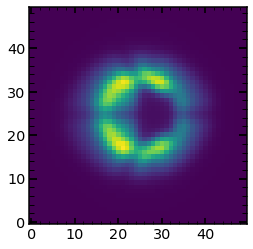

In [327]:
plt.imshow(test_image_center)

In [368]:
for i in range(10):
    if i==0:
        test=0
    else:
        print(test)

0
0
0
0
0
0
0
0
0


In [370]:
for ex_z in range(36):
    Tokovnin_proposal=np.zeros(36)        
    extra_Zernike_list=Tokovnin_proposal
    extra_Zernike_list[ex_z]=0.05+extra_Zernike_list[ex_z]

In [1187]:
initial_optPFS=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt/optPsf_cut_fiber_convolved_downsampled_7990546140817695788.npy')
final_optPFS=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt/optPsf_cut_fiber_convolved_downsampled_8087633993937835551.npy')

In [1188]:
obs=12403
arc='Ne'
date='Feb15'
eps=5

single_number=77
sci_image_center =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

In [1189]:
initial_optPFS_11=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/initial_optpsf_image'+str(obs)+str(single_number)+str(eps)+str(arc)+'.npy')
final_optPFS_11=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/final_optpsf_image'+str(obs)+str(single_number)+str(eps)+str(arc)+'.npy')

artifical_noise=np.zeros_like(sci_image_center)
artifical_noise=np.array(artifical_noise)
for i in range(len(artifical_noise)):
    for j in range(len(artifical_noise)):
        artifical_noise[i,j]=np.random.randn()*np.sqrt(var_image_center[i,j]) 

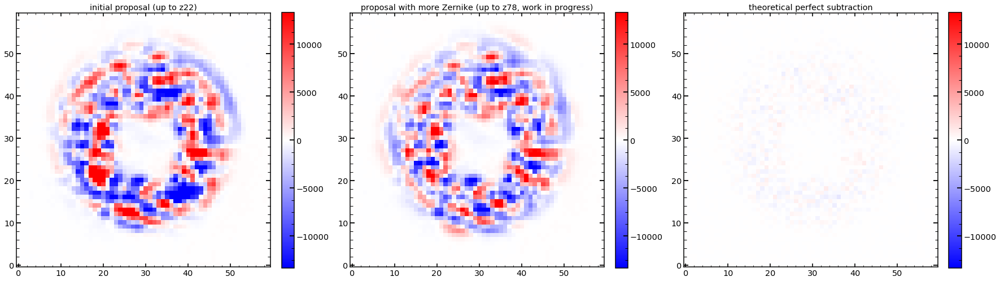

In [1190]:
plt.figure(figsize=(30,20))
plt.subplot(131)
plt.title('initial proposal (up to z22)')
plt.imshow(initial_optPFS_11-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(132)
plt.title('proposal with more Zernike (up to z78, work in progress)')
plt.imshow(final_optPFS_11-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(133)
plt.title('theoretical perfect subtraction')
plt.imshow(artifical_noise,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

## creating scripts

In [510]:
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_HgAr_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_direct_preDecemberrun_HgAr=pickle.load(f)
    
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_direct_preDecemberrun_Ne=pickle.load(f)
   

values=results_of_fit_many_direct_preDecemberrun_Ne['m4'].index.values


array([  5,   6,  11,  14,  15,  38,  41,  42,  47,  56,  59,  60,  65,
        69,  74,  77,  78,  83,  87,  92,  95,  96, 101, 104, 105, 110,
       119, 122, 123, 128, 132, 137, 140, 141])

In [536]:
obs_possibilites_Ne=np.array([12403,12397,12391,12385,12379,12373,12367,12361,12355,12355,12349,12343,12337,12331,12325,12319,12313,12307])
obs_possibilites_HgAr=np.array([11796,11790,11784,11778,11772,11766,11760,11754,11748,11748,11694,11700,11706,11712,11718,11724,11730,11736])
label=['m4','m35','m3','m25','m2','m15','m1','m05','0d','0','p05','p1','p15','p2','p25','p3','p35','p4','0p']

In [538]:
#Direct on home 
file.write("#!/bin/bash \n")
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/HighZernikeMar11.sh','w') 
file.write("\n")
file.write("#1. Observation (e.g., 8567) \n") 
file.write("#2. Threads \n") 
file.write("#3. Steps \n") 
file.write("\n")
for obs in [12403,12397,12391,12325,12319,12313]:
    labelInput=label[list(obs_possibilites_Ne).index(int(obs))]
    values=results_of_fit_many_direct_preDecemberrun_Ne[labelInput].index.values
    for single_spot in values:

        #file.write("#SBATCH --nodes=4 # node count \n")
        #file.write("#SBATCH --ntasks-per-node=40 \n") 
        #file.write("#SBATCH --time 13:59:59 \n")
        #file.write("#SBATCH --mail-type=begin  \n")
        #file.write("#SBATCH --mail-type=end   \n") 
        #file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 


        file.write("python /home/ncaplar/Code/Direct_and_Interpolation_Analysis_Extra_Zernike_Feb2019.py "+str(obs)+" "+str(single_spot)+" 6 5 Ne\n")


for obs in [11796,11790,11784,11718,11724,11730]:
    labelInput=label[list(obs_possibilites_HgAr).index(int(obs))]
    values=results_of_fit_many_direct_preDecemberrun_HgAr[labelInput].index.values
    for single_spot in values:

        #file.write("#SBATCH --nodes=4 # node count \n")
        #file.write("#SBATCH --ntasks-per-node=40 \n") 
        #file.write("#SBATCH --time 13:59:59 \n")
        #file.write("#SBATCH --mail-type=begin  \n")
        #file.write("#SBATCH --mail-type=end   \n") 
        #file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 


        file.write("python /home/ncaplar/Code/Direct_and_Interpolation_Analysis_Extra_Zernike_Feb2019.py "+str(obs)+" "+str(single_spot)+" 6 5 HgAr\n")
        

## Analysis of the semi-completed run on March 12

In [1331]:
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_HgAr_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_direct_preDecemberrun_HgAr=pickle.load(f)
    
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_direct_preDecemberrun_Ne=pickle.load(f)    

In [1332]:
Result_DirectAndInt_FinalResults='/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/'

list_of_allparameters_proposals=[]
for obs in [12403,12397,12391,12325,12319,12313]:
    labelInput=label[list(obs_possibilites_Ne).index(int(obs))]
    values_of_single_spot=results_of_fit_many_direct_preDecemberrun_Ne[labelInput].index.values
    results_of_fit_many_direct_preDecemberrun_Ne[labelInput].index.values

    allparameters_proposals=[]
    for single_spot in values_of_single_spot:
        try:
            allparameters_proposals.append(np.load(Result_DirectAndInt_FinalResults+'allparameters_proposal_after_iteration_'+str(obs)+str(single_spot)+'5'+'Ne.npy'))

        except:
            allparameters_proposals.append(np.zeros(98))
            
            
    list_of_allparameters_proposals.append(allparameters_proposals)

In [1333]:
    for single_spot in values_of_single_spot:
        print(single_spot)
        try:
            allparameters_proposals.append(np.load(Result_DirectAndInt_FinalResults+'allparameters_proposal_after_iteration_'+str(obs)+str(single_spot)+'5'+'Ne.npy'))
        except:
            allparameters_proposals.append(np.zeros(98))

In [1334]:
import copy
results_of_fit_many_direct_preDecemberrun_Ne_many_Zernike=copy.deepcopy(results_of_fit_many_direct_preDecemberrun_Ne)

In [1377]:
for label_input in ['m4','m35','m3','p3','p35','p4']:
    for z_i in range(12,22+56):
        results_of_fit_many_direct_preDecemberrun_Ne_many_Zernike[label_input]['z'+str(z_i)]=np.zeros(results_of_fit_many_direct_preDecemberrun_Ne_many_Zernike[label_input].values.shape[0])

In [1338]:
#iterate over different spots
list_of_single_number_array=[]
for label_input in ['m4','m35','m3','p3','p35','p4']:
    allparameters_proposals=list_of_allparameters_proposals[['m4','m35','m3','p3','p35','p4'].index(label_input)]
    results_of_fit_many_direct_preDecemberrun_Ne_many_Zernike[label_input]['z'+str(z_i)]=np.zeros(results_of_fit_many_direct_preDecemberrun_Ne_many_Zernike[label_input].values.shape[0])

    single_number_array=results_of_fit_many_direct_preDecemberrun_Ne_many_Zernike[label_input].index.values.astype(int)
    list_of_single_number_array.append(single_number_array)
    for single_number in single_number_array:
    # iteratate over Zernike components
        if len(allparameters_proposals)>0:
            for i in range(len(allparameters_proposals[0])-23):
                z_i=i+4
                if i<=18:
                    index_of_Zernike_in_allparameters_proposals=i
                else:
                    index_of_Zernike_in_allparameters_proposals=i+23
                results_of_fit_many_direct_preDecemberrun_Ne_many_Zernike[label_input].loc[single_number]['z'+str(z_i)]=allparameters_proposals[list(single_number_array).index(single_number)][index_of_Zernike_in_allparameters_proposals]

## PCA analysis of the wavefront

In [1363]:
PCA_analysis_m4=[]
index_values=results_of_fit_many_direct_preDecemberrun_Ne_many_Zernike['m4'].index.values
for single_number in index_values:
    PCA_analysis_single_component_m4=[]
    for i in range(4,22+57):
        Many_Zernike_res=results_of_fit_many_direct_preDecemberrun_Ne_many_Zernike['m4'].loc[single_number]['z'+str(i)]
        try:
            Few_Zernike_res=results_of_fit_many_direct_preDecemberrun_Ne['m4'].loc[single_number]['z'+str(i)]
        except:
            Few_Zernike_res=0
        print(Many_Zernike_res)
        print(Few_Zernike_res)
        PCA_analysis_single_component_m4.append(Many_Zernike_res-Few_Zernike_res)
    PCA_analysis_m4.append(PCA_analysis_single_component_m4)
PCA_analysis_m4=np.array(PCA_analysis_m4)

32.59881824048916
32.5953740122473
-0.1916039481758047
-0.193798477382587
-0.4188926103666849
-0.42254559984498596
0.7183198343408702
0.7277617039871376
0.9808535942229475
0.9750678801378168
0.10819643799919286
0.11319703565658215
-0.4188173359745598
-0.4256040486644197
0.21835930360447373
0.21963597990016487
-0.019993076248493374
0
-0.024565654242313478
0
-0.012987215367942553
0
-0.012206588595515351
0
0.008755349535168584
0
0.008022986265085961
0
-0.025500532943712732
0
0.00926014030332713
0
-0.003930502105310739
0
0.005133632468491449
0
-0.0008374304372128394
0
0.005291567788617572
0
0.006812275714723284
0
0.02688064177961883
0
0.05251356769411
0
-0.00409258050479722
0
-0.0021164210000156765
0
0.009362244732725903
0
-0.006345435831715567
0
0.016334704997745524
0
-0.0031918687794639813
0
-0.02382562277167525
0
0.005017514084008129
0
0.001284694006498948
0
-0.0006119030598871052
0
0.0046872771421730885
0
0.008614439608766558
0
0.011855934928272305
0
-0.007781479001693308
0
0.007841058

0.010723961629857332
0
-0.021142301603827303
0
-0.01562803163126249
0
0.01609146724298261
0
-0.006826670324387045
0
0.007853579311720385
0
-0.0067565670157037185
0
-0.03576684290850468
0
0.025378226804219646
0
0.008343364885434317
0
0.00030197158117055813
0
-0.026307473323056725
0
0.002182647768434726
0
-0.01355834432855172
0
-0.01437933864750039
0
-0.019223352276688734
0
0.012479361541530332
0
0.0006673495237738674
0
0.054218245517712566
0
0.013630160242298767
0
29.95202870520511
29.946695417915304
0.09897363958689595
0.09933985367097643
-0.7861026835019436
-0.7860331008253518
0.620596611423172
0.625379847897806
0.3231543824123069
0.3196817754952889
-0.08261311973346436
-0.08226366683268804
-0.36528636179123225
-0.3621249971507107
-0.10087348574258145
-0.09957723414660033
-0.0023857031100179113
0
-0.005782161633276225
0
-0.0067460572244584065
0
-0.002488593065372598
0
-0.0017254917408605058
0
-0.006176775155712188
0
0.008369790056299507
0
-0.00539350057947311
0
-0.0006639312635087887


0.011905222576188729
0
0.004539826650407478
0
0.005295045272425513
0
0.018024031599574563
0
0.0014002935493023735
0
-0.004657197978526735
0
0.01851721706228616
0
0.006729730391575848
0
-0.01525301908303114
0
-0.013116445554118982
0
-0.02041069442367335
0
0.005895017946495254
0
0.024248548400362377
0
0.01515766332636434
0
-0.013769094497932103
0
-0.0032476812818011728
0
-0.003913267086842508
0
-0.005025793688528111
0
0.010716192286737772
0
-0.008097639528945322
0
0.002643075765198273
0
0.002852956960762225
0
-0.017241956690321292
0
0.017112336918135754
0
0.011171778507230896
0
0.0038327204281543145
0
0.001963702856212432
0
-0.01287498940593743
0
0.017316441437212973
0
-0.00027983287925419965
0
0.00982659819228564
0
0.00881920541668379
0
-0.004523842111212447
0
0.02118819453940387
0
-0.00539801562716455
0
-0.00011984777950637608
0
0.009968804400966598
0
0.02042113311404614
0
-0.012945270141031476
0
-0.027400638808583698
0
0.006760587818400433
0
0.006166625086137162
0
-0.00192659130886803

0.004148441798695053
0
-0.018535087839331332
0
-0.001189381998615451
0
0.0033642721392961633
0
-0.0053629920476327
0
0.001203918958828563
0
-0.009265681017968522
0
0.026893241763219864
0
-0.0009594263375251813
0
0.002066366187410334
0
-0.0038367326920493903
0
0.002364772881211968
0
0.007862197915400305
0
0.0008768263638361779
0
-0.0019504070640176563
0
0.0008651802541376782
0
29.472571874375227
29.474212189773578
-0.21437222277029014
-0.18471528115758246
-1.0181257085218827
-1.016915439772873
1.0305868006457646
1.0290186083695254
-0.0019165453965448317
0.01865226975365544
-0.11182796544798497
-0.12025451987776363
-0.20783662300794867
-0.19877905858231498
0.006940702750055564
0.011196530793117061
0.02198058327007428
0
0.06719187242444907
0
-0.002232726910916023
0
0.0033943434042727114
0
-0.0029620628861747544
0
0.0012786679072273053
0
0.019301561131314964
0
-0.03547499901880882
0
-0.0005990733556937502
0
0.002855609919962779
0
0.008102978289531288
0
-0.009417721102293714
0
-0.0277354725

-0.00920014795950286
0
0.02145085652123191
0
-0.005328383559721048
0
-0.01824850979385142
0
0.006293450029262701
0
0.010251502233371467
0
0.00011846220951333176
0
-0.0011214791207216244
0
-0.004281020627036558
0
0.03887034641738429
0
-0.0015411102750686736
0
0.013071961032582416
0
-0.0020520208071723362
0
0.008475293982386185
0
0.023364499712968497
0
0.013445921009919705
0
0.0013519655756306997
0
-0.007962388520934314
0
0.021547717454667374
0
0.007153285268620141
0
-0.007275267209645894
0
-0.004573630873131515
0
-0.012455625758000782
0
0.013933104942515385
0
-0.049431929404897865
0
0.017642174805495927
0
0.004265231523314166
0
-0.009781831845425092
0
0.0012403760843379306
0
0.008616510671979494
0
-0.014999755342817203
0
-0.010284415755481197
0
0.001070021756398988
0
-0.05228825765088897
0
-0.002638529057191257
0
0.015774944422939266
0
0.002695408352013208
0
-0.006109651708545894
0
-0.0030335022938636925
0
0.013955168154614707
0
-0.0009096030413788653
0
0.01019528840079946
0
0.000896172

0.06191996058071689
0
-0.009093334011993498
0
0.026917802368821523
0
-0.018232568173465146
0
0.044858836371591146
0
0.01134337028274943
0
0.0697119038623032
0
0.007650116942894066
0
0.012500600685240129
0
0.0012700378698118795
0
-0.023219807651942988
0
-0.0059063355715830955
0
-0.038781908536509355
0
0.030298648629469217
0
0.015743000179479053
0
0.006413773787365243
0
-0.018910959570199615
0
-0.015038627340797906
0
0.005628623864269464
0
0.02163300307493812
0
-0.013827088193349603
0
0.006832081262890349
0
0.01821744820388032
0
0.019515296002084924
0
-0.005858271300918199
0
-0.0015612847347660549
0
0.01570323409906454
0
0.01401080587329171
0
0.020995193403022253
0
0.004142143413170016
0
-0.013977224577175915
0
0.02649887649091593
0
-0.007067739470867747
0
0.047145743249237274
0
-0.043154902399936385
0
0.0049427764200054335
0
-0.014853566875642186
0
-0.006049631560771257
0
0.007012363546639663
0
-0.008385734781293588
0
-0.008518995938968994
0
0.009503831162915376
0
-0.015876100396071104


([<matplotlib.axis.XTick at 0x257c7d51d0>,
 <a list of 6 Text xticklabel objects>)

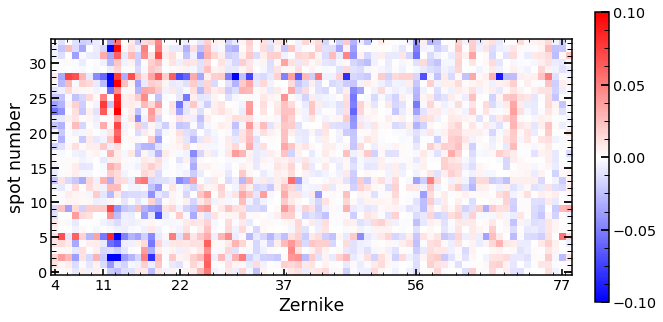

In [1364]:
plt.figure(figsize=(10,10))
plt.imshow(PCA_analysis_m4,origin='lower',cmap='bwr',vmax=0.1,vmin=-0.1)
cbar=plt.colorbar(fraction=0.026, pad=0.04)
cbar.set_ticks([-0.1,-0.05,0,0.05,0.1])
plt.xlabel('Zernike')
plt.ylabel('spot number')
plt.xticks([0, 7, 18, 33, 52,73], [4, 11, 22, 37, 56,77])

In [1365]:
fiber_values=finalNe_Feb2019.loc[list_of_single_number_array[1]]['fiber'].values.astype(int)
wavelength_values=finalNe_Feb2019.loc[list_of_single_number_array[1]]['wavelength'].values.astype(float)

In [1366]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# I think I probably do not want to scale!!!
#x = StandardScaler().fit_transform(PCA_analysis_m4)
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(PCA_analysis_m4)
filtered=pca.inverse_transform(principalComponents)

filtered

array([[ 0.00558958,  0.01233925,  0.00682094, ..., -0.00459307,
         0.003524  ,  0.00324319],
       [ 0.00489758,  0.00877139,  0.00966541, ..., -0.00519482,
         0.00208066,  0.00273237],
       [ 0.02443869,  0.03940701,  0.01421779, ..., -0.00203378,
         0.01174932,  0.00528762],
       ...,
       [-0.01152103, -0.02260599,  0.01266422, ..., -0.00896277,
        -0.00854251, -0.00036885],
       [-0.00835001, -0.02805329,  0.02601496, ..., -0.01050507,
        -0.01159317, -0.00171794],
       [-0.00894909, -0.01764615,  0.01214043, ..., -0.00836372,
        -0.00685862,  0.00012451]])

([<matplotlib.axis.XTick at 0x257ce4d2e8>,
 <a list of 6 Text xticklabel objects>)

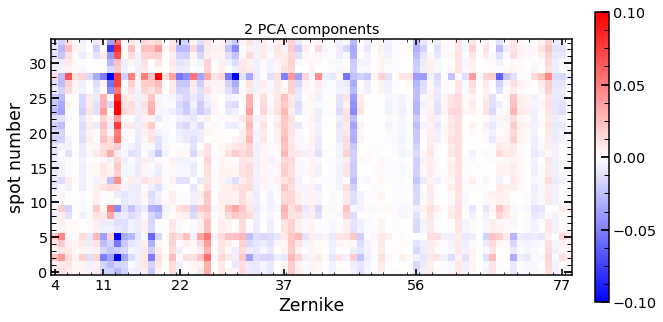

In [1367]:
plt.figure(figsize=(10,10))
plt.imshow(filtered,origin='lower',cmap='bwr',vmax=0.1,vmin=-0.1)
cbar=plt.colorbar(fraction=0.026, pad=0.04)
cbar.set_ticks([-0.1,-0.05,0,0.05,0.1])
plt.xlabel('Zernike')
plt.ylabel('spot number')
plt.title('2 PCA components')
plt.xticks([0, 7, 18, 33, 52,73], [4, 11, 22, 37, 56,77])

In [1372]:
filtered

array([[ 0.00558958,  0.01233925,  0.00682094, ..., -0.00459307,
         0.003524  ,  0.00324319],
       [ 0.00489758,  0.00877139,  0.00966541, ..., -0.00519482,
         0.00208066,  0.00273237],
       [ 0.02443869,  0.03940701,  0.01421779, ..., -0.00203378,
         0.01174932,  0.00528762],
       ...,
       [-0.01152103, -0.02260599,  0.01266422, ..., -0.00896277,
        -0.00854251, -0.00036885],
       [-0.00835001, -0.02805329,  0.02601496, ..., -0.01050507,
        -0.01159317, -0.00171794],
       [-0.00894909, -0.01764615,  0.01214043, ..., -0.00836372,
        -0.00685862,  0.00012451]])

In [1368]:
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

finalDf=pd.concat([principalDf,pd.Series(fiber_values),pd.Series(wavelength_values)],axis=1)
finalDf.columns=['principal component 1', 'principal component 2','fiber','wavelength']
pca.explained_variance_ratio_

array([0.33224597, 0.20993182])

Text(0,0.5,'explained_variance_ratio_')

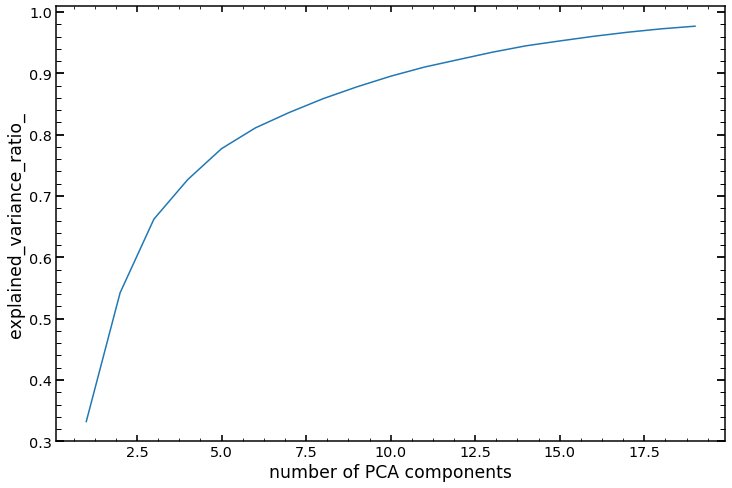

In [1369]:
how_much_explained=[]
for i in range(1,20):
    pca = PCA(n_components=i)
    principalComponents = pca.fit_transform(PCA_analysis_m4)
    principalDf = pd.DataFrame(data = principalComponents)
    how_much_explained.append([i,np.sum(pca.explained_variance_ratio_)])
    

how_much_explained=np.array(how_much_explained)
plt.figure(figsize = (12,8))
plt.plot(how_much_explained[:,0],how_much_explained[:,1])
plt.xlabel('number of PCA components')
plt.ylabel('explained_variance_ratio_')

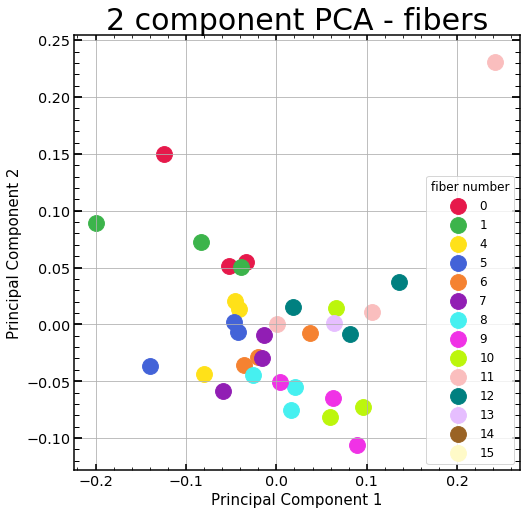

In [1370]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA - fibers', fontsize = 30)
targets = np.unique(finalDf['fiber'].values)
colors = '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000'
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['fiber'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 250)
ax.legend(targets,title='fiber number')
ax.grid()

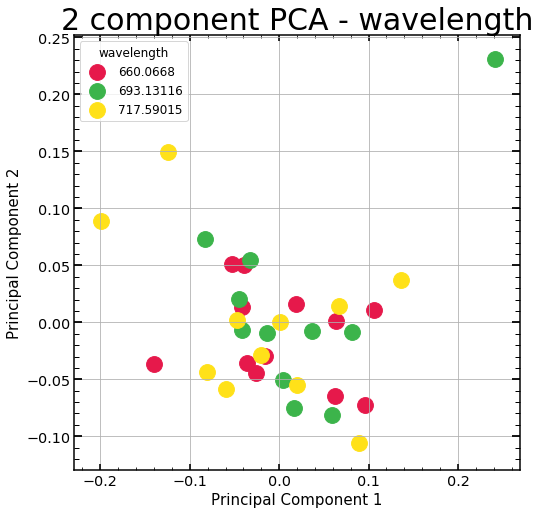

In [1371]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA - wavelength', fontsize = 30)
targets = np.unique(finalDf['wavelength'].values)
colors = '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000'
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['wavelength'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 250)
ax.legend(targets,title='wavelength')
ax.grid()

## Test - how much does only appling first few componets help

In [135]:
obs=12403
arc='Ne'
date='Feb15'

single_number=77
sci_image_center =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

NameError: name 'STAMPS_FOLDER' is not defined

In [1343]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=11)   
res=model(allparameters_proposal_center)
test_image_center=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 406746.4304971149
minimal chi2 reduced is: 225.964561730156
None
zmax: 11


In [1344]:
np.mean((test_image_center-sci_image_center)**2/var_image_center)

226.01542945169533

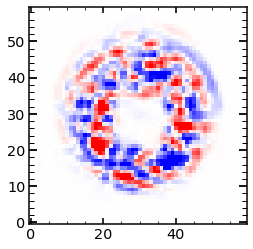

In [1345]:
plt.imshow(test_image_center-sci_image_center,cmap='bwr',vmax=np.max(sci_image_center)/20,vmin=-np.max(sci_image_center)/20)

In [1203]:
PCA_analysis_m4.shape

(34, 74)

In [1204]:
pca_full_correction=PCA_analysis_m4[list(index_values).index(77)]
pca_full_correction

array([-0.00499118, -0.00132264,  0.00163798,  0.00721872, -0.00980589,
       -0.00874893,  0.00039938, -0.00299479,  0.03176189,  0.02213258,
       -0.00296677, -0.0029622 , -0.0060762 ,  0.01094763,  0.01943831,
        0.01162774, -0.00269481,  0.0011783 , -0.00353289, -0.03217341,
        0.00495661,  0.00481519,  0.00223845, -0.0020269 , -0.00424576,
        0.0013031 ,  0.0056943 ,  0.00239538, -0.00822517,  0.00170819,
       -0.00182943,  0.01049792,  0.00762158,  0.01632459, -0.00106041,
        0.01409699, -0.00795862,  0.00077777,  0.00883453,  0.00052406,
       -0.00732967,  0.00332498, -0.01206961, -0.00290532, -0.00986092,
       -0.00877232,  0.00620001, -0.00593132,  0.00660991, -0.00720238,
        0.00276281, -0.00362277,  0.00577042,  0.00002888,  0.00033645,
        0.01872095,  0.01483826,  0.01385149, -0.00658845, -0.01253906,
        0.00437504,  0.00230257, -0.00008742,  0.00009292, -0.01547291,
       -0.00008798,  0.00355158,  0.00347978, -0.00335575, -0.00

In [1349]:
allparameters_proposal_center_many_just_load=np.load(Result_DirectAndInt_FinalResults+'allparameters_proposal_after_iteration_'+str(12403)+str(77)+'5'+'Ne.npy')

In [1352]:

allparameters_proposal_center_many=results_of_fit_many_direct_preDecemberrun_Ne_many_Zernike['m4'].loc[single_number].values
allparameters_proposal_center_many=np.concatenate((allparameters_proposal_center_many[0:8],allparameters_proposal_center_many[33:44],allparameters_proposal_center_many[8:31],allparameters_proposal_center_many[44:]))


In [1354]:
allparameters_proposal_center_many_just_load[0:98]-allparameters_proposal_center_many[0:98]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [1355]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22)   
res=model(allparameters_proposal_center_many_just_load)
test_image_center_many_load=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 406746.4304971149
minimal chi2 reduced is: 225.964561730156
None
zmax: 22


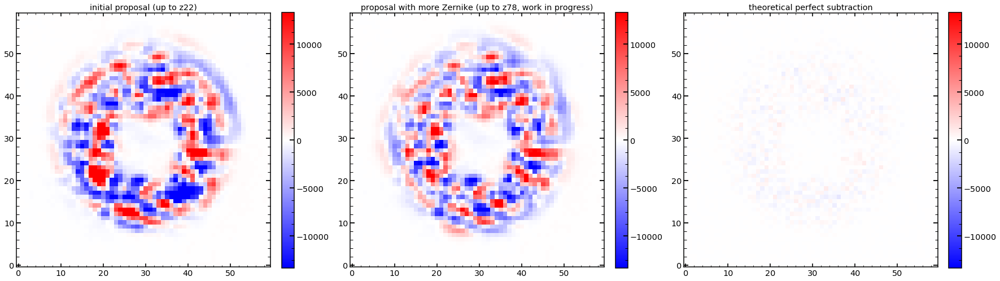

In [1356]:
plt.figure(figsize=(30,20))
plt.subplot(131)
plt.title('initial proposal (up to z22)')
plt.imshow(initial_optPFS_11-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(132)
plt.title('proposal with more Zernike (up to z78, work in progress)')
plt.imshow(test_image_center_many_load-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(133)
plt.title('theoretical perfect subtraction')
plt.imshow(artifical_noise,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

In [1357]:
np.mean((test_image_center_many_load-sci_image_center)**2/var_image_center)

183.23170864742985

In [1358]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22)   
res=model(allparameters_proposal_center_many)
test_image_center_many_many=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 406746.4304971149
minimal chi2 reduced is: 225.964561730156
None
zmax: 22


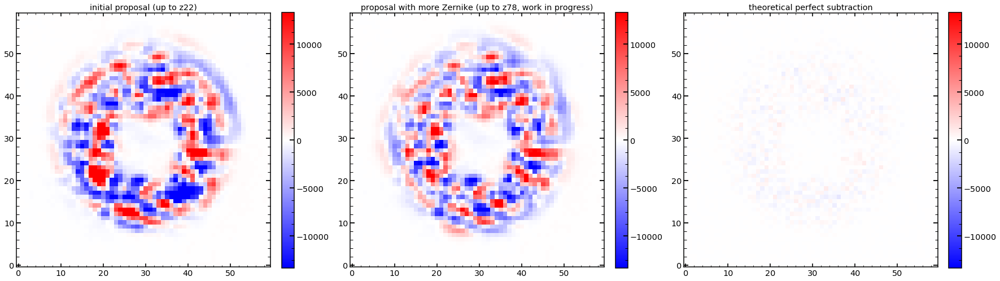

In [1359]:
plt.figure(figsize=(30,20))
plt.subplot(131)
plt.title('initial proposal (up to z22)')
plt.imshow(initial_optPFS_11-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(132)
plt.title('proposal with more Zernike (up to z78, work in progress)')
plt.imshow(test_image_center_many_many-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(133)
plt.title('theoretical perfect subtraction')
plt.imshow(artifical_noise,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

In [1360]:
np.mean((test_image_center_many_many-sci_image_center)**2/var_image_center)

183.23170864742985

In [1387]:
allparameters_proposal_center_PCA_full=np.concatenate((allparameters_proposal_center[0:8]+PCA_analysis_m4[15][0:8],PCA_analysis_m4[15][8:19],allparameters_proposal_center[8:31],PCA_analysis_m4[15][19:]))


In [1389]:
obs=12403
arc='Ne'
date='Feb15'

single_number=77
sci_image_center =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22)   
res=model(allparameters_proposal_center_PCA_full)
test_image_center_many_PCA_full=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 406746.4304971149
minimal chi2 reduced is: 225.964561730156
None
zmax: 22


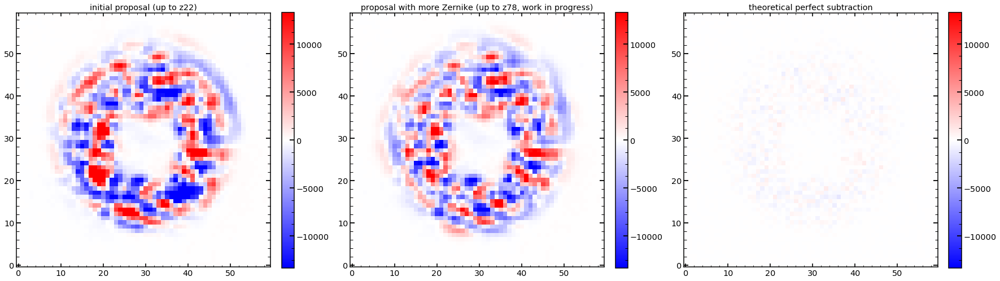

In [1390]:
plt.figure(figsize=(30,20))
plt.subplot(131)
plt.title('initial proposal (up to z22)')
plt.imshow(initial_optPFS_11-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(132)
plt.title('proposal with more Zernike (up to z78, work in progress)')
plt.imshow(test_image_center_many_PCA_full-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(133)
plt.title('theoretical perfect subtraction')
plt.imshow(artifical_noise,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

In [1391]:
np.mean((test_image_center_many_PCA_full-sci_image_center)**2/var_image_center)

183.23170864742985

In [1397]:
PCA_filtered_2=filtered[15]

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 406746.4304971149
minimal chi2 reduced is: 225.964561730156
None
zmax: 22


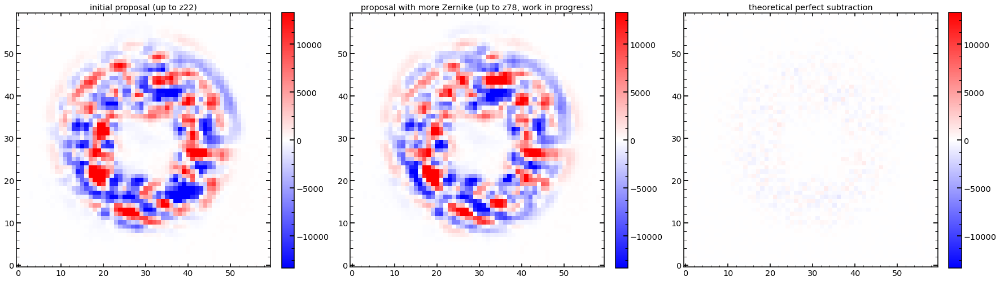

In [1399]:
allparameters_proposal_center_PCA_2=np.concatenate((allparameters_proposal_center[0:8]+PCA_filtered_2[0:8],PCA_analysis_m4[15][8:19],allparameters_proposal_center[8:31],PCA_filtered_2[19:]))


single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22)   
res=model(allparameters_proposal_center_PCA_2)
test_image_center_many_PCA_2=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

plt.figure(figsize=(30,20))
plt.subplot(131)
plt.title('initial proposal (up to z22)')
plt.imshow(initial_optPFS_11-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(132)
plt.title('proposal with more Zernike (up to z78, work in progress)')
plt.imshow(test_image_center_many_PCA_2-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(133)
plt.title('theoretical perfect subtraction')
plt.imshow(artifical_noise,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

In [1400]:
np.mean((test_image_center_many_PCA_2-sci_image_center)**2/var_image_center)

215.23456407690014

In [1431]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()
minchain,like_min=single_analysis.create_likelihood()
allparameters_proposal_center=minchain
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22)   

res_pca=[]
for n_components in tqdm(list(range(2,40,2))):

    pca = PCA(n_components=n_components)
    principalComponents = pca.fit_transform(PCA_analysis_m4)
    filtered=pca.inverse_transform(principalComponents)

    PCA_filtered_2=filtered[15]
    allparameters_proposal_center_PCA_2=np.concatenate((allparameters_proposal_center[0:8]+PCA_filtered_2[0:8],PCA_analysis_m4[15][8:19],allparameters_proposal_center[8:31],PCA_filtered_2[19:]))

    res=model(allparameters_proposal_center_PCA_2)
    test_image_center_many_PCA_2=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
    pupililluminated_center=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')

    res_pca.append(np.mean((test_image_center_many_PCA_2-sci_image_center)**2/var_image_center))

  0%|          | 0/19 [00:00<?, ?it/s]

(number of walkers, number of steps, number of parameters): (186, 40, 31)
minimal likelihood is: 406746.4304971149
minimal chi2 reduced is: 225.964561730156
None
zmax: 22


100%|██████████| 19/19 [04:00<00:00, 12.66s/it]


In [1432]:
expained_var=(225.964561730156-np.array(res_pca))/(225.964561730156-183.23170864742985)

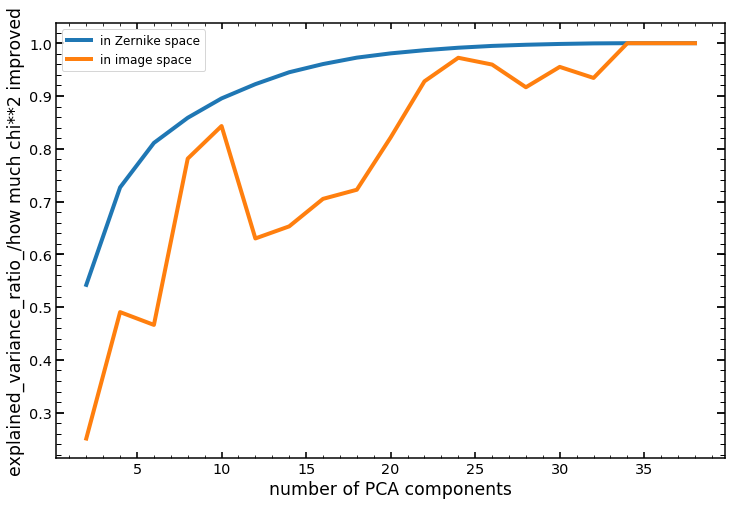

In [1433]:
how_much_explained=[]
for i in range(2,40,2):
    pca = PCA(n_components=i)
    principalComponents = pca.fit_transform(PCA_analysis_m4)
    principalDf = pd.DataFrame(data = principalComponents)
    how_much_explained.append([i,np.sum(pca.explained_variance_ratio_)])
    

how_much_explained=np.array(how_much_explained)
plt.figure(figsize = (12,8))
plt.plot(how_much_explained[:,0],how_much_explained[:,1],label='in Zernike space',lw=4)
plt.plot(list(range(2,40,2)),expained_var,label='in image space',lw=4)
plt.xlabel('number of PCA components')
plt.ylabel('explained_variance_ratio_/how much chi**2 improved')
plt.legend()

In [1429]:
list(range(2,40,2))

[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38]

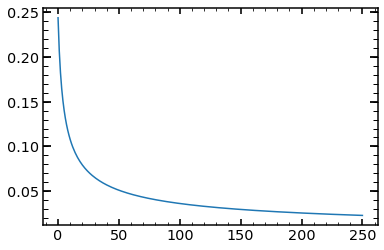

In [1424]:
list_of_delta_z=[]
for z_par in range(3,22+232):
    list_of_delta_z.append(0.5/((np.sqrt(8.*(z_par+1.)-6.)-1.)/2.))
    
plt.plot(list_of_delta_z)

In [1423]:
len(list_of_delta_z)

1079

# More, more!!

In [293]:
initial_optPFS=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/initial_optpsf_image12403775Ne.npy')
final_optPFS=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/final_optpsf_image12403775Ne.npy')

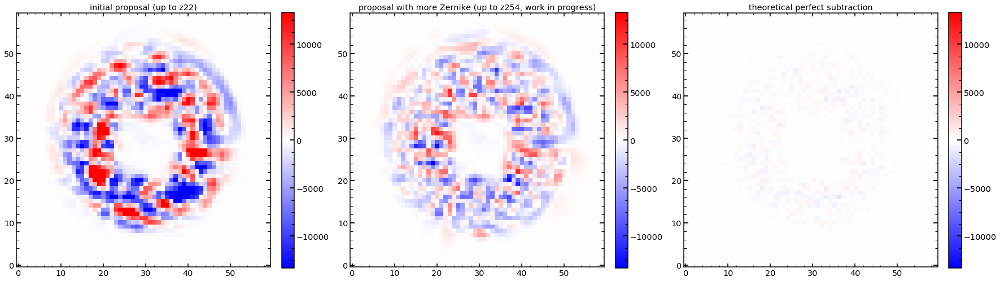

In [1438]:
plt.figure(figsize=(30,20))
plt.subplot(131)
plt.title('initial proposal (up to z22)')
plt.imshow(initial_optPFS-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(132)
plt.title('proposal with more Zernike (up to z254, work in progress)')
plt.imshow(final_optPFS-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(133)
plt.title('theoretical perfect subtraction')
plt.imshow(artifical_noise,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

# Implementing 0.21b version

In [46]:
def model_return(allparameters_proposal):
    return model(allparameters_proposal,return_Image=True)

obs=12403
arc='Ne'
date='Feb15'

single_number=77
sci_image_center =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

In [881]:
artifical_noise=np.zeros_like(sci_image_center)
artifical_noise=np.array(artifical_noise)
for i in range(len(artifical_noise)):
    for j in range(len(artifical_noise)):
        artifical_noise[i,j]=np.random.randn()*np.sqrt(var_image_center[i,j]) 

In [882]:
local_image_0_after_artifical=artifical_noise+sci_image_center

M0=((local_image_0_after_artifical[mask])/np.sum(local_image_0_after_artifical[mask])).ravel()

# normalized with STD and masked model image before this iteration
#M0=((image_0[mask]*STD[mask])/np.sum(image_0[mask]*STD[mask])).ravel()

# normalized and masked science image
I=((sci_image_center[mask])/np.sum(sci_image_center[mask])).ravel()
#I=((sci_image[mask]*STD[mask])/np.sum(sci_image[mask]*STD[mask])).ravel()
print('I[0]'+str(I[0]))
print('M0[0]'+str(M0[0]))
#M0_STD=M0/STD
print('I-M0 after iteration '+str(iteration_number)+': '+str(np.sum(np.abs(I-M0))))  

IndexError: boolean index did not match indexed array along dimension 0; dimension is 50 but corresponding boolean dimension is 60

In [883]:
image_0_0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/image_0_0.npy')
initial_model_result_0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/initial_model_result_0.npy')
initial_input_parameters_0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/initial_input_parameters_0.npy')

out_ln_0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/out_ln_0.npy')
out_images_0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/out_images_0.npy')
out_parameters_0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/out_parameters_0.npy')

array_of_delta_z_0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/array_of_delta_z_0.npy')
single_wavefront_parameter_list_0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/single_wavefront_parameter_list_0.npy')




In [363]:
def model_lin(delta_z):
    modification=np.zeros((image_0_0.shape[0],image_0_0.shape[1]))
    #modification=(out_images[0]-image_0_0)*delta_z[0]+(out_images[1]-image_0_0)*delta_z[1]+(out_images[2]-image_0_0)*delta_z[2]+(out_images[3]-image_0_0)*delta_z[3]+\
    #(out_images[4]-image_0_0)*delta_z[4]+(out_images[5]-image_0_0)*delta_z[5]+(out_images[6]-image_0_0)*delta_z[6]+(out_images[7]-image_0_0)*delta_z[7]
    for i in range(len(out_images)):
        modification+=(out_images[i]-image_0_0)*delta_z[i]
    
    
    return np.mean(((modification+image_0_0)-sci_image_center)**2/var_image_center)

model_lin(np.zeros(254)+0.0)

226.01542945169612

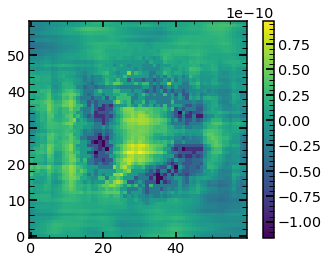

In [373]:
plt.imshow(local_image_0_before-image_0_0)
plt.colorbar()

In [368]:
local_model_result_before,local_image_0_before,local_input_parameters_before=model(initial_input_parameters_0,return_Image=True)

In [374]:
np.mean((local_image_0_before-sci_image_center)**2/var_image_center)

226.01542945169533

In [375]:
M0=((local_image_0_before[mask])/np.sum(local_image_0_before[mask])).ravel()

# normalized with STD and masked model image before this iteration
#M0=((image_0[mask]*STD[mask])/np.sum(image_0[mask]*STD[mask])).ravel()

# normalized and masked science image
I=((sci_image_center[mask])/np.sum(sci_image_center[mask])).ravel()
#I=((sci_image[mask]*STD[mask])/np.sum(sci_image[mask]*STD[mask])).ravel()
print('I[0]'+str(I[0]))
print('M0[0]'+str(M0[0]))
#M0_STD=M0/STD
print('I-M0 before iteration '+str(iteration_number)+': '+str(np.sum(np.abs(I-M0))))  

I[0]0.00020645966
M0[0]0.00016824919858361397
I-M0 before iteration test: 0.04666808996736328


In [441]:
mask=sci_image_center>(np.max(sci_image_center)*0.1)
def model_lin(delta_z):
    modification=np.zeros((image_0_0.shape[0],image_0_0.shape[1]))
    #modification=(out_images[0]-image_0_0)*delta_z[0]+(out_images[1]-image_0_0)*delta_z[1]+(out_images[2]-image_0_0)*delta_z[2]+(out_images[3]-image_0_0)*delta_z[3]+\
    #(out_images[4]-image_0_0)*delta_z[4]+(out_images[5]-image_0_0)*delta_z[5]+(out_images[6]-image_0_0)*delta_z[6]+(out_images[7]-image_0_0)*delta_z[7]
    for i in range(len(delta_z)):
        modification+=(out_images_0[i]-image_0_0)*delta_z[i]
    
    modified_image=(modification+image_0_0)
    return np.mean((modified_image-sci_image_center)**2/var_image_center)

model_lin(np.zeros(len(out_images_1))+0.00)

226.01542945169612

In [442]:
from scipy.optimize import minimize
res = minimize(model_lin, np.zeros(len(out_images_0)), method='Powell', tol=1e-3)

In [443]:
res.fun

57.33691928066837

In [444]:
from scipy.optimize import minimize
res = minimize(model_lin, np.zeros(len(out_images_0)), method='Powell', tol=1e-3)
print(res.fun)
from scipy.optimize import minimize
res = minimize(model_lin, np.zeros(len(out_images_0)), method='CG', tol=1e-3)
print(res.fun)
from scipy.optimize import minimize
res = minimize(model_lin, np.zeros(len(out_images_0)), method='BFGS', tol=1e-3)
print(res.fun)

57.33691928066837
54.84076120363151
54.84073876052367


ValueError: Jacobian is required for Newton-CG method

In [445]:
from scipy.optimize import minimize
res = minimize(model_lin, np.zeros(len(out_images_0)), method='L-BFGS-B', tol=1e-3)
print(res.fun)
from scipy.optimize import minimize
res = minimize(model_lin, np.zeros(len(out_images_0)), method='TNC', tol=1e-3)
print(res.fun)
res = minimize(model_lin, np.zeros(len(out_images_0)), method='COBYLA', tol=1e-3)
print(res.fun)
res = minimize(model_lin, np.zeros(len(out_images_0)), method='SLSQP', tol=1e-3)
print(res.fun)
res = minimize(model_lin, np.zeros(len(out_images_0)), method='dogleg', tol=1e-3)
print(res.fun)
res = minimize(model_lin, np.zeros(len(out_images_0)), method='trust-ncg', tol=1e-3)
print(res.fun)

57.5615144915047


KeyboardInterrupt: 

In [392]:
up_to_z22_start=initial_input_parameters_0[:19]
from_z22_start=initial_input_parameters_0[42:]

In [393]:
suggested_wavefront_change=res.x*array_of_delta_z_0   
up_to_z22_suggested_wavefront_change=suggested_wavefront_change[0:19]     
from_z22_suggested_wavefront_change=suggested_wavefront_change[19:]  
suggested_input_parameters=np.concatenate((up_to_z22_start+up_to_z22_suggested_wavefront_change,initial_input_parameters1[19:42],from_z22_start+from_z22_suggested_wavefront_change))

In [394]:
local_model_result_after,local_image_0_after,local_input_parameters_after=model(suggested_input_parameters,return_Image=True)

In [395]:
np.mean((local_image_0_after-sci_image_center)**2/var_image_center)

70.41945366852869

In [396]:
M0=((local_image_0_after[mask])/np.sum(local_image_0_after[mask])).ravel()

# normalized with STD and masked model image before this iteration
#M0=((image_0[mask]*STD[mask])/np.sum(image_0[mask]*STD[mask])).ravel()

# normalized and masked science image
I=((sci_image_center[mask])/np.sum(sci_image_center[mask])).ravel()
#I=((sci_image[mask]*STD[mask])/np.sum(sci_image[mask]*STD[mask])).ravel()
print('I[0]'+str(I[0]))
print('M0[0]'+str(M0[0]))
#M0_STD=M0/STD
print('I-M0 after iteration '+str(iteration_number)+': '+str(np.sum(np.abs(I-M0))))  

I[0]0.00020645966
M0[0]0.00019533312403944108
I-M0 after iteration test: 0.023650041959515863


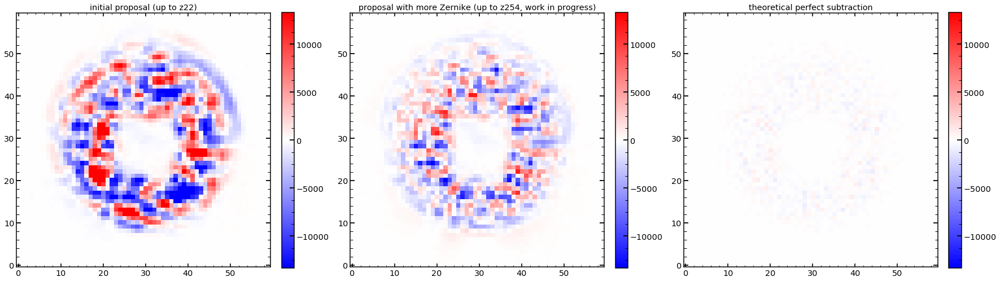

In [400]:
plt.figure(figsize=(30,20))
plt.subplot(131)
plt.title('initial proposal (up to z22)')
plt.imshow(initial_optPFS-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(132)
plt.title('proposal with more Zernike (up to z254, work in progress)')
plt.imshow(local_image_0_after-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(133)
plt.title('theoretical perfect subtraction')
plt.imshow(artifical_noise,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

In [404]:
initial_model_result_1=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/initial_model_result_1.npy')
image_0_1=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/image_0_1.npy')
initial_input_parameters_1=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/initial_input_parameters_1.npy')

out_ln_1=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/out_ln_1.npy')
out_images_1=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/out_images_1.npy')
out_parameters_1=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/out_parameters_1.npy')

array_of_delta_z_1=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/array_of_delta_z_1.npy')
single_wavefront_parameter_list_1=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Result_DirectAndInt_FinalResults/single_wavefront_parameter_list_1.npy')

In [405]:
def model_lin(delta_z):
    modification=np.zeros((image_0_1.shape[0],image_0_1.shape[1]))
    #modification=(out_images[0]-image_0_0)*delta_z[0]+(out_images[1]-image_0_0)*delta_z[1]+(out_images[2]-image_0_0)*delta_z[2]+(out_images[3]-image_0_0)*delta_z[3]+\
    #(out_images[4]-image_0_0)*delta_z[4]+(out_images[5]-image_0_0)*delta_z[5]+(out_images[6]-image_0_0)*delta_z[6]+(out_images[7]-image_0_0)*delta_z[7]
    for i in range(len(out_images)):
        modification+=(out_images[i]-image_0_1)*delta_z[i]
    
    
    return np.mean(((modification+image_0_1)-sci_image_center)**2/var_image_center)

model_lin(np.zeros(254)+0.0)

124.07267330996629

In [408]:
local_model_result_before,local_image_1_before,local_input_parameters_before=model(initial_input_parameters_1,return_Image=True)

In [409]:
np.mean((local_image_1_before-sci_image_center)**2/var_image_center)

124.07267330821462

In [410]:
M0=((local_image_1_before[mask])/np.sum(local_image_1_before[mask])).ravel()

# normalized with STD and masked model image before this iteration
#M0=((image_0[mask]*STD[mask])/np.sum(image_0[mask]*STD[mask])).ravel()

# normalized and masked science image
I=((sci_image_center[mask])/np.sum(sci_image_center[mask])).ravel()
#I=((sci_image[mask]*STD[mask])/np.sum(sci_image[mask]*STD[mask])).ravel()
print('I[0]'+str(I[0]))
print('M0[0]'+str(M0[0]))
#M0_STD=M0/STD
print('I-M0 before iteration '+str(iteration_number)+': '+str(np.sum(np.abs(I-M0))))  

I[0]0.00020645966
M0[0]0.00020142286682942398
I-M0 before iteration test: 0.026224815432928227


In [411]:
mask=sci_image_center>(np.max(sci_image_center)*0.1)
def model_lin(delta_z):
    modification=np.zeros((image_0_1.shape[0],image_0_1.shape[1]))
    #modification=(out_images[0]-image_0_0)*delta_z[0]+(out_images[1]-image_0_0)*delta_z[1]+(out_images[2]-image_0_0)*delta_z[2]+(out_images[3]-image_0_0)*delta_z[3]+\
    #(out_images[4]-image_0_0)*delta_z[4]+(out_images[5]-image_0_0)*delta_z[5]+(out_images[6]-image_0_0)*delta_z[6]+(out_images[7]-image_0_0)*delta_z[7]
    for i in range(len(delta_z)):
        modification+=(out_images_1[i]-image_0_1)*delta_z[i]
    
    modified_image=(modification+image_0_1)
    return np.mean((modified_image-sci_image_center)**2/var_image_center)

model_lin(np.zeros(len(out_images_1))+0.00)

124.07267330996629

In [412]:
from scipy.optimize import minimize
res = minimize(model_lin, np.zeros(len(out_images_1)), method='Powell', tol=1e-3)

In [413]:
res.fun

66.04394857464763

In [414]:
up_to_z22_start=initial_input_parameters_1[:19]
from_z22_start=initial_input_parameters_1[42:]

In [427]:
suggested_wavefront_change=res.x*array_of_delta_z_1   
up_to_z22_suggested_wavefront_change=suggested_wavefront_change[0:19]     
from_z22_suggested_wavefront_change=suggested_wavefront_change[19:]  
suggested_input_parameters=np.concatenate((up_to_z22_start+up_to_z22_suggested_wavefront_change,initial_input_parameters_1[19:42],from_z22_start+from_z22_suggested_wavefront_change))

In [428]:
local_model_result_after,local_image_1_after,local_input_parameters_after=model(suggested_input_parameters,return_Image=True)

In [429]:
np.mean((local_image_1_after-sci_image_center)**2/var_image_center)

112.07315913543458

In [430]:
M0=((local_image_1_after[mask])/np.sum(local_image_1_after[mask])).ravel()

# normalized with STD and masked model image before this iteration
#M0=((image_0[mask]*STD[mask])/np.sum(image_0[mask]*STD[mask])).ravel()

# normalized and masked science image
I=((sci_image_center[mask])/np.sum(sci_image_center[mask])).ravel()
#I=((sci_image[mask]*STD[mask])/np.sum(sci_image[mask]*STD[mask])).ravel()
print('I[0]'+str(I[0]))
print('M0[0]'+str(M0[0]))
#M0_STD=M0/STD
print('I-M0 after iteration '+str(iteration_number)+': '+str(np.sum(np.abs(I-M0))))  

I[0]0.00020645966
M0[0]0.0002201012457128742
I-M0 after iteration test: 0.030273558630106112


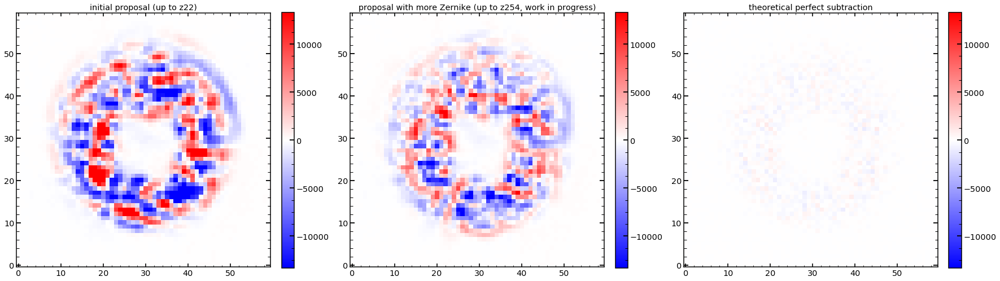

In [431]:
plt.figure(figsize=(30,20))
plt.subplot(131)
plt.title('initial proposal (up to z22)')
plt.imshow(initial_optPFS-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(132)
plt.title('proposal with more Zernike (up to z254, work in progress)')
plt.imshow(local_image_1_after-sci_image_center,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(133)
plt.title('theoretical perfect subtraction')
plt.imshow(artifical_noise,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image_center))/20,vmax=np.max(np.abs(sci_image_center))/20)
plt.colorbar(fraction=0.046, pad=0.04)

## Does increasing the number of Zernike matter?

In [879]:
local_input_parameters_after

array([   29.24162528,    -0.08097895,    -1.12407078,     0.65402194,
           0.07025286,     0.02494547,    -0.30067755,    -0.10322601,
           0.00218021,     0.03203941,    -0.01549326,     0.01177115,
          -0.00256303,    -0.00006772,     0.01439881,     0.01097987,
          -0.01408428,     0.0031317 ,    -0.0037752 ,     0.70288364,
           0.08361169,     0.02786167,    -0.11691889,     0.06407458,
          -0.01955531,     0.00216212,     1.01670648,     0.93969229,
           0.89470163,     0.0128126 ,    -0.09193684,     0.83325145,
           0.09847213,     0.38948551,     1.03718835,    -0.00981949,
       74573.99725443,     2.32160178,     0.00228143,     0.51760622,
           1.80721034,     0.9961091 ,    -0.01427055,    -0.02836904,
           0.01466184,     0.00481575,     0.00215645,     0.00795191,
          -0.00714881,     0.0047811 ,     0.02547518,     0.0069082 ,
          -0.00933395,    -0.0007226 ,    -0.00383381,    -0.00202756,
      

In [884]:
initial_input_parameters_0

array([   29.23631557,    -0.0574131 ,    -1.13132296,     0.65418762,
           0.05574254,     0.03070126,    -0.28328082,    -0.1016931 ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.70288364,
           0.08361169,     0.02786167,    -0.11691889,     0.06407458,
          -0.01955531,     0.00216212,     1.01670648,     0.93969229,
           0.89470163,     0.0128126 ,    -0.09193684,     0.83325145,
           0.09847213,     0.38948551,     1.03718835,    -0.00981949,
       74573.99725443,     2.32160178,     0.00228143,     0.51760622,
           1.80721034,     0.9961091 ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
           0.        ,     0.        ,     0.        ,     0.        ,
      

In [931]:
def model_return(allparameters_proposal):
    return model(allparameters_proposal,return_Image=True)

obs=12355
arc='Ne'
date='Feb15'

single_number=77
sci_image_center =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22)   
initial_input_parameters_0[0]=0.1
res_initial=model_return(initial_input_parameters_0)
image_initial=res_initial[1]

obs=12355
arc='Ne'
date='Feb15'

single_number=77
sci_image_center =np.load(STAMPS_FOLDER+'sci'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_center,var_image_center,dithering=1,save=1,zmax=22)   
local_input_parameters_after[0]=0.1
res_many=model_return(local_input_parameters_after)
image_many=res_many[1]

version of the code is: 0.21b
None
zmax: 22
version of the code is: 0.21b
None
zmax: 22


In [937]:
artifical_noise=np.zeros_like(image_initial)
artifical_noise=np.array(artifical_noise)
for i in range(len(artifical_noise)):
    for j in range(len(artifical_noise)):
        artifical_noise[i,j]=np.random.randn()*np.sqrt(var_image_center[i,j]) 

Text(0.5,1,'Residual')

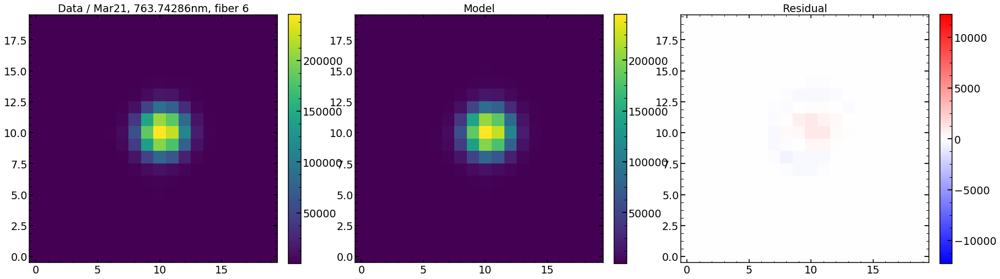

In [938]:
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.imshow(image_initial,vmax=np.max(image_initial))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Data / Mar21, '+str(finalArc.loc[int(single_number)]['wavelength'])+'nm, fiber '+str(finalArc.loc[int(single_number)]['fiber']))
plt.subplot(1,3,2)
plt.imshow(image_many,vmax=np.max(iamge_initial))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Model')
plt.subplot(1,3,3)
plt.imshow(image_initial-image_many,vmin=-np.max(image_initial)/20,vmax=np.max(image_initial)/20,cmap='bwr')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Residual')

In [939]:
np.mean((artifical_noise)**2/var_image_center)

1.020480108733005

In [940]:
np.mean((image_initial+artifical_noise-image_many)**2/var_image_center)

2.1098658970585804

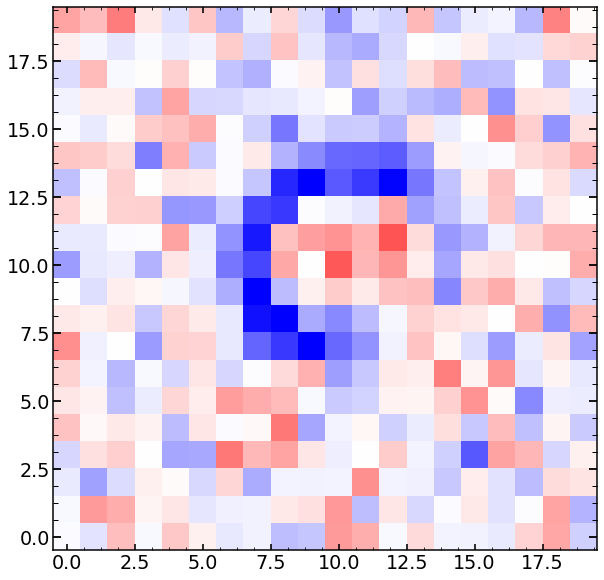

In [941]:
plt.imshow((image_initial+artifical_noise-image_many)/np.sqrt(var_image_center),vmax=5,vmin=-5,cmap='bwr')

# Aperature ?

In [594]:
obs='12403'

obs=12313
arc='Ne'
date='Feb15'

single_number=77
obs_p=12313
sci_image_center_p =np.load(STAMPS_FOLDER+'sci'+str(obs_p)+str(single_number)+str(arc)+'_Stacked.npy')
obs_m=12403
sci_image_center_m =np.load(STAMPS_FOLDER+'sci'+str(obs_m)+str(single_number)+str(arc)+'_Stacked.npy')
var_image_center =np.load(STAMPS_FOLDER+'var'+str(obs)+str(single_number)+str(arc)+'_Stacked.npy')

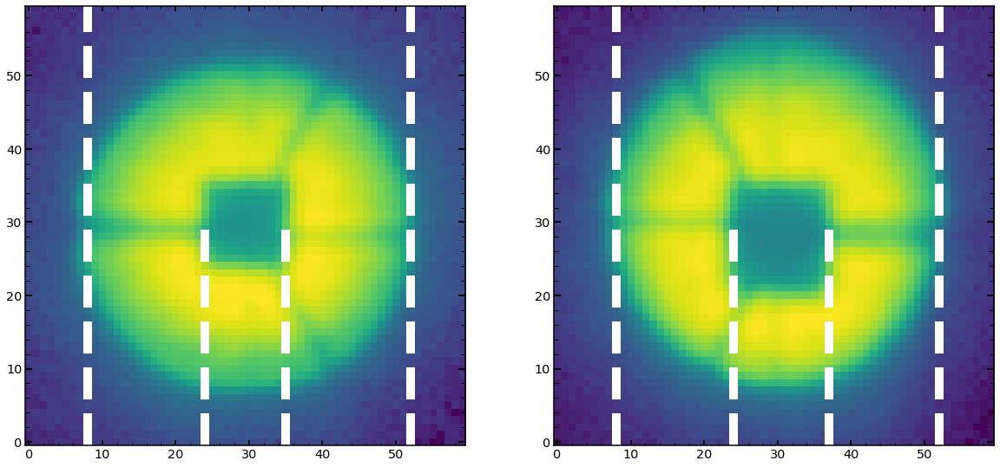

In [597]:
plt.figure(figsize=(20,12))
plt.subplot(121)
plt.imshow(sci_image_center_p,norm=LogNorm())
plt.axvline(8,lw=10,color='white',ls='--')
plt.axvline(52,lw=10,color='white',ls='--')
plt.axvline(24,lw=10,color='white',ls='--',ymax=0.5)
plt.axvline(35,lw=10,color='white',ls='--',ymax=0.5)

plt.subplot(122)
plt.imshow(sci_image_center_m,norm=LogNorm())
plt.axvline(8,lw=10,color='white',ls='--')
plt.axvline(52,lw=10,color='white',ls='--')
plt.axvline(24,lw=10,color='white',ls='--',ymax=0.5)
plt.axvline(37,lw=10,color='white',ls='--',ymax=0.5)

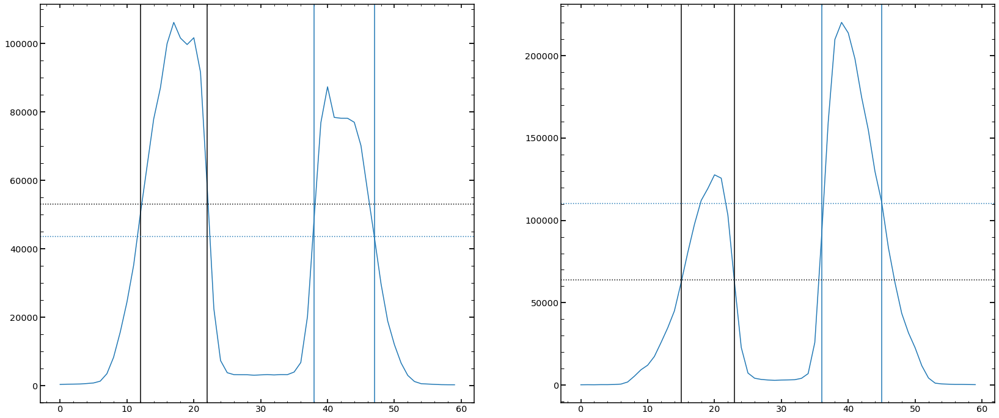

In [641]:
plt.figure(figsize=(28,12))
plt.subplot(121)
plt.plot(sci_image_center_m[30])
plt.axvline(12,color='black')
plt.axvline(47)
plt.axvline(22,color='black')
plt.axvline(38)
plt.axhline(np.max(sci_image_center_m[30][:30])/2,ls=':',color='black')
plt.axhline(np.max(sci_image_center_m[30][30:])/2,ls=':')

plt.subplot(122)
plt.plot(sci_image_center_p[31])
plt.axvline(15,color='black')
plt.axvline(45)
plt.axvline(23,color='black')
plt.axvline(36)
plt.axhline(np.max(sci_image_center_p[31][:30])/2,ls=':',color='black')
plt.axhline(np.max(sci_image_center_p[31][30:])/2,ls=':')

In [650]:
print('from 2d images')
print((11)/(52-8))
print((13)/(52-8))

from 2d images
0.25
0.29545454545454547


In [647]:
print('from 1d images')
print((38-22)/(47-12))
print((36-23)/(45-15))


from 1d images
0.45714285714285713
0.43333333333333335


In [648]:
print('from Zemax')
print(29/92)
print(31/85)

from Zemax
0.31521739130434784
0.36470588235294116


0.36470588235294116

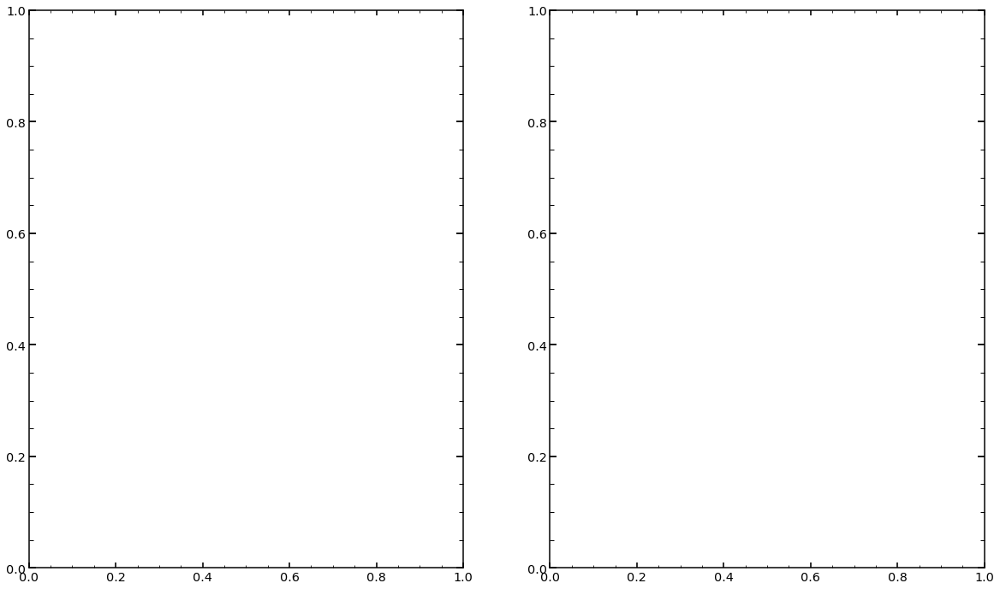

In [609]:

from PIL import Image, ImageDraw

MSize = Image.open('/Users/nevencaplar/Documents/PFS/Images/2019Mar12/MSize.jpg')
PSize = Image.open('/Users/nevencaplar/Documents/PFS/Images/2019Mar12/PSize.jpg')

plt.figure(figsize=(20,12))
plt.subplot(121)
MSize.show()

plt.subplot(122)
PSize.show()

# Improving the interpolation

In [448]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Feb150119/'

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_HgAr_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_direct_preDecemberrun_HgAr=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Feb1.pkl', 'rb') as f:
    results_of_fit_many_direct_preDecemberrun_Ne=pickle.load(f)

In [449]:
results_of_fit_many_direct_preDecemberrun_HgAr['m4']

,z4,z5,z6,z7,z8,z9,z10,z11,hscFrac,strutFrac,...,det_vert,slitHolder_frac_dx,grating_lines,scattering_slope,scattering_amplitude,pixel_effect,fiber_r,flux,chi2,chi2max
3,31.797921,-0.509037,-0.049706,0.466946,0.729054,0.091591,-0.297971,0.034351,0.728080,0.097176,...,0.997534,0.555894,39876.849221,2.594383,0.005938,0.350092,1.873627,0.993423,19.257630,2487.576172
6,31.723054,-1.138951,-0.073668,0.328986,0.616871,0.032358,-0.140387,0.197723,0.737465,0.084100,...,0.990008,0.588014,12412.612526,2.583399,0.001303,0.374526,1.801919,0.994453,54.061568,9211.587891
9,31.711684,-2.219130,-1.102708,-0.062002,0.567528,-0.157095,-0.259215,0.469771,0.739082,0.104101,...,1.022610,0.597562,119274.900209,2.447899,0.003975,0.533310,1.797431,1.002980,386.651715,53678.054688
11,32.410422,-2.552194,-1.719256,-0.201728,0.837850,-0.374289,-0.416653,0.618998,0.730593,0.119636,...,1.055707,0.595178,17777.442981,2.301335,0.007224,0.507459,1.810692,0.994472,22.891702,3100.395264
13,32.350331,-0.229458,-0.717914,0.744997,0.632940,0.046558,-0.369919,0.017722,0.706119,0.092502,...,1.001269,-0.586281,79313.484349,2.573222,0.007158,0.434123,1.808255,0.983751,138.880517,9032.425781
15,31.549785,-0.544743,-0.660127,0.660374,0.530073,0.047141,-0.354339,0.085137,0.730225,0.091431,...,0.976941,0.518366,95824.722812,2.603244,0.009182,0.350616,1.798489,0.990725,19.730490,2271.677490
21,32.245330,-2.339686,-1.274920,0.016523,0.302951,-0.102134,-0.261228,0.224804,0.709339,0.100822,...,1.023570,0.533933,41641.090181,2.723115,0.009735,0.358488,1.836721,0.991837,395.169131,50148.847656
23,33.808113,-2.656433,-1.775318,-0.133642,0.515473,-0.263070,-0.437049,0.315566,0.670938,0.109172,...,1.069677,0.555349,23724.640100,2.292555,0.006671,0.504286,1.815482,0.998377,20.364492,3061.490479
54,31.367686,-0.709658,-0.400545,0.469510,0.169329,-0.041663,-0.197647,-0.298547,0.654334,0.070016,...,1.046013,-0.458531,35867.965402,2.076905,0.000652,0.457097,1.866085,0.992727,79.188193,10362.395508
57,30.989554,-1.363401,-1.515803,-0.014450,0.265990,-0.072006,-0.273174,-0.009564,0.701225,0.095957,...,1.052059,0.295119,50809.297240,2.817905,0.012744,0.353040,1.882881,0.995145,318.715143,58703.281250


In [455]:
columns11

['z4',
 'z5',
 'z6',
 'z7',
 'z8',
 'z9',
 'z10',
 'z11',
 'hscFrac',
 'strutFrac',
 'dxFocal',
 'dyFocal',
 'slitFrac',
 'slitFrac_dy',
 'radiometricEffect',
 'radiometricExponent',
 'x_ilum',
 'y_ilum',
 'x_fiber',
 'y_fiber',
 'effective_radius_illumination',
 'frd_sigma',
 'frd_lorentz_factor',
 'det_vert',
 'slitHolder_frac_dx',
 'grating_lines',
 'scattering_slope',
 'scattering_amplitude',
 'pixel_effect',
 'fiber_r',
 'flux']

In [454]:
columns11.index('radiometricEffect')

14

In [456]:
columns11.index('radiometricExponent')

15

In [450]:
single_analysis=Zernike_Analysis(date,obs,single_number,eps,arc)
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains()

In [470]:
res=[]
for i in range(len(chain0_Emcee3)):
    res.append(np.transpose(np.array([chain0_Emcee3[i][:,14],chain0_Emcee3[i][:,15],likechain0_Emcee3[i]])))

In [471]:
res

[array([[      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670648, -406837.99321426],
        [      0.00216212,       1.01670